<a id='exec-sum'></a>
## EXECUTIVE SUMMARY

### *Q Lambda Method*:

|Rewards   |   |Parameters | 
:---        |    :----:   |  :----  |
| Crashing wall: -5 , each_step : -1|  |lambda: 1, eps: 0.1, gamma: 0.9, alpha:0.1, iteration: 20000| 
| Crashing wall: -5 , each_step : -1 | |lambda: 0.95, eps: 0.1, gamma: 0.9, alpha:0.1, iteration: 15000|
| Crashing wall: -5 , each_step : -1 | |lambda: 0, eps: 0.1, gamma: 0.9, alpha:0.1, iteration: 15000|
| Crashing wall: -5 , each_step : -1 ||lambda: 1, eps: dynamic, gamma: 0.9, alpha:0.1, iteration: 15000|
| Crashing wall: -5 , each_step : -1 ||lambda: 1, eps: dynamic, gamma: 0.7, alpha:0.4, iteration: 15000|
| Crashing wall: -5 , each_step : -1 ||lambda: 1, eps: dynamic, gamma: 0.8, alpha:0.2, iteration: 15000|

#### *Results*:

Under the same gamma,epsilon and alpha parameters, decreasing lambda led to moving more steps from initial position to terminal position compare to running the code with higher lambda.

Function parameters set to gamma is 0.9, alpha = 0.1, decreasing epsilon value from 0.1 to 0.05 when number of iteration increases could not affect converged characterictic of model ( After 8000 iterations, agent takes more accurent actions.) On the other hand, increasing epsilon from 0.05 to 0.1 when number of iteration increases significantly impacts to agent' decisions. Model was converged after 2000 iterations, furthermore, desirable results can be obtained faster. 

Effect of gamma-alpha pairs was observed under the dynamic epsilon approach, Not find a valuable differences on results.

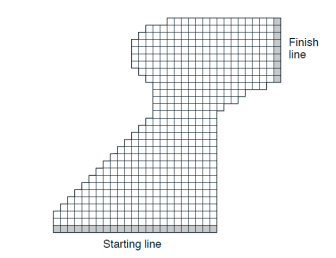

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
course = np.array([
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1]
  ], dtype=np.int32)

In [3]:
states=[]
for i in range(len(course)):
    for j in range(len(course[1])):
        for vu in range(5):
            for vr in range(5):
                states.append((i,j,vu,vr))

In [4]:
def is_terminal(state):
    return course[state[0],state[1]]==3

In [5]:
def is_wall(state):
    return course[state[0],state[1]]==1

In [6]:
def is_start(state):
    return course[state[0],state[1]]==2

In [7]:
def random_initial_state():
    x=np.random.choice(np.where(course==2)[0])
    y=np.random.choice(np.where(course==2)[1])
    return((x,y,0,0))

In [8]:
ACTION_SPACE = ('DZ', 'DD', 'DU', 'UZ', 'UD', 'UU','ZZ','ZD', 'ZU') 

# upward velocity _ rightward velocity --->
# D --> Decrease velocity, Z --> not change velocity, U --> increase velocity
# Example 'DD' means that upward velocity is -1 & right velocity is -1.

In [9]:
actions_sub = []
for i in range(len(course)):
    for j in range(len(course[1])):
        for vu in range(5):
            for vr in range(5):
                if is_wall((i,j,vu,vr)) == True:
                    continue
                else:
                    for k in ACTION_SPACE:
                        if (k == 'ZZ') & (vu==0) & (vr==0):
                            continue
                        elif (k == 'DZ') & ((vu==0) | ((vu==1) & (vr==0))) :
                            continue
                        elif (k == 'DD') & (((vu==0) | (vr==0)) | ((vu==1) & (vr==1))):
                            continue
                        elif (k == 'DU') & ((vu==0) | (vr==4)):
                            continue
                        elif (k == 'UZ') & (vu==4):
                            continue
                        elif (k == 'UD') & ((vu==4) | (vr==0)) :
                            continue
                        elif (k == 'UU') & ((vu==4) | (vr==4)) :
                            continue
                        elif (k == 'ZD') & ((vr==0) | ((vr==1) & (vu==0))) :
                            continue
                        elif (k == 'ZU') & (vr==4):
                            continue
                        else:
                            state = (i,j,vu,vr)
                            actions_sub.append((state,k))
actions = pd.DataFrame(actions_sub)
actions.rename(columns={
    0:'states',
    1: 'action'
},inplace=True)

In [10]:
def get_rewards(state):
    if is_wall(state) == True:
        return -5
    else:
        return -1

In [11]:
def get_next_state(s, a):
    # this answers: where would I end up if I perform action 'a' in state 's'?
    i, j, v_up, v_right = s[0], s[1], s[2], s[3]
    # if this action moves you somewhere else, then it will be in this dictionary
    if is_wall(s) == False:
        if a in np.array(actions[actions.states == (i,j,v_up,v_right)].action ) :
            if  (a == 'DD') :
                v_up -= 1
                v_right -= 1  
                i -= v_up
                j += v_right
                if i<0:
                    i=0
                if j>= course.shape[1]:
                    j = course.shape[1]-1

            elif (a == 'DZ') :
                v_up -= 1
                v_right -= 0
                i -= v_up
                j += v_right
                if i<0:
                    i=0
                if j>= course.shape[1]:
                    j = course.shape[1]-1

            elif (a == 'DU') :
                v_up -= 1
                v_right += 1
                i -= v_up
                j += v_right
                if i<0:
                    i=0
                if j>= course.shape[1]:
                    j = course.shape[1]-1

            elif  (a == 'ZD') :
                v_up -= 0
                v_right -= 1 
                i -= v_up
                j += v_right
                if i<0:
                    i=0
                if j>=course.shape[1]:
                    j = course.shape[1]-1

            elif  (a == 'ZZ') :
                v_up -= 0
                v_right -= 0
                i -= v_up
                j += v_right
                if i<0:
                    i=0
                if j>= course.shape[1]:
                    j = course.shape[1]-1

            elif (a == 'ZU') :
                v_up -= 0
                v_right += 1
                i -= v_up
                j += v_right
                if i<0:
                    i=0
                if j>= course.shape[1]:
                    j = course.shape[1]-1

            elif (a == 'UD'):
                v_up += 1
                v_right -= 1
                i -= v_up
                j += v_right
                if i<0:
                    i=0
                if j>=course.shape[1]:
                    j = course.shape[1]-1

            elif (a == 'UZ') :
                v_up += 1
                v_right -= 0
                i -= v_up
                j += v_right
                if i<0:
                    i=0
                if j>= course.shape[1]:
                    j = course.shape[1]-1

            elif (a == 'UU') :
                v_up += 1
                v_right += 1                
                i -= v_up
                j += v_right
                if i<0:
                    i=0
                if j>=course.shape[1]:
                    j = course.shape[1]-1
    else:
        s = random_initial_state()
        i, j, v_up, v_right = s[0], s[1], s[2], s[3]

    return i, j, v_up, v_right

In [12]:
transition_probs = {}
rewards = {}
for s in states:
    if (not is_terminal(s)) & (not is_wall(s)) :
        for a in ACTION_SPACE:
            s2 = get_next_state(s, a)
            transition_probs[(s, a, s2)] = 1
            rewards[(s, a, s2)] = get_rewards((s2[0],s2[1]))

In [13]:
def max_dict(d):
    # returns the argmax (key) and max (value) from a dictionary
    # put this into a function since we are using it so often

    # find max val
    max_val = max(d.values())

    # find keys corresponding to max val
    max_keys = [key for key, val in d.items() if val == max_val]
    return np.random.choice(max_keys), max_val

In [14]:
def epsilon_greedy(Q, s, eps=0.1):
    optimum = True
    if np.random.random() < eps:
        optimum = False
        return np.random.choice(ACTION_SPACE),optimum
    else:
        a_opt = max_dict(Q[s])[0]
    return a_opt,optimum

In [15]:
def WatkinsQ(LAMBDA,n_episodes):
    # initialize Q(s,a)
    Q = {}
    E={}
    for s in states:
        Q[s] = {}
        E[s]={}
        for a in ACTION_SPACE:
            Q[s][a] = 0
    GAMMA=0.9
    ALPHA = 0.1
    total_movement=[]
    for it in range(n_episodes):
        print(it,'#############################################################################################\n\n')
        movement=0
        for s in states:
            for a in ACTION_SPACE:
                E[s][a] = 0
        # begin a new episode
        s= random_initial_state()
        #print(s)
        visited_state_action={}
        while not is_terminal(s):
            # perform action and get next state + reward
            a,opt = epsilon_greedy(Q, s, eps=0.1)
            if (s,a) not in visited_state_action.keys():
                visited_state_action[(s,a)]=[]
            s2 = get_next_state(s, a)
            r = rewards.get((s, a, s2),0)
            #print(s,a,s2,r)
            # update Q(s,a)
            maxQ = max_dict(Q[s2])[1]
            delta= r + GAMMA*maxQ - Q[s][a]
            E[s][a]=E[s][a]+1
            for (s,a) in visited_state_action.keys():
#            for s in States:
#                for a in ACTION_SPACE:
                    Q[s][a] = Q[s][a] + ALPHA*delta*E[s][a]
                    if opt:
                        E[s][a] = E[s][a]*GAMMA*LAMBDA
                    else:
                        E[s][a]=0
            # next state becomes current state
            if (is_wall(s2) == 1):
            # next state becomes current state
                s = random_initial_state()
                #print('crash the wall:',s)
                movement +=1
            else :
                s = s2
                #print(s)
                movement +=1
        total_movement.append(movement)
        df_total_movement = pd.DataFrame(total_movement)
        rol_total_movement = df_total_movement.rolling(50).mean()
    plt.rcParams["figure.figsize"] = [15.50, 10.50]
    plt.plot(rol_total_movement)
    plt.title('Number of Movement - Iteration', fontsize=24)
    plt.xlabel('Iteration', fontsize=18)
    plt.ylabel('NUmber of Movement', fontsize=18)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    policy = {}
    V = {}
    for s in actions.states.unique():
        a, max_q = max_dict(Q[s])
        policy[s] = a
        V[s] = max_q
    return V,policy

### Lambda =1 

0 #############################################################################################


1 #############################################################################################


2 #############################################################################################


3 #############################################################################################


4 #############################################################################################


5 #############################################################################################


6 #############################################################################################


7 #############################################################################################


8 #############################################################################################


9 #############################################################################################


10 #################

83 #############################################################################################


84 #############################################################################################


85 #############################################################################################


86 #############################################################################################


87 #############################################################################################


88 #############################################################################################


89 #############################################################################################


90 #############################################################################################


91 #############################################################################################


92 #############################################################################################


93 #######

166 #############################################################################################


167 #############################################################################################


168 #############################################################################################


169 #############################################################################################


170 #############################################################################################


171 #############################################################################################


172 #############################################################################################


173 #############################################################################################


174 #############################################################################################


175 #############################################################################################




248 #############################################################################################


249 #############################################################################################


250 #############################################################################################


251 #############################################################################################


252 #############################################################################################


253 #############################################################################################


254 #############################################################################################


255 #############################################################################################


256 #############################################################################################


257 #############################################################################################




330 #############################################################################################


331 #############################################################################################


332 #############################################################################################


333 #############################################################################################


334 #############################################################################################


335 #############################################################################################


336 #############################################################################################


337 #############################################################################################


338 #############################################################################################


339 #############################################################################################




412 #############################################################################################


413 #############################################################################################


414 #############################################################################################


415 #############################################################################################


416 #############################################################################################


417 #############################################################################################


418 #############################################################################################


419 #############################################################################################


420 #############################################################################################


421 #############################################################################################




494 #############################################################################################


495 #############################################################################################


496 #############################################################################################


497 #############################################################################################


498 #############################################################################################


499 #############################################################################################


500 #############################################################################################


501 #############################################################################################


502 #############################################################################################


503 #############################################################################################




576 #############################################################################################


577 #############################################################################################


578 #############################################################################################


579 #############################################################################################


580 #############################################################################################


581 #############################################################################################


582 #############################################################################################


583 #############################################################################################


584 #############################################################################################


585 #############################################################################################




658 #############################################################################################


659 #############################################################################################


660 #############################################################################################


661 #############################################################################################


662 #############################################################################################


663 #############################################################################################


664 #############################################################################################


665 #############################################################################################


666 #############################################################################################


667 #############################################################################################




740 #############################################################################################


741 #############################################################################################


742 #############################################################################################


743 #############################################################################################


744 #############################################################################################


745 #############################################################################################


746 #############################################################################################


747 #############################################################################################


748 #############################################################################################


749 #############################################################################################




822 #############################################################################################


823 #############################################################################################


824 #############################################################################################


825 #############################################################################################


826 #############################################################################################


827 #############################################################################################


828 #############################################################################################


829 #############################################################################################


830 #############################################################################################


831 #############################################################################################




904 #############################################################################################


905 #############################################################################################


906 #############################################################################################


907 #############################################################################################


908 #############################################################################################


909 #############################################################################################


910 #############################################################################################


911 #############################################################################################


912 #############################################################################################


913 #############################################################################################




986 #############################################################################################


987 #############################################################################################


988 #############################################################################################


989 #############################################################################################


990 #############################################################################################


991 #############################################################################################


992 #############################################################################################


993 #############################################################################################


994 #############################################################################################


995 #############################################################################################




1068 #############################################################################################


1069 #############################################################################################


1070 #############################################################################################


1071 #############################################################################################


1072 #############################################################################################


1073 #############################################################################################


1074 #############################################################################################


1075 #############################################################################################


1076 #############################################################################################


1077 ######################################################################################

1150 #############################################################################################


1151 #############################################################################################


1152 #############################################################################################


1153 #############################################################################################


1154 #############################################################################################


1155 #############################################################################################


1156 #############################################################################################


1157 #############################################################################################


1158 #############################################################################################


1159 ######################################################################################

1232 #############################################################################################


1233 #############################################################################################


1234 #############################################################################################


1235 #############################################################################################


1236 #############################################################################################


1237 #############################################################################################


1238 #############################################################################################


1239 #############################################################################################


1240 #############################################################################################


1241 ######################################################################################

1314 #############################################################################################


1315 #############################################################################################


1316 #############################################################################################


1317 #############################################################################################


1318 #############################################################################################


1319 #############################################################################################


1320 #############################################################################################


1321 #############################################################################################


1322 #############################################################################################


1323 ######################################################################################

1397 #############################################################################################


1398 #############################################################################################


1399 #############################################################################################


1400 #############################################################################################


1401 #############################################################################################


1402 #############################################################################################


1403 #############################################################################################


1404 #############################################################################################


1405 #############################################################################################


1406 ######################################################################################

1479 #############################################################################################


1480 #############################################################################################


1481 #############################################################################################


1482 #############################################################################################


1483 #############################################################################################


1484 #############################################################################################


1485 #############################################################################################


1486 #############################################################################################


1487 #############################################################################################


1488 ######################################################################################

1561 #############################################################################################


1562 #############################################################################################


1563 #############################################################################################


1564 #############################################################################################


1565 #############################################################################################


1566 #############################################################################################


1567 #############################################################################################


1568 #############################################################################################


1569 #############################################################################################


1570 ######################################################################################

1643 #############################################################################################


1644 #############################################################################################


1645 #############################################################################################


1646 #############################################################################################


1647 #############################################################################################


1648 #############################################################################################


1649 #############################################################################################


1650 #############################################################################################


1651 #############################################################################################


1652 ######################################################################################

1725 #############################################################################################


1726 #############################################################################################


1727 #############################################################################################


1728 #############################################################################################


1729 #############################################################################################


1730 #############################################################################################


1731 #############################################################################################


1732 #############################################################################################


1733 #############################################################################################


1734 ######################################################################################

1807 #############################################################################################


1808 #############################################################################################


1809 #############################################################################################


1810 #############################################################################################


1811 #############################################################################################


1812 #############################################################################################


1813 #############################################################################################


1814 #############################################################################################


1815 #############################################################################################


1816 ######################################################################################

1889 #############################################################################################


1890 #############################################################################################


1891 #############################################################################################


1892 #############################################################################################


1893 #############################################################################################


1894 #############################################################################################


1895 #############################################################################################


1896 #############################################################################################


1897 #############################################################################################


1898 ######################################################################################

1971 #############################################################################################


1972 #############################################################################################


1973 #############################################################################################


1974 #############################################################################################


1975 #############################################################################################


1976 #############################################################################################


1977 #############################################################################################


1978 #############################################################################################


1979 #############################################################################################


1980 ######################################################################################

2053 #############################################################################################


2054 #############################################################################################


2055 #############################################################################################


2056 #############################################################################################


2057 #############################################################################################


2058 #############################################################################################


2059 #############################################################################################


2060 #############################################################################################


2061 #############################################################################################


2062 ######################################################################################

2135 #############################################################################################


2136 #############################################################################################


2137 #############################################################################################


2138 #############################################################################################


2139 #############################################################################################


2140 #############################################################################################


2141 #############################################################################################


2142 #############################################################################################


2143 #############################################################################################


2144 ######################################################################################

2217 #############################################################################################


2218 #############################################################################################


2219 #############################################################################################


2220 #############################################################################################


2221 #############################################################################################


2222 #############################################################################################


2223 #############################################################################################


2224 #############################################################################################


2225 #############################################################################################


2226 ######################################################################################

2299 #############################################################################################


2300 #############################################################################################


2301 #############################################################################################


2302 #############################################################################################


2303 #############################################################################################


2304 #############################################################################################


2305 #############################################################################################


2306 #############################################################################################


2307 #############################################################################################


2308 ######################################################################################

2381 #############################################################################################


2382 #############################################################################################


2383 #############################################################################################


2384 #############################################################################################


2385 #############################################################################################


2386 #############################################################################################


2387 #############################################################################################


2388 #############################################################################################


2389 #############################################################################################


2390 ######################################################################################

2463 #############################################################################################


2464 #############################################################################################


2465 #############################################################################################


2466 #############################################################################################


2467 #############################################################################################


2468 #############################################################################################


2469 #############################################################################################


2470 #############################################################################################


2471 #############################################################################################


2472 ######################################################################################

2545 #############################################################################################


2546 #############################################################################################


2547 #############################################################################################


2548 #############################################################################################


2549 #############################################################################################


2550 #############################################################################################


2551 #############################################################################################


2552 #############################################################################################


2553 #############################################################################################


2554 ######################################################################################

2627 #############################################################################################


2628 #############################################################################################


2629 #############################################################################################


2630 #############################################################################################


2631 #############################################################################################


2632 #############################################################################################


2633 #############################################################################################


2634 #############################################################################################


2635 #############################################################################################


2636 ######################################################################################

2709 #############################################################################################


2710 #############################################################################################


2711 #############################################################################################


2712 #############################################################################################


2713 #############################################################################################


2714 #############################################################################################


2715 #############################################################################################


2716 #############################################################################################


2717 #############################################################################################


2718 ######################################################################################

2791 #############################################################################################


2792 #############################################################################################


2793 #############################################################################################


2794 #############################################################################################


2795 #############################################################################################


2796 #############################################################################################


2797 #############################################################################################


2798 #############################################################################################


2799 #############################################################################################


2800 ######################################################################################

2873 #############################################################################################


2874 #############################################################################################


2875 #############################################################################################


2876 #############################################################################################


2877 #############################################################################################


2878 #############################################################################################


2879 #############################################################################################


2880 #############################################################################################


2881 #############################################################################################


2882 ######################################################################################

2955 #############################################################################################


2956 #############################################################################################


2957 #############################################################################################


2958 #############################################################################################


2959 #############################################################################################


2960 #############################################################################################


2961 #############################################################################################


2962 #############################################################################################


2963 #############################################################################################


2964 ######################################################################################

3037 #############################################################################################


3038 #############################################################################################


3039 #############################################################################################


3040 #############################################################################################


3041 #############################################################################################


3042 #############################################################################################


3043 #############################################################################################


3044 #############################################################################################


3045 #############################################################################################


3046 ######################################################################################

3119 #############################################################################################


3120 #############################################################################################


3121 #############################################################################################


3122 #############################################################################################


3123 #############################################################################################


3124 #############################################################################################


3125 #############################################################################################


3126 #############################################################################################


3127 #############################################################################################


3128 ######################################################################################

3201 #############################################################################################


3202 #############################################################################################


3203 #############################################################################################


3204 #############################################################################################


3205 #############################################################################################


3206 #############################################################################################


3207 #############################################################################################


3208 #############################################################################################


3209 #############################################################################################


3210 ######################################################################################

3283 #############################################################################################


3284 #############################################################################################


3285 #############################################################################################


3286 #############################################################################################


3287 #############################################################################################


3288 #############################################################################################


3289 #############################################################################################


3290 #############################################################################################


3291 #############################################################################################


3292 ######################################################################################

3365 #############################################################################################


3366 #############################################################################################


3367 #############################################################################################


3368 #############################################################################################


3369 #############################################################################################


3370 #############################################################################################


3371 #############################################################################################


3372 #############################################################################################


3373 #############################################################################################


3374 ######################################################################################

3447 #############################################################################################


3448 #############################################################################################


3449 #############################################################################################


3450 #############################################################################################


3451 #############################################################################################


3452 #############################################################################################


3453 #############################################################################################


3454 #############################################################################################


3455 #############################################################################################


3456 ######################################################################################

3529 #############################################################################################


3530 #############################################################################################


3531 #############################################################################################


3532 #############################################################################################


3533 #############################################################################################


3534 #############################################################################################


3535 #############################################################################################


3536 #############################################################################################


3537 #############################################################################################


3538 ######################################################################################

3611 #############################################################################################


3612 #############################################################################################


3613 #############################################################################################


3614 #############################################################################################


3615 #############################################################################################


3616 #############################################################################################


3617 #############################################################################################


3618 #############################################################################################


3619 #############################################################################################


3620 ######################################################################################

3693 #############################################################################################


3694 #############################################################################################


3695 #############################################################################################


3696 #############################################################################################


3697 #############################################################################################


3698 #############################################################################################


3699 #############################################################################################


3700 #############################################################################################


3701 #############################################################################################


3702 ######################################################################################

3775 #############################################################################################


3776 #############################################################################################


3777 #############################################################################################


3778 #############################################################################################


3779 #############################################################################################


3780 #############################################################################################


3781 #############################################################################################


3782 #############################################################################################


3783 #############################################################################################


3784 ######################################################################################

3857 #############################################################################################


3858 #############################################################################################


3859 #############################################################################################


3860 #############################################################################################


3861 #############################################################################################


3862 #############################################################################################


3863 #############################################################################################


3864 #############################################################################################


3865 #############################################################################################


3866 ######################################################################################

3939 #############################################################################################


3940 #############################################################################################


3941 #############################################################################################


3942 #############################################################################################


3943 #############################################################################################


3944 #############################################################################################


3945 #############################################################################################


3946 #############################################################################################


3947 #############################################################################################


3948 ######################################################################################

4021 #############################################################################################


4022 #############################################################################################


4023 #############################################################################################


4024 #############################################################################################


4025 #############################################################################################


4026 #############################################################################################


4027 #############################################################################################


4028 #############################################################################################


4029 #############################################################################################


4030 ######################################################################################

4103 #############################################################################################


4104 #############################################################################################


4105 #############################################################################################


4106 #############################################################################################


4107 #############################################################################################


4108 #############################################################################################


4109 #############################################################################################


4110 #############################################################################################


4111 #############################################################################################


4112 ######################################################################################

4185 #############################################################################################


4186 #############################################################################################


4187 #############################################################################################


4188 #############################################################################################


4189 #############################################################################################


4190 #############################################################################################


4191 #############################################################################################


4192 #############################################################################################


4193 #############################################################################################


4194 ######################################################################################

4267 #############################################################################################


4268 #############################################################################################


4269 #############################################################################################


4270 #############################################################################################


4271 #############################################################################################


4272 #############################################################################################


4273 #############################################################################################


4274 #############################################################################################


4275 #############################################################################################


4276 ######################################################################################

4349 #############################################################################################


4350 #############################################################################################


4351 #############################################################################################


4352 #############################################################################################


4353 #############################################################################################


4354 #############################################################################################


4355 #############################################################################################


4356 #############################################################################################


4357 #############################################################################################


4358 ######################################################################################

4431 #############################################################################################


4432 #############################################################################################


4433 #############################################################################################


4434 #############################################################################################


4435 #############################################################################################


4436 #############################################################################################


4437 #############################################################################################


4438 #############################################################################################


4439 #############################################################################################


4440 ######################################################################################

4513 #############################################################################################


4514 #############################################################################################


4515 #############################################################################################


4516 #############################################################################################


4517 #############################################################################################


4518 #############################################################################################


4519 #############################################################################################


4520 #############################################################################################


4521 #############################################################################################


4522 ######################################################################################

4595 #############################################################################################


4596 #############################################################################################


4597 #############################################################################################


4598 #############################################################################################


4599 #############################################################################################


4600 #############################################################################################


4601 #############################################################################################


4602 #############################################################################################


4603 #############################################################################################


4604 ######################################################################################

4677 #############################################################################################


4678 #############################################################################################


4679 #############################################################################################


4680 #############################################################################################


4681 #############################################################################################


4682 #############################################################################################


4683 #############################################################################################


4684 #############################################################################################


4685 #############################################################################################


4686 ######################################################################################

4759 #############################################################################################


4760 #############################################################################################


4761 #############################################################################################


4762 #############################################################################################


4763 #############################################################################################


4764 #############################################################################################


4765 #############################################################################################


4766 #############################################################################################


4767 #############################################################################################


4768 ######################################################################################

4841 #############################################################################################


4842 #############################################################################################


4843 #############################################################################################


4844 #############################################################################################


4845 #############################################################################################


4846 #############################################################################################


4847 #############################################################################################


4848 #############################################################################################


4849 #############################################################################################


4850 ######################################################################################

4923 #############################################################################################


4924 #############################################################################################


4925 #############################################################################################


4926 #############################################################################################


4927 #############################################################################################


4928 #############################################################################################


4929 #############################################################################################


4930 #############################################################################################


4931 #############################################################################################


4932 ######################################################################################

5005 #############################################################################################


5006 #############################################################################################


5007 #############################################################################################


5008 #############################################################################################


5009 #############################################################################################


5010 #############################################################################################


5011 #############################################################################################


5012 #############################################################################################


5013 #############################################################################################


5014 ######################################################################################

5087 #############################################################################################


5088 #############################################################################################


5089 #############################################################################################


5090 #############################################################################################


5091 #############################################################################################


5092 #############################################################################################


5093 #############################################################################################


5094 #############################################################################################


5095 #############################################################################################


5096 ######################################################################################

5169 #############################################################################################


5170 #############################################################################################


5171 #############################################################################################


5172 #############################################################################################


5173 #############################################################################################


5174 #############################################################################################


5175 #############################################################################################


5176 #############################################################################################


5177 #############################################################################################


5178 ######################################################################################

5251 #############################################################################################


5252 #############################################################################################


5253 #############################################################################################


5254 #############################################################################################


5255 #############################################################################################


5256 #############################################################################################


5257 #############################################################################################


5258 #############################################################################################


5259 #############################################################################################


5260 ######################################################################################

5333 #############################################################################################


5334 #############################################################################################


5335 #############################################################################################


5336 #############################################################################################


5337 #############################################################################################


5338 #############################################################################################


5339 #############################################################################################


5340 #############################################################################################


5341 #############################################################################################


5342 ######################################################################################

5415 #############################################################################################


5416 #############################################################################################


5417 #############################################################################################


5418 #############################################################################################


5419 #############################################################################################


5420 #############################################################################################


5421 #############################################################################################


5422 #############################################################################################


5423 #############################################################################################


5424 ######################################################################################

5497 #############################################################################################


5498 #############################################################################################


5499 #############################################################################################


5500 #############################################################################################


5501 #############################################################################################


5502 #############################################################################################


5503 #############################################################################################


5504 #############################################################################################


5505 #############################################################################################


5506 ######################################################################################

5579 #############################################################################################


5580 #############################################################################################


5581 #############################################################################################


5582 #############################################################################################


5583 #############################################################################################


5584 #############################################################################################


5585 #############################################################################################


5586 #############################################################################################


5587 #############################################################################################


5588 ######################################################################################

5661 #############################################################################################


5662 #############################################################################################


5663 #############################################################################################


5664 #############################################################################################


5665 #############################################################################################


5666 #############################################################################################


5667 #############################################################################################


5668 #############################################################################################


5669 #############################################################################################


5670 ######################################################################################

5743 #############################################################################################


5744 #############################################################################################


5745 #############################################################################################


5746 #############################################################################################


5747 #############################################################################################


5748 #############################################################################################


5749 #############################################################################################


5750 #############################################################################################


5751 #############################################################################################


5752 ######################################################################################

5825 #############################################################################################


5826 #############################################################################################


5827 #############################################################################################


5828 #############################################################################################


5829 #############################################################################################


5830 #############################################################################################


5831 #############################################################################################


5832 #############################################################################################


5833 #############################################################################################


5834 ######################################################################################

5907 #############################################################################################


5908 #############################################################################################


5909 #############################################################################################


5910 #############################################################################################


5911 #############################################################################################


5912 #############################################################################################


5913 #############################################################################################


5914 #############################################################################################


5915 #############################################################################################


5916 ######################################################################################

5989 #############################################################################################


5990 #############################################################################################


5991 #############################################################################################


5992 #############################################################################################


5993 #############################################################################################


5994 #############################################################################################


5995 #############################################################################################


5996 #############################################################################################


5997 #############################################################################################


5998 ######################################################################################

6071 #############################################################################################


6072 #############################################################################################


6073 #############################################################################################


6074 #############################################################################################


6075 #############################################################################################


6076 #############################################################################################


6077 #############################################################################################


6078 #############################################################################################


6079 #############################################################################################


6080 ######################################################################################

6153 #############################################################################################


6154 #############################################################################################


6155 #############################################################################################


6156 #############################################################################################


6157 #############################################################################################


6158 #############################################################################################


6159 #############################################################################################


6160 #############################################################################################


6161 #############################################################################################


6162 ######################################################################################

6235 #############################################################################################


6236 #############################################################################################


6237 #############################################################################################


6238 #############################################################################################


6239 #############################################################################################


6240 #############################################################################################


6241 #############################################################################################


6242 #############################################################################################


6243 #############################################################################################


6244 ######################################################################################

6317 #############################################################################################


6318 #############################################################################################


6319 #############################################################################################


6320 #############################################################################################


6321 #############################################################################################


6322 #############################################################################################


6323 #############################################################################################


6324 #############################################################################################


6325 #############################################################################################


6326 ######################################################################################

6399 #############################################################################################


6400 #############################################################################################


6401 #############################################################################################


6402 #############################################################################################


6403 #############################################################################################


6404 #############################################################################################


6405 #############################################################################################


6406 #############################################################################################


6407 #############################################################################################


6408 ######################################################################################

6481 #############################################################################################


6482 #############################################################################################


6483 #############################################################################################


6484 #############################################################################################


6485 #############################################################################################


6486 #############################################################################################


6487 #############################################################################################


6488 #############################################################################################


6489 #############################################################################################


6490 ######################################################################################

6563 #############################################################################################


6564 #############################################################################################


6565 #############################################################################################


6566 #############################################################################################


6567 #############################################################################################


6568 #############################################################################################


6569 #############################################################################################


6570 #############################################################################################


6571 #############################################################################################


6572 ######################################################################################

6645 #############################################################################################


6646 #############################################################################################


6647 #############################################################################################


6648 #############################################################################################


6649 #############################################################################################


6650 #############################################################################################


6651 #############################################################################################


6652 #############################################################################################


6653 #############################################################################################


6654 ######################################################################################

6727 #############################################################################################


6728 #############################################################################################


6729 #############################################################################################


6730 #############################################################################################


6731 #############################################################################################


6732 #############################################################################################


6733 #############################################################################################


6734 #############################################################################################


6735 #############################################################################################


6736 ######################################################################################

6809 #############################################################################################


6810 #############################################################################################


6811 #############################################################################################


6812 #############################################################################################


6813 #############################################################################################


6814 #############################################################################################


6815 #############################################################################################


6816 #############################################################################################


6817 #############################################################################################


6818 ######################################################################################

6891 #############################################################################################


6892 #############################################################################################


6893 #############################################################################################


6894 #############################################################################################


6895 #############################################################################################


6896 #############################################################################################


6897 #############################################################################################


6898 #############################################################################################


6899 #############################################################################################


6900 ######################################################################################

6973 #############################################################################################


6974 #############################################################################################


6975 #############################################################################################


6976 #############################################################################################


6977 #############################################################################################


6978 #############################################################################################


6979 #############################################################################################


6980 #############################################################################################


6981 #############################################################################################


6982 ######################################################################################

7055 #############################################################################################


7056 #############################################################################################


7057 #############################################################################################


7058 #############################################################################################


7059 #############################################################################################


7060 #############################################################################################


7061 #############################################################################################


7062 #############################################################################################


7063 #############################################################################################


7064 ######################################################################################

7137 #############################################################################################


7138 #############################################################################################


7139 #############################################################################################


7140 #############################################################################################


7141 #############################################################################################


7142 #############################################################################################


7143 #############################################################################################


7144 #############################################################################################


7145 #############################################################################################


7146 ######################################################################################

7219 #############################################################################################


7220 #############################################################################################


7221 #############################################################################################


7222 #############################################################################################


7223 #############################################################################################


7224 #############################################################################################


7225 #############################################################################################


7226 #############################################################################################


7227 #############################################################################################


7228 ######################################################################################

7301 #############################################################################################


7302 #############################################################################################


7303 #############################################################################################


7304 #############################################################################################


7305 #############################################################################################


7306 #############################################################################################


7307 #############################################################################################


7308 #############################################################################################


7309 #############################################################################################


7310 ######################################################################################

7383 #############################################################################################


7384 #############################################################################################


7385 #############################################################################################


7386 #############################################################################################


7387 #############################################################################################


7388 #############################################################################################


7389 #############################################################################################


7390 #############################################################################################


7391 #############################################################################################


7392 ######################################################################################

7465 #############################################################################################


7466 #############################################################################################


7467 #############################################################################################


7468 #############################################################################################


7469 #############################################################################################


7470 #############################################################################################


7471 #############################################################################################


7472 #############################################################################################


7473 #############################################################################################


7474 ######################################################################################

7547 #############################################################################################


7548 #############################################################################################


7549 #############################################################################################


7550 #############################################################################################


7551 #############################################################################################


7552 #############################################################################################


7553 #############################################################################################


7554 #############################################################################################


7555 #############################################################################################


7556 ######################################################################################

7629 #############################################################################################


7630 #############################################################################################


7631 #############################################################################################


7632 #############################################################################################


7633 #############################################################################################


7634 #############################################################################################


7635 #############################################################################################


7636 #############################################################################################


7637 #############################################################################################


7638 ######################################################################################

7711 #############################################################################################


7712 #############################################################################################


7713 #############################################################################################


7714 #############################################################################################


7715 #############################################################################################


7716 #############################################################################################


7717 #############################################################################################


7718 #############################################################################################


7719 #############################################################################################


7720 ######################################################################################

7793 #############################################################################################


7794 #############################################################################################


7795 #############################################################################################


7796 #############################################################################################


7797 #############################################################################################


7798 #############################################################################################


7799 #############################################################################################


7800 #############################################################################################


7801 #############################################################################################


7802 ######################################################################################

7875 #############################################################################################


7876 #############################################################################################


7877 #############################################################################################


7878 #############################################################################################


7879 #############################################################################################


7880 #############################################################################################


7881 #############################################################################################


7882 #############################################################################################


7883 #############################################################################################


7884 ######################################################################################

7957 #############################################################################################


7958 #############################################################################################


7959 #############################################################################################


7960 #############################################################################################


7961 #############################################################################################


7962 #############################################################################################


7963 #############################################################################################


7964 #############################################################################################


7965 #############################################################################################


7966 ######################################################################################

8039 #############################################################################################


8040 #############################################################################################


8041 #############################################################################################


8042 #############################################################################################


8043 #############################################################################################


8044 #############################################################################################


8045 #############################################################################################


8046 #############################################################################################


8047 #############################################################################################


8048 ######################################################################################

8121 #############################################################################################


8122 #############################################################################################


8123 #############################################################################################


8124 #############################################################################################


8125 #############################################################################################


8126 #############################################################################################


8127 #############################################################################################


8128 #############################################################################################


8129 #############################################################################################


8130 ######################################################################################

8203 #############################################################################################


8204 #############################################################################################


8205 #############################################################################################


8206 #############################################################################################


8207 #############################################################################################


8208 #############################################################################################


8209 #############################################################################################


8210 #############################################################################################


8211 #############################################################################################


8212 ######################################################################################

8285 #############################################################################################


8286 #############################################################################################


8287 #############################################################################################


8288 #############################################################################################


8289 #############################################################################################


8290 #############################################################################################


8291 #############################################################################################


8292 #############################################################################################


8293 #############################################################################################


8294 ######################################################################################

8367 #############################################################################################


8368 #############################################################################################


8369 #############################################################################################


8370 #############################################################################################


8371 #############################################################################################


8372 #############################################################################################


8373 #############################################################################################


8374 #############################################################################################


8375 #############################################################################################


8376 ######################################################################################

8449 #############################################################################################


8450 #############################################################################################


8451 #############################################################################################


8452 #############################################################################################


8453 #############################################################################################


8454 #############################################################################################


8455 #############################################################################################


8456 #############################################################################################


8457 #############################################################################################


8458 ######################################################################################

8531 #############################################################################################


8532 #############################################################################################


8533 #############################################################################################


8534 #############################################################################################


8535 #############################################################################################


8536 #############################################################################################


8537 #############################################################################################


8538 #############################################################################################


8539 #############################################################################################


8540 ######################################################################################

8613 #############################################################################################


8614 #############################################################################################


8615 #############################################################################################


8616 #############################################################################################


8617 #############################################################################################


8618 #############################################################################################


8619 #############################################################################################


8620 #############################################################################################


8621 #############################################################################################


8622 ######################################################################################

8695 #############################################################################################


8696 #############################################################################################


8697 #############################################################################################


8698 #############################################################################################


8699 #############################################################################################


8700 #############################################################################################


8701 #############################################################################################


8702 #############################################################################################


8703 #############################################################################################


8704 ######################################################################################

8777 #############################################################################################


8778 #############################################################################################


8779 #############################################################################################


8780 #############################################################################################


8781 #############################################################################################


8782 #############################################################################################


8783 #############################################################################################


8784 #############################################################################################


8785 #############################################################################################


8786 ######################################################################################

8859 #############################################################################################


8860 #############################################################################################


8861 #############################################################################################


8862 #############################################################################################


8863 #############################################################################################


8864 #############################################################################################


8865 #############################################################################################


8866 #############################################################################################


8867 #############################################################################################


8868 ######################################################################################

8941 #############################################################################################


8942 #############################################################################################


8943 #############################################################################################


8944 #############################################################################################


8945 #############################################################################################


8946 #############################################################################################


8947 #############################################################################################


8948 #############################################################################################


8949 #############################################################################################


8950 ######################################################################################

9023 #############################################################################################


9024 #############################################################################################


9025 #############################################################################################


9026 #############################################################################################


9027 #############################################################################################


9028 #############################################################################################


9029 #############################################################################################


9030 #############################################################################################


9031 #############################################################################################


9032 ######################################################################################

9105 #############################################################################################


9106 #############################################################################################


9107 #############################################################################################


9108 #############################################################################################


9109 #############################################################################################


9110 #############################################################################################


9111 #############################################################################################


9112 #############################################################################################


9113 #############################################################################################


9114 ######################################################################################

9187 #############################################################################################


9188 #############################################################################################


9189 #############################################################################################


9190 #############################################################################################


9191 #############################################################################################


9192 #############################################################################################


9193 #############################################################################################


9194 #############################################################################################


9195 #############################################################################################


9196 ######################################################################################

9269 #############################################################################################


9270 #############################################################################################


9271 #############################################################################################


9272 #############################################################################################


9273 #############################################################################################


9274 #############################################################################################


9275 #############################################################################################


9276 #############################################################################################


9277 #############################################################################################


9278 ######################################################################################

9351 #############################################################################################


9352 #############################################################################################


9353 #############################################################################################


9354 #############################################################################################


9355 #############################################################################################


9356 #############################################################################################


9357 #############################################################################################


9358 #############################################################################################


9359 #############################################################################################


9360 ######################################################################################

9433 #############################################################################################


9434 #############################################################################################


9435 #############################################################################################


9436 #############################################################################################


9437 #############################################################################################


9438 #############################################################################################


9439 #############################################################################################


9440 #############################################################################################


9441 #############################################################################################


9442 ######################################################################################

9515 #############################################################################################


9516 #############################################################################################


9517 #############################################################################################


9518 #############################################################################################


9519 #############################################################################################


9520 #############################################################################################


9521 #############################################################################################


9522 #############################################################################################


9523 #############################################################################################


9524 ######################################################################################

9597 #############################################################################################


9598 #############################################################################################


9599 #############################################################################################


9600 #############################################################################################


9601 #############################################################################################


9602 #############################################################################################


9603 #############################################################################################


9604 #############################################################################################


9605 #############################################################################################


9606 ######################################################################################

9679 #############################################################################################


9680 #############################################################################################


9681 #############################################################################################


9682 #############################################################################################


9683 #############################################################################################


9684 #############################################################################################


9685 #############################################################################################


9686 #############################################################################################


9687 #############################################################################################


9688 ######################################################################################

9761 #############################################################################################


9762 #############################################################################################


9763 #############################################################################################


9764 #############################################################################################


9765 #############################################################################################


9766 #############################################################################################


9767 #############################################################################################


9768 #############################################################################################


9769 #############################################################################################


9770 ######################################################################################

9843 #############################################################################################


9844 #############################################################################################


9845 #############################################################################################


9846 #############################################################################################


9847 #############################################################################################


9848 #############################################################################################


9849 #############################################################################################


9850 #############################################################################################


9851 #############################################################################################


9852 ######################################################################################

9925 #############################################################################################


9926 #############################################################################################


9927 #############################################################################################


9928 #############################################################################################


9929 #############################################################################################


9930 #############################################################################################


9931 #############################################################################################


9932 #############################################################################################


9933 #############################################################################################


9934 ######################################################################################

10007 #############################################################################################


10008 #############################################################################################


10009 #############################################################################################


10010 #############################################################################################


10011 #############################################################################################


10012 #############################################################################################


10013 #############################################################################################


10014 #############################################################################################


10015 #############################################################################################


10016 ############################################################################

10088 #############################################################################################


10089 #############################################################################################


10090 #############################################################################################


10091 #############################################################################################


10092 #############################################################################################


10093 #############################################################################################


10094 #############################################################################################


10095 #############################################################################################


10096 #############################################################################################


10097 ############################################################################

10169 #############################################################################################


10170 #############################################################################################


10171 #############################################################################################


10172 #############################################################################################


10173 #############################################################################################


10174 #############################################################################################


10175 #############################################################################################


10176 #############################################################################################


10177 #############################################################################################


10178 ############################################################################

10250 #############################################################################################


10251 #############################################################################################


10252 #############################################################################################


10253 #############################################################################################


10254 #############################################################################################


10255 #############################################################################################


10256 #############################################################################################


10257 #############################################################################################


10258 #############################################################################################


10259 ############################################################################

10331 #############################################################################################


10332 #############################################################################################


10333 #############################################################################################


10334 #############################################################################################


10335 #############################################################################################


10336 #############################################################################################


10337 #############################################################################################


10338 #############################################################################################


10339 #############################################################################################


10340 ############################################################################

10412 #############################################################################################


10413 #############################################################################################


10414 #############################################################################################


10415 #############################################################################################


10416 #############################################################################################


10417 #############################################################################################


10418 #############################################################################################


10419 #############################################################################################


10420 #############################################################################################


10421 ############################################################################

10493 #############################################################################################


10494 #############################################################################################


10495 #############################################################################################


10496 #############################################################################################


10497 #############################################################################################


10498 #############################################################################################


10499 #############################################################################################


10500 #############################################################################################


10501 #############################################################################################


10502 ############################################################################

10574 #############################################################################################


10575 #############################################################################################


10576 #############################################################################################


10577 #############################################################################################


10578 #############################################################################################


10579 #############################################################################################


10580 #############################################################################################


10581 #############################################################################################


10582 #############################################################################################


10583 ############################################################################

10655 #############################################################################################


10656 #############################################################################################


10657 #############################################################################################


10658 #############################################################################################


10659 #############################################################################################


10660 #############################################################################################


10661 #############################################################################################


10662 #############################################################################################


10663 #############################################################################################


10664 ############################################################################

10736 #############################################################################################


10737 #############################################################################################


10738 #############################################################################################


10739 #############################################################################################


10740 #############################################################################################


10741 #############################################################################################


10742 #############################################################################################


10743 #############################################################################################


10744 #############################################################################################


10745 ############################################################################

10817 #############################################################################################


10818 #############################################################################################


10819 #############################################################################################


10820 #############################################################################################


10821 #############################################################################################


10822 #############################################################################################


10823 #############################################################################################


10824 #############################################################################################


10825 #############################################################################################


10826 ############################################################################

10898 #############################################################################################


10899 #############################################################################################


10900 #############################################################################################


10901 #############################################################################################


10902 #############################################################################################


10903 #############################################################################################


10904 #############################################################################################


10905 #############################################################################################


10906 #############################################################################################


10907 ############################################################################

10979 #############################################################################################


10980 #############################################################################################


10981 #############################################################################################


10982 #############################################################################################


10983 #############################################################################################


10984 #############################################################################################


10985 #############################################################################################


10986 #############################################################################################


10987 #############################################################################################


10988 ############################################################################

11060 #############################################################################################


11061 #############################################################################################


11062 #############################################################################################


11063 #############################################################################################


11064 #############################################################################################


11065 #############################################################################################


11066 #############################################################################################


11067 #############################################################################################


11068 #############################################################################################


11069 ############################################################################

11141 #############################################################################################


11142 #############################################################################################


11143 #############################################################################################


11144 #############################################################################################


11145 #############################################################################################


11146 #############################################################################################


11147 #############################################################################################


11148 #############################################################################################


11149 #############################################################################################


11150 ############################################################################

11222 #############################################################################################


11223 #############################################################################################


11224 #############################################################################################


11225 #############################################################################################


11226 #############################################################################################


11227 #############################################################################################


11228 #############################################################################################


11229 #############################################################################################


11230 #############################################################################################


11231 ############################################################################

11303 #############################################################################################


11304 #############################################################################################


11305 #############################################################################################


11306 #############################################################################################


11307 #############################################################################################


11308 #############################################################################################


11309 #############################################################################################


11310 #############################################################################################


11311 #############################################################################################


11312 ############################################################################

11384 #############################################################################################


11385 #############################################################################################


11386 #############################################################################################


11387 #############################################################################################


11388 #############################################################################################


11389 #############################################################################################


11390 #############################################################################################


11391 #############################################################################################


11392 #############################################################################################


11393 ############################################################################

11465 #############################################################################################


11466 #############################################################################################


11467 #############################################################################################


11468 #############################################################################################


11469 #############################################################################################


11470 #############################################################################################


11471 #############################################################################################


11472 #############################################################################################


11473 #############################################################################################


11474 ############################################################################

11546 #############################################################################################


11547 #############################################################################################


11548 #############################################################################################


11549 #############################################################################################


11550 #############################################################################################


11551 #############################################################################################


11552 #############################################################################################


11553 #############################################################################################


11554 #############################################################################################


11555 ############################################################################

11627 #############################################################################################


11628 #############################################################################################


11629 #############################################################################################


11630 #############################################################################################


11631 #############################################################################################


11632 #############################################################################################


11633 #############################################################################################


11634 #############################################################################################


11635 #############################################################################################


11636 ############################################################################

11708 #############################################################################################


11709 #############################################################################################


11710 #############################################################################################


11711 #############################################################################################


11712 #############################################################################################


11713 #############################################################################################


11714 #############################################################################################


11715 #############################################################################################


11716 #############################################################################################


11717 ############################################################################

11789 #############################################################################################


11790 #############################################################################################


11791 #############################################################################################


11792 #############################################################################################


11793 #############################################################################################


11794 #############################################################################################


11795 #############################################################################################


11796 #############################################################################################


11797 #############################################################################################


11798 ############################################################################

11870 #############################################################################################


11871 #############################################################################################


11872 #############################################################################################


11873 #############################################################################################


11874 #############################################################################################


11875 #############################################################################################


11876 #############################################################################################


11877 #############################################################################################


11878 #############################################################################################


11879 ############################################################################

11951 #############################################################################################


11952 #############################################################################################


11953 #############################################################################################


11954 #############################################################################################


11955 #############################################################################################


11956 #############################################################################################


11957 #############################################################################################


11958 #############################################################################################


11959 #############################################################################################


11960 ############################################################################

12032 #############################################################################################


12033 #############################################################################################


12034 #############################################################################################


12035 #############################################################################################


12036 #############################################################################################


12037 #############################################################################################


12038 #############################################################################################


12039 #############################################################################################


12040 #############################################################################################


12041 ############################################################################

12113 #############################################################################################


12114 #############################################################################################


12115 #############################################################################################


12116 #############################################################################################


12117 #############################################################################################


12118 #############################################################################################


12119 #############################################################################################


12120 #############################################################################################


12121 #############################################################################################


12122 ############################################################################

12194 #############################################################################################


12195 #############################################################################################


12196 #############################################################################################


12197 #############################################################################################


12198 #############################################################################################


12199 #############################################################################################


12200 #############################################################################################


12201 #############################################################################################


12202 #############################################################################################


12203 ############################################################################

12275 #############################################################################################


12276 #############################################################################################


12277 #############################################################################################


12278 #############################################################################################


12279 #############################################################################################


12280 #############################################################################################


12281 #############################################################################################


12282 #############################################################################################


12283 #############################################################################################


12284 ############################################################################

12356 #############################################################################################


12357 #############################################################################################


12358 #############################################################################################


12359 #############################################################################################


12360 #############################################################################################


12361 #############################################################################################


12362 #############################################################################################


12363 #############################################################################################


12364 #############################################################################################


12365 ############################################################################

12437 #############################################################################################


12438 #############################################################################################


12439 #############################################################################################


12440 #############################################################################################


12441 #############################################################################################


12442 #############################################################################################


12443 #############################################################################################


12444 #############################################################################################


12445 #############################################################################################


12446 ############################################################################

12518 #############################################################################################


12519 #############################################################################################


12520 #############################################################################################


12521 #############################################################################################


12522 #############################################################################################


12523 #############################################################################################


12524 #############################################################################################


12525 #############################################################################################


12526 #############################################################################################


12527 ############################################################################

12599 #############################################################################################


12600 #############################################################################################


12601 #############################################################################################


12602 #############################################################################################


12603 #############################################################################################


12604 #############################################################################################


12605 #############################################################################################


12606 #############################################################################################


12607 #############################################################################################


12608 ############################################################################

12680 #############################################################################################


12681 #############################################################################################


12682 #############################################################################################


12683 #############################################################################################


12684 #############################################################################################


12685 #############################################################################################


12686 #############################################################################################


12687 #############################################################################################


12688 #############################################################################################


12689 ############################################################################

12761 #############################################################################################


12762 #############################################################################################


12763 #############################################################################################


12764 #############################################################################################


12765 #############################################################################################


12766 #############################################################################################


12767 #############################################################################################


12768 #############################################################################################


12769 #############################################################################################


12770 ############################################################################

12842 #############################################################################################


12843 #############################################################################################


12844 #############################################################################################


12845 #############################################################################################


12846 #############################################################################################


12847 #############################################################################################


12848 #############################################################################################


12849 #############################################################################################


12850 #############################################################################################


12851 ############################################################################

12923 #############################################################################################


12924 #############################################################################################


12925 #############################################################################################


12926 #############################################################################################


12927 #############################################################################################


12928 #############################################################################################


12929 #############################################################################################


12930 #############################################################################################


12931 #############################################################################################


12932 ############################################################################

13004 #############################################################################################


13005 #############################################################################################


13006 #############################################################################################


13007 #############################################################################################


13008 #############################################################################################


13009 #############################################################################################


13010 #############################################################################################


13011 #############################################################################################


13012 #############################################################################################


13013 ############################################################################

13085 #############################################################################################


13086 #############################################################################################


13087 #############################################################################################


13088 #############################################################################################


13089 #############################################################################################


13090 #############################################################################################


13091 #############################################################################################


13092 #############################################################################################


13093 #############################################################################################


13094 ############################################################################

13166 #############################################################################################


13167 #############################################################################################


13168 #############################################################################################


13169 #############################################################################################


13170 #############################################################################################


13171 #############################################################################################


13172 #############################################################################################


13173 #############################################################################################


13174 #############################################################################################


13175 ############################################################################

13247 #############################################################################################


13248 #############################################################################################


13249 #############################################################################################


13250 #############################################################################################


13251 #############################################################################################


13252 #############################################################################################


13253 #############################################################################################


13254 #############################################################################################


13255 #############################################################################################


13256 ############################################################################

13328 #############################################################################################


13329 #############################################################################################


13330 #############################################################################################


13331 #############################################################################################


13332 #############################################################################################


13333 #############################################################################################


13334 #############################################################################################


13335 #############################################################################################


13336 #############################################################################################


13337 ############################################################################

13409 #############################################################################################


13410 #############################################################################################


13411 #############################################################################################


13412 #############################################################################################


13413 #############################################################################################


13414 #############################################################################################


13415 #############################################################################################


13416 #############################################################################################


13417 #############################################################################################


13418 ############################################################################

13490 #############################################################################################


13491 #############################################################################################


13492 #############################################################################################


13493 #############################################################################################


13494 #############################################################################################


13495 #############################################################################################


13496 #############################################################################################


13497 #############################################################################################


13498 #############################################################################################


13499 ############################################################################

13571 #############################################################################################


13572 #############################################################################################


13573 #############################################################################################


13574 #############################################################################################


13575 #############################################################################################


13576 #############################################################################################


13577 #############################################################################################


13578 #############################################################################################


13579 #############################################################################################


13580 ############################################################################

13652 #############################################################################################


13653 #############################################################################################


13654 #############################################################################################


13655 #############################################################################################


13656 #############################################################################################


13657 #############################################################################################


13658 #############################################################################################


13659 #############################################################################################


13660 #############################################################################################


13661 ############################################################################

13733 #############################################################################################


13734 #############################################################################################


13735 #############################################################################################


13736 #############################################################################################


13737 #############################################################################################


13738 #############################################################################################


13739 #############################################################################################


13740 #############################################################################################


13741 #############################################################################################


13742 ############################################################################

13814 #############################################################################################


13815 #############################################################################################


13816 #############################################################################################


13817 #############################################################################################


13818 #############################################################################################


13819 #############################################################################################


13820 #############################################################################################


13821 #############################################################################################


13822 #############################################################################################


13823 ############################################################################

13895 #############################################################################################


13896 #############################################################################################


13897 #############################################################################################


13898 #############################################################################################


13899 #############################################################################################


13900 #############################################################################################


13901 #############################################################################################


13902 #############################################################################################


13903 #############################################################################################


13904 ############################################################################

13976 #############################################################################################


13977 #############################################################################################


13978 #############################################################################################


13979 #############################################################################################


13980 #############################################################################################


13981 #############################################################################################


13982 #############################################################################################


13983 #############################################################################################


13984 #############################################################################################


13985 ############################################################################

14057 #############################################################################################


14058 #############################################################################################


14059 #############################################################################################


14060 #############################################################################################


14061 #############################################################################################


14062 #############################################################################################


14063 #############################################################################################


14064 #############################################################################################


14065 #############################################################################################


14066 ############################################################################

14138 #############################################################################################


14139 #############################################################################################


14140 #############################################################################################


14141 #############################################################################################


14142 #############################################################################################


14143 #############################################################################################


14144 #############################################################################################


14145 #############################################################################################


14146 #############################################################################################


14147 ############################################################################

14219 #############################################################################################


14220 #############################################################################################


14221 #############################################################################################


14222 #############################################################################################


14223 #############################################################################################


14224 #############################################################################################


14225 #############################################################################################


14226 #############################################################################################


14227 #############################################################################################


14228 ############################################################################

14300 #############################################################################################


14301 #############################################################################################


14302 #############################################################################################


14303 #############################################################################################


14304 #############################################################################################


14305 #############################################################################################


14306 #############################################################################################


14307 #############################################################################################


14308 #############################################################################################


14309 ############################################################################

14381 #############################################################################################


14382 #############################################################################################


14383 #############################################################################################


14384 #############################################################################################


14385 #############################################################################################


14386 #############################################################################################


14387 #############################################################################################


14388 #############################################################################################


14389 #############################################################################################


14390 ############################################################################

14462 #############################################################################################


14463 #############################################################################################


14464 #############################################################################################


14465 #############################################################################################


14466 #############################################################################################


14467 #############################################################################################


14468 #############################################################################################


14469 #############################################################################################


14470 #############################################################################################


14471 ############################################################################

14543 #############################################################################################


14544 #############################################################################################


14545 #############################################################################################


14546 #############################################################################################


14547 #############################################################################################


14548 #############################################################################################


14549 #############################################################################################


14550 #############################################################################################


14551 #############################################################################################


14552 ############################################################################

14624 #############################################################################################


14625 #############################################################################################


14626 #############################################################################################


14627 #############################################################################################


14628 #############################################################################################


14629 #############################################################################################


14630 #############################################################################################


14631 #############################################################################################


14632 #############################################################################################


14633 ############################################################################

14705 #############################################################################################


14706 #############################################################################################


14707 #############################################################################################


14708 #############################################################################################


14709 #############################################################################################


14710 #############################################################################################


14711 #############################################################################################


14712 #############################################################################################


14713 #############################################################################################


14714 ############################################################################

14786 #############################################################################################


14787 #############################################################################################


14788 #############################################################################################


14789 #############################################################################################


14790 #############################################################################################


14791 #############################################################################################


14792 #############################################################################################


14793 #############################################################################################


14794 #############################################################################################


14795 ############################################################################

14867 #############################################################################################


14868 #############################################################################################


14869 #############################################################################################


14870 #############################################################################################


14871 #############################################################################################


14872 #############################################################################################


14873 #############################################################################################


14874 #############################################################################################


14875 #############################################################################################


14876 ############################################################################

14948 #############################################################################################


14949 #############################################################################################


14950 #############################################################################################


14951 #############################################################################################


14952 #############################################################################################


14953 #############################################################################################


14954 #############################################################################################


14955 #############################################################################################


14956 #############################################################################################


14957 ############################################################################

15029 #############################################################################################


15030 #############################################################################################


15031 #############################################################################################


15032 #############################################################################################


15033 #############################################################################################


15034 #############################################################################################


15035 #############################################################################################


15036 #############################################################################################


15037 #############################################################################################


15038 ############################################################################

15110 #############################################################################################


15111 #############################################################################################


15112 #############################################################################################


15113 #############################################################################################


15114 #############################################################################################


15115 #############################################################################################


15116 #############################################################################################


15117 #############################################################################################


15118 #############################################################################################


15119 ############################################################################

15191 #############################################################################################


15192 #############################################################################################


15193 #############################################################################################


15194 #############################################################################################


15195 #############################################################################################


15196 #############################################################################################


15197 #############################################################################################


15198 #############################################################################################


15199 #############################################################################################


15200 ############################################################################

15272 #############################################################################################


15273 #############################################################################################


15274 #############################################################################################


15275 #############################################################################################


15276 #############################################################################################


15277 #############################################################################################


15278 #############################################################################################


15279 #############################################################################################


15280 #############################################################################################


15281 ############################################################################

15353 #############################################################################################


15354 #############################################################################################


15355 #############################################################################################


15356 #############################################################################################


15357 #############################################################################################


15358 #############################################################################################


15359 #############################################################################################


15360 #############################################################################################


15361 #############################################################################################


15362 ############################################################################

15434 #############################################################################################


15435 #############################################################################################


15436 #############################################################################################


15437 #############################################################################################


15438 #############################################################################################


15439 #############################################################################################


15440 #############################################################################################


15441 #############################################################################################


15442 #############################################################################################


15443 ############################################################################

15515 #############################################################################################


15516 #############################################################################################


15517 #############################################################################################


15518 #############################################################################################


15519 #############################################################################################


15520 #############################################################################################


15521 #############################################################################################


15522 #############################################################################################


15523 #############################################################################################


15524 ############################################################################

15596 #############################################################################################


15597 #############################################################################################


15598 #############################################################################################


15599 #############################################################################################


15600 #############################################################################################


15601 #############################################################################################


15602 #############################################################################################


15603 #############################################################################################


15604 #############################################################################################


15605 ############################################################################

15677 #############################################################################################


15678 #############################################################################################


15679 #############################################################################################


15680 #############################################################################################


15681 #############################################################################################


15682 #############################################################################################


15683 #############################################################################################


15684 #############################################################################################


15685 #############################################################################################


15686 ############################################################################

15758 #############################################################################################


15759 #############################################################################################


15760 #############################################################################################


15761 #############################################################################################


15762 #############################################################################################


15763 #############################################################################################


15764 #############################################################################################


15765 #############################################################################################


15766 #############################################################################################


15767 ############################################################################

15839 #############################################################################################


15840 #############################################################################################


15841 #############################################################################################


15842 #############################################################################################


15843 #############################################################################################


15844 #############################################################################################


15845 #############################################################################################


15846 #############################################################################################


15847 #############################################################################################


15848 ############################################################################

15920 #############################################################################################


15921 #############################################################################################


15922 #############################################################################################


15923 #############################################################################################


15924 #############################################################################################


15925 #############################################################################################


15926 #############################################################################################


15927 #############################################################################################


15928 #############################################################################################


15929 ############################################################################

16001 #############################################################################################


16002 #############################################################################################


16003 #############################################################################################


16004 #############################################################################################


16005 #############################################################################################


16006 #############################################################################################


16007 #############################################################################################


16008 #############################################################################################


16009 #############################################################################################


16010 ############################################################################

16082 #############################################################################################


16083 #############################################################################################


16084 #############################################################################################


16085 #############################################################################################


16086 #############################################################################################


16087 #############################################################################################


16088 #############################################################################################


16089 #############################################################################################


16090 #############################################################################################


16091 ############################################################################

16163 #############################################################################################


16164 #############################################################################################


16165 #############################################################################################


16166 #############################################################################################


16167 #############################################################################################


16168 #############################################################################################


16169 #############################################################################################


16170 #############################################################################################


16171 #############################################################################################


16172 ############################################################################

16244 #############################################################################################


16245 #############################################################################################


16246 #############################################################################################


16247 #############################################################################################


16248 #############################################################################################


16249 #############################################################################################


16250 #############################################################################################


16251 #############################################################################################


16252 #############################################################################################


16253 ############################################################################

16325 #############################################################################################


16326 #############################################################################################


16327 #############################################################################################


16328 #############################################################################################


16329 #############################################################################################


16330 #############################################################################################


16331 #############################################################################################


16332 #############################################################################################


16333 #############################################################################################


16334 ############################################################################

16406 #############################################################################################


16407 #############################################################################################


16408 #############################################################################################


16409 #############################################################################################


16410 #############################################################################################


16411 #############################################################################################


16412 #############################################################################################


16413 #############################################################################################


16414 #############################################################################################


16415 ############################################################################

16487 #############################################################################################


16488 #############################################################################################


16489 #############################################################################################


16490 #############################################################################################


16491 #############################################################################################


16492 #############################################################################################


16493 #############################################################################################


16494 #############################################################################################


16495 #############################################################################################


16496 ############################################################################

16568 #############################################################################################


16569 #############################################################################################


16570 #############################################################################################


16571 #############################################################################################


16572 #############################################################################################


16573 #############################################################################################


16574 #############################################################################################


16575 #############################################################################################


16576 #############################################################################################


16577 ############################################################################

16649 #############################################################################################


16650 #############################################################################################


16651 #############################################################################################


16652 #############################################################################################


16653 #############################################################################################


16654 #############################################################################################


16655 #############################################################################################


16656 #############################################################################################


16657 #############################################################################################


16658 ############################################################################

16730 #############################################################################################


16731 #############################################################################################


16732 #############################################################################################


16733 #############################################################################################


16734 #############################################################################################


16735 #############################################################################################


16736 #############################################################################################


16737 #############################################################################################


16738 #############################################################################################


16739 ############################################################################

16811 #############################################################################################


16812 #############################################################################################


16813 #############################################################################################


16814 #############################################################################################


16815 #############################################################################################


16816 #############################################################################################


16817 #############################################################################################


16818 #############################################################################################


16819 #############################################################################################


16820 ############################################################################

16892 #############################################################################################


16893 #############################################################################################


16894 #############################################################################################


16895 #############################################################################################


16896 #############################################################################################


16897 #############################################################################################


16898 #############################################################################################


16899 #############################################################################################


16900 #############################################################################################


16901 ############################################################################

16973 #############################################################################################


16974 #############################################################################################


16975 #############################################################################################


16976 #############################################################################################


16977 #############################################################################################


16978 #############################################################################################


16979 #############################################################################################


16980 #############################################################################################


16981 #############################################################################################


16982 ############################################################################

17054 #############################################################################################


17055 #############################################################################################


17056 #############################################################################################


17057 #############################################################################################


17058 #############################################################################################


17059 #############################################################################################


17060 #############################################################################################


17061 #############################################################################################


17062 #############################################################################################


17063 ############################################################################

17135 #############################################################################################


17136 #############################################################################################


17137 #############################################################################################


17138 #############################################################################################


17139 #############################################################################################


17140 #############################################################################################


17141 #############################################################################################


17142 #############################################################################################


17143 #############################################################################################


17144 ############################################################################

17216 #############################################################################################


17217 #############################################################################################


17218 #############################################################################################


17219 #############################################################################################


17220 #############################################################################################


17221 #############################################################################################


17222 #############################################################################################


17223 #############################################################################################


17224 #############################################################################################


17225 ############################################################################

17297 #############################################################################################


17298 #############################################################################################


17299 #############################################################################################


17300 #############################################################################################


17301 #############################################################################################


17302 #############################################################################################


17303 #############################################################################################


17304 #############################################################################################


17305 #############################################################################################


17306 ############################################################################

17378 #############################################################################################


17379 #############################################################################################


17380 #############################################################################################


17381 #############################################################################################


17382 #############################################################################################


17383 #############################################################################################


17384 #############################################################################################


17385 #############################################################################################


17386 #############################################################################################


17387 ############################################################################

17459 #############################################################################################


17460 #############################################################################################


17461 #############################################################################################


17462 #############################################################################################


17463 #############################################################################################


17464 #############################################################################################


17465 #############################################################################################


17466 #############################################################################################


17467 #############################################################################################


17468 ############################################################################

17540 #############################################################################################


17541 #############################################################################################


17542 #############################################################################################


17543 #############################################################################################


17544 #############################################################################################


17545 #############################################################################################


17546 #############################################################################################


17547 #############################################################################################


17548 #############################################################################################


17549 ############################################################################

17621 #############################################################################################


17622 #############################################################################################


17623 #############################################################################################


17624 #############################################################################################


17625 #############################################################################################


17626 #############################################################################################


17627 #############################################################################################


17628 #############################################################################################


17629 #############################################################################################


17630 ############################################################################

17702 #############################################################################################


17703 #############################################################################################


17704 #############################################################################################


17705 #############################################################################################


17706 #############################################################################################


17707 #############################################################################################


17708 #############################################################################################


17709 #############################################################################################


17710 #############################################################################################


17711 ############################################################################

17783 #############################################################################################


17784 #############################################################################################


17785 #############################################################################################


17786 #############################################################################################


17787 #############################################################################################


17788 #############################################################################################


17789 #############################################################################################


17790 #############################################################################################


17791 #############################################################################################


17792 ############################################################################

17864 #############################################################################################


17865 #############################################################################################


17866 #############################################################################################


17867 #############################################################################################


17868 #############################################################################################


17869 #############################################################################################


17870 #############################################################################################


17871 #############################################################################################


17872 #############################################################################################


17873 ############################################################################

17945 #############################################################################################


17946 #############################################################################################


17947 #############################################################################################


17948 #############################################################################################


17949 #############################################################################################


17950 #############################################################################################


17951 #############################################################################################


17952 #############################################################################################


17953 #############################################################################################


17954 ############################################################################

18026 #############################################################################################


18027 #############################################################################################


18028 #############################################################################################


18029 #############################################################################################


18030 #############################################################################################


18031 #############################################################################################


18032 #############################################################################################


18033 #############################################################################################


18034 #############################################################################################


18035 ############################################################################

18107 #############################################################################################


18108 #############################################################################################


18109 #############################################################################################


18110 #############################################################################################


18111 #############################################################################################


18112 #############################################################################################


18113 #############################################################################################


18114 #############################################################################################


18115 #############################################################################################


18116 ############################################################################

18188 #############################################################################################


18189 #############################################################################################


18190 #############################################################################################


18191 #############################################################################################


18192 #############################################################################################


18193 #############################################################################################


18194 #############################################################################################


18195 #############################################################################################


18196 #############################################################################################


18197 ############################################################################

18269 #############################################################################################


18270 #############################################################################################


18271 #############################################################################################


18272 #############################################################################################


18273 #############################################################################################


18274 #############################################################################################


18275 #############################################################################################


18276 #############################################################################################


18277 #############################################################################################


18278 ############################################################################

18350 #############################################################################################


18351 #############################################################################################


18352 #############################################################################################


18353 #############################################################################################


18354 #############################################################################################


18355 #############################################################################################


18356 #############################################################################################


18357 #############################################################################################


18358 #############################################################################################


18359 ############################################################################

18431 #############################################################################################


18432 #############################################################################################


18433 #############################################################################################


18434 #############################################################################################


18435 #############################################################################################


18436 #############################################################################################


18437 #############################################################################################


18438 #############################################################################################


18439 #############################################################################################


18440 ############################################################################

18512 #############################################################################################


18513 #############################################################################################


18514 #############################################################################################


18515 #############################################################################################


18516 #############################################################################################


18517 #############################################################################################


18518 #############################################################################################


18519 #############################################################################################


18520 #############################################################################################


18521 ############################################################################

18593 #############################################################################################


18594 #############################################################################################


18595 #############################################################################################


18596 #############################################################################################


18597 #############################################################################################


18598 #############################################################################################


18599 #############################################################################################


18600 #############################################################################################


18601 #############################################################################################


18602 ############################################################################

18674 #############################################################################################


18675 #############################################################################################


18676 #############################################################################################


18677 #############################################################################################


18678 #############################################################################################


18679 #############################################################################################


18680 #############################################################################################


18681 #############################################################################################


18682 #############################################################################################


18683 ############################################################################

18755 #############################################################################################


18756 #############################################################################################


18757 #############################################################################################


18758 #############################################################################################


18759 #############################################################################################


18760 #############################################################################################


18761 #############################################################################################


18762 #############################################################################################


18763 #############################################################################################


18764 ############################################################################

18836 #############################################################################################


18837 #############################################################################################


18838 #############################################################################################


18839 #############################################################################################


18840 #############################################################################################


18841 #############################################################################################


18842 #############################################################################################


18843 #############################################################################################


18844 #############################################################################################


18845 ############################################################################

18917 #############################################################################################


18918 #############################################################################################


18919 #############################################################################################


18920 #############################################################################################


18921 #############################################################################################


18922 #############################################################################################


18923 #############################################################################################


18924 #############################################################################################


18925 #############################################################################################


18926 ############################################################################

18998 #############################################################################################


18999 #############################################################################################


19000 #############################################################################################


19001 #############################################################################################


19002 #############################################################################################


19003 #############################################################################################


19004 #############################################################################################


19005 #############################################################################################


19006 #############################################################################################


19007 ############################################################################

19079 #############################################################################################


19080 #############################################################################################


19081 #############################################################################################


19082 #############################################################################################


19083 #############################################################################################


19084 #############################################################################################


19085 #############################################################################################


19086 #############################################################################################


19087 #############################################################################################


19088 ############################################################################

19160 #############################################################################################


19161 #############################################################################################


19162 #############################################################################################


19163 #############################################################################################


19164 #############################################################################################


19165 #############################################################################################


19166 #############################################################################################


19167 #############################################################################################


19168 #############################################################################################


19169 ############################################################################

19241 #############################################################################################


19242 #############################################################################################


19243 #############################################################################################


19244 #############################################################################################


19245 #############################################################################################


19246 #############################################################################################


19247 #############################################################################################


19248 #############################################################################################


19249 #############################################################################################


19250 ############################################################################

19322 #############################################################################################


19323 #############################################################################################


19324 #############################################################################################


19325 #############################################################################################


19326 #############################################################################################


19327 #############################################################################################


19328 #############################################################################################


19329 #############################################################################################


19330 #############################################################################################


19331 ############################################################################

19403 #############################################################################################


19404 #############################################################################################


19405 #############################################################################################


19406 #############################################################################################


19407 #############################################################################################


19408 #############################################################################################


19409 #############################################################################################


19410 #############################################################################################


19411 #############################################################################################


19412 ############################################################################

19484 #############################################################################################


19485 #############################################################################################


19486 #############################################################################################


19487 #############################################################################################


19488 #############################################################################################


19489 #############################################################################################


19490 #############################################################################################


19491 #############################################################################################


19492 #############################################################################################


19493 ############################################################################

19566 #############################################################################################


19567 #############################################################################################


19568 #############################################################################################


19569 #############################################################################################


19570 #############################################################################################


19571 #############################################################################################


19572 #############################################################################################


19573 #############################################################################################


19574 #############################################################################################


19575 ############################################################################

19647 #############################################################################################


19648 #############################################################################################


19649 #############################################################################################


19650 #############################################################################################


19651 #############################################################################################


19652 #############################################################################################


19653 #############################################################################################


19654 #############################################################################################


19655 #############################################################################################


19656 ############################################################################

19729 #############################################################################################


19730 #############################################################################################


19731 #############################################################################################


19732 #############################################################################################


19733 #############################################################################################


19734 #############################################################################################


19735 #############################################################################################


19736 #############################################################################################


19737 #############################################################################################


19738 ############################################################################

19810 #############################################################################################


19811 #############################################################################################


19812 #############################################################################################


19813 #############################################################################################


19814 #############################################################################################


19815 #############################################################################################


19816 #############################################################################################


19817 #############################################################################################


19818 #############################################################################################


19819 ############################################################################

19891 #############################################################################################


19892 #############################################################################################


19893 #############################################################################################


19894 #############################################################################################


19895 #############################################################################################


19896 #############################################################################################


19897 #############################################################################################


19898 #############################################################################################


19899 #############################################################################################


19900 ############################################################################

19972 #############################################################################################


19973 #############################################################################################


19974 #############################################################################################


19975 #############################################################################################


19976 #############################################################################################


19977 #############################################################################################


19978 #############################################################################################


19979 #############################################################################################


19980 #############################################################################################


19981 ############################################################################

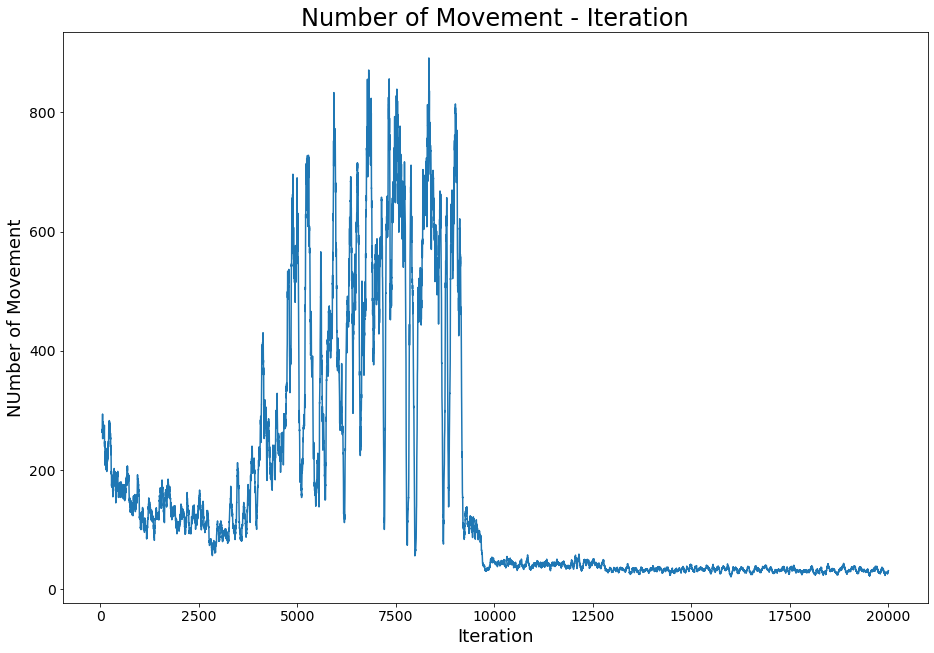

In [75]:
np.random.seed(10)
V,policy=WatkinsQ(LAMBDA=1,n_episodes=20000)

In [81]:
policy

{(4, 15, 0, 0): 'DU',
 (4, 15, 0, 1): 'DD',
 (4, 15, 0, 2): 'DU',
 (4, 15, 0, 3): 'ZZ',
 (4, 15, 0, 4): 'UU',
 (4, 15, 1, 0): 'DZ',
 (4, 15, 1, 1): 'UU',
 (4, 15, 1, 2): 'UZ',
 (4, 15, 1, 3): 'UD',
 (4, 15, 1, 4): 'DU',
 (4, 15, 2, 0): 'ZZ',
 (4, 15, 2, 1): 'DD',
 (4, 15, 2, 2): 'ZU',
 (4, 15, 2, 3): 'DZ',
 (4, 15, 2, 4): 'UD',
 (4, 15, 3, 0): 'ZZ',
 (4, 15, 3, 1): 'ZU',
 (4, 15, 3, 2): 'ZU',
 (4, 15, 3, 3): 'UZ',
 (4, 15, 3, 4): 'UZ',
 (4, 15, 4, 0): 'UU',
 (4, 15, 4, 1): 'DU',
 (4, 15, 4, 2): 'UU',
 (4, 15, 4, 3): 'DD',
 (4, 15, 4, 4): 'DU',
 (4, 16, 0, 0): 'UD',
 (4, 16, 0, 1): 'ZD',
 (4, 16, 0, 2): 'UZ',
 (4, 16, 0, 3): 'ZZ',
 (4, 16, 0, 4): 'DU',
 (4, 16, 1, 0): 'ZD',
 (4, 16, 1, 1): 'UZ',
 (4, 16, 1, 2): 'DD',
 (4, 16, 1, 3): 'ZD',
 (4, 16, 1, 4): 'DU',
 (4, 16, 2, 0): 'UZ',
 (4, 16, 2, 1): 'UZ',
 (4, 16, 2, 2): 'ZZ',
 (4, 16, 2, 3): 'ZU',
 (4, 16, 2, 4): 'DZ',
 (4, 16, 3, 0): 'ZZ',
 (4, 16, 3, 1): 'UZ',
 (4, 16, 3, 2): 'ZD',
 (4, 16, 3, 3): 'ZD',
 (4, 16, 3, 4): 'UD',
 (4, 16, 4

In [77]:
V

{(4, 15, 0, 0): 0,
 (4, 15, 0, 1): 0,
 (4, 15, 0, 2): 0,
 (4, 15, 0, 3): 0,
 (4, 15, 0, 4): 0,
 (4, 15, 1, 0): 0,
 (4, 15, 1, 1): 0,
 (4, 15, 1, 2): 0,
 (4, 15, 1, 3): 0,
 (4, 15, 1, 4): 0,
 (4, 15, 2, 0): -0.49892124113733,
 (4, 15, 2, 1): 0,
 (4, 15, 2, 2): 0,
 (4, 15, 2, 3): 0,
 (4, 15, 2, 4): 0,
 (4, 15, 3, 0): -1.2564784798481767,
 (4, 15, 3, 1): 0,
 (4, 15, 3, 2): 0,
 (4, 15, 3, 3): 0,
 (4, 15, 3, 4): 0,
 (4, 15, 4, 0): -1.7492042725220247,
 (4, 15, 4, 1): -0.5,
 (4, 15, 4, 2): 0,
 (4, 15, 4, 3): 0,
 (4, 15, 4, 4): 0,
 (4, 16, 0, 0): 0,
 (4, 16, 0, 1): 0,
 (4, 16, 0, 2): 0,
 (4, 16, 0, 3): 0,
 (4, 16, 0, 4): 0,
 (4, 16, 1, 0): -0.16561,
 (4, 16, 1, 1): 0,
 (4, 16, 1, 2): 0,
 (4, 16, 1, 3): 0,
 (4, 16, 1, 4): 0,
 (4, 16, 2, 0): -0.9744898827428332,
 (4, 16, 2, 1): -0.32908336009748446,
 (4, 16, 2, 2): 0,
 (4, 16, 2, 3): 0,
 (4, 16, 2, 4): 0,
 (4, 16, 3, 0): -1.7134945561737585,
 (4, 16, 3, 1): -0.6180024345301526,
 (4, 16, 3, 2): 0,
 (4, 16, 3, 3): 0,
 (4, 16, 3, 4): 0,
 (4, 16, 4

### Lambda = 0.95

0 #############################################################################################


1 #############################################################################################


2 #############################################################################################


3 #############################################################################################


4 #############################################################################################


5 #############################################################################################


6 #############################################################################################


7 #############################################################################################


8 #############################################################################################


9 #############################################################################################


10 #################

83 #############################################################################################


84 #############################################################################################


85 #############################################################################################


86 #############################################################################################


87 #############################################################################################


88 #############################################################################################


89 #############################################################################################


90 #############################################################################################


91 #############################################################################################


92 #############################################################################################


93 #######

166 #############################################################################################


167 #############################################################################################


168 #############################################################################################


169 #############################################################################################


170 #############################################################################################


171 #############################################################################################


172 #############################################################################################


173 #############################################################################################


174 #############################################################################################


175 #############################################################################################




248 #############################################################################################


249 #############################################################################################


250 #############################################################################################


251 #############################################################################################


252 #############################################################################################


253 #############################################################################################


254 #############################################################################################


255 #############################################################################################


256 #############################################################################################


257 #############################################################################################




330 #############################################################################################


331 #############################################################################################


332 #############################################################################################


333 #############################################################################################


334 #############################################################################################


335 #############################################################################################


336 #############################################################################################


337 #############################################################################################


338 #############################################################################################


339 #############################################################################################




412 #############################################################################################


413 #############################################################################################


414 #############################################################################################


415 #############################################################################################


416 #############################################################################################


417 #############################################################################################


418 #############################################################################################


419 #############################################################################################


420 #############################################################################################


421 #############################################################################################




494 #############################################################################################


495 #############################################################################################


496 #############################################################################################


497 #############################################################################################


498 #############################################################################################


499 #############################################################################################


500 #############################################################################################


501 #############################################################################################


502 #############################################################################################


503 #############################################################################################




576 #############################################################################################


577 #############################################################################################


578 #############################################################################################


579 #############################################################################################


580 #############################################################################################


581 #############################################################################################


582 #############################################################################################


583 #############################################################################################


584 #############################################################################################


585 #############################################################################################




658 #############################################################################################


659 #############################################################################################


660 #############################################################################################


661 #############################################################################################


662 #############################################################################################


663 #############################################################################################


664 #############################################################################################


665 #############################################################################################


666 #############################################################################################


667 #############################################################################################




740 #############################################################################################


741 #############################################################################################


742 #############################################################################################


743 #############################################################################################


744 #############################################################################################


745 #############################################################################################


746 #############################################################################################


747 #############################################################################################


748 #############################################################################################


749 #############################################################################################




822 #############################################################################################


823 #############################################################################################


824 #############################################################################################


825 #############################################################################################


826 #############################################################################################


827 #############################################################################################


828 #############################################################################################


829 #############################################################################################


830 #############################################################################################


831 #############################################################################################




904 #############################################################################################


905 #############################################################################################


906 #############################################################################################


907 #############################################################################################


908 #############################################################################################


909 #############################################################################################


910 #############################################################################################


911 #############################################################################################


912 #############################################################################################


913 #############################################################################################




986 #############################################################################################


987 #############################################################################################


988 #############################################################################################


989 #############################################################################################


990 #############################################################################################


991 #############################################################################################


992 #############################################################################################


993 #############################################################################################


994 #############################################################################################


995 #############################################################################################




1068 #############################################################################################


1069 #############################################################################################


1070 #############################################################################################


1071 #############################################################################################


1072 #############################################################################################


1073 #############################################################################################


1074 #############################################################################################


1075 #############################################################################################


1076 #############################################################################################


1077 ######################################################################################

1150 #############################################################################################


1151 #############################################################################################


1152 #############################################################################################


1153 #############################################################################################


1154 #############################################################################################


1155 #############################################################################################


1156 #############################################################################################


1157 #############################################################################################


1158 #############################################################################################


1159 ######################################################################################

1232 #############################################################################################


1233 #############################################################################################


1234 #############################################################################################


1235 #############################################################################################


1236 #############################################################################################


1237 #############################################################################################


1238 #############################################################################################


1239 #############################################################################################


1240 #############################################################################################


1241 ######################################################################################

1314 #############################################################################################


1315 #############################################################################################


1316 #############################################################################################


1317 #############################################################################################


1318 #############################################################################################


1319 #############################################################################################


1320 #############################################################################################


1321 #############################################################################################


1322 #############################################################################################


1323 ######################################################################################

1396 #############################################################################################


1397 #############################################################################################


1398 #############################################################################################


1399 #############################################################################################


1400 #############################################################################################


1401 #############################################################################################


1402 #############################################################################################


1403 #############################################################################################


1404 #############################################################################################


1405 ######################################################################################

1478 #############################################################################################


1479 #############################################################################################


1480 #############################################################################################


1481 #############################################################################################


1482 #############################################################################################


1483 #############################################################################################


1484 #############################################################################################


1485 #############################################################################################


1486 #############################################################################################


1487 ######################################################################################

1561 #############################################################################################


1562 #############################################################################################


1563 #############################################################################################


1564 #############################################################################################


1565 #############################################################################################


1566 #############################################################################################


1567 #############################################################################################


1568 #############################################################################################


1569 #############################################################################################


1570 ######################################################################################

1643 #############################################################################################


1644 #############################################################################################


1645 #############################################################################################


1646 #############################################################################################


1647 #############################################################################################


1648 #############################################################################################


1649 #############################################################################################


1650 #############################################################################################


1651 #############################################################################################


1652 ######################################################################################

1725 #############################################################################################


1726 #############################################################################################


1727 #############################################################################################


1728 #############################################################################################


1729 #############################################################################################


1730 #############################################################################################


1731 #############################################################################################


1732 #############################################################################################


1733 #############################################################################################


1734 ######################################################################################

1807 #############################################################################################


1808 #############################################################################################


1809 #############################################################################################


1810 #############################################################################################


1811 #############################################################################################


1812 #############################################################################################


1813 #############################################################################################


1814 #############################################################################################


1815 #############################################################################################


1816 ######################################################################################

1889 #############################################################################################


1890 #############################################################################################


1891 #############################################################################################


1892 #############################################################################################


1893 #############################################################################################


1894 #############################################################################################


1895 #############################################################################################


1896 #############################################################################################


1897 #############################################################################################


1898 ######################################################################################

1971 #############################################################################################


1972 #############################################################################################


1973 #############################################################################################


1974 #############################################################################################


1975 #############################################################################################


1976 #############################################################################################


1977 #############################################################################################


1978 #############################################################################################


1979 #############################################################################################


1980 ######################################################################################

2053 #############################################################################################


2054 #############################################################################################


2055 #############################################################################################


2056 #############################################################################################


2057 #############################################################################################


2058 #############################################################################################


2059 #############################################################################################


2060 #############################################################################################


2061 #############################################################################################


2062 ######################################################################################

2135 #############################################################################################


2136 #############################################################################################


2137 #############################################################################################


2138 #############################################################################################


2139 #############################################################################################


2140 #############################################################################################


2141 #############################################################################################


2142 #############################################################################################


2143 #############################################################################################


2144 ######################################################################################

2217 #############################################################################################


2218 #############################################################################################


2219 #############################################################################################


2220 #############################################################################################


2221 #############################################################################################


2222 #############################################################################################


2223 #############################################################################################


2224 #############################################################################################


2225 #############################################################################################


2226 ######################################################################################

2299 #############################################################################################


2300 #############################################################################################


2301 #############################################################################################


2302 #############################################################################################


2303 #############################################################################################


2304 #############################################################################################


2305 #############################################################################################


2306 #############################################################################################


2307 #############################################################################################


2308 ######################################################################################

2381 #############################################################################################


2382 #############################################################################################


2383 #############################################################################################


2384 #############################################################################################


2385 #############################################################################################


2386 #############################################################################################


2387 #############################################################################################


2388 #############################################################################################


2389 #############################################################################################


2390 ######################################################################################

2463 #############################################################################################


2464 #############################################################################################


2465 #############################################################################################


2466 #############################################################################################


2467 #############################################################################################


2468 #############################################################################################


2469 #############################################################################################


2470 #############################################################################################


2471 #############################################################################################


2472 ######################################################################################

2545 #############################################################################################


2546 #############################################################################################


2547 #############################################################################################


2548 #############################################################################################


2549 #############################################################################################


2550 #############################################################################################


2551 #############################################################################################


2552 #############################################################################################


2553 #############################################################################################


2554 ######################################################################################

2627 #############################################################################################


2628 #############################################################################################


2629 #############################################################################################


2630 #############################################################################################


2631 #############################################################################################


2632 #############################################################################################


2633 #############################################################################################


2634 #############################################################################################


2635 #############################################################################################


2636 ######################################################################################

2709 #############################################################################################


2710 #############################################################################################


2711 #############################################################################################


2712 #############################################################################################


2713 #############################################################################################


2714 #############################################################################################


2715 #############################################################################################


2716 #############################################################################################


2717 #############################################################################################


2718 ######################################################################################

2791 #############################################################################################


2792 #############################################################################################


2793 #############################################################################################


2794 #############################################################################################


2795 #############################################################################################


2796 #############################################################################################


2797 #############################################################################################


2798 #############################################################################################


2799 #############################################################################################


2800 ######################################################################################

2873 #############################################################################################


2874 #############################################################################################


2875 #############################################################################################


2876 #############################################################################################


2877 #############################################################################################


2878 #############################################################################################


2879 #############################################################################################


2880 #############################################################################################


2881 #############################################################################################


2882 ######################################################################################

2955 #############################################################################################


2956 #############################################################################################


2957 #############################################################################################


2958 #############################################################################################


2959 #############################################################################################


2960 #############################################################################################


2961 #############################################################################################


2962 #############################################################################################


2963 #############################################################################################


2964 ######################################################################################

3037 #############################################################################################


3038 #############################################################################################


3039 #############################################################################################


3040 #############################################################################################


3041 #############################################################################################


3042 #############################################################################################


3043 #############################################################################################


3044 #############################################################################################


3045 #############################################################################################


3046 ######################################################################################

3119 #############################################################################################


3120 #############################################################################################


3121 #############################################################################################


3122 #############################################################################################


3123 #############################################################################################


3124 #############################################################################################


3125 #############################################################################################


3126 #############################################################################################


3127 #############################################################################################


3128 ######################################################################################

3201 #############################################################################################


3202 #############################################################################################


3203 #############################################################################################


3204 #############################################################################################


3205 #############################################################################################


3206 #############################################################################################


3207 #############################################################################################


3208 #############################################################################################


3209 #############################################################################################


3210 ######################################################################################

3283 #############################################################################################


3284 #############################################################################################


3285 #############################################################################################


3286 #############################################################################################


3287 #############################################################################################


3288 #############################################################################################


3289 #############################################################################################


3290 #############################################################################################


3291 #############################################################################################


3292 ######################################################################################

3365 #############################################################################################


3366 #############################################################################################


3367 #############################################################################################


3368 #############################################################################################


3369 #############################################################################################


3370 #############################################################################################


3371 #############################################################################################


3372 #############################################################################################


3373 #############################################################################################


3374 ######################################################################################

3447 #############################################################################################


3448 #############################################################################################


3449 #############################################################################################


3450 #############################################################################################


3451 #############################################################################################


3452 #############################################################################################


3453 #############################################################################################


3454 #############################################################################################


3455 #############################################################################################


3456 ######################################################################################

3529 #############################################################################################


3530 #############################################################################################


3531 #############################################################################################


3532 #############################################################################################


3533 #############################################################################################


3534 #############################################################################################


3535 #############################################################################################


3536 #############################################################################################


3537 #############################################################################################


3538 ######################################################################################

3611 #############################################################################################


3612 #############################################################################################


3613 #############################################################################################


3614 #############################################################################################


3615 #############################################################################################


3616 #############################################################################################


3617 #############################################################################################


3618 #############################################################################################


3619 #############################################################################################


3620 ######################################################################################

3693 #############################################################################################


3694 #############################################################################################


3695 #############################################################################################


3696 #############################################################################################


3697 #############################################################################################


3698 #############################################################################################


3699 #############################################################################################


3700 #############################################################################################


3701 #############################################################################################


3702 ######################################################################################

3775 #############################################################################################


3776 #############################################################################################


3777 #############################################################################################


3778 #############################################################################################


3779 #############################################################################################


3780 #############################################################################################


3781 #############################################################################################


3782 #############################################################################################


3783 #############################################################################################


3784 ######################################################################################

3857 #############################################################################################


3858 #############################################################################################


3859 #############################################################################################


3860 #############################################################################################


3861 #############################################################################################


3862 #############################################################################################


3863 #############################################################################################


3864 #############################################################################################


3865 #############################################################################################


3866 ######################################################################################

3939 #############################################################################################


3940 #############################################################################################


3941 #############################################################################################


3942 #############################################################################################


3943 #############################################################################################


3944 #############################################################################################


3945 #############################################################################################


3946 #############################################################################################


3947 #############################################################################################


3948 ######################################################################################

4021 #############################################################################################


4022 #############################################################################################


4023 #############################################################################################


4024 #############################################################################################


4025 #############################################################################################


4026 #############################################################################################


4027 #############################################################################################


4028 #############################################################################################


4029 #############################################################################################


4030 ######################################################################################

4103 #############################################################################################


4104 #############################################################################################


4105 #############################################################################################


4106 #############################################################################################


4107 #############################################################################################


4108 #############################################################################################


4109 #############################################################################################


4110 #############################################################################################


4111 #############################################################################################


4112 ######################################################################################

4185 #############################################################################################


4186 #############################################################################################


4187 #############################################################################################


4188 #############################################################################################


4189 #############################################################################################


4190 #############################################################################################


4191 #############################################################################################


4192 #############################################################################################


4193 #############################################################################################


4194 ######################################################################################

4267 #############################################################################################


4268 #############################################################################################


4269 #############################################################################################


4270 #############################################################################################


4271 #############################################################################################


4272 #############################################################################################


4273 #############################################################################################


4274 #############################################################################################


4275 #############################################################################################


4276 ######################################################################################

4349 #############################################################################################


4350 #############################################################################################


4351 #############################################################################################


4352 #############################################################################################


4353 #############################################################################################


4354 #############################################################################################


4355 #############################################################################################


4356 #############################################################################################


4357 #############################################################################################


4358 ######################################################################################

4431 #############################################################################################


4432 #############################################################################################


4433 #############################################################################################


4434 #############################################################################################


4435 #############################################################################################


4436 #############################################################################################


4437 #############################################################################################


4438 #############################################################################################


4439 #############################################################################################


4440 ######################################################################################

4513 #############################################################################################


4514 #############################################################################################


4515 #############################################################################################


4516 #############################################################################################


4517 #############################################################################################


4518 #############################################################################################


4519 #############################################################################################


4520 #############################################################################################


4521 #############################################################################################


4522 ######################################################################################

4595 #############################################################################################


4596 #############################################################################################


4597 #############################################################################################


4598 #############################################################################################


4599 #############################################################################################


4600 #############################################################################################


4601 #############################################################################################


4602 #############################################################################################


4603 #############################################################################################


4604 ######################################################################################

4677 #############################################################################################


4678 #############################################################################################


4679 #############################################################################################


4680 #############################################################################################


4681 #############################################################################################


4682 #############################################################################################


4683 #############################################################################################


4684 #############################################################################################


4685 #############################################################################################


4686 ######################################################################################

4759 #############################################################################################


4760 #############################################################################################


4761 #############################################################################################


4762 #############################################################################################


4763 #############################################################################################


4764 #############################################################################################


4765 #############################################################################################


4766 #############################################################################################


4767 #############################################################################################


4768 ######################################################################################

4841 #############################################################################################


4842 #############################################################################################


4843 #############################################################################################


4844 #############################################################################################


4845 #############################################################################################


4846 #############################################################################################


4847 #############################################################################################


4848 #############################################################################################


4849 #############################################################################################


4850 ######################################################################################

4923 #############################################################################################


4924 #############################################################################################


4925 #############################################################################################


4926 #############################################################################################


4927 #############################################################################################


4928 #############################################################################################


4929 #############################################################################################


4930 #############################################################################################


4931 #############################################################################################


4932 ######################################################################################

5005 #############################################################################################


5006 #############################################################################################


5007 #############################################################################################


5008 #############################################################################################


5009 #############################################################################################


5010 #############################################################################################


5011 #############################################################################################


5012 #############################################################################################


5013 #############################################################################################


5014 ######################################################################################

5087 #############################################################################################


5088 #############################################################################################


5089 #############################################################################################


5090 #############################################################################################


5091 #############################################################################################


5092 #############################################################################################


5093 #############################################################################################


5094 #############################################################################################


5095 #############################################################################################


5096 ######################################################################################

5169 #############################################################################################


5170 #############################################################################################


5171 #############################################################################################


5172 #############################################################################################


5173 #############################################################################################


5174 #############################################################################################


5175 #############################################################################################


5176 #############################################################################################


5177 #############################################################################################


5178 ######################################################################################

5251 #############################################################################################


5252 #############################################################################################


5253 #############################################################################################


5254 #############################################################################################


5255 #############################################################################################


5256 #############################################################################################


5257 #############################################################################################


5258 #############################################################################################


5259 #############################################################################################


5260 ######################################################################################

5333 #############################################################################################


5334 #############################################################################################


5335 #############################################################################################


5336 #############################################################################################


5337 #############################################################################################


5338 #############################################################################################


5339 #############################################################################################


5340 #############################################################################################


5341 #############################################################################################


5342 ######################################################################################

5415 #############################################################################################


5416 #############################################################################################


5417 #############################################################################################


5418 #############################################################################################


5419 #############################################################################################


5420 #############################################################################################


5421 #############################################################################################


5422 #############################################################################################


5423 #############################################################################################


5424 ######################################################################################

5497 #############################################################################################


5498 #############################################################################################


5499 #############################################################################################


5500 #############################################################################################


5501 #############################################################################################


5502 #############################################################################################


5503 #############################################################################################


5504 #############################################################################################


5505 #############################################################################################


5506 ######################################################################################

5579 #############################################################################################


5580 #############################################################################################


5581 #############################################################################################


5582 #############################################################################################


5583 #############################################################################################


5584 #############################################################################################


5585 #############################################################################################


5586 #############################################################################################


5587 #############################################################################################


5588 ######################################################################################

5661 #############################################################################################


5662 #############################################################################################


5663 #############################################################################################


5664 #############################################################################################


5665 #############################################################################################


5666 #############################################################################################


5667 #############################################################################################


5668 #############################################################################################


5669 #############################################################################################


5670 ######################################################################################

5743 #############################################################################################


5744 #############################################################################################


5745 #############################################################################################


5746 #############################################################################################


5747 #############################################################################################


5748 #############################################################################################


5749 #############################################################################################


5750 #############################################################################################


5751 #############################################################################################


5752 ######################################################################################

5825 #############################################################################################


5826 #############################################################################################


5827 #############################################################################################


5828 #############################################################################################


5829 #############################################################################################


5830 #############################################################################################


5831 #############################################################################################


5832 #############################################################################################


5833 #############################################################################################


5834 ######################################################################################

5907 #############################################################################################


5908 #############################################################################################


5909 #############################################################################################


5910 #############################################################################################


5911 #############################################################################################


5912 #############################################################################################


5913 #############################################################################################


5914 #############################################################################################


5915 #############################################################################################


5916 ######################################################################################

5989 #############################################################################################


5990 #############################################################################################


5991 #############################################################################################


5992 #############################################################################################


5993 #############################################################################################


5994 #############################################################################################


5995 #############################################################################################


5996 #############################################################################################


5997 #############################################################################################


5998 ######################################################################################

6071 #############################################################################################


6072 #############################################################################################


6073 #############################################################################################


6074 #############################################################################################


6075 #############################################################################################


6076 #############################################################################################


6077 #############################################################################################


6078 #############################################################################################


6079 #############################################################################################


6080 ######################################################################################

6153 #############################################################################################


6154 #############################################################################################


6155 #############################################################################################


6156 #############################################################################################


6157 #############################################################################################


6158 #############################################################################################


6159 #############################################################################################


6160 #############################################################################################


6161 #############################################################################################


6162 ######################################################################################

6235 #############################################################################################


6236 #############################################################################################


6237 #############################################################################################


6238 #############################################################################################


6239 #############################################################################################


6240 #############################################################################################


6241 #############################################################################################


6242 #############################################################################################


6243 #############################################################################################


6244 ######################################################################################

6317 #############################################################################################


6318 #############################################################################################


6319 #############################################################################################


6320 #############################################################################################


6321 #############################################################################################


6322 #############################################################################################


6323 #############################################################################################


6324 #############################################################################################


6325 #############################################################################################


6326 ######################################################################################

6399 #############################################################################################


6400 #############################################################################################


6401 #############################################################################################


6402 #############################################################################################


6403 #############################################################################################


6404 #############################################################################################


6405 #############################################################################################


6406 #############################################################################################


6407 #############################################################################################


6408 ######################################################################################

6481 #############################################################################################


6482 #############################################################################################


6483 #############################################################################################


6484 #############################################################################################


6485 #############################################################################################


6486 #############################################################################################


6487 #############################################################################################


6488 #############################################################################################


6489 #############################################################################################


6490 ######################################################################################

6563 #############################################################################################


6564 #############################################################################################


6565 #############################################################################################


6566 #############################################################################################


6567 #############################################################################################


6568 #############################################################################################


6569 #############################################################################################


6570 #############################################################################################


6571 #############################################################################################


6572 ######################################################################################

6645 #############################################################################################


6646 #############################################################################################


6647 #############################################################################################


6648 #############################################################################################


6649 #############################################################################################


6650 #############################################################################################


6651 #############################################################################################


6652 #############################################################################################


6653 #############################################################################################


6654 ######################################################################################

6727 #############################################################################################


6728 #############################################################################################


6729 #############################################################################################


6730 #############################################################################################


6731 #############################################################################################


6732 #############################################################################################


6733 #############################################################################################


6734 #############################################################################################


6735 #############################################################################################


6736 ######################################################################################

6809 #############################################################################################


6810 #############################################################################################


6811 #############################################################################################


6812 #############################################################################################


6813 #############################################################################################


6814 #############################################################################################


6815 #############################################################################################


6816 #############################################################################################


6817 #############################################################################################


6818 ######################################################################################

6891 #############################################################################################


6892 #############################################################################################


6893 #############################################################################################


6894 #############################################################################################


6895 #############################################################################################


6896 #############################################################################################


6897 #############################################################################################


6898 #############################################################################################


6899 #############################################################################################


6900 ######################################################################################

6973 #############################################################################################


6974 #############################################################################################


6975 #############################################################################################


6976 #############################################################################################


6977 #############################################################################################


6978 #############################################################################################


6979 #############################################################################################


6980 #############################################################################################


6981 #############################################################################################


6982 ######################################################################################

7055 #############################################################################################


7056 #############################################################################################


7057 #############################################################################################


7058 #############################################################################################


7059 #############################################################################################


7060 #############################################################################################


7061 #############################################################################################


7062 #############################################################################################


7063 #############################################################################################


7064 ######################################################################################

7137 #############################################################################################


7138 #############################################################################################


7139 #############################################################################################


7140 #############################################################################################


7141 #############################################################################################


7142 #############################################################################################


7143 #############################################################################################


7144 #############################################################################################


7145 #############################################################################################


7146 ######################################################################################

7219 #############################################################################################


7220 #############################################################################################


7221 #############################################################################################


7222 #############################################################################################


7223 #############################################################################################


7224 #############################################################################################


7225 #############################################################################################


7226 #############################################################################################


7227 #############################################################################################


7228 ######################################################################################

7301 #############################################################################################


7302 #############################################################################################


7303 #############################################################################################


7304 #############################################################################################


7305 #############################################################################################


7306 #############################################################################################


7307 #############################################################################################


7308 #############################################################################################


7309 #############################################################################################


7310 ######################################################################################

7383 #############################################################################################


7384 #############################################################################################


7385 #############################################################################################


7386 #############################################################################################


7387 #############################################################################################


7388 #############################################################################################


7389 #############################################################################################


7390 #############################################################################################


7391 #############################################################################################


7392 ######################################################################################

7465 #############################################################################################


7466 #############################################################################################


7467 #############################################################################################


7468 #############################################################################################


7469 #############################################################################################


7470 #############################################################################################


7471 #############################################################################################


7472 #############################################################################################


7473 #############################################################################################


7474 ######################################################################################

7547 #############################################################################################


7548 #############################################################################################


7549 #############################################################################################


7550 #############################################################################################


7551 #############################################################################################


7552 #############################################################################################


7553 #############################################################################################


7554 #############################################################################################


7555 #############################################################################################


7556 ######################################################################################

7629 #############################################################################################


7630 #############################################################################################


7631 #############################################################################################


7632 #############################################################################################


7633 #############################################################################################


7634 #############################################################################################


7635 #############################################################################################


7636 #############################################################################################


7637 #############################################################################################


7638 ######################################################################################

7711 #############################################################################################


7712 #############################################################################################


7713 #############################################################################################


7714 #############################################################################################


7715 #############################################################################################


7716 #############################################################################################


7717 #############################################################################################


7718 #############################################################################################


7719 #############################################################################################


7720 ######################################################################################

7793 #############################################################################################


7794 #############################################################################################


7795 #############################################################################################


7796 #############################################################################################


7797 #############################################################################################


7798 #############################################################################################


7799 #############################################################################################


7800 #############################################################################################


7801 #############################################################################################


7802 ######################################################################################

7875 #############################################################################################


7876 #############################################################################################


7877 #############################################################################################


7878 #############################################################################################


7879 #############################################################################################


7880 #############################################################################################


7881 #############################################################################################


7882 #############################################################################################


7883 #############################################################################################


7884 ######################################################################################

7957 #############################################################################################


7958 #############################################################################################


7959 #############################################################################################


7960 #############################################################################################


7961 #############################################################################################


7962 #############################################################################################


7963 #############################################################################################


7964 #############################################################################################


7965 #############################################################################################


7966 ######################################################################################

8039 #############################################################################################


8040 #############################################################################################


8041 #############################################################################################


8042 #############################################################################################


8043 #############################################################################################


8044 #############################################################################################


8045 #############################################################################################


8046 #############################################################################################


8047 #############################################################################################


8048 ######################################################################################

8121 #############################################################################################


8122 #############################################################################################


8123 #############################################################################################


8124 #############################################################################################


8125 #############################################################################################


8126 #############################################################################################


8127 #############################################################################################


8128 #############################################################################################


8129 #############################################################################################


8130 ######################################################################################

8203 #############################################################################################


8204 #############################################################################################


8205 #############################################################################################


8206 #############################################################################################


8207 #############################################################################################


8208 #############################################################################################


8209 #############################################################################################


8210 #############################################################################################


8211 #############################################################################################


8212 ######################################################################################

8285 #############################################################################################


8286 #############################################################################################


8287 #############################################################################################


8288 #############################################################################################


8289 #############################################################################################


8290 #############################################################################################


8291 #############################################################################################


8292 #############################################################################################


8293 #############################################################################################


8294 ######################################################################################

8367 #############################################################################################


8368 #############################################################################################


8369 #############################################################################################


8370 #############################################################################################


8371 #############################################################################################


8372 #############################################################################################


8373 #############################################################################################


8374 #############################################################################################


8375 #############################################################################################


8376 ######################################################################################

8449 #############################################################################################


8450 #############################################################################################


8451 #############################################################################################


8452 #############################################################################################


8453 #############################################################################################


8454 #############################################################################################


8455 #############################################################################################


8456 #############################################################################################


8457 #############################################################################################


8458 ######################################################################################

8531 #############################################################################################


8532 #############################################################################################


8533 #############################################################################################


8534 #############################################################################################


8535 #############################################################################################


8536 #############################################################################################


8537 #############################################################################################


8538 #############################################################################################


8539 #############################################################################################


8540 ######################################################################################

8613 #############################################################################################


8614 #############################################################################################


8615 #############################################################################################


8616 #############################################################################################


8617 #############################################################################################


8618 #############################################################################################


8619 #############################################################################################


8620 #############################################################################################


8621 #############################################################################################


8622 ######################################################################################

8695 #############################################################################################


8696 #############################################################################################


8697 #############################################################################################


8698 #############################################################################################


8699 #############################################################################################


8700 #############################################################################################


8701 #############################################################################################


8702 #############################################################################################


8703 #############################################################################################


8704 ######################################################################################

8778 #############################################################################################


8779 #############################################################################################


8780 #############################################################################################


8781 #############################################################################################


8782 #############################################################################################


8783 #############################################################################################


8784 #############################################################################################


8785 #############################################################################################


8786 #############################################################################################


8787 ######################################################################################

8860 #############################################################################################


8861 #############################################################################################


8862 #############################################################################################


8863 #############################################################################################


8864 #############################################################################################


8865 #############################################################################################


8866 #############################################################################################


8867 #############################################################################################


8868 #############################################################################################


8869 ######################################################################################

8942 #############################################################################################


8943 #############################################################################################


8944 #############################################################################################


8945 #############################################################################################


8946 #############################################################################################


8947 #############################################################################################


8948 #############################################################################################


8949 #############################################################################################


8950 #############################################################################################


8951 ######################################################################################

9024 #############################################################################################


9025 #############################################################################################


9026 #############################################################################################


9027 #############################################################################################


9028 #############################################################################################


9029 #############################################################################################


9030 #############################################################################################


9031 #############################################################################################


9032 #############################################################################################


9033 ######################################################################################

9106 #############################################################################################


9107 #############################################################################################


9108 #############################################################################################


9109 #############################################################################################


9110 #############################################################################################


9111 #############################################################################################


9112 #############################################################################################


9113 #############################################################################################


9114 #############################################################################################


9115 ######################################################################################

9188 #############################################################################################


9189 #############################################################################################


9190 #############################################################################################


9191 #############################################################################################


9192 #############################################################################################


9193 #############################################################################################


9194 #############################################################################################


9195 #############################################################################################


9196 #############################################################################################


9197 ######################################################################################

9270 #############################################################################################


9271 #############################################################################################


9272 #############################################################################################


9273 #############################################################################################


9274 #############################################################################################


9275 #############################################################################################


9276 #############################################################################################


9277 #############################################################################################


9278 #############################################################################################


9279 ######################################################################################

9352 #############################################################################################


9353 #############################################################################################


9354 #############################################################################################


9355 #############################################################################################


9356 #############################################################################################


9357 #############################################################################################


9358 #############################################################################################


9359 #############################################################################################


9360 #############################################################################################


9361 ######################################################################################

9434 #############################################################################################


9435 #############################################################################################


9436 #############################################################################################


9437 #############################################################################################


9438 #############################################################################################


9439 #############################################################################################


9440 #############################################################################################


9441 #############################################################################################


9442 #############################################################################################


9443 ######################################################################################

9516 #############################################################################################


9517 #############################################################################################


9518 #############################################################################################


9519 #############################################################################################


9520 #############################################################################################


9521 #############################################################################################


9522 #############################################################################################


9523 #############################################################################################


9524 #############################################################################################


9525 ######################################################################################

9598 #############################################################################################


9599 #############################################################################################


9600 #############################################################################################


9601 #############################################################################################


9602 #############################################################################################


9603 #############################################################################################


9604 #############################################################################################


9605 #############################################################################################


9606 #############################################################################################


9607 ######################################################################################

9680 #############################################################################################


9681 #############################################################################################


9682 #############################################################################################


9683 #############################################################################################


9684 #############################################################################################


9685 #############################################################################################


9686 #############################################################################################


9687 #############################################################################################


9688 #############################################################################################


9689 ######################################################################################

9762 #############################################################################################


9763 #############################################################################################


9764 #############################################################################################


9765 #############################################################################################


9766 #############################################################################################


9767 #############################################################################################


9768 #############################################################################################


9769 #############################################################################################


9770 #############################################################################################


9771 ######################################################################################

9844 #############################################################################################


9845 #############################################################################################


9846 #############################################################################################


9847 #############################################################################################


9848 #############################################################################################


9849 #############################################################################################


9850 #############################################################################################


9851 #############################################################################################


9852 #############################################################################################


9853 ######################################################################################

9926 #############################################################################################


9927 #############################################################################################


9928 #############################################################################################


9929 #############################################################################################


9930 #############################################################################################


9931 #############################################################################################


9932 #############################################################################################


9933 #############################################################################################


9934 #############################################################################################


9935 ######################################################################################

10008 #############################################################################################


10009 #############################################################################################


10010 #############################################################################################


10011 #############################################################################################


10012 #############################################################################################


10013 #############################################################################################


10014 #############################################################################################


10015 #############################################################################################


10016 #############################################################################################


10017 ############################################################################

10089 #############################################################################################


10090 #############################################################################################


10091 #############################################################################################


10092 #############################################################################################


10093 #############################################################################################


10094 #############################################################################################


10095 #############################################################################################


10096 #############################################################################################


10097 #############################################################################################


10098 ############################################################################

10171 #############################################################################################


10172 #############################################################################################


10173 #############################################################################################


10174 #############################################################################################


10175 #############################################################################################


10176 #############################################################################################


10177 #############################################################################################


10178 #############################################################################################


10179 #############################################################################################


10180 ############################################################################

10252 #############################################################################################


10253 #############################################################################################


10254 #############################################################################################


10255 #############################################################################################


10256 #############################################################################################


10257 #############################################################################################


10258 #############################################################################################


10259 #############################################################################################


10260 #############################################################################################


10261 ############################################################################

10334 #############################################################################################


10335 #############################################################################################


10336 #############################################################################################


10337 #############################################################################################


10338 #############################################################################################


10339 #############################################################################################


10340 #############################################################################################


10341 #############################################################################################


10342 #############################################################################################


10343 ############################################################################

10415 #############################################################################################


10416 #############################################################################################


10417 #############################################################################################


10418 #############################################################################################


10419 #############################################################################################


10420 #############################################################################################


10421 #############################################################################################


10422 #############################################################################################


10423 #############################################################################################


10424 ############################################################################

10496 #############################################################################################


10497 #############################################################################################


10498 #############################################################################################


10499 #############################################################################################


10500 #############################################################################################


10501 #############################################################################################


10502 #############################################################################################


10503 #############################################################################################


10504 #############################################################################################


10505 ############################################################################

10577 #############################################################################################


10578 #############################################################################################


10579 #############################################################################################


10580 #############################################################################################


10581 #############################################################################################


10582 #############################################################################################


10583 #############################################################################################


10584 #############################################################################################


10585 #############################################################################################


10586 ############################################################################

10658 #############################################################################################


10659 #############################################################################################


10660 #############################################################################################


10661 #############################################################################################


10662 #############################################################################################


10663 #############################################################################################


10664 #############################################################################################


10665 #############################################################################################


10666 #############################################################################################


10667 ############################################################################

10739 #############################################################################################


10740 #############################################################################################


10741 #############################################################################################


10742 #############################################################################################


10743 #############################################################################################


10744 #############################################################################################


10745 #############################################################################################


10746 #############################################################################################


10747 #############################################################################################


10748 ############################################################################

10820 #############################################################################################


10821 #############################################################################################


10822 #############################################################################################


10823 #############################################################################################


10824 #############################################################################################


10825 #############################################################################################


10826 #############################################################################################


10827 #############################################################################################


10828 #############################################################################################


10829 ############################################################################

10901 #############################################################################################


10902 #############################################################################################


10903 #############################################################################################


10904 #############################################################################################


10905 #############################################################################################


10906 #############################################################################################


10907 #############################################################################################


10908 #############################################################################################


10909 #############################################################################################


10910 ############################################################################

10982 #############################################################################################


10983 #############################################################################################


10984 #############################################################################################


10985 #############################################################################################


10986 #############################################################################################


10987 #############################################################################################


10988 #############################################################################################


10989 #############################################################################################


10990 #############################################################################################


10991 ############################################################################

11063 #############################################################################################


11064 #############################################################################################


11065 #############################################################################################


11066 #############################################################################################


11067 #############################################################################################


11068 #############################################################################################


11069 #############################################################################################


11070 #############################################################################################


11071 #############################################################################################


11072 ############################################################################

11144 #############################################################################################


11145 #############################################################################################


11146 #############################################################################################


11147 #############################################################################################


11148 #############################################################################################


11149 #############################################################################################


11150 #############################################################################################


11151 #############################################################################################


11152 #############################################################################################


11153 ############################################################################

11226 #############################################################################################


11227 #############################################################################################


11228 #############################################################################################


11229 #############################################################################################


11230 #############################################################################################


11231 #############################################################################################


11232 #############################################################################################


11233 #############################################################################################


11234 #############################################################################################


11235 ############################################################################

11307 #############################################################################################


11308 #############################################################################################


11309 #############################################################################################


11310 #############################################################################################


11311 #############################################################################################


11312 #############################################################################################


11313 #############################################################################################


11314 #############################################################################################


11315 #############################################################################################


11316 ############################################################################

11388 #############################################################################################


11389 #############################################################################################


11390 #############################################################################################


11391 #############################################################################################


11392 #############################################################################################


11393 #############################################################################################


11394 #############################################################################################


11395 #############################################################################################


11396 #############################################################################################


11397 ############################################################################

11469 #############################################################################################


11470 #############################################################################################


11471 #############################################################################################


11472 #############################################################################################


11473 #############################################################################################


11474 #############################################################################################


11475 #############################################################################################


11476 #############################################################################################


11477 #############################################################################################


11478 ############################################################################

11550 #############################################################################################


11551 #############################################################################################


11552 #############################################################################################


11553 #############################################################################################


11554 #############################################################################################


11555 #############################################################################################


11556 #############################################################################################


11557 #############################################################################################


11558 #############################################################################################


11559 ############################################################################

11631 #############################################################################################


11632 #############################################################################################


11633 #############################################################################################


11634 #############################################################################################


11635 #############################################################################################


11636 #############################################################################################


11637 #############################################################################################


11638 #############################################################################################


11639 #############################################################################################


11640 ############################################################################

11712 #############################################################################################


11713 #############################################################################################


11714 #############################################################################################


11715 #############################################################################################


11716 #############################################################################################


11717 #############################################################################################


11718 #############################################################################################


11719 #############################################################################################


11720 #############################################################################################


11721 ############################################################################

11793 #############################################################################################


11794 #############################################################################################


11795 #############################################################################################


11796 #############################################################################################


11797 #############################################################################################


11798 #############################################################################################


11799 #############################################################################################


11800 #############################################################################################


11801 #############################################################################################


11802 ############################################################################

11874 #############################################################################################


11875 #############################################################################################


11876 #############################################################################################


11877 #############################################################################################


11878 #############################################################################################


11879 #############################################################################################


11880 #############################################################################################


11881 #############################################################################################


11882 #############################################################################################


11883 ############################################################################

11955 #############################################################################################


11956 #############################################################################################


11957 #############################################################################################


11958 #############################################################################################


11959 #############################################################################################


11960 #############################################################################################


11961 #############################################################################################


11962 #############################################################################################


11963 #############################################################################################


11964 ############################################################################

12036 #############################################################################################


12037 #############################################################################################


12038 #############################################################################################


12039 #############################################################################################


12040 #############################################################################################


12041 #############################################################################################


12042 #############################################################################################


12043 #############################################################################################


12044 #############################################################################################


12045 ############################################################################

12118 #############################################################################################


12119 #############################################################################################


12120 #############################################################################################


12121 #############################################################################################


12122 #############################################################################################


12123 #############################################################################################


12124 #############################################################################################


12125 #############################################################################################


12126 #############################################################################################


12127 ############################################################################

12199 #############################################################################################


12200 #############################################################################################


12201 #############################################################################################


12202 #############################################################################################


12203 #############################################################################################


12204 #############################################################################################


12205 #############################################################################################


12206 #############################################################################################


12207 #############################################################################################


12208 ############################################################################

12280 #############################################################################################


12281 #############################################################################################


12282 #############################################################################################


12283 #############################################################################################


12284 #############################################################################################


12285 #############################################################################################


12286 #############################################################################################


12287 #############################################################################################


12288 #############################################################################################


12289 ############################################################################

12361 #############################################################################################


12362 #############################################################################################


12363 #############################################################################################


12364 #############################################################################################


12365 #############################################################################################


12366 #############################################################################################


12367 #############################################################################################


12368 #############################################################################################


12369 #############################################################################################


12370 ############################################################################

12442 #############################################################################################


12443 #############################################################################################


12444 #############################################################################################


12445 #############################################################################################


12446 #############################################################################################


12447 #############################################################################################


12448 #############################################################################################


12449 #############################################################################################


12450 #############################################################################################


12451 ############################################################################

12523 #############################################################################################


12524 #############################################################################################


12525 #############################################################################################


12526 #############################################################################################


12527 #############################################################################################


12528 #############################################################################################


12529 #############################################################################################


12530 #############################################################################################


12531 #############################################################################################


12532 ############################################################################

12604 #############################################################################################


12605 #############################################################################################


12606 #############################################################################################


12607 #############################################################################################


12608 #############################################################################################


12609 #############################################################################################


12610 #############################################################################################


12611 #############################################################################################


12612 #############################################################################################


12613 ############################################################################

12685 #############################################################################################


12686 #############################################################################################


12687 #############################################################################################


12688 #############################################################################################


12689 #############################################################################################


12690 #############################################################################################


12691 #############################################################################################


12692 #############################################################################################


12693 #############################################################################################


12694 ############################################################################

12766 #############################################################################################


12767 #############################################################################################


12768 #############################################################################################


12769 #############################################################################################


12770 #############################################################################################


12771 #############################################################################################


12772 #############################################################################################


12773 #############################################################################################


12774 #############################################################################################


12775 ############################################################################

12847 #############################################################################################


12848 #############################################################################################


12849 #############################################################################################


12850 #############################################################################################


12851 #############################################################################################


12852 #############################################################################################


12853 #############################################################################################


12854 #############################################################################################


12855 #############################################################################################


12856 ############################################################################

12928 #############################################################################################


12929 #############################################################################################


12930 #############################################################################################


12931 #############################################################################################


12932 #############################################################################################


12933 #############################################################################################


12934 #############################################################################################


12935 #############################################################################################


12936 #############################################################################################


12937 ############################################################################

13009 #############################################################################################


13010 #############################################################################################


13011 #############################################################################################


13012 #############################################################################################


13013 #############################################################################################


13014 #############################################################################################


13015 #############################################################################################


13016 #############################################################################################


13017 #############################################################################################


13018 ############################################################################

13090 #############################################################################################


13091 #############################################################################################


13092 #############################################################################################


13093 #############################################################################################


13094 #############################################################################################


13095 #############################################################################################


13096 #############################################################################################


13097 #############################################################################################


13098 #############################################################################################


13099 ############################################################################

13171 #############################################################################################


13172 #############################################################################################


13173 #############################################################################################


13174 #############################################################################################


13175 #############################################################################################


13176 #############################################################################################


13177 #############################################################################################


13178 #############################################################################################


13179 #############################################################################################


13180 ############################################################################

13252 #############################################################################################


13253 #############################################################################################


13254 #############################################################################################


13255 #############################################################################################


13256 #############################################################################################


13257 #############################################################################################


13258 #############################################################################################


13259 #############################################################################################


13260 #############################################################################################


13261 ############################################################################

13333 #############################################################################################


13334 #############################################################################################


13335 #############################################################################################


13336 #############################################################################################


13337 #############################################################################################


13338 #############################################################################################


13339 #############################################################################################


13340 #############################################################################################


13341 #############################################################################################


13342 ############################################################################

13414 #############################################################################################


13415 #############################################################################################


13416 #############################################################################################


13417 #############################################################################################


13418 #############################################################################################


13419 #############################################################################################


13420 #############################################################################################


13421 #############################################################################################


13422 #############################################################################################


13423 ############################################################################

13495 #############################################################################################


13496 #############################################################################################


13497 #############################################################################################


13498 #############################################################################################


13499 #############################################################################################


13500 #############################################################################################


13501 #############################################################################################


13502 #############################################################################################


13503 #############################################################################################


13504 ############################################################################

13576 #############################################################################################


13577 #############################################################################################


13578 #############################################################################################


13579 #############################################################################################


13580 #############################################################################################


13581 #############################################################################################


13582 #############################################################################################


13583 #############################################################################################


13584 #############################################################################################


13585 ############################################################################

13657 #############################################################################################


13658 #############################################################################################


13659 #############################################################################################


13660 #############################################################################################


13661 #############################################################################################


13662 #############################################################################################


13663 #############################################################################################


13664 #############################################################################################


13665 #############################################################################################


13666 ############################################################################

13738 #############################################################################################


13739 #############################################################################################


13740 #############################################################################################


13741 #############################################################################################


13742 #############################################################################################


13743 #############################################################################################


13744 #############################################################################################


13745 #############################################################################################


13746 #############################################################################################


13747 ############################################################################

13819 #############################################################################################


13820 #############################################################################################


13821 #############################################################################################


13822 #############################################################################################


13823 #############################################################################################


13824 #############################################################################################


13825 #############################################################################################


13826 #############################################################################################


13827 #############################################################################################


13828 ############################################################################

13900 #############################################################################################


13901 #############################################################################################


13902 #############################################################################################


13903 #############################################################################################


13904 #############################################################################################


13905 #############################################################################################


13906 #############################################################################################


13907 #############################################################################################


13908 #############################################################################################


13909 ############################################################################

13981 #############################################################################################


13982 #############################################################################################


13983 #############################################################################################


13984 #############################################################################################


13985 #############################################################################################


13986 #############################################################################################


13987 #############################################################################################


13988 #############################################################################################


13989 #############################################################################################


13990 ############################################################################

14062 #############################################################################################


14063 #############################################################################################


14064 #############################################################################################


14065 #############################################################################################


14066 #############################################################################################


14067 #############################################################################################


14068 #############################################################################################


14069 #############################################################################################


14070 #############################################################################################


14071 ############################################################################

14143 #############################################################################################


14144 #############################################################################################


14145 #############################################################################################


14146 #############################################################################################


14147 #############################################################################################


14148 #############################################################################################


14149 #############################################################################################


14150 #############################################################################################


14151 #############################################################################################


14152 ############################################################################

14224 #############################################################################################


14225 #############################################################################################


14226 #############################################################################################


14227 #############################################################################################


14228 #############################################################################################


14229 #############################################################################################


14230 #############################################################################################


14231 #############################################################################################


14232 #############################################################################################


14233 ############################################################################

14305 #############################################################################################


14306 #############################################################################################


14307 #############################################################################################


14308 #############################################################################################


14309 #############################################################################################


14310 #############################################################################################


14311 #############################################################################################


14312 #############################################################################################


14313 #############################################################################################


14314 ############################################################################

14386 #############################################################################################


14387 #############################################################################################


14388 #############################################################################################


14389 #############################################################################################


14390 #############################################################################################


14391 #############################################################################################


14392 #############################################################################################


14393 #############################################################################################


14394 #############################################################################################


14395 ############################################################################

14467 #############################################################################################


14468 #############################################################################################


14469 #############################################################################################


14470 #############################################################################################


14471 #############################################################################################


14472 #############################################################################################


14473 #############################################################################################


14474 #############################################################################################


14475 #############################################################################################


14476 ############################################################################

14548 #############################################################################################


14549 #############################################################################################


14550 #############################################################################################


14551 #############################################################################################


14552 #############################################################################################


14553 #############################################################################################


14554 #############################################################################################


14555 #############################################################################################


14556 #############################################################################################


14557 ############################################################################

14629 #############################################################################################


14630 #############################################################################################


14631 #############################################################################################


14632 #############################################################################################


14633 #############################################################################################


14634 #############################################################################################


14635 #############################################################################################


14636 #############################################################################################


14637 #############################################################################################


14638 ############################################################################

14710 #############################################################################################


14711 #############################################################################################


14712 #############################################################################################


14713 #############################################################################################


14714 #############################################################################################


14715 #############################################################################################


14716 #############################################################################################


14717 #############################################################################################


14718 #############################################################################################


14719 ############################################################################

14791 #############################################################################################


14792 #############################################################################################


14793 #############################################################################################


14794 #############################################################################################


14795 #############################################################################################


14796 #############################################################################################


14797 #############################################################################################


14798 #############################################################################################


14799 #############################################################################################


14800 ############################################################################

14872 #############################################################################################


14873 #############################################################################################


14874 #############################################################################################


14875 #############################################################################################


14876 #############################################################################################


14877 #############################################################################################


14878 #############################################################################################


14879 #############################################################################################


14880 #############################################################################################


14881 ############################################################################

14953 #############################################################################################


14954 #############################################################################################


14955 #############################################################################################


14956 #############################################################################################


14957 #############################################################################################


14958 #############################################################################################


14959 #############################################################################################


14960 #############################################################################################


14961 #############################################################################################


14962 ############################################################################

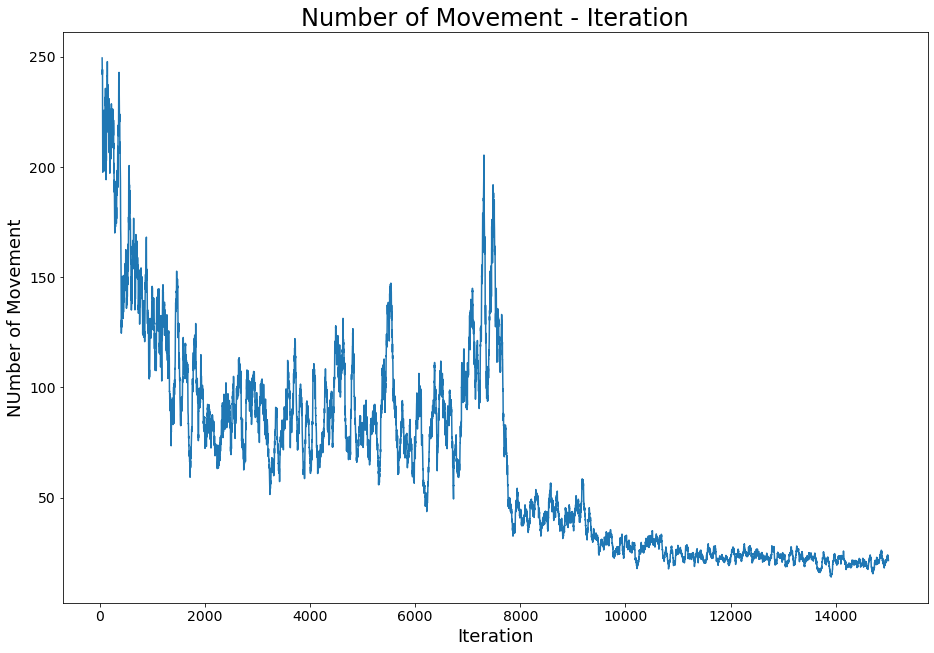

In [91]:
np.random.seed(10)
V,policy=WatkinsQ(LAMBDA=0.95, n_episodes=15000)

In [92]:
policy

{(4, 15, 0, 0): 'UZ',
 (4, 15, 0, 1): 'ZD',
 (4, 15, 0, 2): 'ZU',
 (4, 15, 0, 3): 'UU',
 (4, 15, 0, 4): 'UD',
 (4, 15, 1, 0): 'UU',
 (4, 15, 1, 1): 'ZD',
 (4, 15, 1, 2): 'DD',
 (4, 15, 1, 3): 'ZZ',
 (4, 15, 1, 4): 'ZD',
 (4, 15, 2, 0): 'UZ',
 (4, 15, 2, 1): 'ZZ',
 (4, 15, 2, 2): 'ZU',
 (4, 15, 2, 3): 'UU',
 (4, 15, 2, 4): 'DD',
 (4, 15, 3, 0): 'DU',
 (4, 15, 3, 1): 'ZD',
 (4, 15, 3, 2): 'ZZ',
 (4, 15, 3, 3): 'UZ',
 (4, 15, 3, 4): 'UD',
 (4, 15, 4, 0): 'DZ',
 (4, 15, 4, 1): 'UD',
 (4, 15, 4, 2): 'DZ',
 (4, 15, 4, 3): 'DU',
 (4, 15, 4, 4): 'UZ',
 (4, 16, 0, 0): 'ZU',
 (4, 16, 0, 1): 'DD',
 (4, 16, 0, 2): 'UZ',
 (4, 16, 0, 3): 'UD',
 (4, 16, 0, 4): 'UD',
 (4, 16, 1, 0): 'ZU',
 (4, 16, 1, 1): 'ZU',
 (4, 16, 1, 2): 'DU',
 (4, 16, 1, 3): 'DZ',
 (4, 16, 1, 4): 'DU',
 (4, 16, 2, 0): 'ZZ',
 (4, 16, 2, 1): 'DD',
 (4, 16, 2, 2): 'DU',
 (4, 16, 2, 3): 'DZ',
 (4, 16, 2, 4): 'DU',
 (4, 16, 3, 0): 'DD',
 (4, 16, 3, 1): 'DD',
 (4, 16, 3, 2): 'UU',
 (4, 16, 3, 3): 'ZD',
 (4, 16, 3, 4): 'UU',
 (4, 16, 4

In [93]:
V

{(4, 15, 0, 0): 0,
 (4, 15, 0, 1): 0,
 (4, 15, 0, 2): 0,
 (4, 15, 0, 3): 0,
 (4, 15, 0, 4): 0,
 (4, 15, 1, 0): 0,
 (4, 15, 1, 1): 0,
 (4, 15, 1, 2): 0,
 (4, 15, 1, 3): 0,
 (4, 15, 1, 4): 0,
 (4, 15, 2, 0): -0.5026008464709829,
 (4, 15, 2, 1): 0,
 (4, 15, 2, 2): 0,
 (4, 15, 2, 3): 0,
 (4, 15, 2, 4): 0,
 (4, 15, 3, 0): -1.0252438198346512,
 (4, 15, 3, 1): 0,
 (4, 15, 3, 2): 0,
 (4, 15, 3, 3): 0,
 (4, 15, 3, 4): 0,
 (4, 15, 4, 0): -1.4539700072928345,
 (4, 15, 4, 1): -0.4760833745215998,
 (4, 15, 4, 2): 0,
 (4, 15, 4, 3): 0,
 (4, 15, 4, 4): 0,
 (4, 16, 0, 0): 0,
 (4, 16, 0, 1): 0,
 (4, 16, 0, 2): 0,
 (4, 16, 0, 3): 0,
 (4, 16, 0, 4): 0,
 (4, 16, 1, 0): -0.48112869961549537,
 (4, 16, 1, 1): 0,
 (4, 16, 1, 2): 0,
 (4, 16, 1, 3): 0,
 (4, 16, 1, 4): 0,
 (4, 16, 2, 0): -0.8555584483656525,
 (4, 16, 2, 1): 0,
 (4, 16, 2, 2): 0,
 (4, 16, 2, 3): 0,
 (4, 16, 2, 4): 0,
 (4, 16, 3, 0): -1.4394601930367603,
 (4, 16, 3, 1): -0.548496465878661,
 (4, 16, 3, 2): 0,
 (4, 16, 3, 3): 0,
 (4, 16, 3, 4): 0,
 

### Lambda = 0

0 #############################################################################################


1 #############################################################################################


2 #############################################################################################


3 #############################################################################################


4 #############################################################################################


5 #############################################################################################


6 #############################################################################################


7 #############################################################################################


8 #############################################################################################


9 #############################################################################################


10 #################

83 #############################################################################################


84 #############################################################################################


85 #############################################################################################


86 #############################################################################################


87 #############################################################################################


88 #############################################################################################


89 #############################################################################################


90 #############################################################################################


91 #############################################################################################


92 #############################################################################################


93 #######

166 #############################################################################################


167 #############################################################################################


168 #############################################################################################


169 #############################################################################################


170 #############################################################################################


171 #############################################################################################


172 #############################################################################################


173 #############################################################################################


174 #############################################################################################


175 #############################################################################################




248 #############################################################################################


249 #############################################################################################


250 #############################################################################################


251 #############################################################################################


252 #############################################################################################


253 #############################################################################################


254 #############################################################################################


255 #############################################################################################


256 #############################################################################################


257 #############################################################################################




330 #############################################################################################


331 #############################################################################################


332 #############################################################################################


333 #############################################################################################


334 #############################################################################################


335 #############################################################################################


336 #############################################################################################


337 #############################################################################################


338 #############################################################################################


339 #############################################################################################




412 #############################################################################################


413 #############################################################################################


414 #############################################################################################


415 #############################################################################################


416 #############################################################################################


417 #############################################################################################


418 #############################################################################################


419 #############################################################################################


420 #############################################################################################


421 #############################################################################################




494 #############################################################################################


495 #############################################################################################


496 #############################################################################################


497 #############################################################################################


498 #############################################################################################


499 #############################################################################################


500 #############################################################################################


501 #############################################################################################


502 #############################################################################################


503 #############################################################################################




576 #############################################################################################


577 #############################################################################################


578 #############################################################################################


579 #############################################################################################


580 #############################################################################################


581 #############################################################################################


582 #############################################################################################


583 #############################################################################################


584 #############################################################################################


585 #############################################################################################




658 #############################################################################################


659 #############################################################################################


660 #############################################################################################


661 #############################################################################################


662 #############################################################################################


663 #############################################################################################


664 #############################################################################################


665 #############################################################################################


666 #############################################################################################


667 #############################################################################################




740 #############################################################################################


741 #############################################################################################


742 #############################################################################################


743 #############################################################################################


744 #############################################################################################


745 #############################################################################################


746 #############################################################################################


747 #############################################################################################


748 #############################################################################################


749 #############################################################################################




822 #############################################################################################


823 #############################################################################################


824 #############################################################################################


825 #############################################################################################


826 #############################################################################################


827 #############################################################################################


828 #############################################################################################


829 #############################################################################################


830 #############################################################################################


831 #############################################################################################




904 #############################################################################################


905 #############################################################################################


906 #############################################################################################


907 #############################################################################################


908 #############################################################################################


909 #############################################################################################


910 #############################################################################################


911 #############################################################################################


912 #############################################################################################


913 #############################################################################################




986 #############################################################################################


987 #############################################################################################


988 #############################################################################################


989 #############################################################################################


990 #############################################################################################


991 #############################################################################################


992 #############################################################################################


993 #############################################################################################


994 #############################################################################################


995 #############################################################################################




1068 #############################################################################################


1069 #############################################################################################


1070 #############################################################################################


1071 #############################################################################################


1072 #############################################################################################


1073 #############################################################################################


1074 #############################################################################################


1075 #############################################################################################


1076 #############################################################################################


1077 ######################################################################################

1150 #############################################################################################


1151 #############################################################################################


1152 #############################################################################################


1153 #############################################################################################


1154 #############################################################################################


1155 #############################################################################################


1156 #############################################################################################


1157 #############################################################################################


1158 #############################################################################################


1159 ######################################################################################

1232 #############################################################################################


1233 #############################################################################################


1234 #############################################################################################


1235 #############################################################################################


1236 #############################################################################################


1237 #############################################################################################


1238 #############################################################################################


1239 #############################################################################################


1240 #############################################################################################


1241 ######################################################################################

1314 #############################################################################################


1315 #############################################################################################


1316 #############################################################################################


1317 #############################################################################################


1318 #############################################################################################


1319 #############################################################################################


1320 #############################################################################################


1321 #############################################################################################


1322 #############################################################################################


1323 ######################################################################################

1396 #############################################################################################


1397 #############################################################################################


1398 #############################################################################################


1399 #############################################################################################


1400 #############################################################################################


1401 #############################################################################################


1402 #############################################################################################


1403 #############################################################################################


1404 #############################################################################################


1405 ######################################################################################

1478 #############################################################################################


1479 #############################################################################################


1480 #############################################################################################


1481 #############################################################################################


1482 #############################################################################################


1483 #############################################################################################


1484 #############################################################################################


1485 #############################################################################################


1486 #############################################################################################


1487 ######################################################################################

1560 #############################################################################################


1561 #############################################################################################


1562 #############################################################################################


1563 #############################################################################################


1564 #############################################################################################


1565 #############################################################################################


1566 #############################################################################################


1567 #############################################################################################


1568 #############################################################################################


1569 ######################################################################################

1642 #############################################################################################


1643 #############################################################################################


1644 #############################################################################################


1645 #############################################################################################


1646 #############################################################################################


1647 #############################################################################################


1648 #############################################################################################


1649 #############################################################################################


1650 #############################################################################################


1651 ######################################################################################

1724 #############################################################################################


1725 #############################################################################################


1726 #############################################################################################


1727 #############################################################################################


1728 #############################################################################################


1729 #############################################################################################


1730 #############################################################################################


1731 #############################################################################################


1732 #############################################################################################


1733 ######################################################################################

1806 #############################################################################################


1807 #############################################################################################


1808 #############################################################################################


1809 #############################################################################################


1810 #############################################################################################


1811 #############################################################################################


1812 #############################################################################################


1813 #############################################################################################


1814 #############################################################################################


1815 ######################################################################################

1888 #############################################################################################


1889 #############################################################################################


1890 #############################################################################################


1891 #############################################################################################


1892 #############################################################################################


1893 #############################################################################################


1894 #############################################################################################


1895 #############################################################################################


1896 #############################################################################################


1897 ######################################################################################

1970 #############################################################################################


1971 #############################################################################################


1972 #############################################################################################


1973 #############################################################################################


1974 #############################################################################################


1975 #############################################################################################


1976 #############################################################################################


1977 #############################################################################################


1978 #############################################################################################


1979 ######################################################################################

2052 #############################################################################################


2053 #############################################################################################


2054 #############################################################################################


2055 #############################################################################################


2056 #############################################################################################


2057 #############################################################################################


2058 #############################################################################################


2059 #############################################################################################


2060 #############################################################################################


2061 ######################################################################################

2134 #############################################################################################


2135 #############################################################################################


2136 #############################################################################################


2137 #############################################################################################


2138 #############################################################################################


2139 #############################################################################################


2140 #############################################################################################


2141 #############################################################################################


2142 #############################################################################################


2143 ######################################################################################

2216 #############################################################################################


2217 #############################################################################################


2218 #############################################################################################


2219 #############################################################################################


2220 #############################################################################################


2221 #############################################################################################


2222 #############################################################################################


2223 #############################################################################################


2224 #############################################################################################


2225 ######################################################################################

2298 #############################################################################################


2299 #############################################################################################


2300 #############################################################################################


2301 #############################################################################################


2302 #############################################################################################


2303 #############################################################################################


2304 #############################################################################################


2305 #############################################################################################


2306 #############################################################################################


2307 ######################################################################################

2380 #############################################################################################


2381 #############################################################################################


2382 #############################################################################################


2383 #############################################################################################


2384 #############################################################################################


2385 #############################################################################################


2386 #############################################################################################


2387 #############################################################################################


2388 #############################################################################################


2389 ######################################################################################

2462 #############################################################################################


2463 #############################################################################################


2464 #############################################################################################


2465 #############################################################################################


2466 #############################################################################################


2467 #############################################################################################


2468 #############################################################################################


2469 #############################################################################################


2470 #############################################################################################


2471 ######################################################################################

2544 #############################################################################################


2545 #############################################################################################


2546 #############################################################################################


2547 #############################################################################################


2548 #############################################################################################


2549 #############################################################################################


2550 #############################################################################################


2551 #############################################################################################


2552 #############################################################################################


2553 ######################################################################################

2626 #############################################################################################


2627 #############################################################################################


2628 #############################################################################################


2629 #############################################################################################


2630 #############################################################################################


2631 #############################################################################################


2632 #############################################################################################


2633 #############################################################################################


2634 #############################################################################################


2635 ######################################################################################

2708 #############################################################################################


2709 #############################################################################################


2710 #############################################################################################


2711 #############################################################################################


2712 #############################################################################################


2713 #############################################################################################


2714 #############################################################################################


2715 #############################################################################################


2716 #############################################################################################


2717 ######################################################################################

2790 #############################################################################################


2791 #############################################################################################


2792 #############################################################################################


2793 #############################################################################################


2794 #############################################################################################


2795 #############################################################################################


2796 #############################################################################################


2797 #############################################################################################


2798 #############################################################################################


2799 ######################################################################################

2872 #############################################################################################


2873 #############################################################################################


2874 #############################################################################################


2875 #############################################################################################


2876 #############################################################################################


2877 #############################################################################################


2878 #############################################################################################


2879 #############################################################################################


2880 #############################################################################################


2881 ######################################################################################

2954 #############################################################################################


2955 #############################################################################################


2956 #############################################################################################


2957 #############################################################################################


2958 #############################################################################################


2959 #############################################################################################


2960 #############################################################################################


2961 #############################################################################################


2962 #############################################################################################


2963 ######################################################################################

3036 #############################################################################################


3037 #############################################################################################


3038 #############################################################################################


3039 #############################################################################################


3040 #############################################################################################


3041 #############################################################################################


3042 #############################################################################################


3043 #############################################################################################


3044 #############################################################################################


3045 ######################################################################################

3118 #############################################################################################


3119 #############################################################################################


3120 #############################################################################################


3121 #############################################################################################


3122 #############################################################################################


3123 #############################################################################################


3124 #############################################################################################


3125 #############################################################################################


3126 #############################################################################################


3127 ######################################################################################

3200 #############################################################################################


3201 #############################################################################################


3202 #############################################################################################


3203 #############################################################################################


3204 #############################################################################################


3205 #############################################################################################


3206 #############################################################################################


3207 #############################################################################################


3208 #############################################################################################


3209 ######################################################################################

3282 #############################################################################################


3283 #############################################################################################


3284 #############################################################################################


3285 #############################################################################################


3286 #############################################################################################


3287 #############################################################################################


3288 #############################################################################################


3289 #############################################################################################


3290 #############################################################################################


3291 ######################################################################################

3364 #############################################################################################


3365 #############################################################################################


3366 #############################################################################################


3367 #############################################################################################


3368 #############################################################################################


3369 #############################################################################################


3370 #############################################################################################


3371 #############################################################################################


3372 #############################################################################################


3373 ######################################################################################

3446 #############################################################################################


3447 #############################################################################################


3448 #############################################################################################


3449 #############################################################################################


3450 #############################################################################################


3451 #############################################################################################


3452 #############################################################################################


3453 #############################################################################################


3454 #############################################################################################


3455 ######################################################################################

3528 #############################################################################################


3529 #############################################################################################


3530 #############################################################################################


3531 #############################################################################################


3532 #############################################################################################


3533 #############################################################################################


3534 #############################################################################################


3535 #############################################################################################


3536 #############################################################################################


3537 ######################################################################################

3610 #############################################################################################


3611 #############################################################################################


3612 #############################################################################################


3613 #############################################################################################


3614 #############################################################################################


3615 #############################################################################################


3616 #############################################################################################


3617 #############################################################################################


3618 #############################################################################################


3619 ######################################################################################

3692 #############################################################################################


3693 #############################################################################################


3694 #############################################################################################


3695 #############################################################################################


3696 #############################################################################################


3697 #############################################################################################


3698 #############################################################################################


3699 #############################################################################################


3700 #############################################################################################


3701 ######################################################################################

3774 #############################################################################################


3775 #############################################################################################


3776 #############################################################################################


3777 #############################################################################################


3778 #############################################################################################


3779 #############################################################################################


3780 #############################################################################################


3781 #############################################################################################


3782 #############################################################################################


3783 ######################################################################################

3856 #############################################################################################


3857 #############################################################################################


3858 #############################################################################################


3859 #############################################################################################


3860 #############################################################################################


3861 #############################################################################################


3862 #############################################################################################


3863 #############################################################################################


3864 #############################################################################################


3865 ######################################################################################

3938 #############################################################################################


3939 #############################################################################################


3940 #############################################################################################


3941 #############################################################################################


3942 #############################################################################################


3943 #############################################################################################


3944 #############################################################################################


3945 #############################################################################################


3946 #############################################################################################


3947 ######################################################################################

4020 #############################################################################################


4021 #############################################################################################


4022 #############################################################################################


4023 #############################################################################################


4024 #############################################################################################


4025 #############################################################################################


4026 #############################################################################################


4027 #############################################################################################


4028 #############################################################################################


4029 ######################################################################################

4102 #############################################################################################


4103 #############################################################################################


4104 #############################################################################################


4105 #############################################################################################


4106 #############################################################################################


4107 #############################################################################################


4108 #############################################################################################


4109 #############################################################################################


4110 #############################################################################################


4111 ######################################################################################

4184 #############################################################################################


4185 #############################################################################################


4186 #############################################################################################


4187 #############################################################################################


4188 #############################################################################################


4189 #############################################################################################


4190 #############################################################################################


4191 #############################################################################################


4192 #############################################################################################


4193 ######################################################################################

4266 #############################################################################################


4267 #############################################################################################


4268 #############################################################################################


4269 #############################################################################################


4270 #############################################################################################


4271 #############################################################################################


4272 #############################################################################################


4273 #############################################################################################


4274 #############################################################################################


4275 ######################################################################################

4348 #############################################################################################


4349 #############################################################################################


4350 #############################################################################################


4351 #############################################################################################


4352 #############################################################################################


4353 #############################################################################################


4354 #############################################################################################


4355 #############################################################################################


4356 #############################################################################################


4357 ######################################################################################

4430 #############################################################################################


4431 #############################################################################################


4432 #############################################################################################


4433 #############################################################################################


4434 #############################################################################################


4435 #############################################################################################


4436 #############################################################################################


4437 #############################################################################################


4438 #############################################################################################


4439 ######################################################################################

4512 #############################################################################################


4513 #############################################################################################


4514 #############################################################################################


4515 #############################################################################################


4516 #############################################################################################


4517 #############################################################################################


4518 #############################################################################################


4519 #############################################################################################


4520 #############################################################################################


4521 ######################################################################################

4594 #############################################################################################


4595 #############################################################################################


4596 #############################################################################################


4597 #############################################################################################


4598 #############################################################################################


4599 #############################################################################################


4600 #############################################################################################


4601 #############################################################################################


4602 #############################################################################################


4603 ######################################################################################

4676 #############################################################################################


4677 #############################################################################################


4678 #############################################################################################


4679 #############################################################################################


4680 #############################################################################################


4681 #############################################################################################


4682 #############################################################################################


4683 #############################################################################################


4684 #############################################################################################


4685 ######################################################################################

4758 #############################################################################################


4759 #############################################################################################


4760 #############################################################################################


4761 #############################################################################################


4762 #############################################################################################


4763 #############################################################################################


4764 #############################################################################################


4765 #############################################################################################


4766 #############################################################################################


4767 ######################################################################################

4840 #############################################################################################


4841 #############################################################################################


4842 #############################################################################################


4843 #############################################################################################


4844 #############################################################################################


4845 #############################################################################################


4846 #############################################################################################


4847 #############################################################################################


4848 #############################################################################################


4849 ######################################################################################

4922 #############################################################################################


4923 #############################################################################################


4924 #############################################################################################


4925 #############################################################################################


4926 #############################################################################################


4927 #############################################################################################


4928 #############################################################################################


4929 #############################################################################################


4930 #############################################################################################


4931 ######################################################################################

5004 #############################################################################################


5005 #############################################################################################


5006 #############################################################################################


5007 #############################################################################################


5008 #############################################################################################


5009 #############################################################################################


5010 #############################################################################################


5011 #############################################################################################


5012 #############################################################################################


5013 ######################################################################################

5086 #############################################################################################


5087 #############################################################################################


5088 #############################################################################################


5089 #############################################################################################


5090 #############################################################################################


5091 #############################################################################################


5092 #############################################################################################


5093 #############################################################################################


5094 #############################################################################################


5095 ######################################################################################

5168 #############################################################################################


5169 #############################################################################################


5170 #############################################################################################


5171 #############################################################################################


5172 #############################################################################################


5173 #############################################################################################


5174 #############################################################################################


5175 #############################################################################################


5176 #############################################################################################


5177 ######################################################################################

5250 #############################################################################################


5251 #############################################################################################


5252 #############################################################################################


5253 #############################################################################################


5254 #############################################################################################


5255 #############################################################################################


5256 #############################################################################################


5257 #############################################################################################


5258 #############################################################################################


5259 ######################################################################################

5332 #############################################################################################


5333 #############################################################################################


5334 #############################################################################################


5335 #############################################################################################


5336 #############################################################################################


5337 #############################################################################################


5338 #############################################################################################


5339 #############################################################################################


5340 #############################################################################################


5341 ######################################################################################

5414 #############################################################################################


5415 #############################################################################################


5416 #############################################################################################


5417 #############################################################################################


5418 #############################################################################################


5419 #############################################################################################


5420 #############################################################################################


5421 #############################################################################################


5422 #############################################################################################


5423 ######################################################################################

5496 #############################################################################################


5497 #############################################################################################


5498 #############################################################################################


5499 #############################################################################################


5500 #############################################################################################


5501 #############################################################################################


5502 #############################################################################################


5503 #############################################################################################


5504 #############################################################################################


5505 ######################################################################################

5578 #############################################################################################


5579 #############################################################################################


5580 #############################################################################################


5581 #############################################################################################


5582 #############################################################################################


5583 #############################################################################################


5584 #############################################################################################


5585 #############################################################################################


5586 #############################################################################################


5587 ######################################################################################

5660 #############################################################################################


5661 #############################################################################################


5662 #############################################################################################


5663 #############################################################################################


5664 #############################################################################################


5665 #############################################################################################


5666 #############################################################################################


5667 #############################################################################################


5668 #############################################################################################


5669 ######################################################################################

5742 #############################################################################################


5743 #############################################################################################


5744 #############################################################################################


5745 #############################################################################################


5746 #############################################################################################


5747 #############################################################################################


5748 #############################################################################################


5749 #############################################################################################


5750 #############################################################################################


5751 ######################################################################################

5824 #############################################################################################


5825 #############################################################################################


5826 #############################################################################################


5827 #############################################################################################


5828 #############################################################################################


5829 #############################################################################################


5830 #############################################################################################


5831 #############################################################################################


5832 #############################################################################################


5833 ######################################################################################

5906 #############################################################################################


5907 #############################################################################################


5908 #############################################################################################


5909 #############################################################################################


5910 #############################################################################################


5911 #############################################################################################


5912 #############################################################################################


5913 #############################################################################################


5914 #############################################################################################


5915 ######################################################################################

5988 #############################################################################################


5989 #############################################################################################


5990 #############################################################################################


5991 #############################################################################################


5992 #############################################################################################


5993 #############################################################################################


5994 #############################################################################################


5995 #############################################################################################


5996 #############################################################################################


5997 ######################################################################################

6070 #############################################################################################


6071 #############################################################################################


6072 #############################################################################################


6073 #############################################################################################


6074 #############################################################################################


6075 #############################################################################################


6076 #############################################################################################


6077 #############################################################################################


6078 #############################################################################################


6079 ######################################################################################

6152 #############################################################################################


6153 #############################################################################################


6154 #############################################################################################


6155 #############################################################################################


6156 #############################################################################################


6157 #############################################################################################


6158 #############################################################################################


6159 #############################################################################################


6160 #############################################################################################


6161 ######################################################################################

6234 #############################################################################################


6235 #############################################################################################


6236 #############################################################################################


6237 #############################################################################################


6238 #############################################################################################


6239 #############################################################################################


6240 #############################################################################################


6241 #############################################################################################


6242 #############################################################################################


6243 ######################################################################################

6316 #############################################################################################


6317 #############################################################################################


6318 #############################################################################################


6319 #############################################################################################


6320 #############################################################################################


6321 #############################################################################################


6322 #############################################################################################


6323 #############################################################################################


6324 #############################################################################################


6325 ######################################################################################

6398 #############################################################################################


6399 #############################################################################################


6400 #############################################################################################


6401 #############################################################################################


6402 #############################################################################################


6403 #############################################################################################


6404 #############################################################################################


6405 #############################################################################################


6406 #############################################################################################


6407 ######################################################################################

6480 #############################################################################################


6481 #############################################################################################


6482 #############################################################################################


6483 #############################################################################################


6484 #############################################################################################


6485 #############################################################################################


6486 #############################################################################################


6487 #############################################################################################


6488 #############################################################################################


6489 ######################################################################################

6562 #############################################################################################


6563 #############################################################################################


6564 #############################################################################################


6565 #############################################################################################


6566 #############################################################################################


6567 #############################################################################################


6568 #############################################################################################


6569 #############################################################################################


6570 #############################################################################################


6571 ######################################################################################

6644 #############################################################################################


6645 #############################################################################################


6646 #############################################################################################


6647 #############################################################################################


6648 #############################################################################################


6649 #############################################################################################


6650 #############################################################################################


6651 #############################################################################################


6652 #############################################################################################


6653 ######################################################################################

6726 #############################################################################################


6727 #############################################################################################


6728 #############################################################################################


6729 #############################################################################################


6730 #############################################################################################


6731 #############################################################################################


6732 #############################################################################################


6733 #############################################################################################


6734 #############################################################################################


6735 ######################################################################################

6808 #############################################################################################


6809 #############################################################################################


6810 #############################################################################################


6811 #############################################################################################


6812 #############################################################################################


6813 #############################################################################################


6814 #############################################################################################


6815 #############################################################################################


6816 #############################################################################################


6817 ######################################################################################

6890 #############################################################################################


6891 #############################################################################################


6892 #############################################################################################


6893 #############################################################################################


6894 #############################################################################################


6895 #############################################################################################


6896 #############################################################################################


6897 #############################################################################################


6898 #############################################################################################


6899 ######################################################################################

6972 #############################################################################################


6973 #############################################################################################


6974 #############################################################################################


6975 #############################################################################################


6976 #############################################################################################


6977 #############################################################################################


6978 #############################################################################################


6979 #############################################################################################


6980 #############################################################################################


6981 ######################################################################################

7054 #############################################################################################


7055 #############################################################################################


7056 #############################################################################################


7057 #############################################################################################


7058 #############################################################################################


7059 #############################################################################################


7060 #############################################################################################


7061 #############################################################################################


7062 #############################################################################################


7063 ######################################################################################

7136 #############################################################################################


7137 #############################################################################################


7138 #############################################################################################


7139 #############################################################################################


7140 #############################################################################################


7141 #############################################################################################


7142 #############################################################################################


7143 #############################################################################################


7144 #############################################################################################


7145 ######################################################################################

7218 #############################################################################################


7219 #############################################################################################


7220 #############################################################################################


7221 #############################################################################################


7222 #############################################################################################


7223 #############################################################################################


7224 #############################################################################################


7225 #############################################################################################


7226 #############################################################################################


7227 ######################################################################################

7300 #############################################################################################


7301 #############################################################################################


7302 #############################################################################################


7303 #############################################################################################


7304 #############################################################################################


7305 #############################################################################################


7306 #############################################################################################


7307 #############################################################################################


7308 #############################################################################################


7309 ######################################################################################

7382 #############################################################################################


7383 #############################################################################################


7384 #############################################################################################


7385 #############################################################################################


7386 #############################################################################################


7387 #############################################################################################


7388 #############################################################################################


7389 #############################################################################################


7390 #############################################################################################


7391 ######################################################################################

7464 #############################################################################################


7465 #############################################################################################


7466 #############################################################################################


7467 #############################################################################################


7468 #############################################################################################


7469 #############################################################################################


7470 #############################################################################################


7471 #############################################################################################


7472 #############################################################################################


7473 ######################################################################################

7546 #############################################################################################


7547 #############################################################################################


7548 #############################################################################################


7549 #############################################################################################


7550 #############################################################################################


7551 #############################################################################################


7552 #############################################################################################


7553 #############################################################################################


7554 #############################################################################################


7555 ######################################################################################

7628 #############################################################################################


7629 #############################################################################################


7630 #############################################################################################


7631 #############################################################################################


7632 #############################################################################################


7633 #############################################################################################


7634 #############################################################################################


7635 #############################################################################################


7636 #############################################################################################


7637 ######################################################################################

7710 #############################################################################################


7711 #############################################################################################


7712 #############################################################################################


7713 #############################################################################################


7714 #############################################################################################


7715 #############################################################################################


7716 #############################################################################################


7717 #############################################################################################


7718 #############################################################################################


7719 ######################################################################################

7792 #############################################################################################


7793 #############################################################################################


7794 #############################################################################################


7795 #############################################################################################


7796 #############################################################################################


7797 #############################################################################################


7798 #############################################################################################


7799 #############################################################################################


7800 #############################################################################################


7801 ######################################################################################

7874 #############################################################################################


7875 #############################################################################################


7876 #############################################################################################


7877 #############################################################################################


7878 #############################################################################################


7879 #############################################################################################


7880 #############################################################################################


7881 #############################################################################################


7882 #############################################################################################


7883 ######################################################################################

7956 #############################################################################################


7957 #############################################################################################


7958 #############################################################################################


7959 #############################################################################################


7960 #############################################################################################


7961 #############################################################################################


7962 #############################################################################################


7963 #############################################################################################


7964 #############################################################################################


7965 ######################################################################################

8038 #############################################################################################


8039 #############################################################################################


8040 #############################################################################################


8041 #############################################################################################


8042 #############################################################################################


8043 #############################################################################################


8044 #############################################################################################


8045 #############################################################################################


8046 #############################################################################################


8047 ######################################################################################

8120 #############################################################################################


8121 #############################################################################################


8122 #############################################################################################


8123 #############################################################################################


8124 #############################################################################################


8125 #############################################################################################


8126 #############################################################################################


8127 #############################################################################################


8128 #############################################################################################


8129 ######################################################################################

8202 #############################################################################################


8203 #############################################################################################


8204 #############################################################################################


8205 #############################################################################################


8206 #############################################################################################


8207 #############################################################################################


8208 #############################################################################################


8209 #############################################################################################


8210 #############################################################################################


8211 ######################################################################################

8284 #############################################################################################


8285 #############################################################################################


8286 #############################################################################################


8287 #############################################################################################


8288 #############################################################################################


8289 #############################################################################################


8290 #############################################################################################


8291 #############################################################################################


8292 #############################################################################################


8293 ######################################################################################

8366 #############################################################################################


8367 #############################################################################################


8368 #############################################################################################


8369 #############################################################################################


8370 #############################################################################################


8371 #############################################################################################


8372 #############################################################################################


8373 #############################################################################################


8374 #############################################################################################


8375 ######################################################################################

8448 #############################################################################################


8449 #############################################################################################


8450 #############################################################################################


8451 #############################################################################################


8452 #############################################################################################


8453 #############################################################################################


8454 #############################################################################################


8455 #############################################################################################


8456 #############################################################################################


8457 ######################################################################################

8530 #############################################################################################


8531 #############################################################################################


8532 #############################################################################################


8533 #############################################################################################


8534 #############################################################################################


8535 #############################################################################################


8536 #############################################################################################


8537 #############################################################################################


8538 #############################################################################################


8539 ######################################################################################

8612 #############################################################################################


8613 #############################################################################################


8614 #############################################################################################


8615 #############################################################################################


8616 #############################################################################################


8617 #############################################################################################


8618 #############################################################################################


8619 #############################################################################################


8620 #############################################################################################


8621 ######################################################################################

8694 #############################################################################################


8695 #############################################################################################


8696 #############################################################################################


8697 #############################################################################################


8698 #############################################################################################


8699 #############################################################################################


8700 #############################################################################################


8701 #############################################################################################


8702 #############################################################################################


8703 ######################################################################################

8776 #############################################################################################


8777 #############################################################################################


8778 #############################################################################################


8779 #############################################################################################


8780 #############################################################################################


8781 #############################################################################################


8782 #############################################################################################


8783 #############################################################################################


8784 #############################################################################################


8785 ######################################################################################

8858 #############################################################################################


8859 #############################################################################################


8860 #############################################################################################


8861 #############################################################################################


8862 #############################################################################################


8863 #############################################################################################


8864 #############################################################################################


8865 #############################################################################################


8866 #############################################################################################


8867 ######################################################################################

8940 #############################################################################################


8941 #############################################################################################


8942 #############################################################################################


8943 #############################################################################################


8944 #############################################################################################


8945 #############################################################################################


8946 #############################################################################################


8947 #############################################################################################


8948 #############################################################################################


8949 ######################################################################################

9022 #############################################################################################


9023 #############################################################################################


9024 #############################################################################################


9025 #############################################################################################


9026 #############################################################################################


9027 #############################################################################################


9028 #############################################################################################


9029 #############################################################################################


9030 #############################################################################################


9031 ######################################################################################

9104 #############################################################################################


9105 #############################################################################################


9106 #############################################################################################


9107 #############################################################################################


9108 #############################################################################################


9109 #############################################################################################


9110 #############################################################################################


9111 #############################################################################################


9112 #############################################################################################


9113 ######################################################################################

9186 #############################################################################################


9187 #############################################################################################


9188 #############################################################################################


9189 #############################################################################################


9190 #############################################################################################


9191 #############################################################################################


9192 #############################################################################################


9193 #############################################################################################


9194 #############################################################################################


9195 ######################################################################################

9268 #############################################################################################


9269 #############################################################################################


9270 #############################################################################################


9271 #############################################################################################


9272 #############################################################################################


9273 #############################################################################################


9274 #############################################################################################


9275 #############################################################################################


9276 #############################################################################################


9277 ######################################################################################

9350 #############################################################################################


9351 #############################################################################################


9352 #############################################################################################


9353 #############################################################################################


9354 #############################################################################################


9355 #############################################################################################


9356 #############################################################################################


9357 #############################################################################################


9358 #############################################################################################


9359 ######################################################################################

9432 #############################################################################################


9433 #############################################################################################


9434 #############################################################################################


9435 #############################################################################################


9436 #############################################################################################


9437 #############################################################################################


9438 #############################################################################################


9439 #############################################################################################


9440 #############################################################################################


9441 ######################################################################################

9514 #############################################################################################


9515 #############################################################################################


9516 #############################################################################################


9517 #############################################################################################


9518 #############################################################################################


9519 #############################################################################################


9520 #############################################################################################


9521 #############################################################################################


9522 #############################################################################################


9523 ######################################################################################

9596 #############################################################################################


9597 #############################################################################################


9598 #############################################################################################


9599 #############################################################################################


9600 #############################################################################################


9601 #############################################################################################


9602 #############################################################################################


9603 #############################################################################################


9604 #############################################################################################


9605 ######################################################################################

9678 #############################################################################################


9679 #############################################################################################


9680 #############################################################################################


9681 #############################################################################################


9682 #############################################################################################


9683 #############################################################################################


9684 #############################################################################################


9685 #############################################################################################


9686 #############################################################################################


9687 ######################################################################################

9760 #############################################################################################


9761 #############################################################################################


9762 #############################################################################################


9763 #############################################################################################


9764 #############################################################################################


9765 #############################################################################################


9766 #############################################################################################


9767 #############################################################################################


9768 #############################################################################################


9769 ######################################################################################

9842 #############################################################################################


9843 #############################################################################################


9844 #############################################################################################


9845 #############################################################################################


9846 #############################################################################################


9847 #############################################################################################


9848 #############################################################################################


9849 #############################################################################################


9850 #############################################################################################


9851 ######################################################################################

9925 #############################################################################################


9926 #############################################################################################


9927 #############################################################################################


9928 #############################################################################################


9929 #############################################################################################


9930 #############################################################################################


9931 #############################################################################################


9932 #############################################################################################


9933 #############################################################################################


9934 ######################################################################################

10007 #############################################################################################


10008 #############################################################################################


10009 #############################################################################################


10010 #############################################################################################


10011 #############################################################################################


10012 #############################################################################################


10013 #############################################################################################


10014 #############################################################################################


10015 #############################################################################################


10016 ############################################################################

10088 #############################################################################################


10089 #############################################################################################


10090 #############################################################################################


10091 #############################################################################################


10092 #############################################################################################


10093 #############################################################################################


10094 #############################################################################################


10095 #############################################################################################


10096 #############################################################################################


10097 ############################################################################

10169 #############################################################################################


10170 #############################################################################################


10171 #############################################################################################


10172 #############################################################################################


10173 #############################################################################################


10174 #############################################################################################


10175 #############################################################################################


10176 #############################################################################################


10177 #############################################################################################


10178 ############################################################################

10250 #############################################################################################


10251 #############################################################################################


10252 #############################################################################################


10253 #############################################################################################


10254 #############################################################################################


10255 #############################################################################################


10256 #############################################################################################


10257 #############################################################################################


10258 #############################################################################################


10259 ############################################################################

10331 #############################################################################################


10332 #############################################################################################


10333 #############################################################################################


10334 #############################################################################################


10335 #############################################################################################


10336 #############################################################################################


10337 #############################################################################################


10338 #############################################################################################


10339 #############################################################################################


10340 ############################################################################

10412 #############################################################################################


10413 #############################################################################################


10414 #############################################################################################


10415 #############################################################################################


10416 #############################################################################################


10417 #############################################################################################


10418 #############################################################################################


10419 #############################################################################################


10420 #############################################################################################


10421 ############################################################################

10493 #############################################################################################


10494 #############################################################################################


10495 #############################################################################################


10496 #############################################################################################


10497 #############################################################################################


10498 #############################################################################################


10499 #############################################################################################


10500 #############################################################################################


10501 #############################################################################################


10502 ############################################################################

10574 #############################################################################################


10575 #############################################################################################


10576 #############################################################################################


10577 #############################################################################################


10578 #############################################################################################


10579 #############################################################################################


10580 #############################################################################################


10581 #############################################################################################


10582 #############################################################################################


10583 ############################################################################

10655 #############################################################################################


10656 #############################################################################################


10657 #############################################################################################


10658 #############################################################################################


10659 #############################################################################################


10660 #############################################################################################


10661 #############################################################################################


10662 #############################################################################################


10663 #############################################################################################


10664 ############################################################################

10736 #############################################################################################


10737 #############################################################################################


10738 #############################################################################################


10739 #############################################################################################


10740 #############################################################################################


10741 #############################################################################################


10742 #############################################################################################


10743 #############################################################################################


10744 #############################################################################################


10745 ############################################################################

10817 #############################################################################################


10818 #############################################################################################


10819 #############################################################################################


10820 #############################################################################################


10821 #############################################################################################


10822 #############################################################################################


10823 #############################################################################################


10824 #############################################################################################


10825 #############################################################################################


10826 ############################################################################

10898 #############################################################################################


10899 #############################################################################################


10900 #############################################################################################


10901 #############################################################################################


10902 #############################################################################################


10903 #############################################################################################


10904 #############################################################################################


10905 #############################################################################################


10906 #############################################################################################


10907 ############################################################################

10979 #############################################################################################


10980 #############################################################################################


10981 #############################################################################################


10982 #############################################################################################


10983 #############################################################################################


10984 #############################################################################################


10985 #############################################################################################


10986 #############################################################################################


10987 #############################################################################################


10988 ############################################################################

11060 #############################################################################################


11061 #############################################################################################


11062 #############################################################################################


11063 #############################################################################################


11064 #############################################################################################


11065 #############################################################################################


11066 #############################################################################################


11067 #############################################################################################


11068 #############################################################################################


11069 ############################################################################

11141 #############################################################################################


11142 #############################################################################################


11143 #############################################################################################


11144 #############################################################################################


11145 #############################################################################################


11146 #############################################################################################


11147 #############################################################################################


11148 #############################################################################################


11149 #############################################################################################


11150 ############################################################################

11222 #############################################################################################


11223 #############################################################################################


11224 #############################################################################################


11225 #############################################################################################


11226 #############################################################################################


11227 #############################################################################################


11228 #############################################################################################


11229 #############################################################################################


11230 #############################################################################################


11231 ############################################################################

11303 #############################################################################################


11304 #############################################################################################


11305 #############################################################################################


11306 #############################################################################################


11307 #############################################################################################


11308 #############################################################################################


11309 #############################################################################################


11310 #############################################################################################


11311 #############################################################################################


11312 ############################################################################

11384 #############################################################################################


11385 #############################################################################################


11386 #############################################################################################


11387 #############################################################################################


11388 #############################################################################################


11389 #############################################################################################


11390 #############################################################################################


11391 #############################################################################################


11392 #############################################################################################


11393 ############################################################################

11465 #############################################################################################


11466 #############################################################################################


11467 #############################################################################################


11468 #############################################################################################


11469 #############################################################################################


11470 #############################################################################################


11471 #############################################################################################


11472 #############################################################################################


11473 #############################################################################################


11474 ############################################################################

11546 #############################################################################################


11547 #############################################################################################


11548 #############################################################################################


11549 #############################################################################################


11550 #############################################################################################


11551 #############################################################################################


11552 #############################################################################################


11553 #############################################################################################


11554 #############################################################################################


11555 ############################################################################

11627 #############################################################################################


11628 #############################################################################################


11629 #############################################################################################


11630 #############################################################################################


11631 #############################################################################################


11632 #############################################################################################


11633 #############################################################################################


11634 #############################################################################################


11635 #############################################################################################


11636 ############################################################################

11708 #############################################################################################


11709 #############################################################################################


11710 #############################################################################################


11711 #############################################################################################


11712 #############################################################################################


11713 #############################################################################################


11714 #############################################################################################


11715 #############################################################################################


11716 #############################################################################################


11717 ############################################################################

11789 #############################################################################################


11790 #############################################################################################


11791 #############################################################################################


11792 #############################################################################################


11793 #############################################################################################


11794 #############################################################################################


11795 #############################################################################################


11796 #############################################################################################


11797 #############################################################################################


11798 ############################################################################

11870 #############################################################################################


11871 #############################################################################################


11872 #############################################################################################


11873 #############################################################################################


11874 #############################################################################################


11875 #############################################################################################


11876 #############################################################################################


11877 #############################################################################################


11878 #############################################################################################


11879 ############################################################################

11951 #############################################################################################


11952 #############################################################################################


11953 #############################################################################################


11954 #############################################################################################


11955 #############################################################################################


11956 #############################################################################################


11957 #############################################################################################


11958 #############################################################################################


11959 #############################################################################################


11960 ############################################################################

12032 #############################################################################################


12033 #############################################################################################


12034 #############################################################################################


12035 #############################################################################################


12036 #############################################################################################


12037 #############################################################################################


12038 #############################################################################################


12039 #############################################################################################


12040 #############################################################################################


12041 ############################################################################

12113 #############################################################################################


12114 #############################################################################################


12115 #############################################################################################


12116 #############################################################################################


12117 #############################################################################################


12118 #############################################################################################


12119 #############################################################################################


12120 #############################################################################################


12121 #############################################################################################


12122 ############################################################################

12194 #############################################################################################


12195 #############################################################################################


12196 #############################################################################################


12197 #############################################################################################


12198 #############################################################################################


12199 #############################################################################################


12200 #############################################################################################


12201 #############################################################################################


12202 #############################################################################################


12203 ############################################################################

12275 #############################################################################################


12276 #############################################################################################


12277 #############################################################################################


12278 #############################################################################################


12279 #############################################################################################


12280 #############################################################################################


12281 #############################################################################################


12282 #############################################################################################


12283 #############################################################################################


12284 ############################################################################

12356 #############################################################################################


12357 #############################################################################################


12358 #############################################################################################


12359 #############################################################################################


12360 #############################################################################################


12361 #############################################################################################


12362 #############################################################################################


12363 #############################################################################################


12364 #############################################################################################


12365 ############################################################################

12437 #############################################################################################


12438 #############################################################################################


12439 #############################################################################################


12440 #############################################################################################


12441 #############################################################################################


12442 #############################################################################################


12443 #############################################################################################


12444 #############################################################################################


12445 #############################################################################################


12446 ############################################################################

12518 #############################################################################################


12519 #############################################################################################


12520 #############################################################################################


12521 #############################################################################################


12522 #############################################################################################


12523 #############################################################################################


12524 #############################################################################################


12525 #############################################################################################


12526 #############################################################################################


12527 ############################################################################

12599 #############################################################################################


12600 #############################################################################################


12601 #############################################################################################


12602 #############################################################################################


12603 #############################################################################################


12604 #############################################################################################


12605 #############################################################################################


12606 #############################################################################################


12607 #############################################################################################


12608 ############################################################################

12680 #############################################################################################


12681 #############################################################################################


12682 #############################################################################################


12683 #############################################################################################


12684 #############################################################################################


12685 #############################################################################################


12686 #############################################################################################


12687 #############################################################################################


12688 #############################################################################################


12689 ############################################################################

12761 #############################################################################################


12762 #############################################################################################


12763 #############################################################################################


12764 #############################################################################################


12765 #############################################################################################


12766 #############################################################################################


12767 #############################################################################################


12768 #############################################################################################


12769 #############################################################################################


12770 ############################################################################

12842 #############################################################################################


12843 #############################################################################################


12844 #############################################################################################


12845 #############################################################################################


12846 #############################################################################################


12847 #############################################################################################


12848 #############################################################################################


12849 #############################################################################################


12850 #############################################################################################


12851 ############################################################################

12923 #############################################################################################


12924 #############################################################################################


12925 #############################################################################################


12926 #############################################################################################


12927 #############################################################################################


12928 #############################################################################################


12929 #############################################################################################


12930 #############################################################################################


12931 #############################################################################################


12932 ############################################################################

13004 #############################################################################################


13005 #############################################################################################


13006 #############################################################################################


13007 #############################################################################################


13008 #############################################################################################


13009 #############################################################################################


13010 #############################################################################################


13011 #############################################################################################


13012 #############################################################################################


13013 ############################################################################

13085 #############################################################################################


13086 #############################################################################################


13087 #############################################################################################


13088 #############################################################################################


13089 #############################################################################################


13090 #############################################################################################


13091 #############################################################################################


13092 #############################################################################################


13093 #############################################################################################


13094 ############################################################################

13166 #############################################################################################


13167 #############################################################################################


13168 #############################################################################################


13169 #############################################################################################


13170 #############################################################################################


13171 #############################################################################################


13172 #############################################################################################


13173 #############################################################################################


13174 #############################################################################################


13175 ############################################################################

13247 #############################################################################################


13248 #############################################################################################


13249 #############################################################################################


13250 #############################################################################################


13251 #############################################################################################


13252 #############################################################################################


13253 #############################################################################################


13254 #############################################################################################


13255 #############################################################################################


13256 ############################################################################

13328 #############################################################################################


13329 #############################################################################################


13330 #############################################################################################


13331 #############################################################################################


13332 #############################################################################################


13333 #############################################################################################


13334 #############################################################################################


13335 #############################################################################################


13336 #############################################################################################


13337 ############################################################################

13409 #############################################################################################


13410 #############################################################################################


13411 #############################################################################################


13412 #############################################################################################


13413 #############################################################################################


13414 #############################################################################################


13415 #############################################################################################


13416 #############################################################################################


13417 #############################################################################################


13418 ############################################################################

13490 #############################################################################################


13491 #############################################################################################


13492 #############################################################################################


13493 #############################################################################################


13494 #############################################################################################


13495 #############################################################################################


13496 #############################################################################################


13497 #############################################################################################


13498 #############################################################################################


13499 ############################################################################

13571 #############################################################################################


13572 #############################################################################################


13573 #############################################################################################


13574 #############################################################################################


13575 #############################################################################################


13576 #############################################################################################


13577 #############################################################################################


13578 #############################################################################################


13579 #############################################################################################


13580 ############################################################################

13652 #############################################################################################


13653 #############################################################################################


13654 #############################################################################################


13655 #############################################################################################


13656 #############################################################################################


13657 #############################################################################################


13658 #############################################################################################


13659 #############################################################################################


13660 #############################################################################################


13661 ############################################################################

13733 #############################################################################################


13734 #############################################################################################


13735 #############################################################################################


13736 #############################################################################################


13737 #############################################################################################


13738 #############################################################################################


13739 #############################################################################################


13740 #############################################################################################


13741 #############################################################################################


13742 ############################################################################

13814 #############################################################################################


13815 #############################################################################################


13816 #############################################################################################


13817 #############################################################################################


13818 #############################################################################################


13819 #############################################################################################


13820 #############################################################################################


13821 #############################################################################################


13822 #############################################################################################


13823 ############################################################################

13895 #############################################################################################


13896 #############################################################################################


13897 #############################################################################################


13898 #############################################################################################


13899 #############################################################################################


13900 #############################################################################################


13901 #############################################################################################


13902 #############################################################################################


13903 #############################################################################################


13904 ############################################################################

13976 #############################################################################################


13977 #############################################################################################


13978 #############################################################################################


13979 #############################################################################################


13980 #############################################################################################


13981 #############################################################################################


13982 #############################################################################################


13983 #############################################################################################


13984 #############################################################################################


13985 ############################################################################

14057 #############################################################################################


14058 #############################################################################################


14059 #############################################################################################


14060 #############################################################################################


14061 #############################################################################################


14062 #############################################################################################


14063 #############################################################################################


14064 #############################################################################################


14065 #############################################################################################


14066 ############################################################################

14138 #############################################################################################


14139 #############################################################################################


14140 #############################################################################################


14141 #############################################################################################


14142 #############################################################################################


14143 #############################################################################################


14144 #############################################################################################


14145 #############################################################################################


14146 #############################################################################################


14147 ############################################################################

14219 #############################################################################################


14220 #############################################################################################


14221 #############################################################################################


14222 #############################################################################################


14223 #############################################################################################


14224 #############################################################################################


14225 #############################################################################################


14226 #############################################################################################


14227 #############################################################################################


14228 ############################################################################

14300 #############################################################################################


14301 #############################################################################################


14302 #############################################################################################


14303 #############################################################################################


14304 #############################################################################################


14305 #############################################################################################


14306 #############################################################################################


14307 #############################################################################################


14308 #############################################################################################


14309 ############################################################################

14381 #############################################################################################


14382 #############################################################################################


14383 #############################################################################################


14384 #############################################################################################


14385 #############################################################################################


14386 #############################################################################################


14387 #############################################################################################


14388 #############################################################################################


14389 #############################################################################################


14390 ############################################################################

14462 #############################################################################################


14463 #############################################################################################


14464 #############################################################################################


14465 #############################################################################################


14466 #############################################################################################


14467 #############################################################################################


14468 #############################################################################################


14469 #############################################################################################


14470 #############################################################################################


14471 ############################################################################

14543 #############################################################################################


14544 #############################################################################################


14545 #############################################################################################


14546 #############################################################################################


14547 #############################################################################################


14548 #############################################################################################


14549 #############################################################################################


14550 #############################################################################################


14551 #############################################################################################


14552 ############################################################################

14624 #############################################################################################


14625 #############################################################################################


14626 #############################################################################################


14627 #############################################################################################


14628 #############################################################################################


14629 #############################################################################################


14630 #############################################################################################


14631 #############################################################################################


14632 #############################################################################################


14633 ############################################################################

14705 #############################################################################################


14706 #############################################################################################


14707 #############################################################################################


14708 #############################################################################################


14709 #############################################################################################


14710 #############################################################################################


14711 #############################################################################################


14712 #############################################################################################


14713 #############################################################################################


14714 ############################################################################

14786 #############################################################################################


14787 #############################################################################################


14788 #############################################################################################


14789 #############################################################################################


14790 #############################################################################################


14791 #############################################################################################


14792 #############################################################################################


14793 #############################################################################################


14794 #############################################################################################


14795 ############################################################################

14867 #############################################################################################


14868 #############################################################################################


14869 #############################################################################################


14870 #############################################################################################


14871 #############################################################################################


14872 #############################################################################################


14873 #############################################################################################


14874 #############################################################################################


14875 #############################################################################################


14876 ############################################################################

14948 #############################################################################################


14949 #############################################################################################


14950 #############################################################################################


14951 #############################################################################################


14952 #############################################################################################


14953 #############################################################################################


14954 #############################################################################################


14955 #############################################################################################


14956 #############################################################################################


14957 ############################################################################

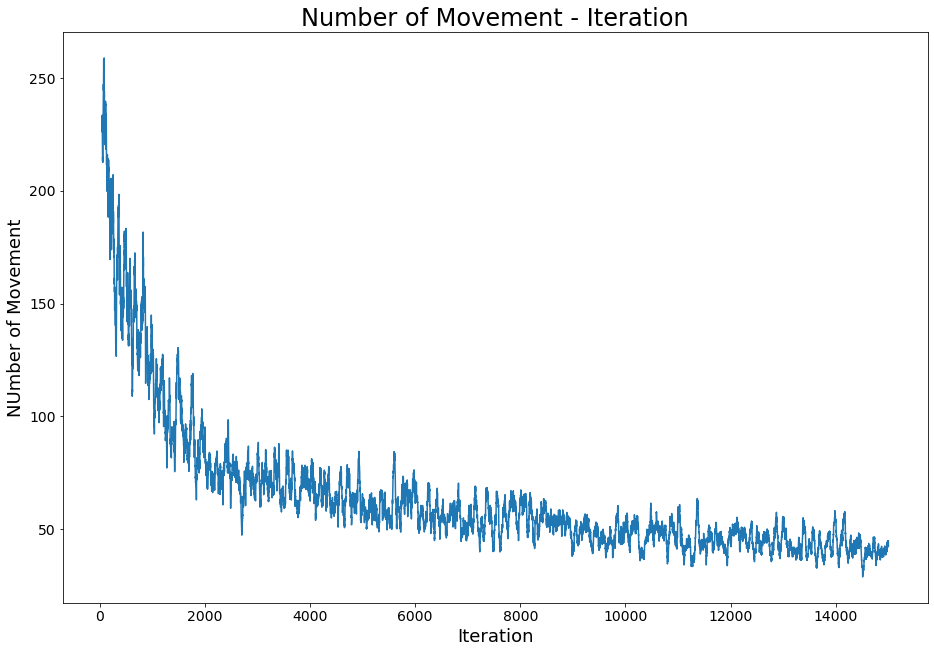

In [94]:
np.random.seed(10)
V,policy=WatkinsQ(LAMBDA=0,n_episodes=15000)

In [95]:
policy

{(4, 15, 0, 0): 'UZ',
 (4, 15, 0, 1): 'ZU',
 (4, 15, 0, 2): 'UZ',
 (4, 15, 0, 3): 'ZU',
 (4, 15, 0, 4): 'DZ',
 (4, 15, 1, 0): 'DU',
 (4, 15, 1, 1): 'UU',
 (4, 15, 1, 2): 'UD',
 (4, 15, 1, 3): 'UZ',
 (4, 15, 1, 4): 'DU',
 (4, 15, 2, 0): 'UD',
 (4, 15, 2, 1): 'DZ',
 (4, 15, 2, 2): 'UD',
 (4, 15, 2, 3): 'DD',
 (4, 15, 2, 4): 'DZ',
 (4, 15, 3, 0): 'ZU',
 (4, 15, 3, 1): 'UU',
 (4, 15, 3, 2): 'DD',
 (4, 15, 3, 3): 'ZZ',
 (4, 15, 3, 4): 'DZ',
 (4, 15, 4, 0): 'DD',
 (4, 15, 4, 1): 'UD',
 (4, 15, 4, 2): 'DZ',
 (4, 15, 4, 3): 'UD',
 (4, 15, 4, 4): 'DU',
 (4, 16, 0, 0): 'ZD',
 (4, 16, 0, 1): 'ZZ',
 (4, 16, 0, 2): 'UZ',
 (4, 16, 0, 3): 'ZU',
 (4, 16, 0, 4): 'UD',
 (4, 16, 1, 0): 'DD',
 (4, 16, 1, 1): 'DD',
 (4, 16, 1, 2): 'DZ',
 (4, 16, 1, 3): 'UD',
 (4, 16, 1, 4): 'UU',
 (4, 16, 2, 0): 'ZZ',
 (4, 16, 2, 1): 'UU',
 (4, 16, 2, 2): 'DZ',
 (4, 16, 2, 3): 'UD',
 (4, 16, 2, 4): 'ZZ',
 (4, 16, 3, 0): 'UZ',
 (4, 16, 3, 1): 'DZ',
 (4, 16, 3, 2): 'DU',
 (4, 16, 3, 3): 'DD',
 (4, 16, 3, 4): 'UD',
 (4, 16, 4

In [96]:
V

{(4, 15, 0, 0): 0,
 (4, 15, 0, 1): 0,
 (4, 15, 0, 2): 0,
 (4, 15, 0, 3): 0,
 (4, 15, 0, 4): 0,
 (4, 15, 1, 0): 0,
 (4, 15, 1, 1): 0,
 (4, 15, 1, 2): 0,
 (4, 15, 1, 3): 0,
 (4, 15, 1, 4): 0,
 (4, 15, 2, 0): -0.7725530557207991,
 (4, 15, 2, 1): 0,
 (4, 15, 2, 2): 0,
 (4, 15, 2, 3): 0,
 (4, 15, 2, 4): 0,
 (4, 15, 3, 0): -1.355,
 (4, 15, 3, 1): -0.5,
 (4, 15, 3, 2): 0,
 (4, 15, 3, 3): 0,
 (4, 15, 3, 4): 0,
 (4, 15, 4, 0): -1.5628275409689594,
 (4, 15, 4, 1): -0.38521900000000003,
 (4, 15, 4, 2): 0,
 (4, 15, 4, 3): 0,
 (4, 15, 4, 4): 0,
 (4, 16, 0, 0): 0,
 (4, 16, 0, 1): 0,
 (4, 16, 0, 2): 0,
 (4, 16, 0, 3): 0,
 (4, 16, 0, 4): 0,
 (4, 16, 1, 0): -0.490099501,
 (4, 16, 1, 1): 0,
 (4, 16, 1, 2): 0,
 (4, 16, 1, 3): 0,
 (4, 16, 1, 4): 0,
 (4, 16, 2, 0): -1.355,
 (4, 16, 2, 1): -0.5,
 (4, 16, 2, 2): 0,
 (4, 16, 2, 3): 0,
 (4, 16, 2, 4): 0,
 (4, 16, 3, 0): -1.7195,
 (4, 16, 3, 1): -0.95,
 (4, 16, 3, 2): 0,
 (4, 16, 3, 3): 0,
 (4, 16, 3, 4): 0,
 (4, 16, 4, 0): -1.7195,
 (4, 16, 4, 1): -0.95,
 (4, 

#### Dynamic epsilon

In [116]:
def max_dict(d):
    # returns the argmax (key) and max (value) from a dictionary
    # put this into a function since we are using it so often

    # find max val
    max_val = max(d.values())

    # find keys corresponding to max val
    max_keys = [key for key, val in d.items() if val == max_val]
    return np.random.choice(max_keys), max_val

In [119]:
def epsilon_greedy(Q, s, it):
    if it < 2000:
        eps = 0.1
        optimum = True
        if np.random.random() < eps:
            optimum = False
            return np.random.choice(ACTION_SPACE),optimum
        else:
            a_opt = max_dict(Q[s])[0]
        return a_opt,optimum
    
    elif(it < 7000) &  (it >= 2000):
        eps = 0.08
        optimum = True
        if np.random.random() < eps:
            optimum = False
            return np.random.choice(ACTION_SPACE),optimum
        else:
            a_opt = max_dict(Q[s])[0]
        return a_opt,optimum
    
    elif  (it >= 7000):
        eps = 0.05
        optimum = True
        if np.random.random() < eps:
            optimum = False
            return np.random.choice(ACTION_SPACE),optimum
        else:
            a_opt = max_dict(Q[s])[0]
        return a_opt,optimum
    
        

In [120]:
def WatkinsQ(LAMBDA,n_episodes):
    # initialize Q(s,a)
    Q = {}
    E={}
    for s in states:
        Q[s] = {}
        E[s]={}
        for a in ACTION_SPACE:
            Q[s][a] = 0
    GAMMA=0.9
    ALPHA = 0.1
    total_movement=[]
    for it in range(n_episodes):
        print(it,'#############################################################################################\n\n')
        movement=0
        for s in states:
            for a in ACTION_SPACE:
                E[s][a] = 0
        # begin a new episode
        s= random_initial_state()
        #print(s)
        visited_state_action={}
        while not is_terminal(s):
            # perform action and get next state + reward
            a,opt = epsilon_greedy(Q, s, it)
            if (s,a) not in visited_state_action.keys():
                visited_state_action[(s,a)]=[]
            s2 = get_next_state(s, a)
            r = rewards.get((s, a, s2),0)
            #print(s,a,s2,r)
            # update Q(s,a)
            maxQ = max_dict(Q[s2])[1]
            delta= r + GAMMA*maxQ - Q[s][a]
            E[s][a]=E[s][a]+1
            for (s,a) in visited_state_action.keys():
#            for s in States:
#                for a in ACTION_SPACE:
                    Q[s][a] = Q[s][a] + ALPHA*delta*E[s][a]
                    if opt:
                        E[s][a] = E[s][a]*GAMMA*LAMBDA
                    else:
                        E[s][a]=0
            # next state becomes current state
            if (is_wall(s2) == 1):
            # next state becomes current state
                s = random_initial_state()
                #print('crash the wall:',s)
                movement +=1
            else :
                s = s2
                #print(s)
                movement +=1
        total_movement.append(movement)
        df_total_movement = pd.DataFrame(total_movement)
        rol_total_movement = df_total_movement.rolling(50).mean()
    plt.rcParams["figure.figsize"] = [15.50, 10.50]
    plt.plot(rol_total_movement)
    plt.title('Number of Movement - Iteration', fontsize=24)
    plt.xlabel('Iteration', fontsize=18)
    plt.ylabel('NUmber of Movement', fontsize=18)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    policy = {}
    V = {}
    for s in actions.states.unique():
        a, max_q = max_dict(Q[s])
        policy[s] = a
        V[s] = max_q
    return V,policy

0 #############################################################################################


1 #############################################################################################


2 #############################################################################################


3 #############################################################################################


4 #############################################################################################


5 #############################################################################################


6 #############################################################################################


7 #############################################################################################


8 #############################################################################################


9 #############################################################################################


10 #################

83 #############################################################################################


84 #############################################################################################


85 #############################################################################################


86 #############################################################################################


87 #############################################################################################


88 #############################################################################################


89 #############################################################################################


90 #############################################################################################


91 #############################################################################################


92 #############################################################################################


93 #######

166 #############################################################################################


167 #############################################################################################


168 #############################################################################################


169 #############################################################################################


170 #############################################################################################


171 #############################################################################################


172 #############################################################################################


173 #############################################################################################


174 #############################################################################################


175 #############################################################################################




248 #############################################################################################


249 #############################################################################################


250 #############################################################################################


251 #############################################################################################


252 #############################################################################################


253 #############################################################################################


254 #############################################################################################


255 #############################################################################################


256 #############################################################################################


257 #############################################################################################




330 #############################################################################################


331 #############################################################################################


332 #############################################################################################


333 #############################################################################################


334 #############################################################################################


335 #############################################################################################


336 #############################################################################################


337 #############################################################################################


338 #############################################################################################


339 #############################################################################################




412 #############################################################################################


413 #############################################################################################


414 #############################################################################################


415 #############################################################################################


416 #############################################################################################


417 #############################################################################################


418 #############################################################################################


419 #############################################################################################


420 #############################################################################################


421 #############################################################################################




494 #############################################################################################


495 #############################################################################################


496 #############################################################################################


497 #############################################################################################


498 #############################################################################################


499 #############################################################################################


500 #############################################################################################


501 #############################################################################################


502 #############################################################################################


503 #############################################################################################




576 #############################################################################################


577 #############################################################################################


578 #############################################################################################


579 #############################################################################################


580 #############################################################################################


581 #############################################################################################


582 #############################################################################################


583 #############################################################################################


584 #############################################################################################


585 #############################################################################################




658 #############################################################################################


659 #############################################################################################


660 #############################################################################################


661 #############################################################################################


662 #############################################################################################


663 #############################################################################################


664 #############################################################################################


665 #############################################################################################


666 #############################################################################################


667 #############################################################################################




740 #############################################################################################


741 #############################################################################################


742 #############################################################################################


743 #############################################################################################


744 #############################################################################################


745 #############################################################################################


746 #############################################################################################


747 #############################################################################################


748 #############################################################################################


749 #############################################################################################




822 #############################################################################################


823 #############################################################################################


824 #############################################################################################


825 #############################################################################################


826 #############################################################################################


827 #############################################################################################


828 #############################################################################################


829 #############################################################################################


830 #############################################################################################


831 #############################################################################################




904 #############################################################################################


905 #############################################################################################


906 #############################################################################################


907 #############################################################################################


908 #############################################################################################


909 #############################################################################################


910 #############################################################################################


911 #############################################################################################


912 #############################################################################################


913 #############################################################################################




986 #############################################################################################


987 #############################################################################################


988 #############################################################################################


989 #############################################################################################


990 #############################################################################################


991 #############################################################################################


992 #############################################################################################


993 #############################################################################################


994 #############################################################################################


995 #############################################################################################




1068 #############################################################################################


1069 #############################################################################################


1070 #############################################################################################


1071 #############################################################################################


1072 #############################################################################################


1073 #############################################################################################


1074 #############################################################################################


1075 #############################################################################################


1076 #############################################################################################


1077 ######################################################################################

1150 #############################################################################################


1151 #############################################################################################


1152 #############################################################################################


1153 #############################################################################################


1154 #############################################################################################


1155 #############################################################################################


1156 #############################################################################################


1157 #############################################################################################


1158 #############################################################################################


1159 ######################################################################################

1232 #############################################################################################


1233 #############################################################################################


1234 #############################################################################################


1235 #############################################################################################


1236 #############################################################################################


1237 #############################################################################################


1238 #############################################################################################


1239 #############################################################################################


1240 #############################################################################################


1241 ######################################################################################

1314 #############################################################################################


1315 #############################################################################################


1316 #############################################################################################


1317 #############################################################################################


1318 #############################################################################################


1319 #############################################################################################


1320 #############################################################################################


1321 #############################################################################################


1322 #############################################################################################


1323 ######################################################################################

1396 #############################################################################################


1397 #############################################################################################


1398 #############################################################################################


1399 #############################################################################################


1400 #############################################################################################


1401 #############################################################################################


1402 #############################################################################################


1403 #############################################################################################


1404 #############################################################################################


1405 ######################################################################################

1478 #############################################################################################


1479 #############################################################################################


1480 #############################################################################################


1481 #############################################################################################


1482 #############################################################################################


1483 #############################################################################################


1484 #############################################################################################


1485 #############################################################################################


1486 #############################################################################################


1487 ######################################################################################

1560 #############################################################################################


1561 #############################################################################################


1562 #############################################################################################


1563 #############################################################################################


1564 #############################################################################################


1565 #############################################################################################


1566 #############################################################################################


1567 #############################################################################################


1568 #############################################################################################


1569 ######################################################################################

1642 #############################################################################################


1643 #############################################################################################


1644 #############################################################################################


1645 #############################################################################################


1646 #############################################################################################


1647 #############################################################################################


1648 #############################################################################################


1649 #############################################################################################


1650 #############################################################################################


1651 ######################################################################################

1724 #############################################################################################


1725 #############################################################################################


1726 #############################################################################################


1727 #############################################################################################


1728 #############################################################################################


1729 #############################################################################################


1730 #############################################################################################


1731 #############################################################################################


1732 #############################################################################################


1733 ######################################################################################

1806 #############################################################################################


1807 #############################################################################################


1808 #############################################################################################


1809 #############################################################################################


1810 #############################################################################################


1811 #############################################################################################


1812 #############################################################################################


1813 #############################################################################################


1814 #############################################################################################


1815 ######################################################################################

1888 #############################################################################################


1889 #############################################################################################


1890 #############################################################################################


1891 #############################################################################################


1892 #############################################################################################


1893 #############################################################################################


1894 #############################################################################################


1895 #############################################################################################


1896 #############################################################################################


1897 ######################################################################################

1970 #############################################################################################


1971 #############################################################################################


1972 #############################################################################################


1973 #############################################################################################


1974 #############################################################################################


1975 #############################################################################################


1976 #############################################################################################


1977 #############################################################################################


1978 #############################################################################################


1979 ######################################################################################

2052 #############################################################################################


2053 #############################################################################################


2054 #############################################################################################


2055 #############################################################################################


2056 #############################################################################################


2057 #############################################################################################


2058 #############################################################################################


2059 #############################################################################################


2060 #############################################################################################


2061 ######################################################################################

2134 #############################################################################################


2135 #############################################################################################


2136 #############################################################################################


2137 #############################################################################################


2138 #############################################################################################


2139 #############################################################################################


2140 #############################################################################################


2141 #############################################################################################


2142 #############################################################################################


2143 ######################################################################################

2216 #############################################################################################


2217 #############################################################################################


2218 #############################################################################################


2219 #############################################################################################


2220 #############################################################################################


2221 #############################################################################################


2222 #############################################################################################


2223 #############################################################################################


2224 #############################################################################################


2225 ######################################################################################

2298 #############################################################################################


2299 #############################################################################################


2300 #############################################################################################


2301 #############################################################################################


2302 #############################################################################################


2303 #############################################################################################


2304 #############################################################################################


2305 #############################################################################################


2306 #############################################################################################


2307 ######################################################################################

2380 #############################################################################################


2381 #############################################################################################


2382 #############################################################################################


2383 #############################################################################################


2384 #############################################################################################


2385 #############################################################################################


2386 #############################################################################################


2387 #############################################################################################


2388 #############################################################################################


2389 ######################################################################################

2462 #############################################################################################


2463 #############################################################################################


2464 #############################################################################################


2465 #############################################################################################


2466 #############################################################################################


2467 #############################################################################################


2468 #############################################################################################


2469 #############################################################################################


2470 #############################################################################################


2471 ######################################################################################

2544 #############################################################################################


2545 #############################################################################################


2546 #############################################################################################


2547 #############################################################################################


2548 #############################################################################################


2549 #############################################################################################


2550 #############################################################################################


2551 #############################################################################################


2552 #############################################################################################


2553 ######################################################################################

2626 #############################################################################################


2627 #############################################################################################


2628 #############################################################################################


2629 #############################################################################################


2630 #############################################################################################


2631 #############################################################################################


2632 #############################################################################################


2633 #############################################################################################


2634 #############################################################################################


2635 ######################################################################################

2708 #############################################################################################


2709 #############################################################################################


2710 #############################################################################################


2711 #############################################################################################


2712 #############################################################################################


2713 #############################################################################################


2714 #############################################################################################


2715 #############################################################################################


2716 #############################################################################################


2717 ######################################################################################

2790 #############################################################################################


2791 #############################################################################################


2792 #############################################################################################


2793 #############################################################################################


2794 #############################################################################################


2795 #############################################################################################


2796 #############################################################################################


2797 #############################################################################################


2798 #############################################################################################


2799 ######################################################################################

2872 #############################################################################################


2873 #############################################################################################


2874 #############################################################################################


2875 #############################################################################################


2876 #############################################################################################


2877 #############################################################################################


2878 #############################################################################################


2879 #############################################################################################


2880 #############################################################################################


2881 ######################################################################################

2954 #############################################################################################


2955 #############################################################################################


2956 #############################################################################################


2957 #############################################################################################


2958 #############################################################################################


2959 #############################################################################################


2960 #############################################################################################


2961 #############################################################################################


2962 #############################################################################################


2963 ######################################################################################

3036 #############################################################################################


3037 #############################################################################################


3038 #############################################################################################


3039 #############################################################################################


3040 #############################################################################################


3041 #############################################################################################


3042 #############################################################################################


3043 #############################################################################################


3044 #############################################################################################


3045 ######################################################################################

3118 #############################################################################################


3119 #############################################################################################


3120 #############################################################################################


3121 #############################################################################################


3122 #############################################################################################


3123 #############################################################################################


3124 #############################################################################################


3125 #############################################################################################


3126 #############################################################################################


3127 ######################################################################################

3200 #############################################################################################


3201 #############################################################################################


3202 #############################################################################################


3203 #############################################################################################


3204 #############################################################################################


3205 #############################################################################################


3206 #############################################################################################


3207 #############################################################################################


3208 #############################################################################################


3209 ######################################################################################

3282 #############################################################################################


3283 #############################################################################################


3284 #############################################################################################


3285 #############################################################################################


3286 #############################################################################################


3287 #############################################################################################


3288 #############################################################################################


3289 #############################################################################################


3290 #############################################################################################


3291 ######################################################################################

3364 #############################################################################################


3365 #############################################################################################


3366 #############################################################################################


3367 #############################################################################################


3368 #############################################################################################


3369 #############################################################################################


3370 #############################################################################################


3371 #############################################################################################


3372 #############################################################################################


3373 ######################################################################################

3446 #############################################################################################


3447 #############################################################################################


3448 #############################################################################################


3449 #############################################################################################


3450 #############################################################################################


3451 #############################################################################################


3452 #############################################################################################


3453 #############################################################################################


3454 #############################################################################################


3455 ######################################################################################

3528 #############################################################################################


3529 #############################################################################################


3530 #############################################################################################


3531 #############################################################################################


3532 #############################################################################################


3533 #############################################################################################


3534 #############################################################################################


3535 #############################################################################################


3536 #############################################################################################


3537 ######################################################################################

3610 #############################################################################################


3611 #############################################################################################


3612 #############################################################################################


3613 #############################################################################################


3614 #############################################################################################


3615 #############################################################################################


3616 #############################################################################################


3617 #############################################################################################


3618 #############################################################################################


3619 ######################################################################################

3692 #############################################################################################


3693 #############################################################################################


3694 #############################################################################################


3695 #############################################################################################


3696 #############################################################################################


3697 #############################################################################################


3698 #############################################################################################


3699 #############################################################################################


3700 #############################################################################################


3701 ######################################################################################

3774 #############################################################################################


3775 #############################################################################################


3776 #############################################################################################


3777 #############################################################################################


3778 #############################################################################################


3779 #############################################################################################


3780 #############################################################################################


3781 #############################################################################################


3782 #############################################################################################


3783 ######################################################################################

3856 #############################################################################################


3857 #############################################################################################


3858 #############################################################################################


3859 #############################################################################################


3860 #############################################################################################


3861 #############################################################################################


3862 #############################################################################################


3863 #############################################################################################


3864 #############################################################################################


3865 ######################################################################################

3938 #############################################################################################


3939 #############################################################################################


3940 #############################################################################################


3941 #############################################################################################


3942 #############################################################################################


3943 #############################################################################################


3944 #############################################################################################


3945 #############################################################################################


3946 #############################################################################################


3947 ######################################################################################

4020 #############################################################################################


4021 #############################################################################################


4022 #############################################################################################


4023 #############################################################################################


4024 #############################################################################################


4025 #############################################################################################


4026 #############################################################################################


4027 #############################################################################################


4028 #############################################################################################


4029 ######################################################################################

4102 #############################################################################################


4103 #############################################################################################


4104 #############################################################################################


4105 #############################################################################################


4106 #############################################################################################


4107 #############################################################################################


4108 #############################################################################################


4109 #############################################################################################


4110 #############################################################################################


4111 ######################################################################################

4184 #############################################################################################


4185 #############################################################################################


4186 #############################################################################################


4187 #############################################################################################


4188 #############################################################################################


4189 #############################################################################################


4190 #############################################################################################


4191 #############################################################################################


4192 #############################################################################################


4193 ######################################################################################

4266 #############################################################################################


4267 #############################################################################################


4268 #############################################################################################


4269 #############################################################################################


4270 #############################################################################################


4271 #############################################################################################


4272 #############################################################################################


4273 #############################################################################################


4274 #############################################################################################


4275 ######################################################################################

4348 #############################################################################################


4349 #############################################################################################


4350 #############################################################################################


4351 #############################################################################################


4352 #############################################################################################


4353 #############################################################################################


4354 #############################################################################################


4355 #############################################################################################


4356 #############################################################################################


4357 ######################################################################################

4430 #############################################################################################


4431 #############################################################################################


4432 #############################################################################################


4433 #############################################################################################


4434 #############################################################################################


4435 #############################################################################################


4436 #############################################################################################


4437 #############################################################################################


4438 #############################################################################################


4439 ######################################################################################

4512 #############################################################################################


4513 #############################################################################################


4514 #############################################################################################


4515 #############################################################################################


4516 #############################################################################################


4517 #############################################################################################


4518 #############################################################################################


4519 #############################################################################################


4520 #############################################################################################


4521 ######################################################################################

4594 #############################################################################################


4595 #############################################################################################


4596 #############################################################################################


4597 #############################################################################################


4598 #############################################################################################


4599 #############################################################################################


4600 #############################################################################################


4601 #############################################################################################


4602 #############################################################################################


4603 ######################################################################################

4676 #############################################################################################


4677 #############################################################################################


4678 #############################################################################################


4679 #############################################################################################


4680 #############################################################################################


4681 #############################################################################################


4682 #############################################################################################


4683 #############################################################################################


4684 #############################################################################################


4685 ######################################################################################

4758 #############################################################################################


4759 #############################################################################################


4760 #############################################################################################


4761 #############################################################################################


4762 #############################################################################################


4763 #############################################################################################


4764 #############################################################################################


4765 #############################################################################################


4766 #############################################################################################


4767 ######################################################################################

4840 #############################################################################################


4841 #############################################################################################


4842 #############################################################################################


4843 #############################################################################################


4844 #############################################################################################


4845 #############################################################################################


4846 #############################################################################################


4847 #############################################################################################


4848 #############################################################################################


4849 ######################################################################################

4922 #############################################################################################


4923 #############################################################################################


4924 #############################################################################################


4925 #############################################################################################


4926 #############################################################################################


4927 #############################################################################################


4928 #############################################################################################


4929 #############################################################################################


4930 #############################################################################################


4931 ######################################################################################

5004 #############################################################################################


5005 #############################################################################################


5006 #############################################################################################


5007 #############################################################################################


5008 #############################################################################################


5009 #############################################################################################


5010 #############################################################################################


5011 #############################################################################################


5012 #############################################################################################


5013 ######################################################################################

5086 #############################################################################################


5087 #############################################################################################


5088 #############################################################################################


5089 #############################################################################################


5090 #############################################################################################


5091 #############################################################################################


5092 #############################################################################################


5093 #############################################################################################


5094 #############################################################################################


5095 ######################################################################################

5168 #############################################################################################


5169 #############################################################################################


5170 #############################################################################################


5171 #############################################################################################


5172 #############################################################################################


5173 #############################################################################################


5174 #############################################################################################


5175 #############################################################################################


5176 #############################################################################################


5177 ######################################################################################

5250 #############################################################################################


5251 #############################################################################################


5252 #############################################################################################


5253 #############################################################################################


5254 #############################################################################################


5255 #############################################################################################


5256 #############################################################################################


5257 #############################################################################################


5258 #############################################################################################


5259 ######################################################################################

5332 #############################################################################################


5333 #############################################################################################


5334 #############################################################################################


5335 #############################################################################################


5336 #############################################################################################


5337 #############################################################################################


5338 #############################################################################################


5339 #############################################################################################


5340 #############################################################################################


5341 ######################################################################################

5414 #############################################################################################


5415 #############################################################################################


5416 #############################################################################################


5417 #############################################################################################


5418 #############################################################################################


5419 #############################################################################################


5420 #############################################################################################


5421 #############################################################################################


5422 #############################################################################################


5423 ######################################################################################

5496 #############################################################################################


5497 #############################################################################################


5498 #############################################################################################


5499 #############################################################################################


5500 #############################################################################################


5501 #############################################################################################


5502 #############################################################################################


5503 #############################################################################################


5504 #############################################################################################


5505 ######################################################################################

5578 #############################################################################################


5579 #############################################################################################


5580 #############################################################################################


5581 #############################################################################################


5582 #############################################################################################


5583 #############################################################################################


5584 #############################################################################################


5585 #############################################################################################


5586 #############################################################################################


5587 ######################################################################################

5660 #############################################################################################


5661 #############################################################################################


5662 #############################################################################################


5663 #############################################################################################


5664 #############################################################################################


5665 #############################################################################################


5666 #############################################################################################


5667 #############################################################################################


5668 #############################################################################################


5669 ######################################################################################

5742 #############################################################################################


5743 #############################################################################################


5744 #############################################################################################


5745 #############################################################################################


5746 #############################################################################################


5747 #############################################################################################


5748 #############################################################################################


5749 #############################################################################################


5750 #############################################################################################


5751 ######################################################################################

5824 #############################################################################################


5825 #############################################################################################


5826 #############################################################################################


5827 #############################################################################################


5828 #############################################################################################


5829 #############################################################################################


5830 #############################################################################################


5831 #############################################################################################


5832 #############################################################################################


5833 ######################################################################################

5906 #############################################################################################


5907 #############################################################################################


5908 #############################################################################################


5909 #############################################################################################


5910 #############################################################################################


5911 #############################################################################################


5912 #############################################################################################


5913 #############################################################################################


5914 #############################################################################################


5915 ######################################################################################

5988 #############################################################################################


5989 #############################################################################################


5990 #############################################################################################


5991 #############################################################################################


5992 #############################################################################################


5993 #############################################################################################


5994 #############################################################################################


5995 #############################################################################################


5996 #############################################################################################


5997 ######################################################################################

6070 #############################################################################################


6071 #############################################################################################


6072 #############################################################################################


6073 #############################################################################################


6074 #############################################################################################


6075 #############################################################################################


6076 #############################################################################################


6077 #############################################################################################


6078 #############################################################################################


6079 ######################################################################################

6152 #############################################################################################


6153 #############################################################################################


6154 #############################################################################################


6155 #############################################################################################


6156 #############################################################################################


6157 #############################################################################################


6158 #############################################################################################


6159 #############################################################################################


6160 #############################################################################################


6161 ######################################################################################

6234 #############################################################################################


6235 #############################################################################################


6236 #############################################################################################


6237 #############################################################################################


6238 #############################################################################################


6239 #############################################################################################


6240 #############################################################################################


6241 #############################################################################################


6242 #############################################################################################


6243 ######################################################################################

6316 #############################################################################################


6317 #############################################################################################


6318 #############################################################################################


6319 #############################################################################################


6320 #############################################################################################


6321 #############################################################################################


6322 #############################################################################################


6323 #############################################################################################


6324 #############################################################################################


6325 ######################################################################################

6398 #############################################################################################


6399 #############################################################################################


6400 #############################################################################################


6401 #############################################################################################


6402 #############################################################################################


6403 #############################################################################################


6404 #############################################################################################


6405 #############################################################################################


6406 #############################################################################################


6407 ######################################################################################

6480 #############################################################################################


6481 #############################################################################################


6482 #############################################################################################


6483 #############################################################################################


6484 #############################################################################################


6485 #############################################################################################


6486 #############################################################################################


6487 #############################################################################################


6488 #############################################################################################


6489 ######################################################################################

6562 #############################################################################################


6563 #############################################################################################


6564 #############################################################################################


6565 #############################################################################################


6566 #############################################################################################


6567 #############################################################################################


6568 #############################################################################################


6569 #############################################################################################


6570 #############################################################################################


6571 ######################################################################################

6644 #############################################################################################


6645 #############################################################################################


6646 #############################################################################################


6647 #############################################################################################


6648 #############################################################################################


6649 #############################################################################################


6650 #############################################################################################


6651 #############################################################################################


6652 #############################################################################################


6653 ######################################################################################

6726 #############################################################################################


6727 #############################################################################################


6728 #############################################################################################


6729 #############################################################################################


6730 #############################################################################################


6731 #############################################################################################


6732 #############################################################################################


6733 #############################################################################################


6734 #############################################################################################


6735 ######################################################################################

6808 #############################################################################################


6809 #############################################################################################


6810 #############################################################################################


6811 #############################################################################################


6812 #############################################################################################


6813 #############################################################################################


6814 #############################################################################################


6815 #############################################################################################


6816 #############################################################################################


6817 ######################################################################################

6890 #############################################################################################


6891 #############################################################################################


6892 #############################################################################################


6893 #############################################################################################


6894 #############################################################################################


6895 #############################################################################################


6896 #############################################################################################


6897 #############################################################################################


6898 #############################################################################################


6899 ######################################################################################

6972 #############################################################################################


6973 #############################################################################################


6974 #############################################################################################


6975 #############################################################################################


6976 #############################################################################################


6977 #############################################################################################


6978 #############################################################################################


6979 #############################################################################################


6980 #############################################################################################


6981 ######################################################################################

7054 #############################################################################################


7055 #############################################################################################


7056 #############################################################################################


7057 #############################################################################################


7058 #############################################################################################


7059 #############################################################################################


7060 #############################################################################################


7061 #############################################################################################


7062 #############################################################################################


7063 ######################################################################################

7136 #############################################################################################


7137 #############################################################################################


7138 #############################################################################################


7139 #############################################################################################


7140 #############################################################################################


7141 #############################################################################################


7142 #############################################################################################


7143 #############################################################################################


7144 #############################################################################################


7145 ######################################################################################

7218 #############################################################################################


7219 #############################################################################################


7220 #############################################################################################


7221 #############################################################################################


7222 #############################################################################################


7223 #############################################################################################


7224 #############################################################################################


7225 #############################################################################################


7226 #############################################################################################


7227 ######################################################################################

7300 #############################################################################################


7301 #############################################################################################


7302 #############################################################################################


7303 #############################################################################################


7304 #############################################################################################


7305 #############################################################################################


7306 #############################################################################################


7307 #############################################################################################


7308 #############################################################################################


7309 ######################################################################################

7382 #############################################################################################


7383 #############################################################################################


7384 #############################################################################################


7385 #############################################################################################


7386 #############################################################################################


7387 #############################################################################################


7388 #############################################################################################


7389 #############################################################################################


7390 #############################################################################################


7391 ######################################################################################

7464 #############################################################################################


7465 #############################################################################################


7466 #############################################################################################


7467 #############################################################################################


7468 #############################################################################################


7469 #############################################################################################


7470 #############################################################################################


7471 #############################################################################################


7472 #############################################################################################


7473 ######################################################################################

7546 #############################################################################################


7547 #############################################################################################


7548 #############################################################################################


7549 #############################################################################################


7550 #############################################################################################


7551 #############################################################################################


7552 #############################################################################################


7553 #############################################################################################


7554 #############################################################################################


7555 ######################################################################################

7628 #############################################################################################


7629 #############################################################################################


7630 #############################################################################################


7631 #############################################################################################


7632 #############################################################################################


7633 #############################################################################################


7634 #############################################################################################


7635 #############################################################################################


7636 #############################################################################################


7637 ######################################################################################

7710 #############################################################################################


7711 #############################################################################################


7712 #############################################################################################


7713 #############################################################################################


7714 #############################################################################################


7715 #############################################################################################


7716 #############################################################################################


7717 #############################################################################################


7718 #############################################################################################


7719 ######################################################################################

7792 #############################################################################################


7793 #############################################################################################


7794 #############################################################################################


7795 #############################################################################################


7796 #############################################################################################


7797 #############################################################################################


7798 #############################################################################################


7799 #############################################################################################


7800 #############################################################################################


7801 ######################################################################################

7874 #############################################################################################


7875 #############################################################################################


7876 #############################################################################################


7877 #############################################################################################


7878 #############################################################################################


7879 #############################################################################################


7880 #############################################################################################


7881 #############################################################################################


7882 #############################################################################################


7883 ######################################################################################

7956 #############################################################################################


7957 #############################################################################################


7958 #############################################################################################


7959 #############################################################################################


7960 #############################################################################################


7961 #############################################################################################


7962 #############################################################################################


7963 #############################################################################################


7964 #############################################################################################


7965 ######################################################################################

8038 #############################################################################################


8039 #############################################################################################


8040 #############################################################################################


8041 #############################################################################################


8042 #############################################################################################


8043 #############################################################################################


8044 #############################################################################################


8045 #############################################################################################


8046 #############################################################################################


8047 ######################################################################################

8120 #############################################################################################


8121 #############################################################################################


8122 #############################################################################################


8123 #############################################################################################


8124 #############################################################################################


8125 #############################################################################################


8126 #############################################################################################


8127 #############################################################################################


8128 #############################################################################################


8129 ######################################################################################

8202 #############################################################################################


8203 #############################################################################################


8204 #############################################################################################


8205 #############################################################################################


8206 #############################################################################################


8207 #############################################################################################


8208 #############################################################################################


8209 #############################################################################################


8210 #############################################################################################


8211 ######################################################################################

8284 #############################################################################################


8285 #############################################################################################


8286 #############################################################################################


8287 #############################################################################################


8288 #############################################################################################


8289 #############################################################################################


8290 #############################################################################################


8291 #############################################################################################


8292 #############################################################################################


8293 ######################################################################################

8366 #############################################################################################


8367 #############################################################################################


8368 #############################################################################################


8369 #############################################################################################


8370 #############################################################################################


8371 #############################################################################################


8372 #############################################################################################


8373 #############################################################################################


8374 #############################################################################################


8375 ######################################################################################

8448 #############################################################################################


8449 #############################################################################################


8450 #############################################################################################


8451 #############################################################################################


8452 #############################################################################################


8453 #############################################################################################


8454 #############################################################################################


8455 #############################################################################################


8456 #############################################################################################


8457 ######################################################################################

8530 #############################################################################################


8531 #############################################################################################


8532 #############################################################################################


8533 #############################################################################################


8534 #############################################################################################


8535 #############################################################################################


8536 #############################################################################################


8537 #############################################################################################


8538 #############################################################################################


8539 ######################################################################################

8612 #############################################################################################


8613 #############################################################################################


8614 #############################################################################################


8615 #############################################################################################


8616 #############################################################################################


8617 #############################################################################################


8618 #############################################################################################


8619 #############################################################################################


8620 #############################################################################################


8621 ######################################################################################

8694 #############################################################################################


8695 #############################################################################################


8696 #############################################################################################


8697 #############################################################################################


8698 #############################################################################################


8699 #############################################################################################


8700 #############################################################################################


8701 #############################################################################################


8702 #############################################################################################


8703 ######################################################################################

8776 #############################################################################################


8777 #############################################################################################


8778 #############################################################################################


8779 #############################################################################################


8780 #############################################################################################


8781 #############################################################################################


8782 #############################################################################################


8783 #############################################################################################


8784 #############################################################################################


8785 ######################################################################################

8858 #############################################################################################


8859 #############################################################################################


8860 #############################################################################################


8861 #############################################################################################


8862 #############################################################################################


8863 #############################################################################################


8864 #############################################################################################


8865 #############################################################################################


8866 #############################################################################################


8867 ######################################################################################

8940 #############################################################################################


8941 #############################################################################################


8942 #############################################################################################


8943 #############################################################################################


8944 #############################################################################################


8945 #############################################################################################


8946 #############################################################################################


8947 #############################################################################################


8948 #############################################################################################


8949 ######################################################################################

9022 #############################################################################################


9023 #############################################################################################


9024 #############################################################################################


9025 #############################################################################################


9026 #############################################################################################


9027 #############################################################################################


9028 #############################################################################################


9029 #############################################################################################


9030 #############################################################################################


9031 ######################################################################################

9104 #############################################################################################


9105 #############################################################################################


9106 #############################################################################################


9107 #############################################################################################


9108 #############################################################################################


9109 #############################################################################################


9110 #############################################################################################


9111 #############################################################################################


9112 #############################################################################################


9113 ######################################################################################

9186 #############################################################################################


9187 #############################################################################################


9188 #############################################################################################


9189 #############################################################################################


9190 #############################################################################################


9191 #############################################################################################


9192 #############################################################################################


9193 #############################################################################################


9194 #############################################################################################


9195 ######################################################################################

9268 #############################################################################################


9269 #############################################################################################


9270 #############################################################################################


9271 #############################################################################################


9272 #############################################################################################


9273 #############################################################################################


9274 #############################################################################################


9275 #############################################################################################


9276 #############################################################################################


9277 ######################################################################################

9351 #############################################################################################


9352 #############################################################################################


9353 #############################################################################################


9354 #############################################################################################


9355 #############################################################################################


9356 #############################################################################################


9357 #############################################################################################


9358 #############################################################################################


9359 #############################################################################################


9360 ######################################################################################

9433 #############################################################################################


9434 #############################################################################################


9435 #############################################################################################


9436 #############################################################################################


9437 #############################################################################################


9438 #############################################################################################


9439 #############################################################################################


9440 #############################################################################################


9441 #############################################################################################


9442 ######################################################################################

9515 #############################################################################################


9516 #############################################################################################


9517 #############################################################################################


9518 #############################################################################################


9519 #############################################################################################


9520 #############################################################################################


9521 #############################################################################################


9522 #############################################################################################


9523 #############################################################################################


9524 ######################################################################################

9597 #############################################################################################


9598 #############################################################################################


9599 #############################################################################################


9600 #############################################################################################


9601 #############################################################################################


9602 #############################################################################################


9603 #############################################################################################


9604 #############################################################################################


9605 #############################################################################################


9606 ######################################################################################

9679 #############################################################################################


9680 #############################################################################################


9681 #############################################################################################


9682 #############################################################################################


9683 #############################################################################################


9684 #############################################################################################


9685 #############################################################################################


9686 #############################################################################################


9687 #############################################################################################


9688 ######################################################################################

9761 #############################################################################################


9762 #############################################################################################


9763 #############################################################################################


9764 #############################################################################################


9765 #############################################################################################


9766 #############################################################################################


9767 #############################################################################################


9768 #############################################################################################


9769 #############################################################################################


9770 ######################################################################################

9843 #############################################################################################


9844 #############################################################################################


9845 #############################################################################################


9846 #############################################################################################


9847 #############################################################################################


9848 #############################################################################################


9849 #############################################################################################


9850 #############################################################################################


9851 #############################################################################################


9852 ######################################################################################

9925 #############################################################################################


9926 #############################################################################################


9927 #############################################################################################


9928 #############################################################################################


9929 #############################################################################################


9930 #############################################################################################


9931 #############################################################################################


9932 #############################################################################################


9933 #############################################################################################


9934 ######################################################################################

10007 #############################################################################################


10008 #############################################################################################


10009 #############################################################################################


10010 #############################################################################################


10011 #############################################################################################


10012 #############################################################################################


10013 #############################################################################################


10014 #############################################################################################


10015 #############################################################################################


10016 ############################################################################

10088 #############################################################################################


10089 #############################################################################################


10090 #############################################################################################


10091 #############################################################################################


10092 #############################################################################################


10093 #############################################################################################


10094 #############################################################################################


10095 #############################################################################################


10096 #############################################################################################


10097 ############################################################################

10169 #############################################################################################


10170 #############################################################################################


10171 #############################################################################################


10172 #############################################################################################


10173 #############################################################################################


10174 #############################################################################################


10175 #############################################################################################


10176 #############################################################################################


10177 #############################################################################################


10178 ############################################################################

10250 #############################################################################################


10251 #############################################################################################


10252 #############################################################################################


10253 #############################################################################################


10254 #############################################################################################


10255 #############################################################################################


10256 #############################################################################################


10257 #############################################################################################


10258 #############################################################################################


10259 ############################################################################

10331 #############################################################################################


10332 #############################################################################################


10333 #############################################################################################


10334 #############################################################################################


10335 #############################################################################################


10336 #############################################################################################


10337 #############################################################################################


10338 #############################################################################################


10339 #############################################################################################


10340 ############################################################################

10412 #############################################################################################


10413 #############################################################################################


10414 #############################################################################################


10415 #############################################################################################


10416 #############################################################################################


10417 #############################################################################################


10418 #############################################################################################


10419 #############################################################################################


10420 #############################################################################################


10421 ############################################################################

10493 #############################################################################################


10494 #############################################################################################


10495 #############################################################################################


10496 #############################################################################################


10497 #############################################################################################


10498 #############################################################################################


10499 #############################################################################################


10500 #############################################################################################


10501 #############################################################################################


10502 ############################################################################

10574 #############################################################################################


10575 #############################################################################################


10576 #############################################################################################


10577 #############################################################################################


10578 #############################################################################################


10579 #############################################################################################


10580 #############################################################################################


10581 #############################################################################################


10582 #############################################################################################


10583 ############################################################################

10655 #############################################################################################


10656 #############################################################################################


10657 #############################################################################################


10658 #############################################################################################


10659 #############################################################################################


10660 #############################################################################################


10661 #############################################################################################


10662 #############################################################################################


10663 #############################################################################################


10664 ############################################################################

10736 #############################################################################################


10737 #############################################################################################


10738 #############################################################################################


10739 #############################################################################################


10740 #############################################################################################


10741 #############################################################################################


10742 #############################################################################################


10743 #############################################################################################


10744 #############################################################################################


10745 ############################################################################

10817 #############################################################################################


10818 #############################################################################################


10819 #############################################################################################


10820 #############################################################################################


10821 #############################################################################################


10822 #############################################################################################


10823 #############################################################################################


10824 #############################################################################################


10825 #############################################################################################


10826 ############################################################################

10898 #############################################################################################


10899 #############################################################################################


10900 #############################################################################################


10901 #############################################################################################


10902 #############################################################################################


10903 #############################################################################################


10904 #############################################################################################


10905 #############################################################################################


10906 #############################################################################################


10907 ############################################################################

10979 #############################################################################################


10980 #############################################################################################


10981 #############################################################################################


10982 #############################################################################################


10983 #############################################################################################


10984 #############################################################################################


10985 #############################################################################################


10986 #############################################################################################


10987 #############################################################################################


10988 ############################################################################

11060 #############################################################################################


11061 #############################################################################################


11062 #############################################################################################


11063 #############################################################################################


11064 #############################################################################################


11065 #############################################################################################


11066 #############################################################################################


11067 #############################################################################################


11068 #############################################################################################


11069 ############################################################################

11141 #############################################################################################


11142 #############################################################################################


11143 #############################################################################################


11144 #############################################################################################


11145 #############################################################################################


11146 #############################################################################################


11147 #############################################################################################


11148 #############################################################################################


11149 #############################################################################################


11150 ############################################################################

11222 #############################################################################################


11223 #############################################################################################


11224 #############################################################################################


11225 #############################################################################################


11226 #############################################################################################


11227 #############################################################################################


11228 #############################################################################################


11229 #############################################################################################


11230 #############################################################################################


11231 ############################################################################

11303 #############################################################################################


11304 #############################################################################################


11305 #############################################################################################


11306 #############################################################################################


11307 #############################################################################################


11308 #############################################################################################


11309 #############################################################################################


11310 #############################################################################################


11311 #############################################################################################


11312 ############################################################################

11384 #############################################################################################


11385 #############################################################################################


11386 #############################################################################################


11387 #############################################################################################


11388 #############################################################################################


11389 #############################################################################################


11390 #############################################################################################


11391 #############################################################################################


11392 #############################################################################################


11393 ############################################################################

11465 #############################################################################################


11466 #############################################################################################


11467 #############################################################################################


11468 #############################################################################################


11469 #############################################################################################


11470 #############################################################################################


11471 #############################################################################################


11472 #############################################################################################


11473 #############################################################################################


11474 ############################################################################

11546 #############################################################################################


11547 #############################################################################################


11548 #############################################################################################


11549 #############################################################################################


11550 #############################################################################################


11551 #############################################################################################


11552 #############################################################################################


11553 #############################################################################################


11554 #############################################################################################


11555 ############################################################################

11627 #############################################################################################


11628 #############################################################################################


11629 #############################################################################################


11630 #############################################################################################


11631 #############################################################################################


11632 #############################################################################################


11633 #############################################################################################


11634 #############################################################################################


11635 #############################################################################################


11636 ############################################################################

11708 #############################################################################################


11709 #############################################################################################


11710 #############################################################################################


11711 #############################################################################################


11712 #############################################################################################


11713 #############################################################################################


11714 #############################################################################################


11715 #############################################################################################


11716 #############################################################################################


11717 ############################################################################

11789 #############################################################################################


11790 #############################################################################################


11791 #############################################################################################


11792 #############################################################################################


11793 #############################################################################################


11794 #############################################################################################


11795 #############################################################################################


11796 #############################################################################################


11797 #############################################################################################


11798 ############################################################################

11870 #############################################################################################


11871 #############################################################################################


11872 #############################################################################################


11873 #############################################################################################


11874 #############################################################################################


11875 #############################################################################################


11876 #############################################################################################


11877 #############################################################################################


11878 #############################################################################################


11879 ############################################################################

11951 #############################################################################################


11952 #############################################################################################


11953 #############################################################################################


11954 #############################################################################################


11955 #############################################################################################


11956 #############################################################################################


11957 #############################################################################################


11958 #############################################################################################


11959 #############################################################################################


11960 ############################################################################

12032 #############################################################################################


12033 #############################################################################################


12034 #############################################################################################


12035 #############################################################################################


12036 #############################################################################################


12037 #############################################################################################


12038 #############################################################################################


12039 #############################################################################################


12040 #############################################################################################


12041 ############################################################################

12113 #############################################################################################


12114 #############################################################################################


12115 #############################################################################################


12116 #############################################################################################


12117 #############################################################################################


12118 #############################################################################################


12119 #############################################################################################


12120 #############################################################################################


12121 #############################################################################################


12122 ############################################################################

12194 #############################################################################################


12195 #############################################################################################


12196 #############################################################################################


12197 #############################################################################################


12198 #############################################################################################


12199 #############################################################################################


12200 #############################################################################################


12201 #############################################################################################


12202 #############################################################################################


12203 ############################################################################

12275 #############################################################################################


12276 #############################################################################################


12277 #############################################################################################


12278 #############################################################################################


12279 #############################################################################################


12280 #############################################################################################


12281 #############################################################################################


12282 #############################################################################################


12283 #############################################################################################


12284 ############################################################################

12356 #############################################################################################


12357 #############################################################################################


12358 #############################################################################################


12359 #############################################################################################


12360 #############################################################################################


12361 #############################################################################################


12362 #############################################################################################


12363 #############################################################################################


12364 #############################################################################################


12365 ############################################################################

12437 #############################################################################################


12438 #############################################################################################


12439 #############################################################################################


12440 #############################################################################################


12441 #############################################################################################


12442 #############################################################################################


12443 #############################################################################################


12444 #############################################################################################


12445 #############################################################################################


12446 ############################################################################

12518 #############################################################################################


12519 #############################################################################################


12520 #############################################################################################


12521 #############################################################################################


12522 #############################################################################################


12523 #############################################################################################


12524 #############################################################################################


12525 #############################################################################################


12526 #############################################################################################


12527 ############################################################################

12599 #############################################################################################


12600 #############################################################################################


12601 #############################################################################################


12602 #############################################################################################


12603 #############################################################################################


12604 #############################################################################################


12605 #############################################################################################


12606 #############################################################################################


12607 #############################################################################################


12608 ############################################################################

12680 #############################################################################################


12681 #############################################################################################


12682 #############################################################################################


12683 #############################################################################################


12684 #############################################################################################


12685 #############################################################################################


12686 #############################################################################################


12687 #############################################################################################


12688 #############################################################################################


12689 ############################################################################

12761 #############################################################################################


12762 #############################################################################################


12763 #############################################################################################


12764 #############################################################################################


12765 #############################################################################################


12766 #############################################################################################


12767 #############################################################################################


12768 #############################################################################################


12769 #############################################################################################


12770 ############################################################################

12842 #############################################################################################


12843 #############################################################################################


12844 #############################################################################################


12845 #############################################################################################


12846 #############################################################################################


12847 #############################################################################################


12848 #############################################################################################


12849 #############################################################################################


12850 #############################################################################################


12851 ############################################################################

12923 #############################################################################################


12924 #############################################################################################


12925 #############################################################################################


12926 #############################################################################################


12927 #############################################################################################


12928 #############################################################################################


12929 #############################################################################################


12930 #############################################################################################


12931 #############################################################################################


12932 ############################################################################

13005 #############################################################################################


13006 #############################################################################################


13007 #############################################################################################


13008 #############################################################################################


13009 #############################################################################################


13010 #############################################################################################


13011 #############################################################################################


13012 #############################################################################################


13013 #############################################################################################


13014 ############################################################################

13086 #############################################################################################


13087 #############################################################################################


13088 #############################################################################################


13089 #############################################################################################


13090 #############################################################################################


13091 #############################################################################################


13092 #############################################################################################


13093 #############################################################################################


13094 #############################################################################################


13095 ############################################################################

13167 #############################################################################################


13168 #############################################################################################


13169 #############################################################################################


13170 #############################################################################################


13171 #############################################################################################


13172 #############################################################################################


13173 #############################################################################################


13174 #############################################################################################


13175 #############################################################################################


13176 ############################################################################

13248 #############################################################################################


13249 #############################################################################################


13250 #############################################################################################


13251 #############################################################################################


13252 #############################################################################################


13253 #############################################################################################


13254 #############################################################################################


13255 #############################################################################################


13256 #############################################################################################


13257 ############################################################################

13329 #############################################################################################


13330 #############################################################################################


13331 #############################################################################################


13332 #############################################################################################


13333 #############################################################################################


13334 #############################################################################################


13335 #############################################################################################


13336 #############################################################################################


13337 #############################################################################################


13338 ############################################################################

13410 #############################################################################################


13411 #############################################################################################


13412 #############################################################################################


13413 #############################################################################################


13414 #############################################################################################


13415 #############################################################################################


13416 #############################################################################################


13417 #############################################################################################


13418 #############################################################################################


13419 ############################################################################

13491 #############################################################################################


13492 #############################################################################################


13493 #############################################################################################


13494 #############################################################################################


13495 #############################################################################################


13496 #############################################################################################


13497 #############################################################################################


13498 #############################################################################################


13499 #############################################################################################


13500 ############################################################################

13572 #############################################################################################


13573 #############################################################################################


13574 #############################################################################################


13575 #############################################################################################


13576 #############################################################################################


13577 #############################################################################################


13578 #############################################################################################


13579 #############################################################################################


13580 #############################################################################################


13581 ############################################################################

13653 #############################################################################################


13654 #############################################################################################


13655 #############################################################################################


13656 #############################################################################################


13657 #############################################################################################


13658 #############################################################################################


13659 #############################################################################################


13660 #############################################################################################


13661 #############################################################################################


13662 ############################################################################

13734 #############################################################################################


13735 #############################################################################################


13736 #############################################################################################


13737 #############################################################################################


13738 #############################################################################################


13739 #############################################################################################


13740 #############################################################################################


13741 #############################################################################################


13742 #############################################################################################


13743 ############################################################################

13815 #############################################################################################


13816 #############################################################################################


13817 #############################################################################################


13818 #############################################################################################


13819 #############################################################################################


13820 #############################################################################################


13821 #############################################################################################


13822 #############################################################################################


13823 #############################################################################################


13824 ############################################################################

13896 #############################################################################################


13897 #############################################################################################


13898 #############################################################################################


13899 #############################################################################################


13900 #############################################################################################


13901 #############################################################################################


13902 #############################################################################################


13903 #############################################################################################


13904 #############################################################################################


13905 ############################################################################

13977 #############################################################################################


13978 #############################################################################################


13979 #############################################################################################


13980 #############################################################################################


13981 #############################################################################################


13982 #############################################################################################


13983 #############################################################################################


13984 #############################################################################################


13985 #############################################################################################


13986 ############################################################################

14058 #############################################################################################


14059 #############################################################################################


14060 #############################################################################################


14061 #############################################################################################


14062 #############################################################################################


14063 #############################################################################################


14064 #############################################################################################


14065 #############################################################################################


14066 #############################################################################################


14067 ############################################################################

14139 #############################################################################################


14140 #############################################################################################


14141 #############################################################################################


14142 #############################################################################################


14143 #############################################################################################


14144 #############################################################################################


14145 #############################################################################################


14146 #############################################################################################


14147 #############################################################################################


14148 ############################################################################

14220 #############################################################################################


14221 #############################################################################################


14222 #############################################################################################


14223 #############################################################################################


14224 #############################################################################################


14225 #############################################################################################


14226 #############################################################################################


14227 #############################################################################################


14228 #############################################################################################


14229 ############################################################################

14301 #############################################################################################


14302 #############################################################################################


14303 #############################################################################################


14304 #############################################################################################


14305 #############################################################################################


14306 #############################################################################################


14307 #############################################################################################


14308 #############################################################################################


14309 #############################################################################################


14310 ############################################################################

14382 #############################################################################################


14383 #############################################################################################


14384 #############################################################################################


14385 #############################################################################################


14386 #############################################################################################


14387 #############################################################################################


14388 #############################################################################################


14389 #############################################################################################


14390 #############################################################################################


14391 ############################################################################

14463 #############################################################################################


14464 #############################################################################################


14465 #############################################################################################


14466 #############################################################################################


14467 #############################################################################################


14468 #############################################################################################


14469 #############################################################################################


14470 #############################################################################################


14471 #############################################################################################


14472 ############################################################################

14544 #############################################################################################


14545 #############################################################################################


14546 #############################################################################################


14547 #############################################################################################


14548 #############################################################################################


14549 #############################################################################################


14550 #############################################################################################


14551 #############################################################################################


14552 #############################################################################################


14553 ############################################################################

14625 #############################################################################################


14626 #############################################################################################


14627 #############################################################################################


14628 #############################################################################################


14629 #############################################################################################


14630 #############################################################################################


14631 #############################################################################################


14632 #############################################################################################


14633 #############################################################################################


14634 ############################################################################

14706 #############################################################################################


14707 #############################################################################################


14708 #############################################################################################


14709 #############################################################################################


14710 #############################################################################################


14711 #############################################################################################


14712 #############################################################################################


14713 #############################################################################################


14714 #############################################################################################


14715 ############################################################################

14787 #############################################################################################


14788 #############################################################################################


14789 #############################################################################################


14790 #############################################################################################


14791 #############################################################################################


14792 #############################################################################################


14793 #############################################################################################


14794 #############################################################################################


14795 #############################################################################################


14796 ############################################################################

14868 #############################################################################################


14869 #############################################################################################


14870 #############################################################################################


14871 #############################################################################################


14872 #############################################################################################


14873 #############################################################################################


14874 #############################################################################################


14875 #############################################################################################


14876 #############################################################################################


14877 ############################################################################

14949 #############################################################################################


14950 #############################################################################################


14951 #############################################################################################


14952 #############################################################################################


14953 #############################################################################################


14954 #############################################################################################


14955 #############################################################################################


14956 #############################################################################################


14957 #############################################################################################


14958 ############################################################################

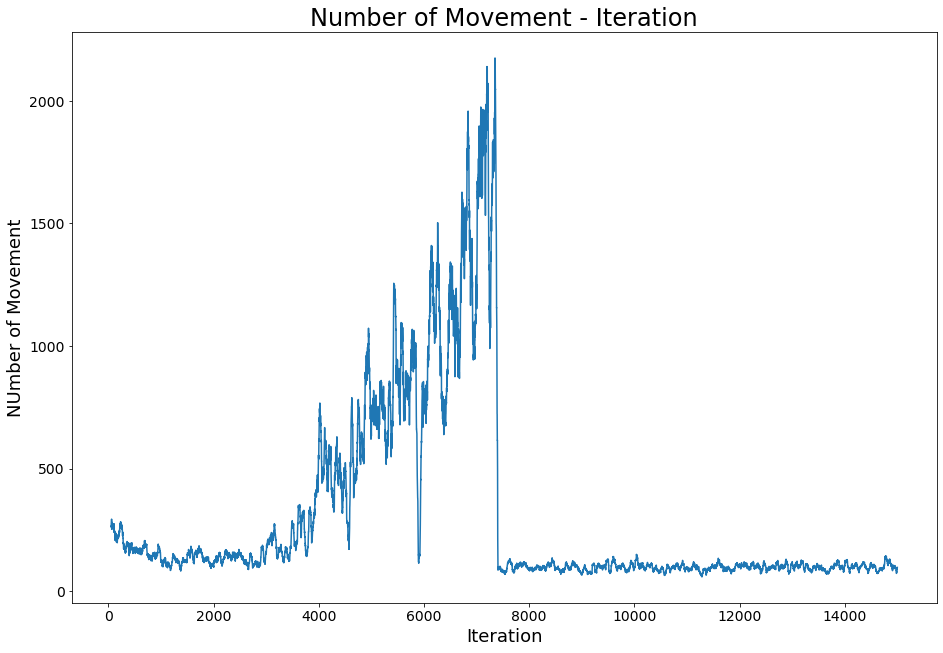

In [121]:
np.random.seed(10)
V,policy= WatkinsQ(LAMBDA=1 ,n_episodes=15000)

In [122]:
V

{(4, 15, 0, 0): 0,
 (4, 15, 0, 1): 0,
 (4, 15, 0, 2): 0,
 (4, 15, 0, 3): 0,
 (4, 15, 0, 4): 0,
 (4, 15, 1, 0): 0,
 (4, 15, 1, 1): 0,
 (4, 15, 1, 2): 0,
 (4, 15, 1, 3): 0,
 (4, 15, 1, 4): 0,
 (4, 15, 2, 0): -0.5027786192709408,
 (4, 15, 2, 1): 0,
 (4, 15, 2, 2): 0,
 (4, 15, 2, 3): 0,
 (4, 15, 2, 4): 0,
 (4, 15, 3, 0): -1.021468887736387,
 (4, 15, 3, 1): 0,
 (4, 15, 3, 2): 0,
 (4, 15, 3, 3): 0,
 (4, 15, 3, 4): 0,
 (4, 15, 4, 0): -1.7210008835760808,
 (4, 15, 4, 1): -0.47672174691219726,
 (4, 15, 4, 2): 0,
 (4, 15, 4, 3): 0,
 (4, 15, 4, 4): 0,
 (4, 16, 0, 0): 0,
 (4, 16, 0, 1): 0,
 (4, 16, 0, 2): 0,
 (4, 16, 0, 3): 0,
 (4, 16, 0, 4): 0,
 (4, 16, 1, 0): 0,
 (4, 16, 1, 1): 0,
 (4, 16, 1, 2): 0,
 (4, 16, 1, 3): 0,
 (4, 16, 1, 4): 0,
 (4, 16, 2, 0): -0.8822473368571447,
 (4, 16, 2, 1): 0,
 (4, 16, 2, 2): 0,
 (4, 16, 2, 3): 0,
 (4, 16, 2, 4): 0,
 (4, 16, 3, 0): -1.4449910378046928,
 (4, 16, 3, 1): -0.4695784189095449,
 (4, 16, 3, 2): 0,
 (4, 16, 3, 3): 0,
 (4, 16, 3, 4): 0,
 (4, 16, 4, 0): -1.

In [123]:
policy

{(4, 15, 0, 0): 'DU',
 (4, 15, 0, 1): 'UD',
 (4, 15, 0, 2): 'DD',
 (4, 15, 0, 3): 'ZU',
 (4, 15, 0, 4): 'ZZ',
 (4, 15, 1, 0): 'ZU',
 (4, 15, 1, 1): 'UZ',
 (4, 15, 1, 2): 'ZZ',
 (4, 15, 1, 3): 'UU',
 (4, 15, 1, 4): 'ZU',
 (4, 15, 2, 0): 'ZZ',
 (4, 15, 2, 1): 'UU',
 (4, 15, 2, 2): 'UU',
 (4, 15, 2, 3): 'DU',
 (4, 15, 2, 4): 'DU',
 (4, 15, 3, 0): 'ZU',
 (4, 15, 3, 1): 'ZU',
 (4, 15, 3, 2): 'DZ',
 (4, 15, 3, 3): 'UU',
 (4, 15, 3, 4): 'UD',
 (4, 15, 4, 0): 'DU',
 (4, 15, 4, 1): 'ZD',
 (4, 15, 4, 2): 'DZ',
 (4, 15, 4, 3): 'ZZ',
 (4, 15, 4, 4): 'DU',
 (4, 16, 0, 0): 'DU',
 (4, 16, 0, 1): 'DZ',
 (4, 16, 0, 2): 'DZ',
 (4, 16, 0, 3): 'DZ',
 (4, 16, 0, 4): 'DU',
 (4, 16, 1, 0): 'ZZ',
 (4, 16, 1, 1): 'UU',
 (4, 16, 1, 2): 'UZ',
 (4, 16, 1, 3): 'ZD',
 (4, 16, 1, 4): 'UZ',
 (4, 16, 2, 0): 'ZZ',
 (4, 16, 2, 1): 'UU',
 (4, 16, 2, 2): 'DD',
 (4, 16, 2, 3): 'UZ',
 (4, 16, 2, 4): 'UZ',
 (4, 16, 3, 0): 'DU',
 (4, 16, 3, 1): 'ZD',
 (4, 16, 3, 2): 'ZU',
 (4, 16, 3, 3): 'ZU',
 (4, 16, 3, 4): 'DU',
 (4, 16, 4

#### Gamma = 0.9 & Alpha = 0.1 & epsilon = Dynamic

0 #############################################################################################


1 #############################################################################################


2 #############################################################################################


3 #############################################################################################


4 #############################################################################################


5 #############################################################################################


6 #############################################################################################


7 #############################################################################################


8 #############################################################################################


9 #############################################################################################


10 #################

83 #############################################################################################


84 #############################################################################################


85 #############################################################################################


86 #############################################################################################


87 #############################################################################################


88 #############################################################################################


89 #############################################################################################


90 #############################################################################################


91 #############################################################################################


92 #############################################################################################


93 #######

166 #############################################################################################


167 #############################################################################################


168 #############################################################################################


169 #############################################################################################


170 #############################################################################################


171 #############################################################################################


172 #############################################################################################


173 #############################################################################################


174 #############################################################################################


175 #############################################################################################




248 #############################################################################################


249 #############################################################################################


250 #############################################################################################


251 #############################################################################################


252 #############################################################################################


253 #############################################################################################


254 #############################################################################################


255 #############################################################################################


256 #############################################################################################


257 #############################################################################################




330 #############################################################################################


331 #############################################################################################


332 #############################################################################################


333 #############################################################################################


334 #############################################################################################


335 #############################################################################################


336 #############################################################################################


337 #############################################################################################


338 #############################################################################################


339 #############################################################################################




412 #############################################################################################


413 #############################################################################################


414 #############################################################################################


415 #############################################################################################


416 #############################################################################################


417 #############################################################################################


418 #############################################################################################


419 #############################################################################################


420 #############################################################################################


421 #############################################################################################




494 #############################################################################################


495 #############################################################################################


496 #############################################################################################


497 #############################################################################################


498 #############################################################################################


499 #############################################################################################


500 #############################################################################################


501 #############################################################################################


502 #############################################################################################


503 #############################################################################################




576 #############################################################################################


577 #############################################################################################


578 #############################################################################################


579 #############################################################################################


580 #############################################################################################


581 #############################################################################################


582 #############################################################################################


583 #############################################################################################


584 #############################################################################################


585 #############################################################################################




658 #############################################################################################


659 #############################################################################################


660 #############################################################################################


661 #############################################################################################


662 #############################################################################################


663 #############################################################################################


664 #############################################################################################


665 #############################################################################################


666 #############################################################################################


667 #############################################################################################




740 #############################################################################################


741 #############################################################################################


742 #############################################################################################


743 #############################################################################################


744 #############################################################################################


745 #############################################################################################


746 #############################################################################################


747 #############################################################################################


748 #############################################################################################


749 #############################################################################################




822 #############################################################################################


823 #############################################################################################


824 #############################################################################################


825 #############################################################################################


826 #############################################################################################


827 #############################################################################################


828 #############################################################################################


829 #############################################################################################


830 #############################################################################################


831 #############################################################################################




904 #############################################################################################


905 #############################################################################################


906 #############################################################################################


907 #############################################################################################


908 #############################################################################################


909 #############################################################################################


910 #############################################################################################


911 #############################################################################################


912 #############################################################################################


913 #############################################################################################




986 #############################################################################################


987 #############################################################################################


988 #############################################################################################


989 #############################################################################################


990 #############################################################################################


991 #############################################################################################


992 #############################################################################################


993 #############################################################################################


994 #############################################################################################


995 #############################################################################################




1068 #############################################################################################


1069 #############################################################################################


1070 #############################################################################################


1071 #############################################################################################


1072 #############################################################################################


1073 #############################################################################################


1074 #############################################################################################


1075 #############################################################################################


1076 #############################################################################################


1077 ######################################################################################

1150 #############################################################################################


1151 #############################################################################################


1152 #############################################################################################


1153 #############################################################################################


1154 #############################################################################################


1155 #############################################################################################


1156 #############################################################################################


1157 #############################################################################################


1158 #############################################################################################


1159 ######################################################################################

1232 #############################################################################################


1233 #############################################################################################


1234 #############################################################################################


1235 #############################################################################################


1236 #############################################################################################


1237 #############################################################################################


1238 #############################################################################################


1239 #############################################################################################


1240 #############################################################################################


1241 ######################################################################################

1314 #############################################################################################


1315 #############################################################################################


1316 #############################################################################################


1317 #############################################################################################


1318 #############################################################################################


1319 #############################################################################################


1320 #############################################################################################


1321 #############################################################################################


1322 #############################################################################################


1323 ######################################################################################

1396 #############################################################################################


1397 #############################################################################################


1398 #############################################################################################


1399 #############################################################################################


1400 #############################################################################################


1401 #############################################################################################


1402 #############################################################################################


1403 #############################################################################################


1404 #############################################################################################


1405 ######################################################################################

1478 #############################################################################################


1479 #############################################################################################


1480 #############################################################################################


1481 #############################################################################################


1482 #############################################################################################


1483 #############################################################################################


1484 #############################################################################################


1485 #############################################################################################


1486 #############################################################################################


1487 ######################################################################################

1560 #############################################################################################


1561 #############################################################################################


1562 #############################################################################################


1563 #############################################################################################


1564 #############################################################################################


1565 #############################################################################################


1566 #############################################################################################


1567 #############################################################################################


1568 #############################################################################################


1569 ######################################################################################

1642 #############################################################################################


1643 #############################################################################################


1644 #############################################################################################


1645 #############################################################################################


1646 #############################################################################################


1647 #############################################################################################


1648 #############################################################################################


1649 #############################################################################################


1650 #############################################################################################


1651 ######################################################################################

1724 #############################################################################################


1725 #############################################################################################


1726 #############################################################################################


1727 #############################################################################################


1728 #############################################################################################


1729 #############################################################################################


1730 #############################################################################################


1731 #############################################################################################


1732 #############################################################################################


1733 ######################################################################################

1806 #############################################################################################


1807 #############################################################################################


1808 #############################################################################################


1809 #############################################################################################


1810 #############################################################################################


1811 #############################################################################################


1812 #############################################################################################


1813 #############################################################################################


1814 #############################################################################################


1815 ######################################################################################

1888 #############################################################################################


1889 #############################################################################################


1890 #############################################################################################


1891 #############################################################################################


1892 #############################################################################################


1893 #############################################################################################


1894 #############################################################################################


1895 #############################################################################################


1896 #############################################################################################


1897 ######################################################################################

1970 #############################################################################################


1971 #############################################################################################


1972 #############################################################################################


1973 #############################################################################################


1974 #############################################################################################


1975 #############################################################################################


1976 #############################################################################################


1977 #############################################################################################


1978 #############################################################################################


1979 ######################################################################################

2052 #############################################################################################


2053 #############################################################################################


2054 #############################################################################################


2055 #############################################################################################


2056 #############################################################################################


2057 #############################################################################################


2058 #############################################################################################


2059 #############################################################################################


2060 #############################################################################################


2061 ######################################################################################

2134 #############################################################################################


2135 #############################################################################################


2136 #############################################################################################


2137 #############################################################################################


2138 #############################################################################################


2139 #############################################################################################


2140 #############################################################################################


2141 #############################################################################################


2142 #############################################################################################


2143 ######################################################################################

2216 #############################################################################################


2217 #############################################################################################


2218 #############################################################################################


2219 #############################################################################################


2220 #############################################################################################


2221 #############################################################################################


2222 #############################################################################################


2223 #############################################################################################


2224 #############################################################################################


2225 ######################################################################################

2298 #############################################################################################


2299 #############################################################################################


2300 #############################################################################################


2301 #############################################################################################


2302 #############################################################################################


2303 #############################################################################################


2304 #############################################################################################


2305 #############################################################################################


2306 #############################################################################################


2307 ######################################################################################

2380 #############################################################################################


2381 #############################################################################################


2382 #############################################################################################


2383 #############################################################################################


2384 #############################################################################################


2385 #############################################################################################


2386 #############################################################################################


2387 #############################################################################################


2388 #############################################################################################


2389 ######################################################################################

2463 #############################################################################################


2464 #############################################################################################


2465 #############################################################################################


2466 #############################################################################################


2467 #############################################################################################


2468 #############################################################################################


2469 #############################################################################################


2470 #############################################################################################


2471 #############################################################################################


2472 ######################################################################################

2545 #############################################################################################


2546 #############################################################################################


2547 #############################################################################################


2548 #############################################################################################


2549 #############################################################################################


2550 #############################################################################################


2551 #############################################################################################


2552 #############################################################################################


2553 #############################################################################################


2554 ######################################################################################

2627 #############################################################################################


2628 #############################################################################################


2629 #############################################################################################


2630 #############################################################################################


2631 #############################################################################################


2632 #############################################################################################


2633 #############################################################################################


2634 #############################################################################################


2635 #############################################################################################


2636 ######################################################################################

2709 #############################################################################################


2710 #############################################################################################


2711 #############################################################################################


2712 #############################################################################################


2713 #############################################################################################


2714 #############################################################################################


2715 #############################################################################################


2716 #############################################################################################


2717 #############################################################################################


2718 ######################################################################################

2791 #############################################################################################


2792 #############################################################################################


2793 #############################################################################################


2794 #############################################################################################


2795 #############################################################################################


2796 #############################################################################################


2797 #############################################################################################


2798 #############################################################################################


2799 #############################################################################################


2800 ######################################################################################

2873 #############################################################################################


2874 #############################################################################################


2875 #############################################################################################


2876 #############################################################################################


2877 #############################################################################################


2878 #############################################################################################


2879 #############################################################################################


2880 #############################################################################################


2881 #############################################################################################


2882 ######################################################################################

2955 #############################################################################################


2956 #############################################################################################


2957 #############################################################################################


2958 #############################################################################################


2959 #############################################################################################


2960 #############################################################################################


2961 #############################################################################################


2962 #############################################################################################


2963 #############################################################################################


2964 ######################################################################################

3037 #############################################################################################


3038 #############################################################################################


3039 #############################################################################################


3040 #############################################################################################


3041 #############################################################################################


3042 #############################################################################################


3043 #############################################################################################


3044 #############################################################################################


3045 #############################################################################################


3046 ######################################################################################

3119 #############################################################################################


3120 #############################################################################################


3121 #############################################################################################


3122 #############################################################################################


3123 #############################################################################################


3124 #############################################################################################


3125 #############################################################################################


3126 #############################################################################################


3127 #############################################################################################


3128 ######################################################################################

3201 #############################################################################################


3202 #############################################################################################


3203 #############################################################################################


3204 #############################################################################################


3205 #############################################################################################


3206 #############################################################################################


3207 #############################################################################################


3208 #############################################################################################


3209 #############################################################################################


3210 ######################################################################################

3283 #############################################################################################


3284 #############################################################################################


3285 #############################################################################################


3286 #############################################################################################


3287 #############################################################################################


3288 #############################################################################################


3289 #############################################################################################


3290 #############################################################################################


3291 #############################################################################################


3292 ######################################################################################

3365 #############################################################################################


3366 #############################################################################################


3367 #############################################################################################


3368 #############################################################################################


3369 #############################################################################################


3370 #############################################################################################


3371 #############################################################################################


3372 #############################################################################################


3373 #############################################################################################


3374 ######################################################################################

3447 #############################################################################################


3448 #############################################################################################


3449 #############################################################################################


3450 #############################################################################################


3451 #############################################################################################


3452 #############################################################################################


3453 #############################################################################################


3454 #############################################################################################


3455 #############################################################################################


3456 ######################################################################################

3529 #############################################################################################


3530 #############################################################################################


3531 #############################################################################################


3532 #############################################################################################


3533 #############################################################################################


3534 #############################################################################################


3535 #############################################################################################


3536 #############################################################################################


3537 #############################################################################################


3538 ######################################################################################

3611 #############################################################################################


3612 #############################################################################################


3613 #############################################################################################


3614 #############################################################################################


3615 #############################################################################################


3616 #############################################################################################


3617 #############################################################################################


3618 #############################################################################################


3619 #############################################################################################


3620 ######################################################################################

3693 #############################################################################################


3694 #############################################################################################


3695 #############################################################################################


3696 #############################################################################################


3697 #############################################################################################


3698 #############################################################################################


3699 #############################################################################################


3700 #############################################################################################


3701 #############################################################################################


3702 ######################################################################################

3775 #############################################################################################


3776 #############################################################################################


3777 #############################################################################################


3778 #############################################################################################


3779 #############################################################################################


3780 #############################################################################################


3781 #############################################################################################


3782 #############################################################################################


3783 #############################################################################################


3784 ######################################################################################

3857 #############################################################################################


3858 #############################################################################################


3859 #############################################################################################


3860 #############################################################################################


3861 #############################################################################################


3862 #############################################################################################


3863 #############################################################################################


3864 #############################################################################################


3865 #############################################################################################


3866 ######################################################################################

3939 #############################################################################################


3940 #############################################################################################


3941 #############################################################################################


3942 #############################################################################################


3943 #############################################################################################


3944 #############################################################################################


3945 #############################################################################################


3946 #############################################################################################


3947 #############################################################################################


3948 ######################################################################################

4021 #############################################################################################


4022 #############################################################################################


4023 #############################################################################################


4024 #############################################################################################


4025 #############################################################################################


4026 #############################################################################################


4027 #############################################################################################


4028 #############################################################################################


4029 #############################################################################################


4030 ######################################################################################

4103 #############################################################################################


4104 #############################################################################################


4105 #############################################################################################


4106 #############################################################################################


4107 #############################################################################################


4108 #############################################################################################


4109 #############################################################################################


4110 #############################################################################################


4111 #############################################################################################


4112 ######################################################################################

4186 #############################################################################################


4187 #############################################################################################


4188 #############################################################################################


4189 #############################################################################################


4190 #############################################################################################


4191 #############################################################################################


4192 #############################################################################################


4193 #############################################################################################


4194 #############################################################################################


4195 ######################################################################################

4268 #############################################################################################


4269 #############################################################################################


4270 #############################################################################################


4271 #############################################################################################


4272 #############################################################################################


4273 #############################################################################################


4274 #############################################################################################


4275 #############################################################################################


4276 #############################################################################################


4277 ######################################################################################

4350 #############################################################################################


4351 #############################################################################################


4352 #############################################################################################


4353 #############################################################################################


4354 #############################################################################################


4355 #############################################################################################


4356 #############################################################################################


4357 #############################################################################################


4358 #############################################################################################


4359 ######################################################################################

4433 #############################################################################################


4434 #############################################################################################


4435 #############################################################################################


4436 #############################################################################################


4437 #############################################################################################


4438 #############################################################################################


4439 #############################################################################################


4440 #############################################################################################


4441 #############################################################################################


4442 ######################################################################################

4515 #############################################################################################


4516 #############################################################################################


4517 #############################################################################################


4518 #############################################################################################


4519 #############################################################################################


4520 #############################################################################################


4521 #############################################################################################


4522 #############################################################################################


4523 #############################################################################################


4524 ######################################################################################

4597 #############################################################################################


4598 #############################################################################################


4599 #############################################################################################


4600 #############################################################################################


4601 #############################################################################################


4602 #############################################################################################


4603 #############################################################################################


4604 #############################################################################################


4605 #############################################################################################


4606 ######################################################################################

4679 #############################################################################################


4680 #############################################################################################


4681 #############################################################################################


4682 #############################################################################################


4683 #############################################################################################


4684 #############################################################################################


4685 #############################################################################################


4686 #############################################################################################


4687 #############################################################################################


4688 ######################################################################################

4761 #############################################################################################


4762 #############################################################################################


4763 #############################################################################################


4764 #############################################################################################


4765 #############################################################################################


4766 #############################################################################################


4767 #############################################################################################


4768 #############################################################################################


4769 #############################################################################################


4770 ######################################################################################

4843 #############################################################################################


4844 #############################################################################################


4845 #############################################################################################


4846 #############################################################################################


4847 #############################################################################################


4848 #############################################################################################


4849 #############################################################################################


4850 #############################################################################################


4851 #############################################################################################


4852 ######################################################################################

4925 #############################################################################################


4926 #############################################################################################


4927 #############################################################################################


4928 #############################################################################################


4929 #############################################################################################


4930 #############################################################################################


4931 #############################################################################################


4932 #############################################################################################


4933 #############################################################################################


4934 ######################################################################################

5007 #############################################################################################


5008 #############################################################################################


5009 #############################################################################################


5010 #############################################################################################


5011 #############################################################################################


5012 #############################################################################################


5013 #############################################################################################


5014 #############################################################################################


5015 #############################################################################################


5016 ######################################################################################

5089 #############################################################################################


5090 #############################################################################################


5091 #############################################################################################


5092 #############################################################################################


5093 #############################################################################################


5094 #############################################################################################


5095 #############################################################################################


5096 #############################################################################################


5097 #############################################################################################


5098 ######################################################################################

5171 #############################################################################################


5172 #############################################################################################


5173 #############################################################################################


5174 #############################################################################################


5175 #############################################################################################


5176 #############################################################################################


5177 #############################################################################################


5178 #############################################################################################


5179 #############################################################################################


5180 ######################################################################################

5253 #############################################################################################


5254 #############################################################################################


5255 #############################################################################################


5256 #############################################################################################


5257 #############################################################################################


5258 #############################################################################################


5259 #############################################################################################


5260 #############################################################################################


5261 #############################################################################################


5262 ######################################################################################

5335 #############################################################################################


5336 #############################################################################################


5337 #############################################################################################


5338 #############################################################################################


5339 #############################################################################################


5340 #############################################################################################


5341 #############################################################################################


5342 #############################################################################################


5343 #############################################################################################


5344 ######################################################################################

5417 #############################################################################################


5418 #############################################################################################


5419 #############################################################################################


5420 #############################################################################################


5421 #############################################################################################


5422 #############################################################################################


5423 #############################################################################################


5424 #############################################################################################


5425 #############################################################################################


5426 ######################################################################################

5499 #############################################################################################


5500 #############################################################################################


5501 #############################################################################################


5502 #############################################################################################


5503 #############################################################################################


5504 #############################################################################################


5505 #############################################################################################


5506 #############################################################################################


5507 #############################################################################################


5508 ######################################################################################

5581 #############################################################################################


5582 #############################################################################################


5583 #############################################################################################


5584 #############################################################################################


5585 #############################################################################################


5586 #############################################################################################


5587 #############################################################################################


5588 #############################################################################################


5589 #############################################################################################


5590 ######################################################################################

5663 #############################################################################################


5664 #############################################################################################


5665 #############################################################################################


5666 #############################################################################################


5667 #############################################################################################


5668 #############################################################################################


5669 #############################################################################################


5670 #############################################################################################


5671 #############################################################################################


5672 ######################################################################################

5745 #############################################################################################


5746 #############################################################################################


5747 #############################################################################################


5748 #############################################################################################


5749 #############################################################################################


5750 #############################################################################################


5751 #############################################################################################


5752 #############################################################################################


5753 #############################################################################################


5754 ######################################################################################

5827 #############################################################################################


5828 #############################################################################################


5829 #############################################################################################


5830 #############################################################################################


5831 #############################################################################################


5832 #############################################################################################


5833 #############################################################################################


5834 #############################################################################################


5835 #############################################################################################


5836 ######################################################################################

5909 #############################################################################################


5910 #############################################################################################


5911 #############################################################################################


5912 #############################################################################################


5913 #############################################################################################


5914 #############################################################################################


5915 #############################################################################################


5916 #############################################################################################


5917 #############################################################################################


5918 ######################################################################################

5991 #############################################################################################


5992 #############################################################################################


5993 #############################################################################################


5994 #############################################################################################


5995 #############################################################################################


5996 #############################################################################################


5997 #############################################################################################


5998 #############################################################################################


5999 #############################################################################################


6000 ######################################################################################

6073 #############################################################################################


6074 #############################################################################################


6075 #############################################################################################


6076 #############################################################################################


6077 #############################################################################################


6078 #############################################################################################


6079 #############################################################################################


6080 #############################################################################################


6081 #############################################################################################


6082 ######################################################################################

6155 #############################################################################################


6156 #############################################################################################


6157 #############################################################################################


6158 #############################################################################################


6159 #############################################################################################


6160 #############################################################################################


6161 #############################################################################################


6162 #############################################################################################


6163 #############################################################################################


6164 ######################################################################################

6237 #############################################################################################


6238 #############################################################################################


6239 #############################################################################################


6240 #############################################################################################


6241 #############################################################################################


6242 #############################################################################################


6243 #############################################################################################


6244 #############################################################################################


6245 #############################################################################################


6246 ######################################################################################

6320 #############################################################################################


6321 #############################################################################################


6322 #############################################################################################


6323 #############################################################################################


6324 #############################################################################################


6325 #############################################################################################


6326 #############################################################################################


6327 #############################################################################################


6328 #############################################################################################


6329 ######################################################################################

6402 #############################################################################################


6403 #############################################################################################


6404 #############################################################################################


6405 #############################################################################################


6406 #############################################################################################


6407 #############################################################################################


6408 #############################################################################################


6409 #############################################################################################


6410 #############################################################################################


6411 ######################################################################################

6484 #############################################################################################


6485 #############################################################################################


6486 #############################################################################################


6487 #############################################################################################


6488 #############################################################################################


6489 #############################################################################################


6490 #############################################################################################


6491 #############################################################################################


6492 #############################################################################################


6493 ######################################################################################

6566 #############################################################################################


6567 #############################################################################################


6568 #############################################################################################


6569 #############################################################################################


6570 #############################################################################################


6571 #############################################################################################


6572 #############################################################################################


6573 #############################################################################################


6574 #############################################################################################


6575 ######################################################################################

6648 #############################################################################################


6649 #############################################################################################


6650 #############################################################################################


6651 #############################################################################################


6652 #############################################################################################


6653 #############################################################################################


6654 #############################################################################################


6655 #############################################################################################


6656 #############################################################################################


6657 ######################################################################################

6731 #############################################################################################


6732 #############################################################################################


6733 #############################################################################################


6734 #############################################################################################


6735 #############################################################################################


6736 #############################################################################################


6737 #############################################################################################


6738 #############################################################################################


6739 #############################################################################################


6740 ######################################################################################

6813 #############################################################################################


6814 #############################################################################################


6815 #############################################################################################


6816 #############################################################################################


6817 #############################################################################################


6818 #############################################################################################


6819 #############################################################################################


6820 #############################################################################################


6821 #############################################################################################


6822 ######################################################################################

6895 #############################################################################################


6896 #############################################################################################


6897 #############################################################################################


6898 #############################################################################################


6899 #############################################################################################


6900 #############################################################################################


6901 #############################################################################################


6902 #############################################################################################


6903 #############################################################################################


6904 ######################################################################################

6978 #############################################################################################


6979 #############################################################################################


6980 #############################################################################################


6981 #############################################################################################


6982 #############################################################################################


6983 #############################################################################################


6984 #############################################################################################


6985 #############################################################################################


6986 #############################################################################################


6987 ######################################################################################

7061 #############################################################################################


7062 #############################################################################################


7063 #############################################################################################


7064 #############################################################################################


7065 #############################################################################################


7066 #############################################################################################


7067 #############################################################################################


7068 #############################################################################################


7069 #############################################################################################


7070 ######################################################################################

7143 #############################################################################################


7144 #############################################################################################


7145 #############################################################################################


7146 #############################################################################################


7147 #############################################################################################


7148 #############################################################################################


7149 #############################################################################################


7150 #############################################################################################


7151 #############################################################################################


7152 ######################################################################################

7225 #############################################################################################


7226 #############################################################################################


7227 #############################################################################################


7228 #############################################################################################


7229 #############################################################################################


7230 #############################################################################################


7231 #############################################################################################


7232 #############################################################################################


7233 #############################################################################################


7234 ######################################################################################

7307 #############################################################################################


7308 #############################################################################################


7309 #############################################################################################


7310 #############################################################################################


7311 #############################################################################################


7312 #############################################################################################


7313 #############################################################################################


7314 #############################################################################################


7315 #############################################################################################


7316 ######################################################################################

7389 #############################################################################################


7390 #############################################################################################


7391 #############################################################################################


7392 #############################################################################################


7393 #############################################################################################


7394 #############################################################################################


7395 #############################################################################################


7396 #############################################################################################


7397 #############################################################################################


7398 ######################################################################################

7471 #############################################################################################


7472 #############################################################################################


7473 #############################################################################################


7474 #############################################################################################


7475 #############################################################################################


7476 #############################################################################################


7477 #############################################################################################


7478 #############################################################################################


7479 #############################################################################################


7480 ######################################################################################

7553 #############################################################################################


7554 #############################################################################################


7555 #############################################################################################


7556 #############################################################################################


7557 #############################################################################################


7558 #############################################################################################


7559 #############################################################################################


7560 #############################################################################################


7561 #############################################################################################


7562 ######################################################################################

7635 #############################################################################################


7636 #############################################################################################


7637 #############################################################################################


7638 #############################################################################################


7639 #############################################################################################


7640 #############################################################################################


7641 #############################################################################################


7642 #############################################################################################


7643 #############################################################################################


7644 ######################################################################################

7717 #############################################################################################


7718 #############################################################################################


7719 #############################################################################################


7720 #############################################################################################


7721 #############################################################################################


7722 #############################################################################################


7723 #############################################################################################


7724 #############################################################################################


7725 #############################################################################################


7726 ######################################################################################

7799 #############################################################################################


7800 #############################################################################################


7801 #############################################################################################


7802 #############################################################################################


7803 #############################################################################################


7804 #############################################################################################


7805 #############################################################################################


7806 #############################################################################################


7807 #############################################################################################


7808 ######################################################################################

7881 #############################################################################################


7882 #############################################################################################


7883 #############################################################################################


7884 #############################################################################################


7885 #############################################################################################


7886 #############################################################################################


7887 #############################################################################################


7888 #############################################################################################


7889 #############################################################################################


7890 ######################################################################################

7963 #############################################################################################


7964 #############################################################################################


7965 #############################################################################################


7966 #############################################################################################


7967 #############################################################################################


7968 #############################################################################################


7969 #############################################################################################


7970 #############################################################################################


7971 #############################################################################################


7972 ######################################################################################

8045 #############################################################################################


8046 #############################################################################################


8047 #############################################################################################


8048 #############################################################################################


8049 #############################################################################################


8050 #############################################################################################


8051 #############################################################################################


8052 #############################################################################################


8053 #############################################################################################


8054 ######################################################################################

8127 #############################################################################################


8128 #############################################################################################


8129 #############################################################################################


8130 #############################################################################################


8131 #############################################################################################


8132 #############################################################################################


8133 #############################################################################################


8134 #############################################################################################


8135 #############################################################################################


8136 ######################################################################################

8209 #############################################################################################


8210 #############################################################################################


8211 #############################################################################################


8212 #############################################################################################


8213 #############################################################################################


8214 #############################################################################################


8215 #############################################################################################


8216 #############################################################################################


8217 #############################################################################################


8218 ######################################################################################

8291 #############################################################################################


8292 #############################################################################################


8293 #############################################################################################


8294 #############################################################################################


8295 #############################################################################################


8296 #############################################################################################


8297 #############################################################################################


8298 #############################################################################################


8299 #############################################################################################


8300 ######################################################################################

8373 #############################################################################################


8374 #############################################################################################


8375 #############################################################################################


8376 #############################################################################################


8377 #############################################################################################


8378 #############################################################################################


8379 #############################################################################################


8380 #############################################################################################


8381 #############################################################################################


8382 ######################################################################################

8455 #############################################################################################


8456 #############################################################################################


8457 #############################################################################################


8458 #############################################################################################


8459 #############################################################################################


8460 #############################################################################################


8461 #############################################################################################


8462 #############################################################################################


8463 #############################################################################################


8464 ######################################################################################

8537 #############################################################################################


8538 #############################################################################################


8539 #############################################################################################


8540 #############################################################################################


8541 #############################################################################################


8542 #############################################################################################


8543 #############################################################################################


8544 #############################################################################################


8545 #############################################################################################


8546 ######################################################################################

8619 #############################################################################################


8620 #############################################################################################


8621 #############################################################################################


8622 #############################################################################################


8623 #############################################################################################


8624 #############################################################################################


8625 #############################################################################################


8626 #############################################################################################


8627 #############################################################################################


8628 ######################################################################################

8701 #############################################################################################


8702 #############################################################################################


8703 #############################################################################################


8704 #############################################################################################


8705 #############################################################################################


8706 #############################################################################################


8707 #############################################################################################


8708 #############################################################################################


8709 #############################################################################################


8710 ######################################################################################

8783 #############################################################################################


8784 #############################################################################################


8785 #############################################################################################


8786 #############################################################################################


8787 #############################################################################################


8788 #############################################################################################


8789 #############################################################################################


8790 #############################################################################################


8791 #############################################################################################


8792 ######################################################################################

8865 #############################################################################################


8866 #############################################################################################


8867 #############################################################################################


8868 #############################################################################################


8869 #############################################################################################


8870 #############################################################################################


8871 #############################################################################################


8872 #############################################################################################


8873 #############################################################################################


8874 ######################################################################################

8947 #############################################################################################


8948 #############################################################################################


8949 #############################################################################################


8950 #############################################################################################


8951 #############################################################################################


8952 #############################################################################################


8953 #############################################################################################


8954 #############################################################################################


8955 #############################################################################################


8956 ######################################################################################

9029 #############################################################################################


9030 #############################################################################################


9031 #############################################################################################


9032 #############################################################################################


9033 #############################################################################################


9034 #############################################################################################


9035 #############################################################################################


9036 #############################################################################################


9037 #############################################################################################


9038 ######################################################################################

9111 #############################################################################################


9112 #############################################################################################


9113 #############################################################################################


9114 #############################################################################################


9115 #############################################################################################


9116 #############################################################################################


9117 #############################################################################################


9118 #############################################################################################


9119 #############################################################################################


9120 ######################################################################################

9193 #############################################################################################


9194 #############################################################################################


9195 #############################################################################################


9196 #############################################################################################


9197 #############################################################################################


9198 #############################################################################################


9199 #############################################################################################


9200 #############################################################################################


9201 #############################################################################################


9202 ######################################################################################

9275 #############################################################################################


9276 #############################################################################################


9277 #############################################################################################


9278 #############################################################################################


9279 #############################################################################################


9280 #############################################################################################


9281 #############################################################################################


9282 #############################################################################################


9283 #############################################################################################


9284 ######################################################################################

9358 #############################################################################################


9359 #############################################################################################


9360 #############################################################################################


9361 #############################################################################################


9362 #############################################################################################


9363 #############################################################################################


9364 #############################################################################################


9365 #############################################################################################


9366 #############################################################################################


9367 ######################################################################################

9440 #############################################################################################


9441 #############################################################################################


9442 #############################################################################################


9443 #############################################################################################


9444 #############################################################################################


9445 #############################################################################################


9446 #############################################################################################


9447 #############################################################################################


9448 #############################################################################################


9449 ######################################################################################

9522 #############################################################################################


9523 #############################################################################################


9524 #############################################################################################


9525 #############################################################################################


9526 #############################################################################################


9527 #############################################################################################


9528 #############################################################################################


9529 #############################################################################################


9530 #############################################################################################


9531 ######################################################################################

9604 #############################################################################################


9605 #############################################################################################


9606 #############################################################################################


9607 #############################################################################################


9608 #############################################################################################


9609 #############################################################################################


9610 #############################################################################################


9611 #############################################################################################


9612 #############################################################################################


9613 ######################################################################################

9686 #############################################################################################


9687 #############################################################################################


9688 #############################################################################################


9689 #############################################################################################


9690 #############################################################################################


9691 #############################################################################################


9692 #############################################################################################


9693 #############################################################################################


9694 #############################################################################################


9695 ######################################################################################

9769 #############################################################################################


9770 #############################################################################################


9771 #############################################################################################


9772 #############################################################################################


9773 #############################################################################################


9774 #############################################################################################


9775 #############################################################################################


9776 #############################################################################################


9777 #############################################################################################


9778 ######################################################################################

9852 #############################################################################################


9853 #############################################################################################


9854 #############################################################################################


9855 #############################################################################################


9856 #############################################################################################


9857 #############################################################################################


9858 #############################################################################################


9859 #############################################################################################


9860 #############################################################################################


9861 ######################################################################################

9934 #############################################################################################


9935 #############################################################################################


9936 #############################################################################################


9937 #############################################################################################


9938 #############################################################################################


9939 #############################################################################################


9940 #############################################################################################


9941 #############################################################################################


9942 #############################################################################################


9943 ######################################################################################

10015 #############################################################################################


10016 #############################################################################################


10017 #############################################################################################


10018 #############################################################################################


10019 #############################################################################################


10020 #############################################################################################


10021 #############################################################################################


10022 #############################################################################################


10023 #############################################################################################


10024 ############################################################################

10096 #############################################################################################


10097 #############################################################################################


10098 #############################################################################################


10099 #############################################################################################


10100 #############################################################################################


10101 #############################################################################################


10102 #############################################################################################


10103 #############################################################################################


10104 #############################################################################################


10105 ############################################################################

10177 #############################################################################################


10178 #############################################################################################


10179 #############################################################################################


10180 #############################################################################################


10181 #############################################################################################


10182 #############################################################################################


10183 #############################################################################################


10184 #############################################################################################


10185 #############################################################################################


10186 ############################################################################


10259 #############################################################################################


10260 #############################################################################################


10261 #############################################################################################


10262 #############################################################################################


10263 #############################################################################################


10264 #############################################################################################


10265 #############################################################################################


10266 #############################################################################################


10267 #############################################################################################


10268 ###########################################################################

10340 #############################################################################################


10341 #############################################################################################


10342 #############################################################################################


10343 #############################################################################################


10344 #############################################################################################


10345 #############################################################################################


10346 #############################################################################################


10347 #############################################################################################


10348 #############################################################################################


10349 ############################################################################

10422 #############################################################################################


10423 #############################################################################################


10424 #############################################################################################


10425 #############################################################################################


10426 #############################################################################################


10427 #############################################################################################


10428 #############################################################################################


10429 #############################################################################################


10430 #############################################################################################


10431 ############################################################################

10503 #############################################################################################


10504 #############################################################################################


10505 #############################################################################################


10506 #############################################################################################


10507 #############################################################################################


10508 #############################################################################################


10509 #############################################################################################


10510 #############################################################################################


10511 #############################################################################################


10512 ############################################################################

10584 #############################################################################################


10585 #############################################################################################


10586 #############################################################################################


10587 #############################################################################################


10588 #############################################################################################


10589 #############################################################################################


10590 #############################################################################################


10591 #############################################################################################


10592 #############################################################################################


10593 ############################################################################

10665 #############################################################################################


10666 #############################################################################################


10667 #############################################################################################


10668 #############################################################################################


10669 #############################################################################################


10670 #############################################################################################


10671 #############################################################################################


10672 #############################################################################################


10673 #############################################################################################


10674 ############################################################################

10746 #############################################################################################


10747 #############################################################################################


10748 #############################################################################################


10749 #############################################################################################


10750 #############################################################################################


10751 #############################################################################################


10752 #############################################################################################


10753 #############################################################################################


10754 #############################################################################################


10755 ############################################################################

10827 #############################################################################################


10828 #############################################################################################


10829 #############################################################################################


10830 #############################################################################################


10831 #############################################################################################


10832 #############################################################################################


10833 #############################################################################################


10834 #############################################################################################


10835 #############################################################################################


10836 ############################################################################

10908 #############################################################################################


10909 #############################################################################################


10910 #############################################################################################


10911 #############################################################################################


10912 #############################################################################################


10913 #############################################################################################


10914 #############################################################################################


10915 #############################################################################################


10916 #############################################################################################


10917 ############################################################################

10989 #############################################################################################


10990 #############################################################################################


10991 #############################################################################################


10992 #############################################################################################


10993 #############################################################################################


10994 #############################################################################################


10995 #############################################################################################


10996 #############################################################################################


10997 #############################################################################################


10998 ############################################################################

11070 #############################################################################################


11071 #############################################################################################


11072 #############################################################################################


11073 #############################################################################################


11074 #############################################################################################


11075 #############################################################################################


11076 #############################################################################################


11077 #############################################################################################


11078 #############################################################################################


11079 ############################################################################

11151 #############################################################################################


11152 #############################################################################################


11153 #############################################################################################


11154 #############################################################################################


11155 #############################################################################################


11156 #############################################################################################


11157 #############################################################################################


11158 #############################################################################################


11159 #############################################################################################


11160 ############################################################################

11232 #############################################################################################


11233 #############################################################################################


11234 #############################################################################################


11235 #############################################################################################


11236 #############################################################################################


11237 #############################################################################################


11238 #############################################################################################


11239 #############################################################################################


11240 #############################################################################################


11241 ############################################################################

11313 #############################################################################################


11314 #############################################################################################


11315 #############################################################################################


11316 #############################################################################################


11317 #############################################################################################


11318 #############################################################################################


11319 #############################################################################################


11320 #############################################################################################


11321 #############################################################################################


11322 ############################################################################

11394 #############################################################################################


11395 #############################################################################################


11396 #############################################################################################


11397 #############################################################################################


11398 #############################################################################################


11399 #############################################################################################


11400 #############################################################################################


11401 #############################################################################################


11402 #############################################################################################


11403 ############################################################################

11475 #############################################################################################


11476 #############################################################################################


11477 #############################################################################################


11478 #############################################################################################


11479 #############################################################################################


11480 #############################################################################################


11481 #############################################################################################


11482 #############################################################################################


11483 #############################################################################################


11484 ############################################################################

11556 #############################################################################################


11557 #############################################################################################


11558 #############################################################################################


11559 #############################################################################################


11560 #############################################################################################


11561 #############################################################################################


11562 #############################################################################################


11563 #############################################################################################


11564 #############################################################################################


11565 ############################################################################

11637 #############################################################################################


11638 #############################################################################################


11639 #############################################################################################


11640 #############################################################################################


11641 #############################################################################################


11642 #############################################################################################


11643 #############################################################################################


11644 #############################################################################################


11645 #############################################################################################


11646 ############################################################################

11718 #############################################################################################


11719 #############################################################################################


11720 #############################################################################################


11721 #############################################################################################


11722 #############################################################################################


11723 #############################################################################################


11724 #############################################################################################


11725 #############################################################################################


11726 #############################################################################################


11727 ############################################################################

11799 #############################################################################################


11800 #############################################################################################


11801 #############################################################################################


11802 #############################################################################################


11803 #############################################################################################


11804 #############################################################################################


11805 #############################################################################################


11806 #############################################################################################


11807 #############################################################################################


11808 ############################################################################

11880 #############################################################################################


11881 #############################################################################################


11882 #############################################################################################


11883 #############################################################################################


11884 #############################################################################################


11885 #############################################################################################


11886 #############################################################################################


11887 #############################################################################################


11888 #############################################################################################


11889 ############################################################################

11961 #############################################################################################


11962 #############################################################################################


11963 #############################################################################################


11964 #############################################################################################


11965 #############################################################################################


11966 #############################################################################################


11967 #############################################################################################


11968 #############################################################################################


11969 #############################################################################################


11970 ############################################################################

12042 #############################################################################################


12043 #############################################################################################


12044 #############################################################################################


12045 #############################################################################################


12046 #############################################################################################


12047 #############################################################################################


12048 #############################################################################################


12049 #############################################################################################


12050 #############################################################################################


12051 ############################################################################

12123 #############################################################################################


12124 #############################################################################################


12125 #############################################################################################


12126 #############################################################################################


12127 #############################################################################################


12128 #############################################################################################


12129 #############################################################################################


12130 #############################################################################################


12131 #############################################################################################


12132 ############################################################################

12204 #############################################################################################


12205 #############################################################################################


12206 #############################################################################################


12207 #############################################################################################


12208 #############################################################################################


12209 #############################################################################################


12210 #############################################################################################


12211 #############################################################################################


12212 #############################################################################################


12213 ############################################################################

12285 #############################################################################################


12286 #############################################################################################


12287 #############################################################################################


12288 #############################################################################################


12289 #############################################################################################


12290 #############################################################################################


12291 #############################################################################################


12292 #############################################################################################


12293 #############################################################################################


12294 ############################################################################

12366 #############################################################################################


12367 #############################################################################################


12368 #############################################################################################


12369 #############################################################################################


12370 #############################################################################################


12371 #############################################################################################


12372 #############################################################################################


12373 #############################################################################################


12374 #############################################################################################


12375 ############################################################################

12447 #############################################################################################


12448 #############################################################################################


12449 #############################################################################################


12450 #############################################################################################


12451 #############################################################################################


12452 #############################################################################################


12453 #############################################################################################


12454 #############################################################################################


12455 #############################################################################################


12456 ############################################################################

12528 #############################################################################################


12529 #############################################################################################


12530 #############################################################################################


12531 #############################################################################################


12532 #############################################################################################


12533 #############################################################################################


12534 #############################################################################################


12535 #############################################################################################


12536 #############################################################################################


12537 ############################################################################

12609 #############################################################################################


12610 #############################################################################################


12611 #############################################################################################


12612 #############################################################################################


12613 #############################################################################################


12614 #############################################################################################


12615 #############################################################################################


12616 #############################################################################################


12617 #############################################################################################


12618 ############################################################################

12690 #############################################################################################


12691 #############################################################################################


12692 #############################################################################################


12693 #############################################################################################


12694 #############################################################################################


12695 #############################################################################################


12696 #############################################################################################


12697 #############################################################################################


12698 #############################################################################################


12699 ############################################################################

12771 #############################################################################################


12772 #############################################################################################


12773 #############################################################################################


12774 #############################################################################################


12775 #############################################################################################


12776 #############################################################################################


12777 #############################################################################################


12778 #############################################################################################


12779 #############################################################################################


12780 ############################################################################

12852 #############################################################################################


12853 #############################################################################################


12854 #############################################################################################


12855 #############################################################################################


12856 #############################################################################################


12857 #############################################################################################


12858 #############################################################################################


12859 #############################################################################################


12860 #############################################################################################


12861 ############################################################################

12933 #############################################################################################


12934 #############################################################################################


12935 #############################################################################################


12936 #############################################################################################


12937 #############################################################################################


12938 #############################################################################################


12939 #############################################################################################


12940 #############################################################################################


12941 #############################################################################################


12942 ############################################################################

13014 #############################################################################################


13015 #############################################################################################


13016 #############################################################################################


13017 #############################################################################################


13018 #############################################################################################


13019 #############################################################################################


13020 #############################################################################################


13021 #############################################################################################


13022 #############################################################################################


13023 ############################################################################

13095 #############################################################################################


13096 #############################################################################################


13097 #############################################################################################


13098 #############################################################################################


13099 #############################################################################################


13100 #############################################################################################


13101 #############################################################################################


13102 #############################################################################################


13103 #############################################################################################


13104 ############################################################################

13176 #############################################################################################


13177 #############################################################################################


13178 #############################################################################################


13179 #############################################################################################


13180 #############################################################################################


13181 #############################################################################################


13182 #############################################################################################


13183 #############################################################################################


13184 #############################################################################################


13185 ############################################################################

13257 #############################################################################################


13258 #############################################################################################


13259 #############################################################################################


13260 #############################################################################################


13261 #############################################################################################


13262 #############################################################################################


13263 #############################################################################################


13264 #############################################################################################


13265 #############################################################################################


13266 ############################################################################

13338 #############################################################################################


13339 #############################################################################################


13340 #############################################################################################


13341 #############################################################################################


13342 #############################################################################################


13343 #############################################################################################


13344 #############################################################################################


13345 #############################################################################################


13346 #############################################################################################


13347 ############################################################################

13419 #############################################################################################


13420 #############################################################################################


13421 #############################################################################################


13422 #############################################################################################


13423 #############################################################################################


13424 #############################################################################################


13425 #############################################################################################


13426 #############################################################################################


13427 #############################################################################################


13428 ############################################################################

13500 #############################################################################################


13501 #############################################################################################


13502 #############################################################################################


13503 #############################################################################################


13504 #############################################################################################


13505 #############################################################################################


13506 #############################################################################################


13507 #############################################################################################


13508 #############################################################################################


13509 ############################################################################

13581 #############################################################################################


13582 #############################################################################################


13583 #############################################################################################


13584 #############################################################################################


13585 #############################################################################################


13586 #############################################################################################


13587 #############################################################################################


13588 #############################################################################################


13589 #############################################################################################


13590 ############################################################################

13663 #############################################################################################


13664 #############################################################################################


13665 #############################################################################################


13666 #############################################################################################


13667 #############################################################################################


13668 #############################################################################################


13669 #############################################################################################


13670 #############################################################################################


13671 #############################################################################################


13672 ############################################################################

13744 #############################################################################################


13745 #############################################################################################


13746 #############################################################################################


13747 #############################################################################################


13748 #############################################################################################


13749 #############################################################################################


13750 #############################################################################################


13751 #############################################################################################


13752 #############################################################################################


13753 ############################################################################

13825 #############################################################################################


13826 #############################################################################################


13827 #############################################################################################


13828 #############################################################################################


13829 #############################################################################################


13830 #############################################################################################


13831 #############################################################################################


13832 #############################################################################################


13833 #############################################################################################


13834 ############################################################################

13906 #############################################################################################


13907 #############################################################################################


13908 #############################################################################################


13909 #############################################################################################


13910 #############################################################################################


13911 #############################################################################################


13912 #############################################################################################


13913 #############################################################################################


13914 #############################################################################################


13915 ############################################################################

13987 #############################################################################################


13988 #############################################################################################


13989 #############################################################################################


13990 #############################################################################################


13991 #############################################################################################


13992 #############################################################################################


13993 #############################################################################################


13994 #############################################################################################


13995 #############################################################################################


13996 ############################################################################

14068 #############################################################################################


14069 #############################################################################################


14070 #############################################################################################


14071 #############################################################################################


14072 #############################################################################################


14073 #############################################################################################


14074 #############################################################################################


14075 #############################################################################################


14076 #############################################################################################


14077 ############################################################################

14149 #############################################################################################


14150 #############################################################################################


14151 #############################################################################################


14152 #############################################################################################


14153 #############################################################################################


14154 #############################################################################################


14155 #############################################################################################


14156 #############################################################################################


14157 #############################################################################################


14158 ############################################################################

14230 #############################################################################################


14231 #############################################################################################


14232 #############################################################################################


14233 #############################################################################################


14234 #############################################################################################


14235 #############################################################################################


14236 #############################################################################################


14237 #############################################################################################


14238 #############################################################################################


14239 ############################################################################

14312 #############################################################################################


14313 #############################################################################################


14314 #############################################################################################


14315 #############################################################################################


14316 #############################################################################################


14317 #############################################################################################


14318 #############################################################################################


14319 #############################################################################################


14320 #############################################################################################


14321 ############################################################################

14393 #############################################################################################


14394 #############################################################################################


14395 #############################################################################################


14396 #############################################################################################


14397 #############################################################################################


14398 #############################################################################################


14399 #############################################################################################


14400 #############################################################################################


14401 #############################################################################################


14402 ############################################################################

14474 #############################################################################################


14475 #############################################################################################


14476 #############################################################################################


14477 #############################################################################################


14478 #############################################################################################


14479 #############################################################################################


14480 #############################################################################################


14481 #############################################################################################


14482 #############################################################################################


14483 ############################################################################

14555 #############################################################################################


14556 #############################################################################################


14557 #############################################################################################


14558 #############################################################################################


14559 #############################################################################################


14560 #############################################################################################


14561 #############################################################################################


14562 #############################################################################################


14563 #############################################################################################


14564 ############################################################################

14636 #############################################################################################


14637 #############################################################################################


14638 #############################################################################################


14639 #############################################################################################


14640 #############################################################################################


14641 #############################################################################################


14642 #############################################################################################


14643 #############################################################################################


14644 #############################################################################################


14645 ############################################################################

14717 #############################################################################################


14718 #############################################################################################


14719 #############################################################################################


14720 #############################################################################################


14721 #############################################################################################


14722 #############################################################################################


14723 #############################################################################################


14724 #############################################################################################


14725 #############################################################################################


14726 ############################################################################

14798 #############################################################################################


14799 #############################################################################################


14800 #############################################################################################


14801 #############################################################################################


14802 #############################################################################################


14803 #############################################################################################


14804 #############################################################################################


14805 #############################################################################################


14806 #############################################################################################


14807 ############################################################################

14879 #############################################################################################


14880 #############################################################################################


14881 #############################################################################################


14882 #############################################################################################


14883 #############################################################################################


14884 #############################################################################################


14885 #############################################################################################


14886 #############################################################################################


14887 #############################################################################################


14888 ############################################################################

14961 #############################################################################################


14962 #############################################################################################


14963 #############################################################################################


14964 #############################################################################################


14965 #############################################################################################


14966 #############################################################################################


14967 #############################################################################################


14968 #############################################################################################


14969 #############################################################################################


14970 ############################################################################

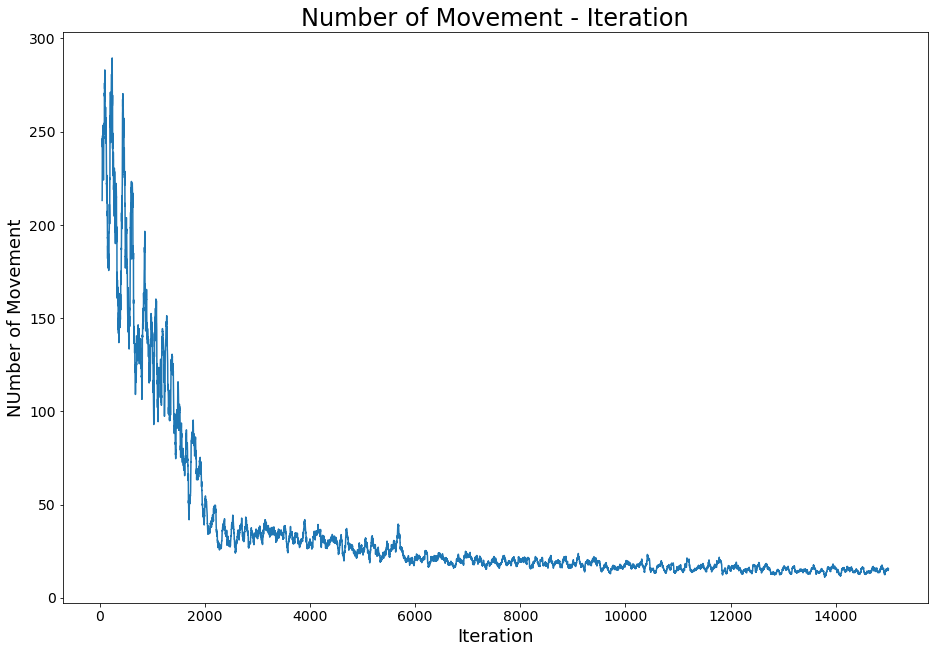

In [135]:
np.random.seed(10)
V,policy= WatkinsQ(LAMBDA=1 ,n_episodes=15000)

In [136]:
V

{(4, 15, 0, 0): 0,
 (4, 15, 0, 1): 0,
 (4, 15, 0, 2): 0,
 (4, 15, 0, 3): 0,
 (4, 15, 0, 4): 0,
 (4, 15, 1, 0): 0,
 (4, 15, 1, 1): 0,
 (4, 15, 1, 2): 0,
 (4, 15, 1, 3): 0,
 (4, 15, 1, 4): 0,
 (4, 15, 2, 0): 0,
 (4, 15, 2, 1): 0,
 (4, 15, 2, 2): 0,
 (4, 15, 2, 3): 0,
 (4, 15, 2, 4): 0,
 (4, 15, 3, 0): -1.0666598545417307,
 (4, 15, 3, 1): 0,
 (4, 15, 3, 2): 0,
 (4, 15, 3, 3): 0,
 (4, 15, 3, 4): 0,
 (4, 15, 4, 0): -1.8855326603551072,
 (4, 15, 4, 1): 0,
 (4, 15, 4, 2): 0,
 (4, 15, 4, 3): 0,
 (4, 15, 4, 4): 0,
 (4, 16, 0, 0): 0,
 (4, 16, 0, 1): 0,
 (4, 16, 0, 2): 0,
 (4, 16, 0, 3): 0,
 (4, 16, 0, 4): 0,
 (4, 16, 1, 0): 0,
 (4, 16, 1, 1): 0,
 (4, 16, 1, 2): 0,
 (4, 16, 1, 3): 0,
 (4, 16, 1, 4): 0,
 (4, 16, 2, 0): -0.9872430671221837,
 (4, 16, 2, 1): 0,
 (4, 16, 2, 2): 0,
 (4, 16, 2, 3): 0,
 (4, 16, 2, 4): 0,
 (4, 16, 3, 0): -1.8202921456860375,
 (4, 16, 3, 1): -0.9783828926481788,
 (4, 16, 3, 2): 0,
 (4, 16, 3, 3): 0,
 (4, 16, 3, 4): 0,
 (4, 16, 4, 0): -2.4799350322332714,
 (4, 16, 4, 1): -1

In [137]:
policy

{(4, 15, 0, 0): 'UD',
 (4, 15, 0, 1): 'UU',
 (4, 15, 0, 2): 'DU',
 (4, 15, 0, 3): 'UD',
 (4, 15, 0, 4): 'DU',
 (4, 15, 1, 0): 'ZU',
 (4, 15, 1, 1): 'UZ',
 (4, 15, 1, 2): 'UU',
 (4, 15, 1, 3): 'ZD',
 (4, 15, 1, 4): 'DD',
 (4, 15, 2, 0): 'UD',
 (4, 15, 2, 1): 'ZU',
 (4, 15, 2, 2): 'DZ',
 (4, 15, 2, 3): 'ZZ',
 (4, 15, 2, 4): 'DU',
 (4, 15, 3, 0): 'ZZ',
 (4, 15, 3, 1): 'UU',
 (4, 15, 3, 2): 'UZ',
 (4, 15, 3, 3): 'UD',
 (4, 15, 3, 4): 'ZD',
 (4, 15, 4, 0): 'DU',
 (4, 15, 4, 1): 'UZ',
 (4, 15, 4, 2): 'UD',
 (4, 15, 4, 3): 'DU',
 (4, 15, 4, 4): 'DU',
 (4, 16, 0, 0): 'UD',
 (4, 16, 0, 1): 'ZD',
 (4, 16, 0, 2): 'UZ',
 (4, 16, 0, 3): 'UD',
 (4, 16, 0, 4): 'ZZ',
 (4, 16, 1, 0): 'ZD',
 (4, 16, 1, 1): 'UU',
 (4, 16, 1, 2): 'ZU',
 (4, 16, 1, 3): 'ZZ',
 (4, 16, 1, 4): 'ZU',
 (4, 16, 2, 0): 'UZ',
 (4, 16, 2, 1): 'UU',
 (4, 16, 2, 2): 'UZ',
 (4, 16, 2, 3): 'DZ',
 (4, 16, 2, 4): 'UD',
 (4, 16, 3, 0): 'ZD',
 (4, 16, 3, 1): 'ZD',
 (4, 16, 3, 2): 'UU',
 (4, 16, 3, 3): 'UU',
 (4, 16, 3, 4): 'ZZ',
 (4, 16, 4

#### Gamma = 0.7 & Alpha = 0.4 & epsilon = Dynamic

In [126]:
def epsilon_greedy(Q, s, it):
    if it < 2000:
        eps = 0.05
        optimum = True
        if np.random.random() < eps:
            optimum = False
            return np.random.choice(ACTION_SPACE),optimum
        else:
            a_opt = max_dict(Q[s])[0]
        return a_opt,optimum
    
    elif(it < 7000) &  (it >= 2000):
        eps = 0.08
        optimum = True
        if np.random.random() < eps:
            optimum = False
            return np.random.choice(ACTION_SPACE),optimum
        else:
            a_opt = max_dict(Q[s])[0]
        return a_opt,optimum
    
    elif  (it >= 7000):
        eps = 0.1
        optimum = True
        if np.random.random() < eps:
            optimum = False
            return np.random.choice(ACTION_SPACE),optimum
        else:
            a_opt = max_dict(Q[s])[0]
        return a_opt,optimum
    
        

In [127]:
def WatkinsQ(LAMBDA,n_episodes):
    # initialize Q(s,a)
    Q = {}
    E={}
    for s in states:
        Q[s] = {}
        E[s]={}
        for a in ACTION_SPACE:
            Q[s][a] = 0
    GAMMA=0.7
    ALPHA = 0.4
    total_movement=[]
    for it in range(n_episodes):
        print(it,'#############################################################################################\n\n')
        movement=0
        for s in states:
            for a in ACTION_SPACE:
                E[s][a] = 0
        # begin a new episode
        s= random_initial_state()
        #print(s)
        visited_state_action={}
        while not is_terminal(s):
            # perform action and get next state + reward
            a,opt = epsilon_greedy(Q, s, it)
            if (s,a) not in visited_state_action.keys():
                visited_state_action[(s,a)]=[]
            s2 = get_next_state(s, a)
            r = rewards.get((s, a, s2),0)
            #print(s,a,s2,r)
            # update Q(s,a)
            maxQ = max_dict(Q[s2])[1]
            delta= r + GAMMA*maxQ - Q[s][a]
            E[s][a]=E[s][a]+1
            for (s,a) in visited_state_action.keys():
#            for s in States:
#                for a in ACTION_SPACE:
                    Q[s][a] = Q[s][a] + ALPHA*delta*E[s][a]
                    if opt:
                        E[s][a] = E[s][a]*GAMMA*LAMBDA
                    else:
                        E[s][a]=0
            # next state becomes current state
            if (is_wall(s2) == 1):
            # next state becomes current state
                s = random_initial_state()
                #print('crash the wall:',s)
                movement +=1
            else :
                s = s2
                #print(s)
                movement +=1
        total_movement.append(movement)
        df_total_movement = pd.DataFrame(total_movement)
        rol_total_movement = df_total_movement.rolling(50).mean()
    plt.rcParams["figure.figsize"] = [15.50, 10.50]
    plt.plot(rol_total_movement)
    plt.title('Number of Movement - Iteration', fontsize=24)
    plt.xlabel('Iteration', fontsize=18)
    plt.ylabel('NUmber of Movement', fontsize=18)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    policy = {}
    V = {}
    for s in actions.states.unique():
        a, max_q = max_dict(Q[s])
        policy[s] = a
        V[s] = max_q
    return V,policy

0 #############################################################################################


1 #############################################################################################


2 #############################################################################################


3 #############################################################################################


4 #############################################################################################


5 #############################################################################################


6 #############################################################################################


7 #############################################################################################


8 #############################################################################################


9 #############################################################################################


10 #################

83 #############################################################################################


84 #############################################################################################


85 #############################################################################################


86 #############################################################################################


87 #############################################################################################


88 #############################################################################################


89 #############################################################################################


90 #############################################################################################


91 #############################################################################################


92 #############################################################################################


93 #######

166 #############################################################################################


167 #############################################################################################


168 #############################################################################################


169 #############################################################################################


170 #############################################################################################


171 #############################################################################################


172 #############################################################################################


173 #############################################################################################


174 #############################################################################################


175 #############################################################################################




248 #############################################################################################


249 #############################################################################################


250 #############################################################################################


251 #############################################################################################


252 #############################################################################################


253 #############################################################################################


254 #############################################################################################


255 #############################################################################################


256 #############################################################################################


257 #############################################################################################




330 #############################################################################################


331 #############################################################################################


332 #############################################################################################


333 #############################################################################################


334 #############################################################################################


335 #############################################################################################


336 #############################################################################################


337 #############################################################################################


338 #############################################################################################


339 #############################################################################################




412 #############################################################################################


413 #############################################################################################


414 #############################################################################################


415 #############################################################################################


416 #############################################################################################


417 #############################################################################################


418 #############################################################################################


419 #############################################################################################


420 #############################################################################################


421 #############################################################################################




494 #############################################################################################


495 #############################################################################################


496 #############################################################################################


497 #############################################################################################


498 #############################################################################################


499 #############################################################################################


500 #############################################################################################


501 #############################################################################################


502 #############################################################################################


503 #############################################################################################




576 #############################################################################################


577 #############################################################################################


578 #############################################################################################


579 #############################################################################################


580 #############################################################################################


581 #############################################################################################


582 #############################################################################################


583 #############################################################################################


584 #############################################################################################


585 #############################################################################################




658 #############################################################################################


659 #############################################################################################


660 #############################################################################################


661 #############################################################################################


662 #############################################################################################


663 #############################################################################################


664 #############################################################################################


665 #############################################################################################


666 #############################################################################################


667 #############################################################################################




740 #############################################################################################


741 #############################################################################################


742 #############################################################################################


743 #############################################################################################


744 #############################################################################################


745 #############################################################################################


746 #############################################################################################


747 #############################################################################################


748 #############################################################################################


749 #############################################################################################




822 #############################################################################################


823 #############################################################################################


824 #############################################################################################


825 #############################################################################################


826 #############################################################################################


827 #############################################################################################


828 #############################################################################################


829 #############################################################################################


830 #############################################################################################


831 #############################################################################################




904 #############################################################################################


905 #############################################################################################


906 #############################################################################################


907 #############################################################################################


908 #############################################################################################


909 #############################################################################################


910 #############################################################################################


911 #############################################################################################


912 #############################################################################################


913 #############################################################################################




986 #############################################################################################


987 #############################################################################################


988 #############################################################################################


989 #############################################################################################


990 #############################################################################################


991 #############################################################################################


992 #############################################################################################


993 #############################################################################################


994 #############################################################################################


995 #############################################################################################




1068 #############################################################################################


1069 #############################################################################################


1070 #############################################################################################


1071 #############################################################################################


1072 #############################################################################################


1073 #############################################################################################


1074 #############################################################################################


1075 #############################################################################################


1076 #############################################################################################


1077 ######################################################################################

1150 #############################################################################################


1151 #############################################################################################


1152 #############################################################################################


1153 #############################################################################################


1154 #############################################################################################


1155 #############################################################################################


1156 #############################################################################################


1157 #############################################################################################


1158 #############################################################################################


1159 ######################################################################################

1232 #############################################################################################


1233 #############################################################################################


1234 #############################################################################################


1235 #############################################################################################


1236 #############################################################################################


1237 #############################################################################################


1238 #############################################################################################


1239 #############################################################################################


1240 #############################################################################################


1241 ######################################################################################

1314 #############################################################################################


1315 #############################################################################################


1316 #############################################################################################


1317 #############################################################################################


1318 #############################################################################################


1319 #############################################################################################


1320 #############################################################################################


1321 #############################################################################################


1322 #############################################################################################


1323 ######################################################################################

1396 #############################################################################################


1397 #############################################################################################


1398 #############################################################################################


1399 #############################################################################################


1400 #############################################################################################


1401 #############################################################################################


1402 #############################################################################################


1403 #############################################################################################


1404 #############################################################################################


1405 ######################################################################################

1478 #############################################################################################


1479 #############################################################################################


1480 #############################################################################################


1481 #############################################################################################


1482 #############################################################################################


1483 #############################################################################################


1484 #############################################################################################


1485 #############################################################################################


1486 #############################################################################################


1487 ######################################################################################

1560 #############################################################################################


1561 #############################################################################################


1562 #############################################################################################


1563 #############################################################################################


1564 #############################################################################################


1565 #############################################################################################


1566 #############################################################################################


1567 #############################################################################################


1568 #############################################################################################


1569 ######################################################################################

1642 #############################################################################################


1643 #############################################################################################


1644 #############################################################################################


1645 #############################################################################################


1646 #############################################################################################


1647 #############################################################################################


1648 #############################################################################################


1649 #############################################################################################


1650 #############################################################################################


1651 ######################################################################################

1724 #############################################################################################


1725 #############################################################################################


1726 #############################################################################################


1727 #############################################################################################


1728 #############################################################################################


1729 #############################################################################################


1730 #############################################################################################


1731 #############################################################################################


1732 #############################################################################################


1733 ######################################################################################

1806 #############################################################################################


1807 #############################################################################################


1808 #############################################################################################


1809 #############################################################################################


1810 #############################################################################################


1811 #############################################################################################


1812 #############################################################################################


1813 #############################################################################################


1814 #############################################################################################


1815 ######################################################################################

1888 #############################################################################################


1889 #############################################################################################


1890 #############################################################################################


1891 #############################################################################################


1892 #############################################################################################


1893 #############################################################################################


1894 #############################################################################################


1895 #############################################################################################


1896 #############################################################################################


1897 ######################################################################################

1970 #############################################################################################


1971 #############################################################################################


1972 #############################################################################################


1973 #############################################################################################


1974 #############################################################################################


1975 #############################################################################################


1976 #############################################################################################


1977 #############################################################################################


1978 #############################################################################################


1979 ######################################################################################

2052 #############################################################################################


2053 #############################################################################################


2054 #############################################################################################


2055 #############################################################################################


2056 #############################################################################################


2057 #############################################################################################


2058 #############################################################################################


2059 #############################################################################################


2060 #############################################################################################


2061 ######################################################################################

2134 #############################################################################################


2135 #############################################################################################


2136 #############################################################################################


2137 #############################################################################################


2138 #############################################################################################


2139 #############################################################################################


2140 #############################################################################################


2141 #############################################################################################


2142 #############################################################################################


2143 ######################################################################################

2216 #############################################################################################


2217 #############################################################################################


2218 #############################################################################################


2219 #############################################################################################


2220 #############################################################################################


2221 #############################################################################################


2222 #############################################################################################


2223 #############################################################################################


2224 #############################################################################################


2225 ######################################################################################

2298 #############################################################################################


2299 #############################################################################################


2300 #############################################################################################


2301 #############################################################################################


2302 #############################################################################################


2303 #############################################################################################


2304 #############################################################################################


2305 #############################################################################################


2306 #############################################################################################


2307 ######################################################################################

2380 #############################################################################################


2381 #############################################################################################


2382 #############################################################################################


2383 #############################################################################################


2384 #############################################################################################


2385 #############################################################################################


2386 #############################################################################################


2387 #############################################################################################


2388 #############################################################################################


2389 ######################################################################################

2462 #############################################################################################


2463 #############################################################################################


2464 #############################################################################################


2465 #############################################################################################


2466 #############################################################################################


2467 #############################################################################################


2468 #############################################################################################


2469 #############################################################################################


2470 #############################################################################################


2471 ######################################################################################

2544 #############################################################################################


2545 #############################################################################################


2546 #############################################################################################


2547 #############################################################################################


2548 #############################################################################################


2549 #############################################################################################


2550 #############################################################################################


2551 #############################################################################################


2552 #############################################################################################


2553 ######################################################################################

2626 #############################################################################################


2627 #############################################################################################


2628 #############################################################################################


2629 #############################################################################################


2630 #############################################################################################


2631 #############################################################################################


2632 #############################################################################################


2633 #############################################################################################


2634 #############################################################################################


2635 ######################################################################################

2708 #############################################################################################


2709 #############################################################################################


2710 #############################################################################################


2711 #############################################################################################


2712 #############################################################################################


2713 #############################################################################################


2714 #############################################################################################


2715 #############################################################################################


2716 #############################################################################################


2717 ######################################################################################

2790 #############################################################################################


2791 #############################################################################################


2792 #############################################################################################


2793 #############################################################################################


2794 #############################################################################################


2795 #############################################################################################


2796 #############################################################################################


2797 #############################################################################################


2798 #############################################################################################


2799 ######################################################################################

2872 #############################################################################################


2873 #############################################################################################


2874 #############################################################################################


2875 #############################################################################################


2876 #############################################################################################


2877 #############################################################################################


2878 #############################################################################################


2879 #############################################################################################


2880 #############################################################################################


2881 ######################################################################################

2954 #############################################################################################


2955 #############################################################################################


2956 #############################################################################################


2957 #############################################################################################


2958 #############################################################################################


2959 #############################################################################################


2960 #############################################################################################


2961 #############################################################################################


2962 #############################################################################################


2963 ######################################################################################

3036 #############################################################################################


3037 #############################################################################################


3038 #############################################################################################


3039 #############################################################################################


3040 #############################################################################################


3041 #############################################################################################


3042 #############################################################################################


3043 #############################################################################################


3044 #############################################################################################


3045 ######################################################################################

3118 #############################################################################################


3119 #############################################################################################


3120 #############################################################################################


3121 #############################################################################################


3122 #############################################################################################


3123 #############################################################################################


3124 #############################################################################################


3125 #############################################################################################


3126 #############################################################################################


3127 ######################################################################################

3200 #############################################################################################


3201 #############################################################################################


3202 #############################################################################################


3203 #############################################################################################


3204 #############################################################################################


3205 #############################################################################################


3206 #############################################################################################


3207 #############################################################################################


3208 #############################################################################################


3209 ######################################################################################

3282 #############################################################################################


3283 #############################################################################################


3284 #############################################################################################


3285 #############################################################################################


3286 #############################################################################################


3287 #############################################################################################


3288 #############################################################################################


3289 #############################################################################################


3290 #############################################################################################


3291 ######################################################################################

3364 #############################################################################################


3365 #############################################################################################


3366 #############################################################################################


3367 #############################################################################################


3368 #############################################################################################


3369 #############################################################################################


3370 #############################################################################################


3371 #############################################################################################


3372 #############################################################################################


3373 ######################################################################################

3446 #############################################################################################


3447 #############################################################################################


3448 #############################################################################################


3449 #############################################################################################


3450 #############################################################################################


3451 #############################################################################################


3452 #############################################################################################


3453 #############################################################################################


3454 #############################################################################################


3455 ######################################################################################

3528 #############################################################################################


3529 #############################################################################################


3530 #############################################################################################


3531 #############################################################################################


3532 #############################################################################################


3533 #############################################################################################


3534 #############################################################################################


3535 #############################################################################################


3536 #############################################################################################


3537 ######################################################################################

3610 #############################################################################################


3611 #############################################################################################


3612 #############################################################################################


3613 #############################################################################################


3614 #############################################################################################


3615 #############################################################################################


3616 #############################################################################################


3617 #############################################################################################


3618 #############################################################################################


3619 ######################################################################################

3692 #############################################################################################


3693 #############################################################################################


3694 #############################################################################################


3695 #############################################################################################


3696 #############################################################################################


3697 #############################################################################################


3698 #############################################################################################


3699 #############################################################################################


3700 #############################################################################################


3701 ######################################################################################

3774 #############################################################################################


3775 #############################################################################################


3776 #############################################################################################


3777 #############################################################################################


3778 #############################################################################################


3779 #############################################################################################


3780 #############################################################################################


3781 #############################################################################################


3782 #############################################################################################


3783 ######################################################################################

3856 #############################################################################################


3857 #############################################################################################


3858 #############################################################################################


3859 #############################################################################################


3860 #############################################################################################


3861 #############################################################################################


3862 #############################################################################################


3863 #############################################################################################


3864 #############################################################################################


3865 ######################################################################################

3938 #############################################################################################


3939 #############################################################################################


3940 #############################################################################################


3941 #############################################################################################


3942 #############################################################################################


3943 #############################################################################################


3944 #############################################################################################


3945 #############################################################################################


3946 #############################################################################################


3947 ######################################################################################

4020 #############################################################################################


4021 #############################################################################################


4022 #############################################################################################


4023 #############################################################################################


4024 #############################################################################################


4025 #############################################################################################


4026 #############################################################################################


4027 #############################################################################################


4028 #############################################################################################


4029 ######################################################################################

4102 #############################################################################################


4103 #############################################################################################


4104 #############################################################################################


4105 #############################################################################################


4106 #############################################################################################


4107 #############################################################################################


4108 #############################################################################################


4109 #############################################################################################


4110 #############################################################################################


4111 ######################################################################################

4184 #############################################################################################


4185 #############################################################################################


4186 #############################################################################################


4187 #############################################################################################


4188 #############################################################################################


4189 #############################################################################################


4190 #############################################################################################


4191 #############################################################################################


4192 #############################################################################################


4193 ######################################################################################

4266 #############################################################################################


4267 #############################################################################################


4268 #############################################################################################


4269 #############################################################################################


4270 #############################################################################################


4271 #############################################################################################


4272 #############################################################################################


4273 #############################################################################################


4274 #############################################################################################


4275 ######################################################################################

4348 #############################################################################################


4349 #############################################################################################


4350 #############################################################################################


4351 #############################################################################################


4352 #############################################################################################


4353 #############################################################################################


4354 #############################################################################################


4355 #############################################################################################


4356 #############################################################################################


4357 ######################################################################################

4430 #############################################################################################


4431 #############################################################################################


4432 #############################################################################################


4433 #############################################################################################


4434 #############################################################################################


4435 #############################################################################################


4436 #############################################################################################


4437 #############################################################################################


4438 #############################################################################################


4439 ######################################################################################

4512 #############################################################################################


4513 #############################################################################################


4514 #############################################################################################


4515 #############################################################################################


4516 #############################################################################################


4517 #############################################################################################


4518 #############################################################################################


4519 #############################################################################################


4520 #############################################################################################


4521 ######################################################################################

4594 #############################################################################################


4595 #############################################################################################


4596 #############################################################################################


4597 #############################################################################################


4598 #############################################################################################


4599 #############################################################################################


4600 #############################################################################################


4601 #############################################################################################


4602 #############################################################################################


4603 ######################################################################################

4676 #############################################################################################


4677 #############################################################################################


4678 #############################################################################################


4679 #############################################################################################


4680 #############################################################################################


4681 #############################################################################################


4682 #############################################################################################


4683 #############################################################################################


4684 #############################################################################################


4685 ######################################################################################

4758 #############################################################################################


4759 #############################################################################################


4760 #############################################################################################


4761 #############################################################################################


4762 #############################################################################################


4763 #############################################################################################


4764 #############################################################################################


4765 #############################################################################################


4766 #############################################################################################


4767 ######################################################################################

4840 #############################################################################################


4841 #############################################################################################


4842 #############################################################################################


4843 #############################################################################################


4844 #############################################################################################


4845 #############################################################################################


4846 #############################################################################################


4847 #############################################################################################


4848 #############################################################################################


4849 ######################################################################################

4922 #############################################################################################


4923 #############################################################################################


4924 #############################################################################################


4925 #############################################################################################


4926 #############################################################################################


4927 #############################################################################################


4928 #############################################################################################


4929 #############################################################################################


4930 #############################################################################################


4931 ######################################################################################

5004 #############################################################################################


5005 #############################################################################################


5006 #############################################################################################


5007 #############################################################################################


5008 #############################################################################################


5009 #############################################################################################


5010 #############################################################################################


5011 #############################################################################################


5012 #############################################################################################


5013 ######################################################################################

5086 #############################################################################################


5087 #############################################################################################


5088 #############################################################################################


5089 #############################################################################################


5090 #############################################################################################


5091 #############################################################################################


5092 #############################################################################################


5093 #############################################################################################


5094 #############################################################################################


5095 ######################################################################################

5168 #############################################################################################


5169 #############################################################################################


5170 #############################################################################################


5171 #############################################################################################


5172 #############################################################################################


5173 #############################################################################################


5174 #############################################################################################


5175 #############################################################################################


5176 #############################################################################################


5177 ######################################################################################

5250 #############################################################################################


5251 #############################################################################################


5252 #############################################################################################


5253 #############################################################################################


5254 #############################################################################################


5255 #############################################################################################


5256 #############################################################################################


5257 #############################################################################################


5258 #############################################################################################


5259 ######################################################################################

5332 #############################################################################################


5333 #############################################################################################


5334 #############################################################################################


5335 #############################################################################################


5336 #############################################################################################


5337 #############################################################################################


5338 #############################################################################################


5339 #############################################################################################


5340 #############################################################################################


5341 ######################################################################################

5414 #############################################################################################


5415 #############################################################################################


5416 #############################################################################################


5417 #############################################################################################


5418 #############################################################################################


5419 #############################################################################################


5420 #############################################################################################


5421 #############################################################################################


5422 #############################################################################################


5423 ######################################################################################

5496 #############################################################################################


5497 #############################################################################################


5498 #############################################################################################


5499 #############################################################################################


5500 #############################################################################################


5501 #############################################################################################


5502 #############################################################################################


5503 #############################################################################################


5504 #############################################################################################


5505 ######################################################################################

5578 #############################################################################################


5579 #############################################################################################


5580 #############################################################################################


5581 #############################################################################################


5582 #############################################################################################


5583 #############################################################################################


5584 #############################################################################################


5585 #############################################################################################


5586 #############################################################################################


5587 ######################################################################################

5660 #############################################################################################


5661 #############################################################################################


5662 #############################################################################################


5663 #############################################################################################


5664 #############################################################################################


5665 #############################################################################################


5666 #############################################################################################


5667 #############################################################################################


5668 #############################################################################################


5669 ######################################################################################

5742 #############################################################################################


5743 #############################################################################################


5744 #############################################################################################


5745 #############################################################################################


5746 #############################################################################################


5747 #############################################################################################


5748 #############################################################################################


5749 #############################################################################################


5750 #############################################################################################


5751 ######################################################################################

5824 #############################################################################################


5825 #############################################################################################


5826 #############################################################################################


5827 #############################################################################################


5828 #############################################################################################


5829 #############################################################################################


5830 #############################################################################################


5831 #############################################################################################


5832 #############################################################################################


5833 ######################################################################################

5907 #############################################################################################


5908 #############################################################################################


5909 #############################################################################################


5910 #############################################################################################


5911 #############################################################################################


5912 #############################################################################################


5913 #############################################################################################


5914 #############################################################################################


5915 #############################################################################################


5916 ######################################################################################

5989 #############################################################################################


5990 #############################################################################################


5991 #############################################################################################


5992 #############################################################################################


5993 #############################################################################################


5994 #############################################################################################


5995 #############################################################################################


5996 #############################################################################################


5997 #############################################################################################


5998 ######################################################################################

6071 #############################################################################################


6072 #############################################################################################


6073 #############################################################################################


6074 #############################################################################################


6075 #############################################################################################


6076 #############################################################################################


6077 #############################################################################################


6078 #############################################################################################


6079 #############################################################################################


6080 ######################################################################################

6153 #############################################################################################


6154 #############################################################################################


6155 #############################################################################################


6156 #############################################################################################


6157 #############################################################################################


6158 #############################################################################################


6159 #############################################################################################


6160 #############################################################################################


6161 #############################################################################################


6162 ######################################################################################

6236 #############################################################################################


6237 #############################################################################################


6238 #############################################################################################


6239 #############################################################################################


6240 #############################################################################################


6241 #############################################################################################


6242 #############################################################################################


6243 #############################################################################################


6244 #############################################################################################


6245 ######################################################################################

6318 #############################################################################################


6319 #############################################################################################


6320 #############################################################################################


6321 #############################################################################################


6322 #############################################################################################


6323 #############################################################################################


6324 #############################################################################################


6325 #############################################################################################


6326 #############################################################################################


6327 ######################################################################################

6400 #############################################################################################


6401 #############################################################################################


6402 #############################################################################################


6403 #############################################################################################


6404 #############################################################################################


6405 #############################################################################################


6406 #############################################################################################


6407 #############################################################################################


6408 #############################################################################################


6409 ######################################################################################

6482 #############################################################################################


6483 #############################################################################################


6484 #############################################################################################


6485 #############################################################################################


6486 #############################################################################################


6487 #############################################################################################


6488 #############################################################################################


6489 #############################################################################################


6490 #############################################################################################


6491 ######################################################################################

6564 #############################################################################################


6565 #############################################################################################


6566 #############################################################################################


6567 #############################################################################################


6568 #############################################################################################


6569 #############################################################################################


6570 #############################################################################################


6571 #############################################################################################


6572 #############################################################################################


6573 ######################################################################################

6646 #############################################################################################


6647 #############################################################################################


6648 #############################################################################################


6649 #############################################################################################


6650 #############################################################################################


6651 #############################################################################################


6652 #############################################################################################


6653 #############################################################################################


6654 #############################################################################################


6655 ######################################################################################

6728 #############################################################################################


6729 #############################################################################################


6730 #############################################################################################


6731 #############################################################################################


6732 #############################################################################################


6733 #############################################################################################


6734 #############################################################################################


6735 #############################################################################################


6736 #############################################################################################


6737 ######################################################################################

6810 #############################################################################################


6811 #############################################################################################


6812 #############################################################################################


6813 #############################################################################################


6814 #############################################################################################


6815 #############################################################################################


6816 #############################################################################################


6817 #############################################################################################


6818 #############################################################################################


6819 ######################################################################################

6892 #############################################################################################


6893 #############################################################################################


6894 #############################################################################################


6895 #############################################################################################


6896 #############################################################################################


6897 #############################################################################################


6898 #############################################################################################


6899 #############################################################################################


6900 #############################################################################################


6901 ######################################################################################

6974 #############################################################################################


6975 #############################################################################################


6976 #############################################################################################


6977 #############################################################################################


6978 #############################################################################################


6979 #############################################################################################


6980 #############################################################################################


6981 #############################################################################################


6982 #############################################################################################


6983 ######################################################################################

7056 #############################################################################################


7057 #############################################################################################


7058 #############################################################################################


7059 #############################################################################################


7060 #############################################################################################


7061 #############################################################################################


7062 #############################################################################################


7063 #############################################################################################


7064 #############################################################################################


7065 ######################################################################################

7138 #############################################################################################


7139 #############################################################################################


7140 #############################################################################################


7141 #############################################################################################


7142 #############################################################################################


7143 #############################################################################################


7144 #############################################################################################


7145 #############################################################################################


7146 #############################################################################################


7147 ######################################################################################

7220 #############################################################################################


7221 #############################################################################################


7222 #############################################################################################


7223 #############################################################################################


7224 #############################################################################################


7225 #############################################################################################


7226 #############################################################################################


7227 #############################################################################################


7228 #############################################################################################


7229 ######################################################################################

7302 #############################################################################################


7303 #############################################################################################


7304 #############################################################################################


7305 #############################################################################################


7306 #############################################################################################


7307 #############################################################################################


7308 #############################################################################################


7309 #############################################################################################


7310 #############################################################################################


7311 ######################################################################################

7384 #############################################################################################


7385 #############################################################################################


7386 #############################################################################################


7387 #############################################################################################


7388 #############################################################################################


7389 #############################################################################################


7390 #############################################################################################


7391 #############################################################################################


7392 #############################################################################################


7393 ######################################################################################

7466 #############################################################################################


7467 #############################################################################################


7468 #############################################################################################


7469 #############################################################################################


7470 #############################################################################################


7471 #############################################################################################


7472 #############################################################################################


7473 #############################################################################################


7474 #############################################################################################


7475 ######################################################################################

7548 #############################################################################################


7549 #############################################################################################


7550 #############################################################################################


7551 #############################################################################################


7552 #############################################################################################


7553 #############################################################################################


7554 #############################################################################################


7555 #############################################################################################


7556 #############################################################################################


7557 ######################################################################################

7630 #############################################################################################


7631 #############################################################################################


7632 #############################################################################################


7633 #############################################################################################


7634 #############################################################################################


7635 #############################################################################################


7636 #############################################################################################


7637 #############################################################################################


7638 #############################################################################################


7639 ######################################################################################

7712 #############################################################################################


7713 #############################################################################################


7714 #############################################################################################


7715 #############################################################################################


7716 #############################################################################################


7717 #############################################################################################


7718 #############################################################################################


7719 #############################################################################################


7720 #############################################################################################


7721 ######################################################################################

7794 #############################################################################################


7795 #############################################################################################


7796 #############################################################################################


7797 #############################################################################################


7798 #############################################################################################


7799 #############################################################################################


7800 #############################################################################################


7801 #############################################################################################


7802 #############################################################################################


7803 ######################################################################################

7876 #############################################################################################


7877 #############################################################################################


7878 #############################################################################################


7879 #############################################################################################


7880 #############################################################################################


7881 #############################################################################################


7882 #############################################################################################


7883 #############################################################################################


7884 #############################################################################################


7885 ######################################################################################

7958 #############################################################################################


7959 #############################################################################################


7960 #############################################################################################


7961 #############################################################################################


7962 #############################################################################################


7963 #############################################################################################


7964 #############################################################################################


7965 #############################################################################################


7966 #############################################################################################


7967 ######################################################################################

8040 #############################################################################################


8041 #############################################################################################


8042 #############################################################################################


8043 #############################################################################################


8044 #############################################################################################


8045 #############################################################################################


8046 #############################################################################################


8047 #############################################################################################


8048 #############################################################################################


8049 ######################################################################################

8122 #############################################################################################


8123 #############################################################################################


8124 #############################################################################################


8125 #############################################################################################


8126 #############################################################################################


8127 #############################################################################################


8128 #############################################################################################


8129 #############################################################################################


8130 #############################################################################################


8131 ######################################################################################

8204 #############################################################################################


8205 #############################################################################################


8206 #############################################################################################


8207 #############################################################################################


8208 #############################################################################################


8209 #############################################################################################


8210 #############################################################################################


8211 #############################################################################################


8212 #############################################################################################


8213 ######################################################################################

8286 #############################################################################################


8287 #############################################################################################


8288 #############################################################################################


8289 #############################################################################################


8290 #############################################################################################


8291 #############################################################################################


8292 #############################################################################################


8293 #############################################################################################


8294 #############################################################################################


8295 ######################################################################################

8368 #############################################################################################


8369 #############################################################################################


8370 #############################################################################################


8371 #############################################################################################


8372 #############################################################################################


8373 #############################################################################################


8374 #############################################################################################


8375 #############################################################################################


8376 #############################################################################################


8377 ######################################################################################

8450 #############################################################################################


8451 #############################################################################################


8452 #############################################################################################


8453 #############################################################################################


8454 #############################################################################################


8455 #############################################################################################


8456 #############################################################################################


8457 #############################################################################################


8458 #############################################################################################


8459 ######################################################################################

8532 #############################################################################################


8533 #############################################################################################


8534 #############################################################################################


8535 #############################################################################################


8536 #############################################################################################


8537 #############################################################################################


8538 #############################################################################################


8539 #############################################################################################


8540 #############################################################################################


8541 ######################################################################################

8614 #############################################################################################


8615 #############################################################################################


8616 #############################################################################################


8617 #############################################################################################


8618 #############################################################################################


8619 #############################################################################################


8620 #############################################################################################


8621 #############################################################################################


8622 #############################################################################################


8623 ######################################################################################

8696 #############################################################################################


8697 #############################################################################################


8698 #############################################################################################


8699 #############################################################################################


8700 #############################################################################################


8701 #############################################################################################


8702 #############################################################################################


8703 #############################################################################################


8704 #############################################################################################


8705 ######################################################################################

8778 #############################################################################################


8779 #############################################################################################


8780 #############################################################################################


8781 #############################################################################################


8782 #############################################################################################


8783 #############################################################################################


8784 #############################################################################################


8785 #############################################################################################


8786 #############################################################################################


8787 ######################################################################################

8860 #############################################################################################


8861 #############################################################################################


8862 #############################################################################################


8863 #############################################################################################


8864 #############################################################################################


8865 #############################################################################################


8866 #############################################################################################


8867 #############################################################################################


8868 #############################################################################################


8869 ######################################################################################

8942 #############################################################################################


8943 #############################################################################################


8944 #############################################################################################


8945 #############################################################################################


8946 #############################################################################################


8947 #############################################################################################


8948 #############################################################################################


8949 #############################################################################################


8950 #############################################################################################


8951 ######################################################################################

9024 #############################################################################################


9025 #############################################################################################


9026 #############################################################################################


9027 #############################################################################################


9028 #############################################################################################


9029 #############################################################################################


9030 #############################################################################################


9031 #############################################################################################


9032 #############################################################################################


9033 ######################################################################################

9106 #############################################################################################


9107 #############################################################################################


9108 #############################################################################################


9109 #############################################################################################


9110 #############################################################################################


9111 #############################################################################################


9112 #############################################################################################


9113 #############################################################################################


9114 #############################################################################################


9115 ######################################################################################

9188 #############################################################################################


9189 #############################################################################################


9190 #############################################################################################


9191 #############################################################################################


9192 #############################################################################################


9193 #############################################################################################


9194 #############################################################################################


9195 #############################################################################################


9196 #############################################################################################


9197 ######################################################################################

9270 #############################################################################################


9271 #############################################################################################


9272 #############################################################################################


9273 #############################################################################################


9274 #############################################################################################


9275 #############################################################################################


9276 #############################################################################################


9277 #############################################################################################


9278 #############################################################################################


9279 ######################################################################################

9352 #############################################################################################


9353 #############################################################################################


9354 #############################################################################################


9355 #############################################################################################


9356 #############################################################################################


9357 #############################################################################################


9358 #############################################################################################


9359 #############################################################################################


9360 #############################################################################################


9361 ######################################################################################

9434 #############################################################################################


9435 #############################################################################################


9436 #############################################################################################


9437 #############################################################################################


9438 #############################################################################################


9439 #############################################################################################


9440 #############################################################################################


9441 #############################################################################################


9442 #############################################################################################


9443 ######################################################################################

9516 #############################################################################################


9517 #############################################################################################


9518 #############################################################################################


9519 #############################################################################################


9520 #############################################################################################


9521 #############################################################################################


9522 #############################################################################################


9523 #############################################################################################


9524 #############################################################################################


9525 ######################################################################################

9598 #############################################################################################


9599 #############################################################################################


9600 #############################################################################################


9601 #############################################################################################


9602 #############################################################################################


9603 #############################################################################################


9604 #############################################################################################


9605 #############################################################################################


9606 #############################################################################################


9607 ######################################################################################

9680 #############################################################################################


9681 #############################################################################################


9682 #############################################################################################


9683 #############################################################################################


9684 #############################################################################################


9685 #############################################################################################


9686 #############################################################################################


9687 #############################################################################################


9688 #############################################################################################


9689 ######################################################################################

9762 #############################################################################################


9763 #############################################################################################


9764 #############################################################################################


9765 #############################################################################################


9766 #############################################################################################


9767 #############################################################################################


9768 #############################################################################################


9769 #############################################################################################


9770 #############################################################################################


9771 ######################################################################################

9844 #############################################################################################


9845 #############################################################################################


9846 #############################################################################################


9847 #############################################################################################


9848 #############################################################################################


9849 #############################################################################################


9850 #############################################################################################


9851 #############################################################################################


9852 #############################################################################################


9853 ######################################################################################

9926 #############################################################################################


9927 #############################################################################################


9928 #############################################################################################


9929 #############################################################################################


9930 #############################################################################################


9931 #############################################################################################


9932 #############################################################################################


9933 #############################################################################################


9934 #############################################################################################


9935 ######################################################################################

10008 #############################################################################################


10009 #############################################################################################


10010 #############################################################################################


10011 #############################################################################################


10012 #############################################################################################


10013 #############################################################################################


10014 #############################################################################################


10015 #############################################################################################


10016 #############################################################################################


10017 ############################################################################

10089 #############################################################################################


10090 #############################################################################################


10091 #############################################################################################


10092 #############################################################################################


10093 #############################################################################################


10094 #############################################################################################


10095 #############################################################################################


10096 #############################################################################################


10097 #############################################################################################


10098 ############################################################################

10170 #############################################################################################


10171 #############################################################################################


10172 #############################################################################################


10173 #############################################################################################


10174 #############################################################################################


10175 #############################################################################################


10176 #############################################################################################


10177 #############################################################################################


10178 #############################################################################################


10179 ############################################################################

10251 #############################################################################################


10252 #############################################################################################


10253 #############################################################################################


10254 #############################################################################################


10255 #############################################################################################


10256 #############################################################################################


10257 #############################################################################################


10258 #############################################################################################


10259 #############################################################################################


10260 ############################################################################

10332 #############################################################################################


10333 #############################################################################################


10334 #############################################################################################


10335 #############################################################################################


10336 #############################################################################################


10337 #############################################################################################


10338 #############################################################################################


10339 #############################################################################################


10340 #############################################################################################


10341 ############################################################################

10413 #############################################################################################


10414 #############################################################################################


10415 #############################################################################################


10416 #############################################################################################


10417 #############################################################################################


10418 #############################################################################################


10419 #############################################################################################


10420 #############################################################################################


10421 #############################################################################################


10422 ############################################################################

10494 #############################################################################################


10495 #############################################################################################


10496 #############################################################################################


10497 #############################################################################################


10498 #############################################################################################


10499 #############################################################################################


10500 #############################################################################################


10501 #############################################################################################


10502 #############################################################################################


10503 ############################################################################

10575 #############################################################################################


10576 #############################################################################################


10577 #############################################################################################


10578 #############################################################################################


10579 #############################################################################################


10580 #############################################################################################


10581 #############################################################################################


10582 #############################################################################################


10583 #############################################################################################


10584 ############################################################################

10656 #############################################################################################


10657 #############################################################################################


10658 #############################################################################################


10659 #############################################################################################


10660 #############################################################################################


10661 #############################################################################################


10662 #############################################################################################


10663 #############################################################################################


10664 #############################################################################################


10665 ############################################################################

10737 #############################################################################################


10738 #############################################################################################


10739 #############################################################################################


10740 #############################################################################################


10741 #############################################################################################


10742 #############################################################################################


10743 #############################################################################################


10744 #############################################################################################


10745 #############################################################################################


10746 ############################################################################

10818 #############################################################################################


10819 #############################################################################################


10820 #############################################################################################


10821 #############################################################################################


10822 #############################################################################################


10823 #############################################################################################


10824 #############################################################################################


10825 #############################################################################################


10826 #############################################################################################


10827 ############################################################################

10899 #############################################################################################


10900 #############################################################################################


10901 #############################################################################################


10902 #############################################################################################


10903 #############################################################################################


10904 #############################################################################################


10905 #############################################################################################


10906 #############################################################################################


10907 #############################################################################################


10908 ############################################################################

10981 #############################################################################################


10982 #############################################################################################


10983 #############################################################################################


10984 #############################################################################################


10985 #############################################################################################


10986 #############################################################################################


10987 #############################################################################################


10988 #############################################################################################


10989 #############################################################################################


10990 ############################################################################

11062 #############################################################################################


11063 #############################################################################################


11064 #############################################################################################


11065 #############################################################################################


11066 #############################################################################################


11067 #############################################################################################


11068 #############################################################################################


11069 #############################################################################################


11070 #############################################################################################


11071 ############################################################################

11143 #############################################################################################


11144 #############################################################################################


11145 #############################################################################################


11146 #############################################################################################


11147 #############################################################################################


11148 #############################################################################################


11149 #############################################################################################


11150 #############################################################################################


11151 #############################################################################################


11152 ############################################################################

11224 #############################################################################################


11225 #############################################################################################


11226 #############################################################################################


11227 #############################################################################################


11228 #############################################################################################


11229 #############################################################################################


11230 #############################################################################################


11231 #############################################################################################


11232 #############################################################################################


11233 ############################################################################

11305 #############################################################################################


11306 #############################################################################################


11307 #############################################################################################


11308 #############################################################################################


11309 #############################################################################################


11310 #############################################################################################


11311 #############################################################################################


11312 #############################################################################################


11313 #############################################################################################


11314 ############################################################################

11386 #############################################################################################


11387 #############################################################################################


11388 #############################################################################################


11389 #############################################################################################


11390 #############################################################################################


11391 #############################################################################################


11392 #############################################################################################


11393 #############################################################################################


11394 #############################################################################################


11395 ############################################################################

11467 #############################################################################################


11468 #############################################################################################


11469 #############################################################################################


11470 #############################################################################################


11471 #############################################################################################


11472 #############################################################################################


11473 #############################################################################################


11474 #############################################################################################


11475 #############################################################################################


11476 ############################################################################

11548 #############################################################################################


11549 #############################################################################################


11550 #############################################################################################


11551 #############################################################################################


11552 #############################################################################################


11553 #############################################################################################


11554 #############################################################################################


11555 #############################################################################################


11556 #############################################################################################


11557 ############################################################################

11629 #############################################################################################


11630 #############################################################################################


11631 #############################################################################################


11632 #############################################################################################


11633 #############################################################################################


11634 #############################################################################################


11635 #############################################################################################


11636 #############################################################################################


11637 #############################################################################################


11638 ############################################################################

11710 #############################################################################################


11711 #############################################################################################


11712 #############################################################################################


11713 #############################################################################################


11714 #############################################################################################


11715 #############################################################################################


11716 #############################################################################################


11717 #############################################################################################


11718 #############################################################################################


11719 ############################################################################

11791 #############################################################################################


11792 #############################################################################################


11793 #############################################################################################


11794 #############################################################################################


11795 #############################################################################################


11796 #############################################################################################


11797 #############################################################################################


11798 #############################################################################################


11799 #############################################################################################


11800 ############################################################################

11872 #############################################################################################


11873 #############################################################################################


11874 #############################################################################################


11875 #############################################################################################


11876 #############################################################################################


11877 #############################################################################################


11878 #############################################################################################


11879 #############################################################################################


11880 #############################################################################################


11881 ############################################################################

11953 #############################################################################################


11954 #############################################################################################


11955 #############################################################################################


11956 #############################################################################################


11957 #############################################################################################


11958 #############################################################################################


11959 #############################################################################################


11960 #############################################################################################


11961 #############################################################################################


11962 ############################################################################

12034 #############################################################################################


12035 #############################################################################################


12036 #############################################################################################


12037 #############################################################################################


12038 #############################################################################################


12039 #############################################################################################


12040 #############################################################################################


12041 #############################################################################################


12042 #############################################################################################


12043 ############################################################################

12115 #############################################################################################


12116 #############################################################################################


12117 #############################################################################################


12118 #############################################################################################


12119 #############################################################################################


12120 #############################################################################################


12121 #############################################################################################


12122 #############################################################################################


12123 #############################################################################################


12124 ############################################################################

12196 #############################################################################################


12197 #############################################################################################


12198 #############################################################################################


12199 #############################################################################################


12200 #############################################################################################


12201 #############################################################################################


12202 #############################################################################################


12203 #############################################################################################


12204 #############################################################################################


12205 ############################################################################

12277 #############################################################################################


12278 #############################################################################################


12279 #############################################################################################


12280 #############################################################################################


12281 #############################################################################################


12282 #############################################################################################


12283 #############################################################################################


12284 #############################################################################################


12285 #############################################################################################


12286 ############################################################################

12358 #############################################################################################


12359 #############################################################################################


12360 #############################################################################################


12361 #############################################################################################


12362 #############################################################################################


12363 #############################################################################################


12364 #############################################################################################


12365 #############################################################################################


12366 #############################################################################################


12367 ############################################################################

12439 #############################################################################################


12440 #############################################################################################


12441 #############################################################################################


12442 #############################################################################################


12443 #############################################################################################


12444 #############################################################################################


12445 #############################################################################################


12446 #############################################################################################


12447 #############################################################################################


12448 ############################################################################

12520 #############################################################################################


12521 #############################################################################################


12522 #############################################################################################


12523 #############################################################################################


12524 #############################################################################################


12525 #############################################################################################


12526 #############################################################################################


12527 #############################################################################################


12528 #############################################################################################


12529 ############################################################################

12601 #############################################################################################


12602 #############################################################################################


12603 #############################################################################################


12604 #############################################################################################


12605 #############################################################################################


12606 #############################################################################################


12607 #############################################################################################


12608 #############################################################################################


12609 #############################################################################################


12610 ############################################################################

12683 #############################################################################################


12684 #############################################################################################


12685 #############################################################################################


12686 #############################################################################################


12687 #############################################################################################


12688 #############################################################################################


12689 #############################################################################################


12690 #############################################################################################


12691 #############################################################################################


12692 ############################################################################

12764 #############################################################################################


12765 #############################################################################################


12766 #############################################################################################


12767 #############################################################################################


12768 #############################################################################################


12769 #############################################################################################


12770 #############################################################################################


12771 #############################################################################################


12772 #############################################################################################


12773 ############################################################################

12845 #############################################################################################


12846 #############################################################################################


12847 #############################################################################################


12848 #############################################################################################


12849 #############################################################################################


12850 #############################################################################################


12851 #############################################################################################


12852 #############################################################################################


12853 #############################################################################################


12854 ############################################################################

12926 #############################################################################################


12927 #############################################################################################


12928 #############################################################################################


12929 #############################################################################################


12930 #############################################################################################


12931 #############################################################################################


12932 #############################################################################################


12933 #############################################################################################


12934 #############################################################################################


12935 ############################################################################

13007 #############################################################################################


13008 #############################################################################################


13009 #############################################################################################


13010 #############################################################################################


13011 #############################################################################################


13012 #############################################################################################


13013 #############################################################################################


13014 #############################################################################################


13015 #############################################################################################


13016 ############################################################################

13088 #############################################################################################


13089 #############################################################################################


13090 #############################################################################################


13091 #############################################################################################


13092 #############################################################################################


13093 #############################################################################################


13094 #############################################################################################


13095 #############################################################################################


13096 #############################################################################################


13097 ############################################################################

13169 #############################################################################################


13170 #############################################################################################


13171 #############################################################################################


13172 #############################################################################################


13173 #############################################################################################


13174 #############################################################################################


13175 #############################################################################################


13176 #############################################################################################


13177 #############################################################################################


13178 ############################################################################

13250 #############################################################################################


13251 #############################################################################################


13252 #############################################################################################


13253 #############################################################################################


13254 #############################################################################################


13255 #############################################################################################


13256 #############################################################################################


13257 #############################################################################################


13258 #############################################################################################


13259 ############################################################################

13331 #############################################################################################


13332 #############################################################################################


13333 #############################################################################################


13334 #############################################################################################


13335 #############################################################################################


13336 #############################################################################################


13337 #############################################################################################


13338 #############################################################################################


13339 #############################################################################################


13340 ############################################################################

13412 #############################################################################################


13413 #############################################################################################


13414 #############################################################################################


13415 #############################################################################################


13416 #############################################################################################


13417 #############################################################################################


13418 #############################################################################################


13419 #############################################################################################


13420 #############################################################################################


13421 ############################################################################

13493 #############################################################################################


13494 #############################################################################################


13495 #############################################################################################


13496 #############################################################################################


13497 #############################################################################################


13498 #############################################################################################


13499 #############################################################################################


13500 #############################################################################################


13501 #############################################################################################


13502 ############################################################################

13574 #############################################################################################


13575 #############################################################################################


13576 #############################################################################################


13577 #############################################################################################


13578 #############################################################################################


13579 #############################################################################################


13580 #############################################################################################


13581 #############################################################################################


13582 #############################################################################################


13583 ############################################################################

13655 #############################################################################################


13656 #############################################################################################


13657 #############################################################################################


13658 #############################################################################################


13659 #############################################################################################


13660 #############################################################################################


13661 #############################################################################################


13662 #############################################################################################


13663 #############################################################################################


13664 ############################################################################

13736 #############################################################################################


13737 #############################################################################################


13738 #############################################################################################


13739 #############################################################################################


13740 #############################################################################################


13741 #############################################################################################


13742 #############################################################################################


13743 #############################################################################################


13744 #############################################################################################


13745 ############################################################################

13817 #############################################################################################


13818 #############################################################################################


13819 #############################################################################################


13820 #############################################################################################


13821 #############################################################################################


13822 #############################################################################################


13823 #############################################################################################


13824 #############################################################################################


13825 #############################################################################################


13826 ############################################################################

13898 #############################################################################################


13899 #############################################################################################


13900 #############################################################################################


13901 #############################################################################################


13902 #############################################################################################


13903 #############################################################################################


13904 #############################################################################################


13905 #############################################################################################


13906 #############################################################################################


13907 ############################################################################

13979 #############################################################################################


13980 #############################################################################################


13981 #############################################################################################


13982 #############################################################################################


13983 #############################################################################################


13984 #############################################################################################


13985 #############################################################################################


13986 #############################################################################################


13987 #############################################################################################


13988 ############################################################################

14060 #############################################################################################


14061 #############################################################################################


14062 #############################################################################################


14063 #############################################################################################


14064 #############################################################################################


14065 #############################################################################################


14066 #############################################################################################


14067 #############################################################################################


14068 #############################################################################################


14069 ############################################################################

14141 #############################################################################################


14142 #############################################################################################


14143 #############################################################################################


14144 #############################################################################################


14145 #############################################################################################


14146 #############################################################################################


14147 #############################################################################################


14148 #############################################################################################


14149 #############################################################################################


14150 ############################################################################

14222 #############################################################################################


14223 #############################################################################################


14224 #############################################################################################


14225 #############################################################################################


14226 #############################################################################################


14227 #############################################################################################


14228 #############################################################################################


14229 #############################################################################################


14230 #############################################################################################


14231 ############################################################################

14303 #############################################################################################


14304 #############################################################################################


14305 #############################################################################################


14306 #############################################################################################


14307 #############################################################################################


14308 #############################################################################################


14309 #############################################################################################


14310 #############################################################################################


14311 #############################################################################################


14312 ############################################################################

14384 #############################################################################################


14385 #############################################################################################


14386 #############################################################################################


14387 #############################################################################################


14388 #############################################################################################


14389 #############################################################################################


14390 #############################################################################################


14391 #############################################################################################


14392 #############################################################################################


14393 ############################################################################

14466 #############################################################################################


14467 #############################################################################################


14468 #############################################################################################


14469 #############################################################################################


14470 #############################################################################################


14471 #############################################################################################


14472 #############################################################################################


14473 #############################################################################################


14474 #############################################################################################


14475 ############################################################################

14547 #############################################################################################


14548 #############################################################################################


14549 #############################################################################################


14550 #############################################################################################


14551 #############################################################################################


14552 #############################################################################################


14553 #############################################################################################


14554 #############################################################################################


14555 #############################################################################################


14556 ############################################################################

14628 #############################################################################################


14629 #############################################################################################


14630 #############################################################################################


14631 #############################################################################################


14632 #############################################################################################


14633 #############################################################################################


14634 #############################################################################################


14635 #############################################################################################


14636 #############################################################################################


14637 ############################################################################

14709 #############################################################################################


14710 #############################################################################################


14711 #############################################################################################


14712 #############################################################################################


14713 #############################################################################################


14714 #############################################################################################


14715 #############################################################################################


14716 #############################################################################################


14717 #############################################################################################


14718 ############################################################################

14790 #############################################################################################


14791 #############################################################################################


14792 #############################################################################################


14793 #############################################################################################


14794 #############################################################################################


14795 #############################################################################################


14796 #############################################################################################


14797 #############################################################################################


14798 #############################################################################################


14799 ############################################################################

14871 #############################################################################################


14872 #############################################################################################


14873 #############################################################################################


14874 #############################################################################################


14875 #############################################################################################


14876 #############################################################################################


14877 #############################################################################################


14878 #############################################################################################


14879 #############################################################################################


14880 ############################################################################

14952 #############################################################################################


14953 #############################################################################################


14954 #############################################################################################


14955 #############################################################################################


14956 #############################################################################################


14957 #############################################################################################


14958 #############################################################################################


14959 #############################################################################################


14960 #############################################################################################


14961 ############################################################################

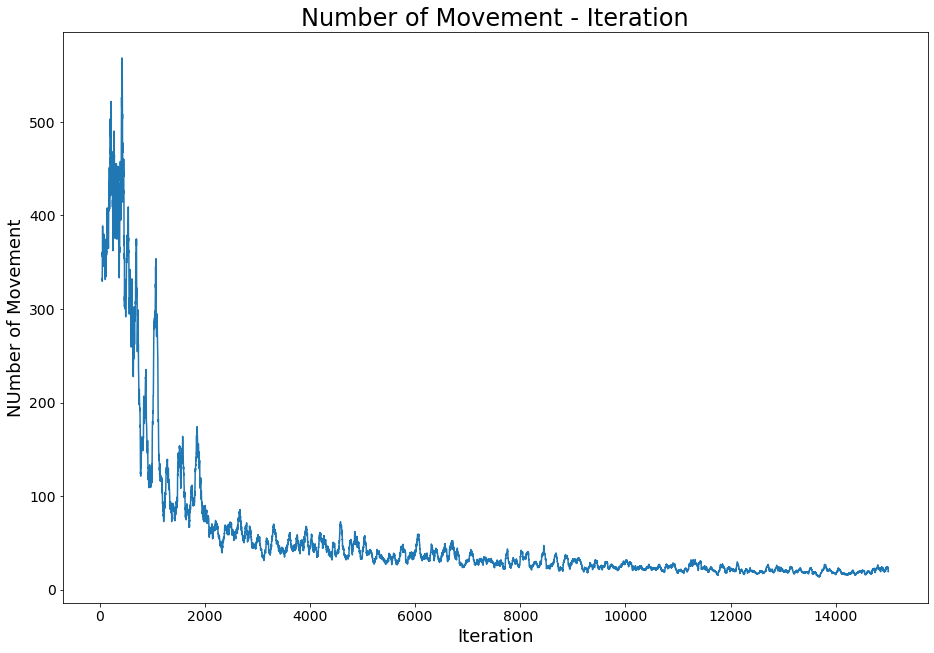

In [128]:
np.random.seed(10)
V,policy= WatkinsQ(LAMBDA=1 ,n_episodes=15000)

In [129]:
V

{(4, 15, 0, 0): 0,
 (4, 15, 0, 1): 0,
 (4, 15, 0, 2): 0,
 (4, 15, 0, 3): 0,
 (4, 15, 0, 4): 0,
 (4, 15, 1, 0): 0,
 (4, 15, 1, 1): 0,
 (4, 15, 1, 2): 0,
 (4, 15, 1, 3): 0,
 (4, 15, 1, 4): 0,
 (4, 15, 2, 0): 0,
 (4, 15, 2, 1): 0,
 (4, 15, 2, 2): 0,
 (4, 15, 2, 3): 0,
 (4, 15, 2, 4): 0,
 (4, 15, 3, 0): -2.0213336964287523,
 (4, 15, 3, 1): 0,
 (4, 15, 3, 2): 0,
 (4, 15, 3, 3): 0,
 (4, 15, 3, 4): 0,
 (4, 15, 4, 0): -2.358081744290268,
 (4, 15, 4, 1): 0,
 (4, 15, 4, 2): 0,
 (4, 15, 4, 3): 0,
 (4, 15, 4, 4): 0,
 (4, 16, 0, 0): 0,
 (4, 16, 0, 1): 0,
 (4, 16, 0, 2): 0,
 (4, 16, 0, 3): 0,
 (4, 16, 0, 4): 0,
 (4, 16, 1, 0): -1.44834070623554,
 (4, 16, 1, 1): 0,
 (4, 16, 1, 2): 0,
 (4, 16, 1, 3): 0,
 (4, 16, 1, 4): 0,
 (4, 16, 2, 0): -2.0037746300605925,
 (4, 16, 2, 1): 0,
 (4, 16, 2, 2): 0,
 (4, 16, 2, 3): 0,
 (4, 16, 2, 4): 0,
 (4, 16, 3, 0): -3.2102204362491245,
 (4, 16, 3, 1): -1.985010336401259,
 (4, 16, 3, 2): 0,
 (4, 16, 3, 3): 0,
 (4, 16, 3, 4): 0,
 (4, 16, 4, 0): -3.387870924431618,
 (4, 

In [130]:
policy

{(4, 15, 0, 0): 'DD',
 (4, 15, 0, 1): 'ZZ',
 (4, 15, 0, 2): 'ZD',
 (4, 15, 0, 3): 'DD',
 (4, 15, 0, 4): 'DZ',
 (4, 15, 1, 0): 'DD',
 (4, 15, 1, 1): 'ZD',
 (4, 15, 1, 2): 'DZ',
 (4, 15, 1, 3): 'DD',
 (4, 15, 1, 4): 'UZ',
 (4, 15, 2, 0): 'ZZ',
 (4, 15, 2, 1): 'ZU',
 (4, 15, 2, 2): 'UD',
 (4, 15, 2, 3): 'ZZ',
 (4, 15, 2, 4): 'UD',
 (4, 15, 3, 0): 'ZU',
 (4, 15, 3, 1): 'ZZ',
 (4, 15, 3, 2): 'ZZ',
 (4, 15, 3, 3): 'UD',
 (4, 15, 3, 4): 'ZD',
 (4, 15, 4, 0): 'UZ',
 (4, 15, 4, 1): 'ZU',
 (4, 15, 4, 2): 'UU',
 (4, 15, 4, 3): 'ZZ',
 (4, 15, 4, 4): 'DU',
 (4, 16, 0, 0): 'DZ',
 (4, 16, 0, 1): 'DU',
 (4, 16, 0, 2): 'ZD',
 (4, 16, 0, 3): 'ZU',
 (4, 16, 0, 4): 'UU',
 (4, 16, 1, 0): 'DU',
 (4, 16, 1, 1): 'UD',
 (4, 16, 1, 2): 'DU',
 (4, 16, 1, 3): 'ZZ',
 (4, 16, 1, 4): 'UD',
 (4, 16, 2, 0): 'ZU',
 (4, 16, 2, 1): 'DD',
 (4, 16, 2, 2): 'DZ',
 (4, 16, 2, 3): 'ZU',
 (4, 16, 2, 4): 'ZZ',
 (4, 16, 3, 0): 'UU',
 (4, 16, 3, 1): 'DZ',
 (4, 16, 3, 2): 'UU',
 (4, 16, 3, 3): 'DD',
 (4, 16, 3, 4): 'ZZ',
 (4, 16, 4

#### Gamma = 0.8 & Alpha = 0.2 & epsilon = Dynamic

In [131]:
def WatkinsQ(LAMBDA,n_episodes):
    # initialize Q(s,a)
    Q = {}
    E={}
    for s in states:
        Q[s] = {}
        E[s]={}
        for a in ACTION_SPACE:
            Q[s][a] = 0
    GAMMA=0.8
    ALPHA = 0.2
    total_movement=[]
    for it in range(n_episodes):
        print(it,'#############################################################################################\n\n')
        movement=0
        for s in states:
            for a in ACTION_SPACE:
                E[s][a] = 0
        # begin a new episode
        s= random_initial_state()
        #print(s)
        visited_state_action={}
        while not is_terminal(s):
            # perform action and get next state + reward
            a,opt = epsilon_greedy(Q, s, it)
            if (s,a) not in visited_state_action.keys():
                visited_state_action[(s,a)]=[]
            s2 = get_next_state(s, a)
            r = rewards.get((s, a, s2),0)
            #print(s,a,s2,r)
            # update Q(s,a)
            maxQ = max_dict(Q[s2])[1]
            delta= r + GAMMA*maxQ - Q[s][a]
            E[s][a]=E[s][a]+1
            for (s,a) in visited_state_action.keys():
#            for s in States:
#                for a in ACTION_SPACE:
                    Q[s][a] = Q[s][a] + ALPHA*delta*E[s][a]
                    if opt:
                        E[s][a] = E[s][a]*GAMMA*LAMBDA
                    else:
                        E[s][a]=0
            # next state becomes current state
            if (is_wall(s2) == 1):
            # next state becomes current state
                s = random_initial_state()
                #print('crash the wall:',s)
                movement +=1
            else :
                s = s2
                #print(s)
                movement +=1
        total_movement.append(movement)
        df_total_movement = pd.DataFrame(total_movement)
        rol_total_movement = df_total_movement.rolling(50).mean()
    plt.rcParams["figure.figsize"] = [15.50, 10.50]
    plt.plot(rol_total_movement)
    plt.title('Number of Movement - Iteration', fontsize=24)
    plt.xlabel('Iteration', fontsize=18)
    plt.ylabel('NUmber of Movement', fontsize=18)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    policy = {}
    V = {}
    for s in actions.states.unique():
        a, max_q = max_dict(Q[s])
        policy[s] = a
        V[s] = max_q
    return V,policy

0 #############################################################################################


1 #############################################################################################


2 #############################################################################################


3 #############################################################################################


4 #############################################################################################


5 #############################################################################################


6 #############################################################################################


7 #############################################################################################


8 #############################################################################################


9 #############################################################################################


10 #################

83 #############################################################################################


84 #############################################################################################


85 #############################################################################################


86 #############################################################################################


87 #############################################################################################


88 #############################################################################################


89 #############################################################################################


90 #############################################################################################


91 #############################################################################################


92 #############################################################################################


93 #######

166 #############################################################################################


167 #############################################################################################


168 #############################################################################################


169 #############################################################################################


170 #############################################################################################


171 #############################################################################################


172 #############################################################################################


173 #############################################################################################


174 #############################################################################################


175 #############################################################################################




248 #############################################################################################


249 #############################################################################################


250 #############################################################################################


251 #############################################################################################


252 #############################################################################################


253 #############################################################################################


254 #############################################################################################


255 #############################################################################################


256 #############################################################################################


257 #############################################################################################




330 #############################################################################################


331 #############################################################################################


332 #############################################################################################


333 #############################################################################################


334 #############################################################################################


335 #############################################################################################


336 #############################################################################################


337 #############################################################################################


338 #############################################################################################


339 #############################################################################################




412 #############################################################################################


413 #############################################################################################


414 #############################################################################################


415 #############################################################################################


416 #############################################################################################


417 #############################################################################################


418 #############################################################################################


419 #############################################################################################


420 #############################################################################################


421 #############################################################################################




494 #############################################################################################


495 #############################################################################################


496 #############################################################################################


497 #############################################################################################


498 #############################################################################################


499 #############################################################################################


500 #############################################################################################


501 #############################################################################################


502 #############################################################################################


503 #############################################################################################




576 #############################################################################################


577 #############################################################################################


578 #############################################################################################


579 #############################################################################################


580 #############################################################################################


581 #############################################################################################


582 #############################################################################################


583 #############################################################################################


584 #############################################################################################


585 #############################################################################################




658 #############################################################################################


659 #############################################################################################


660 #############################################################################################


661 #############################################################################################


662 #############################################################################################


663 #############################################################################################


664 #############################################################################################


665 #############################################################################################


666 #############################################################################################


667 #############################################################################################




740 #############################################################################################


741 #############################################################################################


742 #############################################################################################


743 #############################################################################################


744 #############################################################################################


745 #############################################################################################


746 #############################################################################################


747 #############################################################################################


748 #############################################################################################


749 #############################################################################################




822 #############################################################################################


823 #############################################################################################


824 #############################################################################################


825 #############################################################################################


826 #############################################################################################


827 #############################################################################################


828 #############################################################################################


829 #############################################################################################


830 #############################################################################################


831 #############################################################################################




904 #############################################################################################


905 #############################################################################################


906 #############################################################################################


907 #############################################################################################


908 #############################################################################################


909 #############################################################################################


910 #############################################################################################


911 #############################################################################################


912 #############################################################################################


913 #############################################################################################




986 #############################################################################################


987 #############################################################################################


988 #############################################################################################


989 #############################################################################################


990 #############################################################################################


991 #############################################################################################


992 #############################################################################################


993 #############################################################################################


994 #############################################################################################


995 #############################################################################################




1068 #############################################################################################


1069 #############################################################################################


1070 #############################################################################################


1071 #############################################################################################


1072 #############################################################################################


1073 #############################################################################################


1074 #############################################################################################


1075 #############################################################################################


1076 #############################################################################################


1077 ######################################################################################

1150 #############################################################################################


1151 #############################################################################################


1152 #############################################################################################


1153 #############################################################################################


1154 #############################################################################################


1155 #############################################################################################


1156 #############################################################################################


1157 #############################################################################################


1158 #############################################################################################


1159 ######################################################################################

1232 #############################################################################################


1233 #############################################################################################


1234 #############################################################################################


1235 #############################################################################################


1236 #############################################################################################


1237 #############################################################################################


1238 #############################################################################################


1239 #############################################################################################


1240 #############################################################################################


1241 ######################################################################################

1314 #############################################################################################


1315 #############################################################################################


1316 #############################################################################################


1317 #############################################################################################


1318 #############################################################################################


1319 #############################################################################################


1320 #############################################################################################


1321 #############################################################################################


1322 #############################################################################################


1323 ######################################################################################

1396 #############################################################################################


1397 #############################################################################################


1398 #############################################################################################


1399 #############################################################################################


1400 #############################################################################################


1401 #############################################################################################


1402 #############################################################################################


1403 #############################################################################################


1404 #############################################################################################


1405 ######################################################################################

1478 #############################################################################################


1479 #############################################################################################


1480 #############################################################################################


1481 #############################################################################################


1482 #############################################################################################


1483 #############################################################################################


1484 #############################################################################################


1485 #############################################################################################


1486 #############################################################################################


1487 ######################################################################################

1560 #############################################################################################


1561 #############################################################################################


1562 #############################################################################################


1563 #############################################################################################


1564 #############################################################################################


1565 #############################################################################################


1566 #############################################################################################


1567 #############################################################################################


1568 #############################################################################################


1569 ######################################################################################

1642 #############################################################################################


1643 #############################################################################################


1644 #############################################################################################


1645 #############################################################################################


1646 #############################################################################################


1647 #############################################################################################


1648 #############################################################################################


1649 #############################################################################################


1650 #############################################################################################


1651 ######################################################################################

1724 #############################################################################################


1725 #############################################################################################


1726 #############################################################################################


1727 #############################################################################################


1728 #############################################################################################


1729 #############################################################################################


1730 #############################################################################################


1731 #############################################################################################


1732 #############################################################################################


1733 ######################################################################################

1806 #############################################################################################


1807 #############################################################################################


1808 #############################################################################################


1809 #############################################################################################


1810 #############################################################################################


1811 #############################################################################################


1812 #############################################################################################


1813 #############################################################################################


1814 #############################################################################################


1815 ######################################################################################

1888 #############################################################################################


1889 #############################################################################################


1890 #############################################################################################


1891 #############################################################################################


1892 #############################################################################################


1893 #############################################################################################


1894 #############################################################################################


1895 #############################################################################################


1896 #############################################################################################


1897 ######################################################################################

1970 #############################################################################################


1971 #############################################################################################


1972 #############################################################################################


1973 #############################################################################################


1974 #############################################################################################


1975 #############################################################################################


1976 #############################################################################################


1977 #############################################################################################


1978 #############################################################################################


1979 ######################################################################################

2052 #############################################################################################


2053 #############################################################################################


2054 #############################################################################################


2055 #############################################################################################


2056 #############################################################################################


2057 #############################################################################################


2058 #############################################################################################


2059 #############################################################################################


2060 #############################################################################################


2061 ######################################################################################

2134 #############################################################################################


2135 #############################################################################################


2136 #############################################################################################


2137 #############################################################################################


2138 #############################################################################################


2139 #############################################################################################


2140 #############################################################################################


2141 #############################################################################################


2142 #############################################################################################


2143 ######################################################################################

2216 #############################################################################################


2217 #############################################################################################


2218 #############################################################################################


2219 #############################################################################################


2220 #############################################################################################


2221 #############################################################################################


2222 #############################################################################################


2223 #############################################################################################


2224 #############################################################################################


2225 ######################################################################################

2298 #############################################################################################


2299 #############################################################################################


2300 #############################################################################################


2301 #############################################################################################


2302 #############################################################################################


2303 #############################################################################################


2304 #############################################################################################


2305 #############################################################################################


2306 #############################################################################################


2307 ######################################################################################

2380 #############################################################################################


2381 #############################################################################################


2382 #############################################################################################


2383 #############################################################################################


2384 #############################################################################################


2385 #############################################################################################


2386 #############################################################################################


2387 #############################################################################################


2388 #############################################################################################


2389 ######################################################################################

2463 #############################################################################################


2464 #############################################################################################


2465 #############################################################################################


2466 #############################################################################################


2467 #############################################################################################


2468 #############################################################################################


2469 #############################################################################################


2470 #############################################################################################


2471 #############################################################################################


2472 ######################################################################################

2545 #############################################################################################


2546 #############################################################################################


2547 #############################################################################################


2548 #############################################################################################


2549 #############################################################################################


2550 #############################################################################################


2551 #############################################################################################


2552 #############################################################################################


2553 #############################################################################################


2554 ######################################################################################

2627 #############################################################################################


2628 #############################################################################################


2629 #############################################################################################


2630 #############################################################################################


2631 #############################################################################################


2632 #############################################################################################


2633 #############################################################################################


2634 #############################################################################################


2635 #############################################################################################


2636 ######################################################################################

2709 #############################################################################################


2710 #############################################################################################


2711 #############################################################################################


2712 #############################################################################################


2713 #############################################################################################


2714 #############################################################################################


2715 #############################################################################################


2716 #############################################################################################


2717 #############################################################################################


2718 ######################################################################################

2791 #############################################################################################


2792 #############################################################################################


2793 #############################################################################################


2794 #############################################################################################


2795 #############################################################################################


2796 #############################################################################################


2797 #############################################################################################


2798 #############################################################################################


2799 #############################################################################################


2800 ######################################################################################

2873 #############################################################################################


2874 #############################################################################################


2875 #############################################################################################


2876 #############################################################################################


2877 #############################################################################################


2878 #############################################################################################


2879 #############################################################################################


2880 #############################################################################################


2881 #############################################################################################


2882 ######################################################################################

2955 #############################################################################################


2956 #############################################################################################


2957 #############################################################################################


2958 #############################################################################################


2959 #############################################################################################


2960 #############################################################################################


2961 #############################################################################################


2962 #############################################################################################


2963 #############################################################################################


2964 ######################################################################################

3037 #############################################################################################


3038 #############################################################################################


3039 #############################################################################################


3040 #############################################################################################


3041 #############################################################################################


3042 #############################################################################################


3043 #############################################################################################


3044 #############################################################################################


3045 #############################################################################################


3046 ######################################################################################

3120 #############################################################################################


3121 #############################################################################################


3122 #############################################################################################


3123 #############################################################################################


3124 #############################################################################################


3125 #############################################################################################


3126 #############################################################################################


3127 #############################################################################################


3128 #############################################################################################


3129 ######################################################################################

3202 #############################################################################################


3203 #############################################################################################


3204 #############################################################################################


3205 #############################################################################################


3206 #############################################################################################


3207 #############################################################################################


3208 #############################################################################################


3209 #############################################################################################


3210 #############################################################################################


3211 ######################################################################################

3284 #############################################################################################


3285 #############################################################################################


3286 #############################################################################################


3287 #############################################################################################


3288 #############################################################################################


3289 #############################################################################################


3290 #############################################################################################


3291 #############################################################################################


3292 #############################################################################################


3293 ######################################################################################

3367 #############################################################################################


3368 #############################################################################################


3369 #############################################################################################


3370 #############################################################################################


3371 #############################################################################################


3372 #############################################################################################


3373 #############################################################################################


3374 #############################################################################################


3375 #############################################################################################


3376 ######################################################################################

3449 #############################################################################################


3450 #############################################################################################


3451 #############################################################################################


3452 #############################################################################################


3453 #############################################################################################


3454 #############################################################################################


3455 #############################################################################################


3456 #############################################################################################


3457 #############################################################################################


3458 ######################################################################################

3531 #############################################################################################


3532 #############################################################################################


3533 #############################################################################################


3534 #############################################################################################


3535 #############################################################################################


3536 #############################################################################################


3537 #############################################################################################


3538 #############################################################################################


3539 #############################################################################################


3540 ######################################################################################

3613 #############################################################################################


3614 #############################################################################################


3615 #############################################################################################


3616 #############################################################################################


3617 #############################################################################################


3618 #############################################################################################


3619 #############################################################################################


3620 #############################################################################################


3621 #############################################################################################


3622 ######################################################################################

3695 #############################################################################################


3696 #############################################################################################


3697 #############################################################################################


3698 #############################################################################################


3699 #############################################################################################


3700 #############################################################################################


3701 #############################################################################################


3702 #############################################################################################


3703 #############################################################################################


3704 ######################################################################################

3777 #############################################################################################


3778 #############################################################################################


3779 #############################################################################################


3780 #############################################################################################


3781 #############################################################################################


3782 #############################################################################################


3783 #############################################################################################


3784 #############################################################################################


3785 #############################################################################################


3786 ######################################################################################

3859 #############################################################################################


3860 #############################################################################################


3861 #############################################################################################


3862 #############################################################################################


3863 #############################################################################################


3864 #############################################################################################


3865 #############################################################################################


3866 #############################################################################################


3867 #############################################################################################


3868 ######################################################################################

3941 #############################################################################################


3942 #############################################################################################


3943 #############################################################################################


3944 #############################################################################################


3945 #############################################################################################


3946 #############################################################################################


3947 #############################################################################################


3948 #############################################################################################


3949 #############################################################################################


3950 ######################################################################################

4023 #############################################################################################


4024 #############################################################################################


4025 #############################################################################################


4026 #############################################################################################


4027 #############################################################################################


4028 #############################################################################################


4029 #############################################################################################


4030 #############################################################################################


4031 #############################################################################################


4032 ######################################################################################

4105 #############################################################################################


4106 #############################################################################################


4107 #############################################################################################


4108 #############################################################################################


4109 #############################################################################################


4110 #############################################################################################


4111 #############################################################################################


4112 #############################################################################################


4113 #############################################################################################


4114 ######################################################################################

4187 #############################################################################################


4188 #############################################################################################


4189 #############################################################################################


4190 #############################################################################################


4191 #############################################################################################


4192 #############################################################################################


4193 #############################################################################################


4194 #############################################################################################


4195 #############################################################################################


4196 ######################################################################################

4269 #############################################################################################


4270 #############################################################################################


4271 #############################################################################################


4272 #############################################################################################


4273 #############################################################################################


4274 #############################################################################################


4275 #############################################################################################


4276 #############################################################################################


4277 #############################################################################################


4278 ######################################################################################

4351 #############################################################################################


4352 #############################################################################################


4353 #############################################################################################


4354 #############################################################################################


4355 #############################################################################################


4356 #############################################################################################


4357 #############################################################################################


4358 #############################################################################################


4359 #############################################################################################


4360 ######################################################################################

4433 #############################################################################################


4434 #############################################################################################


4435 #############################################################################################


4436 #############################################################################################


4437 #############################################################################################


4438 #############################################################################################


4439 #############################################################################################


4440 #############################################################################################


4441 #############################################################################################


4442 ######################################################################################

4515 #############################################################################################


4516 #############################################################################################


4517 #############################################################################################


4518 #############################################################################################


4519 #############################################################################################


4520 #############################################################################################


4521 #############################################################################################


4522 #############################################################################################


4523 #############################################################################################


4524 ######################################################################################

4597 #############################################################################################


4598 #############################################################################################


4599 #############################################################################################


4600 #############################################################################################


4601 #############################################################################################


4602 #############################################################################################


4603 #############################################################################################


4604 #############################################################################################


4605 #############################################################################################


4606 ######################################################################################

4679 #############################################################################################


4680 #############################################################################################


4681 #############################################################################################


4682 #############################################################################################


4683 #############################################################################################


4684 #############################################################################################


4685 #############################################################################################


4686 #############################################################################################


4687 #############################################################################################


4688 ######################################################################################

4761 #############################################################################################


4762 #############################################################################################


4763 #############################################################################################


4764 #############################################################################################


4765 #############################################################################################


4766 #############################################################################################


4767 #############################################################################################


4768 #############################################################################################


4769 #############################################################################################


4770 ######################################################################################

4843 #############################################################################################


4844 #############################################################################################


4845 #############################################################################################


4846 #############################################################################################


4847 #############################################################################################


4848 #############################################################################################


4849 #############################################################################################


4850 #############################################################################################


4851 #############################################################################################


4852 ######################################################################################

4925 #############################################################################################


4926 #############################################################################################


4927 #############################################################################################


4928 #############################################################################################


4929 #############################################################################################


4930 #############################################################################################


4931 #############################################################################################


4932 #############################################################################################


4933 #############################################################################################


4934 ######################################################################################

5007 #############################################################################################


5008 #############################################################################################


5009 #############################################################################################


5010 #############################################################################################


5011 #############################################################################################


5012 #############################################################################################


5013 #############################################################################################


5014 #############################################################################################


5015 #############################################################################################


5016 ######################################################################################

5089 #############################################################################################


5090 #############################################################################################


5091 #############################################################################################


5092 #############################################################################################


5093 #############################################################################################


5094 #############################################################################################


5095 #############################################################################################


5096 #############################################################################################


5097 #############################################################################################


5098 ######################################################################################

5171 #############################################################################################


5172 #############################################################################################


5173 #############################################################################################


5174 #############################################################################################


5175 #############################################################################################


5176 #############################################################################################


5177 #############################################################################################


5178 #############################################################################################


5179 #############################################################################################


5180 ######################################################################################

5253 #############################################################################################


5254 #############################################################################################


5255 #############################################################################################


5256 #############################################################################################


5257 #############################################################################################


5258 #############################################################################################


5259 #############################################################################################


5260 #############################################################################################


5261 #############################################################################################


5262 ######################################################################################

5335 #############################################################################################


5336 #############################################################################################


5337 #############################################################################################


5338 #############################################################################################


5339 #############################################################################################


5340 #############################################################################################


5341 #############################################################################################


5342 #############################################################################################


5343 #############################################################################################


5344 ######################################################################################

5417 #############################################################################################


5418 #############################################################################################


5419 #############################################################################################


5420 #############################################################################################


5421 #############################################################################################


5422 #############################################################################################


5423 #############################################################################################


5424 #############################################################################################


5425 #############################################################################################


5426 ######################################################################################

5499 #############################################################################################


5500 #############################################################################################


5501 #############################################################################################


5502 #############################################################################################


5503 #############################################################################################


5504 #############################################################################################


5505 #############################################################################################


5506 #############################################################################################


5507 #############################################################################################


5508 ######################################################################################

5581 #############################################################################################


5582 #############################################################################################


5583 #############################################################################################


5584 #############################################################################################


5585 #############################################################################################


5586 #############################################################################################


5587 #############################################################################################


5588 #############################################################################################


5589 #############################################################################################


5590 ######################################################################################

5663 #############################################################################################


5664 #############################################################################################


5665 #############################################################################################


5666 #############################################################################################


5667 #############################################################################################


5668 #############################################################################################


5669 #############################################################################################


5670 #############################################################################################


5671 #############################################################################################


5672 ######################################################################################

5745 #############################################################################################


5746 #############################################################################################


5747 #############################################################################################


5748 #############################################################################################


5749 #############################################################################################


5750 #############################################################################################


5751 #############################################################################################


5752 #############################################################################################


5753 #############################################################################################


5754 ######################################################################################

5827 #############################################################################################


5828 #############################################################################################


5829 #############################################################################################


5830 #############################################################################################


5831 #############################################################################################


5832 #############################################################################################


5833 #############################################################################################


5834 #############################################################################################


5835 #############################################################################################


5836 ######################################################################################

5909 #############################################################################################


5910 #############################################################################################


5911 #############################################################################################


5912 #############################################################################################


5913 #############################################################################################


5914 #############################################################################################


5915 #############################################################################################


5916 #############################################################################################


5917 #############################################################################################


5918 ######################################################################################

5991 #############################################################################################


5992 #############################################################################################


5993 #############################################################################################


5994 #############################################################################################


5995 #############################################################################################


5996 #############################################################################################


5997 #############################################################################################


5998 #############################################################################################


5999 #############################################################################################


6000 ######################################################################################

6073 #############################################################################################


6074 #############################################################################################


6075 #############################################################################################


6076 #############################################################################################


6077 #############################################################################################


6078 #############################################################################################


6079 #############################################################################################


6080 #############################################################################################


6081 #############################################################################################


6082 ######################################################################################

6155 #############################################################################################


6156 #############################################################################################


6157 #############################################################################################


6158 #############################################################################################


6159 #############################################################################################


6160 #############################################################################################


6161 #############################################################################################


6162 #############################################################################################


6163 #############################################################################################


6164 ######################################################################################

6237 #############################################################################################


6238 #############################################################################################


6239 #############################################################################################


6240 #############################################################################################


6241 #############################################################################################


6242 #############################################################################################


6243 #############################################################################################


6244 #############################################################################################


6245 #############################################################################################


6246 ######################################################################################

6320 #############################################################################################


6321 #############################################################################################


6322 #############################################################################################


6323 #############################################################################################


6324 #############################################################################################


6325 #############################################################################################


6326 #############################################################################################


6327 #############################################################################################


6328 #############################################################################################


6329 ######################################################################################

6402 #############################################################################################


6403 #############################################################################################


6404 #############################################################################################


6405 #############################################################################################


6406 #############################################################################################


6407 #############################################################################################


6408 #############################################################################################


6409 #############################################################################################


6410 #############################################################################################


6411 ######################################################################################

6484 #############################################################################################


6485 #############################################################################################


6486 #############################################################################################


6487 #############################################################################################


6488 #############################################################################################


6489 #############################################################################################


6490 #############################################################################################


6491 #############################################################################################


6492 #############################################################################################


6493 ######################################################################################

6567 #############################################################################################


6568 #############################################################################################


6569 #############################################################################################


6570 #############################################################################################


6571 #############################################################################################


6572 #############################################################################################


6573 #############################################################################################


6574 #############################################################################################


6575 #############################################################################################


6576 ######################################################################################

6649 #############################################################################################


6650 #############################################################################################


6651 #############################################################################################


6652 #############################################################################################


6653 #############################################################################################


6654 #############################################################################################


6655 #############################################################################################


6656 #############################################################################################


6657 #############################################################################################


6658 ######################################################################################

6732 #############################################################################################


6733 #############################################################################################


6734 #############################################################################################


6735 #############################################################################################


6736 #############################################################################################


6737 #############################################################################################


6738 #############################################################################################


6739 #############################################################################################


6740 #############################################################################################


6741 ######################################################################################

6814 #############################################################################################


6815 #############################################################################################


6816 #############################################################################################


6817 #############################################################################################


6818 #############################################################################################


6819 #############################################################################################


6820 #############################################################################################


6821 #############################################################################################


6822 #############################################################################################


6823 ######################################################################################

6896 #############################################################################################


6897 #############################################################################################


6898 #############################################################################################


6899 #############################################################################################


6900 #############################################################################################


6901 #############################################################################################


6902 #############################################################################################


6903 #############################################################################################


6904 #############################################################################################


6905 ######################################################################################

6978 #############################################################################################


6979 #############################################################################################


6980 #############################################################################################


6981 #############################################################################################


6982 #############################################################################################


6983 #############################################################################################


6984 #############################################################################################


6985 #############################################################################################


6986 #############################################################################################


6987 ######################################################################################

7060 #############################################################################################


7061 #############################################################################################


7062 #############################################################################################


7063 #############################################################################################


7064 #############################################################################################


7065 #############################################################################################


7066 #############################################################################################


7067 #############################################################################################


7068 #############################################################################################


7069 ######################################################################################

7142 #############################################################################################


7143 #############################################################################################


7144 #############################################################################################


7145 #############################################################################################


7146 #############################################################################################


7147 #############################################################################################


7148 #############################################################################################


7149 #############################################################################################


7150 #############################################################################################


7151 ######################################################################################

7224 #############################################################################################


7225 #############################################################################################


7226 #############################################################################################


7227 #############################################################################################


7228 #############################################################################################


7229 #############################################################################################


7230 #############################################################################################


7231 #############################################################################################


7232 #############################################################################################


7233 ######################################################################################

7306 #############################################################################################


7307 #############################################################################################


7308 #############################################################################################


7309 #############################################################################################


7310 #############################################################################################


7311 #############################################################################################


7312 #############################################################################################


7313 #############################################################################################


7314 #############################################################################################


7315 ######################################################################################

7388 #############################################################################################


7389 #############################################################################################


7390 #############################################################################################


7391 #############################################################################################


7392 #############################################################################################


7393 #############################################################################################


7394 #############################################################################################


7395 #############################################################################################


7396 #############################################################################################


7397 ######################################################################################

7470 #############################################################################################


7471 #############################################################################################


7472 #############################################################################################


7473 #############################################################################################


7474 #############################################################################################


7475 #############################################################################################


7476 #############################################################################################


7477 #############################################################################################


7478 #############################################################################################


7479 ######################################################################################

7552 #############################################################################################


7553 #############################################################################################


7554 #############################################################################################


7555 #############################################################################################


7556 #############################################################################################


7557 #############################################################################################


7558 #############################################################################################


7559 #############################################################################################


7560 #############################################################################################


7561 ######################################################################################

7634 #############################################################################################


7635 #############################################################################################


7636 #############################################################################################


7637 #############################################################################################


7638 #############################################################################################


7639 #############################################################################################


7640 #############################################################################################


7641 #############################################################################################


7642 #############################################################################################


7643 ######################################################################################

7716 #############################################################################################


7717 #############################################################################################


7718 #############################################################################################


7719 #############################################################################################


7720 #############################################################################################


7721 #############################################################################################


7722 #############################################################################################


7723 #############################################################################################


7724 #############################################################################################


7725 ######################################################################################

7798 #############################################################################################


7799 #############################################################################################


7800 #############################################################################################


7801 #############################################################################################


7802 #############################################################################################


7803 #############################################################################################


7804 #############################################################################################


7805 #############################################################################################


7806 #############################################################################################


7807 ######################################################################################

7880 #############################################################################################


7881 #############################################################################################


7882 #############################################################################################


7883 #############################################################################################


7884 #############################################################################################


7885 #############################################################################################


7886 #############################################################################################


7887 #############################################################################################


7888 #############################################################################################


7889 ######################################################################################

7962 #############################################################################################


7963 #############################################################################################


7964 #############################################################################################


7965 #############################################################################################


7966 #############################################################################################


7967 #############################################################################################


7968 #############################################################################################


7969 #############################################################################################


7970 #############################################################################################


7971 ######################################################################################

8044 #############################################################################################


8045 #############################################################################################


8046 #############################################################################################


8047 #############################################################################################


8048 #############################################################################################


8049 #############################################################################################


8050 #############################################################################################


8051 #############################################################################################


8052 #############################################################################################


8053 ######################################################################################

8126 #############################################################################################


8127 #############################################################################################


8128 #############################################################################################


8129 #############################################################################################


8130 #############################################################################################


8131 #############################################################################################


8132 #############################################################################################


8133 #############################################################################################


8134 #############################################################################################


8135 ######################################################################################

8208 #############################################################################################


8209 #############################################################################################


8210 #############################################################################################


8211 #############################################################################################


8212 #############################################################################################


8213 #############################################################################################


8214 #############################################################################################


8215 #############################################################################################


8216 #############################################################################################


8217 ######################################################################################

8290 #############################################################################################


8291 #############################################################################################


8292 #############################################################################################


8293 #############################################################################################


8294 #############################################################################################


8295 #############################################################################################


8296 #############################################################################################


8297 #############################################################################################


8298 #############################################################################################


8299 ######################################################################################

8372 #############################################################################################


8373 #############################################################################################


8374 #############################################################################################


8375 #############################################################################################


8376 #############################################################################################


8377 #############################################################################################


8378 #############################################################################################


8379 #############################################################################################


8380 #############################################################################################


8381 ######################################################################################

8454 #############################################################################################


8455 #############################################################################################


8456 #############################################################################################


8457 #############################################################################################


8458 #############################################################################################


8459 #############################################################################################


8460 #############################################################################################


8461 #############################################################################################


8462 #############################################################################################


8463 ######################################################################################

8537 #############################################################################################


8538 #############################################################################################


8539 #############################################################################################


8540 #############################################################################################


8541 #############################################################################################


8542 #############################################################################################


8543 #############################################################################################


8544 #############################################################################################


8545 #############################################################################################


8546 ######################################################################################

8619 #############################################################################################


8620 #############################################################################################


8621 #############################################################################################


8622 #############################################################################################


8623 #############################################################################################


8624 #############################################################################################


8625 #############################################################################################


8626 #############################################################################################


8627 #############################################################################################


8628 ######################################################################################

8701 #############################################################################################


8702 #############################################################################################


8703 #############################################################################################


8704 #############################################################################################


8705 #############################################################################################


8706 #############################################################################################


8707 #############################################################################################


8708 #############################################################################################


8709 #############################################################################################


8710 ######################################################################################

8783 #############################################################################################


8784 #############################################################################################


8785 #############################################################################################


8786 #############################################################################################


8787 #############################################################################################


8788 #############################################################################################


8789 #############################################################################################


8790 #############################################################################################


8791 #############################################################################################


8792 ######################################################################################

8865 #############################################################################################


8866 #############################################################################################


8867 #############################################################################################


8868 #############################################################################################


8869 #############################################################################################


8870 #############################################################################################


8871 #############################################################################################


8872 #############################################################################################


8873 #############################################################################################


8874 ######################################################################################

8947 #############################################################################################


8948 #############################################################################################


8949 #############################################################################################


8950 #############################################################################################


8951 #############################################################################################


8952 #############################################################################################


8953 #############################################################################################


8954 #############################################################################################


8955 #############################################################################################


8956 ######################################################################################

9029 #############################################################################################


9030 #############################################################################################


9031 #############################################################################################


9032 #############################################################################################


9033 #############################################################################################


9034 #############################################################################################


9035 #############################################################################################


9036 #############################################################################################


9037 #############################################################################################


9038 ######################################################################################

9111 #############################################################################################


9112 #############################################################################################


9113 #############################################################################################


9114 #############################################################################################


9115 #############################################################################################


9116 #############################################################################################


9117 #############################################################################################


9118 #############################################################################################


9119 #############################################################################################


9120 ######################################################################################

9193 #############################################################################################


9194 #############################################################################################


9195 #############################################################################################


9196 #############################################################################################


9197 #############################################################################################


9198 #############################################################################################


9199 #############################################################################################


9200 #############################################################################################


9201 #############################################################################################


9202 ######################################################################################

9275 #############################################################################################


9276 #############################################################################################


9277 #############################################################################################


9278 #############################################################################################


9279 #############################################################################################


9280 #############################################################################################


9281 #############################################################################################


9282 #############################################################################################


9283 #############################################################################################


9284 ######################################################################################

9358 #############################################################################################


9359 #############################################################################################


9360 #############################################################################################


9361 #############################################################################################


9362 #############################################################################################


9363 #############################################################################################


9364 #############################################################################################


9365 #############################################################################################


9366 #############################################################################################


9367 ######################################################################################

9441 #############################################################################################


9442 #############################################################################################


9443 #############################################################################################


9444 #############################################################################################


9445 #############################################################################################


9446 #############################################################################################


9447 #############################################################################################


9448 #############################################################################################


9449 #############################################################################################


9450 ######################################################################################

9523 #############################################################################################


9524 #############################################################################################


9525 #############################################################################################


9526 #############################################################################################


9527 #############################################################################################


9528 #############################################################################################


9529 #############################################################################################


9530 #############################################################################################


9531 #############################################################################################


9532 ######################################################################################

9605 #############################################################################################


9606 #############################################################################################


9607 #############################################################################################


9608 #############################################################################################


9609 #############################################################################################


9610 #############################################################################################


9611 #############################################################################################


9612 #############################################################################################


9613 #############################################################################################


9614 ######################################################################################

9688 #############################################################################################


9689 #############################################################################################


9690 #############################################################################################


9691 #############################################################################################


9692 #############################################################################################


9693 #############################################################################################


9694 #############################################################################################


9695 #############################################################################################


9696 #############################################################################################


9697 ######################################################################################

9770 #############################################################################################


9771 #############################################################################################


9772 #############################################################################################


9773 #############################################################################################


9774 #############################################################################################


9775 #############################################################################################


9776 #############################################################################################


9777 #############################################################################################


9778 #############################################################################################


9779 ######################################################################################


9852 #############################################################################################


9853 #############################################################################################


9854 #############################################################################################


9855 #############################################################################################


9856 #############################################################################################


9857 #############################################################################################


9858 #############################################################################################


9859 #############################################################################################


9860 #############################################################################################


9861 #####################################################################################

9934 #############################################################################################


9935 #############################################################################################


9936 #############################################################################################


9937 #############################################################################################


9938 #############################################################################################


9939 #############################################################################################


9940 #############################################################################################


9941 #############################################################################################


9942 #############################################################################################


9943 ######################################################################################

10015 #############################################################################################


10016 #############################################################################################


10017 #############################################################################################


10018 #############################################################################################


10019 #############################################################################################


10020 #############################################################################################


10021 #############################################################################################


10022 #############################################################################################


10023 #############################################################################################


10024 ############################################################################

10097 #############################################################################################


10098 #############################################################################################


10099 #############################################################################################


10100 #############################################################################################


10101 #############################################################################################


10102 #############################################################################################


10103 #############################################################################################


10104 #############################################################################################


10105 #############################################################################################


10106 ############################################################################

10179 #############################################################################################


10180 #############################################################################################


10181 #############################################################################################


10182 #############################################################################################


10183 #############################################################################################


10184 #############################################################################################


10185 #############################################################################################


10186 #############################################################################################


10187 #############################################################################################


10188 ############################################################################

10261 #############################################################################################


10262 #############################################################################################


10263 #############################################################################################


10264 #############################################################################################


10265 #############################################################################################


10266 #############################################################################################


10267 #############################################################################################


10268 #############################################################################################


10269 #############################################################################################


10270 ############################################################################

10342 #############################################################################################


10343 #############################################################################################


10344 #############################################################################################


10345 #############################################################################################


10346 #############################################################################################


10347 #############################################################################################


10348 #############################################################################################


10349 #############################################################################################


10350 #############################################################################################


10351 ############################################################################

10423 #############################################################################################


10424 #############################################################################################


10425 #############################################################################################


10426 #############################################################################################


10427 #############################################################################################


10428 #############################################################################################


10429 #############################################################################################


10430 #############################################################################################


10431 #############################################################################################


10432 ############################################################################

10504 #############################################################################################


10505 #############################################################################################


10506 #############################################################################################


10507 #############################################################################################


10508 #############################################################################################


10509 #############################################################################################


10510 #############################################################################################


10511 #############################################################################################


10512 #############################################################################################


10513 ############################################################################

10586 #############################################################################################


10587 #############################################################################################


10588 #############################################################################################


10589 #############################################################################################


10590 #############################################################################################


10591 #############################################################################################


10592 #############################################################################################


10593 #############################################################################################


10594 #############################################################################################


10595 ############################################################################

10668 #############################################################################################


10669 #############################################################################################


10670 #############################################################################################


10671 #############################################################################################


10672 #############################################################################################


10673 #############################################################################################


10674 #############################################################################################


10675 #############################################################################################


10676 #############################################################################################


10677 ############################################################################

10749 #############################################################################################


10750 #############################################################################################


10751 #############################################################################################


10752 #############################################################################################


10753 #############################################################################################


10754 #############################################################################################


10755 #############################################################################################


10756 #############################################################################################


10757 #############################################################################################


10758 ############################################################################

10830 #############################################################################################


10831 #############################################################################################


10832 #############################################################################################


10833 #############################################################################################


10834 #############################################################################################


10835 #############################################################################################


10836 #############################################################################################


10837 #############################################################################################


10838 #############################################################################################


10839 ############################################################################

10911 #############################################################################################


10912 #############################################################################################


10913 #############################################################################################


10914 #############################################################################################


10915 #############################################################################################


10916 #############################################################################################


10917 #############################################################################################


10918 #############################################################################################


10919 #############################################################################################


10920 ############################################################################

10992 #############################################################################################


10993 #############################################################################################


10994 #############################################################################################


10995 #############################################################################################


10996 #############################################################################################


10997 #############################################################################################


10998 #############################################################################################


10999 #############################################################################################


11000 #############################################################################################


11001 ############################################################################

11074 #############################################################################################


11075 #############################################################################################


11076 #############################################################################################


11077 #############################################################################################


11078 #############################################################################################


11079 #############################################################################################


11080 #############################################################################################


11081 #############################################################################################


11082 #############################################################################################


11083 ############################################################################

11155 #############################################################################################


11156 #############################################################################################


11157 #############################################################################################


11158 #############################################################################################


11159 #############################################################################################


11160 #############################################################################################


11161 #############################################################################################


11162 #############################################################################################


11163 #############################################################################################


11164 ############################################################################

11236 #############################################################################################


11237 #############################################################################################


11238 #############################################################################################


11239 #############################################################################################


11240 #############################################################################################


11241 #############################################################################################


11242 #############################################################################################


11243 #############################################################################################


11244 #############################################################################################


11245 ############################################################################

11317 #############################################################################################


11318 #############################################################################################


11319 #############################################################################################


11320 #############################################################################################


11321 #############################################################################################


11322 #############################################################################################


11323 #############################################################################################


11324 #############################################################################################


11325 #############################################################################################


11326 ############################################################################

11398 #############################################################################################


11399 #############################################################################################


11400 #############################################################################################


11401 #############################################################################################


11402 #############################################################################################


11403 #############################################################################################


11404 #############################################################################################


11405 #############################################################################################


11406 #############################################################################################


11407 ############################################################################

11479 #############################################################################################


11480 #############################################################################################


11481 #############################################################################################


11482 #############################################################################################


11483 #############################################################################################


11484 #############################################################################################


11485 #############################################################################################


11486 #############################################################################################


11487 #############################################################################################


11488 ############################################################################

11560 #############################################################################################


11561 #############################################################################################


11562 #############################################################################################


11563 #############################################################################################


11564 #############################################################################################


11565 #############################################################################################


11566 #############################################################################################


11567 #############################################################################################


11568 #############################################################################################


11569 ############################################################################

11641 #############################################################################################


11642 #############################################################################################


11643 #############################################################################################


11644 #############################################################################################


11645 #############################################################################################


11646 #############################################################################################


11647 #############################################################################################


11648 #############################################################################################


11649 #############################################################################################


11650 ############################################################################

11722 #############################################################################################


11723 #############################################################################################


11724 #############################################################################################


11725 #############################################################################################


11726 #############################################################################################


11727 #############################################################################################


11728 #############################################################################################


11729 #############################################################################################


11730 #############################################################################################


11731 ############################################################################

11803 #############################################################################################


11804 #############################################################################################


11805 #############################################################################################


11806 #############################################################################################


11807 #############################################################################################


11808 #############################################################################################


11809 #############################################################################################


11810 #############################################################################################


11811 #############################################################################################


11812 ############################################################################

11884 #############################################################################################


11885 #############################################################################################


11886 #############################################################################################


11887 #############################################################################################


11888 #############################################################################################


11889 #############################################################################################


11890 #############################################################################################


11891 #############################################################################################


11892 #############################################################################################


11893 ############################################################################

11965 #############################################################################################


11966 #############################################################################################


11967 #############################################################################################


11968 #############################################################################################


11969 #############################################################################################


11970 #############################################################################################


11971 #############################################################################################


11972 #############################################################################################


11973 #############################################################################################


11974 ############################################################################

12046 #############################################################################################


12047 #############################################################################################


12048 #############################################################################################


12049 #############################################################################################


12050 #############################################################################################


12051 #############################################################################################


12052 #############################################################################################


12053 #############################################################################################


12054 #############################################################################################


12055 ############################################################################

12127 #############################################################################################


12128 #############################################################################################


12129 #############################################################################################


12130 #############################################################################################


12131 #############################################################################################


12132 #############################################################################################


12133 #############################################################################################


12134 #############################################################################################


12135 #############################################################################################


12136 ############################################################################

12208 #############################################################################################


12209 #############################################################################################


12210 #############################################################################################


12211 #############################################################################################


12212 #############################################################################################


12213 #############################################################################################


12214 #############################################################################################


12215 #############################################################################################


12216 #############################################################################################


12217 ############################################################################

12289 #############################################################################################


12290 #############################################################################################


12291 #############################################################################################


12292 #############################################################################################


12293 #############################################################################################


12294 #############################################################################################


12295 #############################################################################################


12296 #############################################################################################


12297 #############################################################################################


12298 ############################################################################

12371 #############################################################################################


12372 #############################################################################################


12373 #############################################################################################


12374 #############################################################################################


12375 #############################################################################################


12376 #############################################################################################


12377 #############################################################################################


12378 #############################################################################################


12379 #############################################################################################


12380 ############################################################################

12453 #############################################################################################


12454 #############################################################################################


12455 #############################################################################################


12456 #############################################################################################


12457 #############################################################################################


12458 #############################################################################################


12459 #############################################################################################


12460 #############################################################################################


12461 #############################################################################################


12462 ############################################################################

12534 #############################################################################################


12535 #############################################################################################


12536 #############################################################################################


12537 #############################################################################################


12538 #############################################################################################


12539 #############################################################################################


12540 #############################################################################################


12541 #############################################################################################


12542 #############################################################################################


12543 ############################################################################

12615 #############################################################################################


12616 #############################################################################################


12617 #############################################################################################


12618 #############################################################################################


12619 #############################################################################################


12620 #############################################################################################


12621 #############################################################################################


12622 #############################################################################################


12623 #############################################################################################


12624 ############################################################################

12697 #############################################################################################


12698 #############################################################################################


12699 #############################################################################################


12700 #############################################################################################


12701 #############################################################################################


12702 #############################################################################################


12703 #############################################################################################


12704 #############################################################################################


12705 #############################################################################################


12706 ############################################################################

12778 #############################################################################################


12779 #############################################################################################


12780 #############################################################################################


12781 #############################################################################################


12782 #############################################################################################


12783 #############################################################################################


12784 #############################################################################################


12785 #############################################################################################


12786 #############################################################################################


12787 ############################################################################

12859 #############################################################################################


12860 #############################################################################################


12861 #############################################################################################


12862 #############################################################################################


12863 #############################################################################################


12864 #############################################################################################


12865 #############################################################################################


12866 #############################################################################################


12867 #############################################################################################


12868 ############################################################################

12940 #############################################################################################


12941 #############################################################################################


12942 #############################################################################################


12943 #############################################################################################


12944 #############################################################################################


12945 #############################################################################################


12946 #############################################################################################


12947 #############################################################################################


12948 #############################################################################################


12949 ############################################################################

13021 #############################################################################################


13022 #############################################################################################


13023 #############################################################################################


13024 #############################################################################################


13025 #############################################################################################


13026 #############################################################################################


13027 #############################################################################################


13028 #############################################################################################


13029 #############################################################################################


13030 ############################################################################

13102 #############################################################################################


13103 #############################################################################################


13104 #############################################################################################


13105 #############################################################################################


13106 #############################################################################################


13107 #############################################################################################


13108 #############################################################################################


13109 #############################################################################################


13110 #############################################################################################


13111 ############################################################################

13184 #############################################################################################


13185 #############################################################################################


13186 #############################################################################################


13187 #############################################################################################


13188 #############################################################################################


13189 #############################################################################################


13190 #############################################################################################


13191 #############################################################################################


13192 #############################################################################################


13193 ############################################################################

13266 #############################################################################################


13267 #############################################################################################


13268 #############################################################################################


13269 #############################################################################################


13270 #############################################################################################


13271 #############################################################################################


13272 #############################################################################################


13273 #############################################################################################


13274 #############################################################################################


13275 ############################################################################

13347 #############################################################################################


13348 #############################################################################################


13349 #############################################################################################


13350 #############################################################################################


13351 #############################################################################################


13352 #############################################################################################


13353 #############################################################################################


13354 #############################################################################################


13355 #############################################################################################


13356 ############################################################################

13428 #############################################################################################


13429 #############################################################################################


13430 #############################################################################################


13431 #############################################################################################


13432 #############################################################################################


13433 #############################################################################################


13434 #############################################################################################


13435 #############################################################################################


13436 #############################################################################################


13437 ############################################################################

13509 #############################################################################################


13510 #############################################################################################


13511 #############################################################################################


13512 #############################################################################################


13513 #############################################################################################


13514 #############################################################################################


13515 #############################################################################################


13516 #############################################################################################


13517 #############################################################################################


13518 ############################################################################

13590 #############################################################################################


13591 #############################################################################################


13592 #############################################################################################


13593 #############################################################################################


13594 #############################################################################################


13595 #############################################################################################


13596 #############################################################################################


13597 #############################################################################################


13598 #############################################################################################


13599 ############################################################################

13671 #############################################################################################


13672 #############################################################################################


13673 #############################################################################################


13674 #############################################################################################


13675 #############################################################################################


13676 #############################################################################################


13677 #############################################################################################


13678 #############################################################################################


13679 #############################################################################################


13680 ############################################################################

13752 #############################################################################################


13753 #############################################################################################


13754 #############################################################################################


13755 #############################################################################################


13756 #############################################################################################


13757 #############################################################################################


13758 #############################################################################################


13759 #############################################################################################


13760 #############################################################################################


13761 ############################################################################

13834 #############################################################################################


13835 #############################################################################################


13836 #############################################################################################


13837 #############################################################################################


13838 #############################################################################################


13839 #############################################################################################


13840 #############################################################################################


13841 #############################################################################################


13842 #############################################################################################


13843 ############################################################################

13915 #############################################################################################


13916 #############################################################################################


13917 #############################################################################################


13918 #############################################################################################


13919 #############################################################################################


13920 #############################################################################################


13921 #############################################################################################


13922 #############################################################################################


13923 #############################################################################################


13924 ############################################################################

13996 #############################################################################################


13997 #############################################################################################


13998 #############################################################################################


13999 #############################################################################################


14000 #############################################################################################


14001 #############################################################################################


14002 #############################################################################################


14003 #############################################################################################


14004 #############################################################################################


14005 ############################################################################

14078 #############################################################################################


14079 #############################################################################################


14080 #############################################################################################


14081 #############################################################################################


14082 #############################################################################################


14083 #############################################################################################


14084 #############################################################################################


14085 #############################################################################################


14086 #############################################################################################


14087 ############################################################################

14160 #############################################################################################


14161 #############################################################################################


14162 #############################################################################################


14163 #############################################################################################


14164 #############################################################################################


14165 #############################################################################################


14166 #############################################################################################


14167 #############################################################################################


14168 #############################################################################################


14169 ############################################################################

14241 #############################################################################################


14242 #############################################################################################


14243 #############################################################################################


14244 #############################################################################################


14245 #############################################################################################


14246 #############################################################################################


14247 #############################################################################################


14248 #############################################################################################


14249 #############################################################################################


14250 ############################################################################

14322 #############################################################################################


14323 #############################################################################################


14324 #############################################################################################


14325 #############################################################################################


14326 #############################################################################################


14327 #############################################################################################


14328 #############################################################################################


14329 #############################################################################################


14330 #############################################################################################


14331 ############################################################################

14403 #############################################################################################


14404 #############################################################################################


14405 #############################################################################################


14406 #############################################################################################


14407 #############################################################################################


14408 #############################################################################################


14409 #############################################################################################


14410 #############################################################################################


14411 #############################################################################################


14412 ############################################################################

14485 #############################################################################################


14486 #############################################################################################


14487 #############################################################################################


14488 #############################################################################################


14489 #############################################################################################


14490 #############################################################################################


14491 #############################################################################################


14492 #############################################################################################


14493 #############################################################################################


14494 ############################################################################

14566 #############################################################################################


14567 #############################################################################################


14568 #############################################################################################


14569 #############################################################################################


14570 #############################################################################################


14571 #############################################################################################


14572 #############################################################################################


14573 #############################################################################################


14574 #############################################################################################


14575 ############################################################################

14647 #############################################################################################


14648 #############################################################################################


14649 #############################################################################################


14650 #############################################################################################


14651 #############################################################################################


14652 #############################################################################################


14653 #############################################################################################


14654 #############################################################################################


14655 #############################################################################################


14656 ############################################################################

14728 #############################################################################################


14729 #############################################################################################


14730 #############################################################################################


14731 #############################################################################################


14732 #############################################################################################


14733 #############################################################################################


14734 #############################################################################################


14735 #############################################################################################


14736 #############################################################################################


14737 ############################################################################

14810 #############################################################################################


14811 #############################################################################################


14812 #############################################################################################


14813 #############################################################################################


14814 #############################################################################################


14815 #############################################################################################


14816 #############################################################################################


14817 #############################################################################################


14818 #############################################################################################


14819 ############################################################################

14891 #############################################################################################


14892 #############################################################################################


14893 #############################################################################################


14894 #############################################################################################


14895 #############################################################################################


14896 #############################################################################################


14897 #############################################################################################


14898 #############################################################################################


14899 #############################################################################################


14900 ############################################################################

14973 #############################################################################################


14974 #############################################################################################


14975 #############################################################################################


14976 #############################################################################################


14977 #############################################################################################


14978 #############################################################################################


14979 #############################################################################################


14980 #############################################################################################


14981 #############################################################################################


14982 ############################################################################

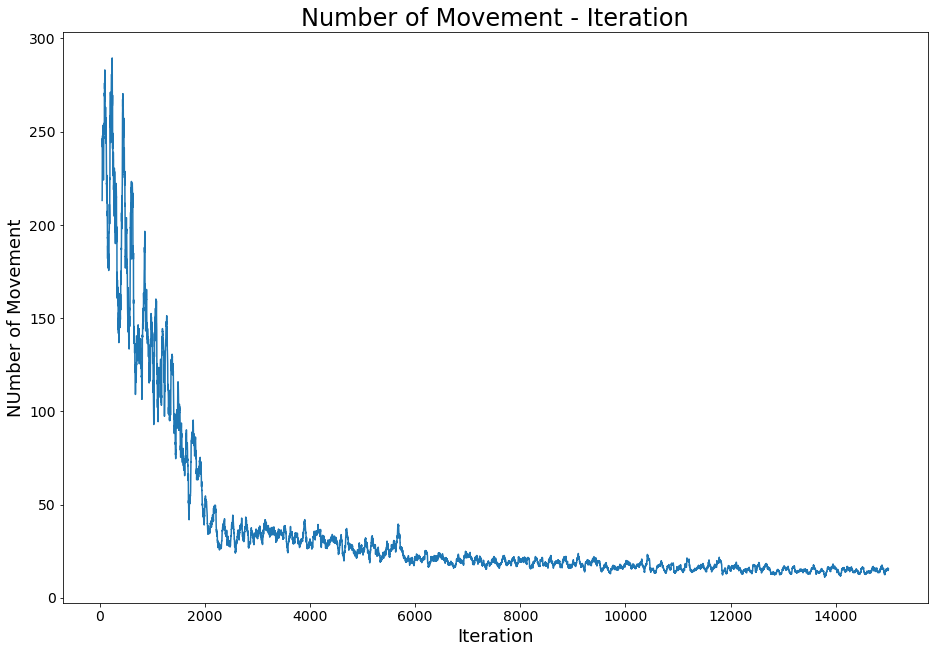

In [132]:
np.random.seed(10)
V,policy= WatkinsQ(LAMBDA=1 ,n_episodes=15000)

In [133]:
V

{(4, 15, 0, 0): 0,
 (4, 15, 0, 1): 0,
 (4, 15, 0, 2): 0,
 (4, 15, 0, 3): 0,
 (4, 15, 0, 4): 0,
 (4, 15, 1, 0): 0,
 (4, 15, 1, 1): 0,
 (4, 15, 1, 2): 0,
 (4, 15, 1, 3): 0,
 (4, 15, 1, 4): 0,
 (4, 15, 2, 0): 0,
 (4, 15, 2, 1): 0,
 (4, 15, 2, 2): 0,
 (4, 15, 2, 3): 0,
 (4, 15, 2, 4): 0,
 (4, 15, 3, 0): -1.0666598545417307,
 (4, 15, 3, 1): 0,
 (4, 15, 3, 2): 0,
 (4, 15, 3, 3): 0,
 (4, 15, 3, 4): 0,
 (4, 15, 4, 0): -1.8855326603551072,
 (4, 15, 4, 1): 0,
 (4, 15, 4, 2): 0,
 (4, 15, 4, 3): 0,
 (4, 15, 4, 4): 0,
 (4, 16, 0, 0): 0,
 (4, 16, 0, 1): 0,
 (4, 16, 0, 2): 0,
 (4, 16, 0, 3): 0,
 (4, 16, 0, 4): 0,
 (4, 16, 1, 0): 0,
 (4, 16, 1, 1): 0,
 (4, 16, 1, 2): 0,
 (4, 16, 1, 3): 0,
 (4, 16, 1, 4): 0,
 (4, 16, 2, 0): -0.9872430671221837,
 (4, 16, 2, 1): 0,
 (4, 16, 2, 2): 0,
 (4, 16, 2, 3): 0,
 (4, 16, 2, 4): 0,
 (4, 16, 3, 0): -1.8202921456860375,
 (4, 16, 3, 1): -0.9783828926481788,
 (4, 16, 3, 2): 0,
 (4, 16, 3, 3): 0,
 (4, 16, 3, 4): 0,
 (4, 16, 4, 0): -2.4799350322332714,
 (4, 16, 4, 1): -1

In [134]:
policy

{(4, 15, 0, 0): 'UD',
 (4, 15, 0, 1): 'UU',
 (4, 15, 0, 2): 'DU',
 (4, 15, 0, 3): 'UD',
 (4, 15, 0, 4): 'DU',
 (4, 15, 1, 0): 'ZU',
 (4, 15, 1, 1): 'UZ',
 (4, 15, 1, 2): 'UU',
 (4, 15, 1, 3): 'ZD',
 (4, 15, 1, 4): 'DD',
 (4, 15, 2, 0): 'UD',
 (4, 15, 2, 1): 'ZU',
 (4, 15, 2, 2): 'DZ',
 (4, 15, 2, 3): 'ZZ',
 (4, 15, 2, 4): 'DU',
 (4, 15, 3, 0): 'ZZ',
 (4, 15, 3, 1): 'UU',
 (4, 15, 3, 2): 'UZ',
 (4, 15, 3, 3): 'UD',
 (4, 15, 3, 4): 'ZD',
 (4, 15, 4, 0): 'DU',
 (4, 15, 4, 1): 'UZ',
 (4, 15, 4, 2): 'UD',
 (4, 15, 4, 3): 'DU',
 (4, 15, 4, 4): 'DU',
 (4, 16, 0, 0): 'UD',
 (4, 16, 0, 1): 'ZD',
 (4, 16, 0, 2): 'UZ',
 (4, 16, 0, 3): 'UD',
 (4, 16, 0, 4): 'ZZ',
 (4, 16, 1, 0): 'ZD',
 (4, 16, 1, 1): 'UU',
 (4, 16, 1, 2): 'ZU',
 (4, 16, 1, 3): 'ZZ',
 (4, 16, 1, 4): 'ZU',
 (4, 16, 2, 0): 'UZ',
 (4, 16, 2, 1): 'UU',
 (4, 16, 2, 2): 'UZ',
 (4, 16, 2, 3): 'DZ',
 (4, 16, 2, 4): 'UD',
 (4, 16, 3, 0): 'ZD',
 (4, 16, 3, 1): 'ZD',
 (4, 16, 3, 2): 'UU',
 (4, 16, 3, 3): 'UU',
 (4, 16, 3, 4): 'ZZ',
 (4, 16, 4